# Mask r-cnn
```{contents}
```
Para el caso practico he querido aprovecharlo para investigar el estado del arte de los distintos modelos empleados en CV, con el fin de elegir el mas adecuado para mi PFG, en el que un robot necesita identificar enfermedades en fresas.
Tambien como u
na guia para des-mitificar muchos de los aspectos del reconocimiento de imagen, en el notebook se explican mucha de la terminologia empleada aun asi es un trabajo incompleto y en desarrollo.
## Desarrollo 
Inicialmente experimente con el modelo YOLO v3 por ser el mas veloz, pero al obtener solo un bounding box con el objeto de interes no me era posible de una manera sencilla emplear point clouds emitidos por la camara 3D para determinar la distancia y medidas del objeto. (aunque posteriormente he encontrado implementaciones que permiten la generacion de mascaras)

por esta razon decidi emplear el modelo Mask R-CNN por ser el mejor explicado y por tener una mayor precision.
Este modelo emplea una red neuronal convolucional y un algoritmo que genera una serie de "anchors" sobre la imagen para detectar los objetos que se encuentren en ella, al final este modelo es mas preciso y capaz de identificar la partenencia de cada pixel a una clase.


## Mask R-CNN

que es mask R-CNN?

un algoritmo para realizar instance segmentation 
consta de 2 sub problemas.


1.   Object Detection: encontrar y clasificar el numero de objetos en una imagen.
2.   Semantic Segmentation: es entender la imagen  



Mask R-CNN = Faster R-CNN con FCN en ROIs

Mask R-CNN es un meta algoritmo que puede soportar multiples implementaciones y mejoras aplicadas a la arquitectura del backbone como 
ResNet o (FPN)Feature Pyramid Net como 

  


<img src='https://drive.google.com/uc?id=1Rn7ibUBFmEsa4I-OUhUF7-u8qsd4p-SE' alt='feature pyramid networks' width="400">


## Glossario
terminos empleados en el mundo de ML IA y CV 

*   ML: Machine Learning, 
*   IA: Inteligenci Artificial
*   CV: Computer vision
*   Bounding Boxes: cuadros delimitadores
*   FPN: Feature Pyramid Network 
*   ResNet:
*   ROIs: Regions Of Interest
*   CNN: Convolutional Neural Network
*   Regresor:
*   Non max-suppression (NMS):
tecnica empleada para seleccionar una sola entidad entre muchas identificasdas en la imagen por ejemplo bounding boxes, el criterio mas emplead es el IoU.
*   Soft-max:
*   Weights: son todos los parametros (entrenables y no entrenables) de un modelo, esto son todos los paremetros empleados en las capas de un modelos, en el caso de una capa convolucional serian filtros y biases.
*   Inferencia:
*   Feature Map:

## FPN: Feature Pyramid Network 
<img src='https://drive.google.com/uc?id=1Rn7ibUBFmEsa4I-OUhUF7-u8qsd4p-SE' alt='feature pyramid networks' width="600">

FPN: Feature Pyramid Network se aplica a las imagenes es un extractor de features (caracteristicas) que recibe una imagen en una escala con unas dimensiones arbitrarias y devuelve una feature map proporcional y en multiples niveles, siguiendo un comportamiento convolucional. Este proceso es independiente de la architectura del backbone convolucional.Las FPN se emplean para construir de manera generica Feature Pyramids dentro de redes neuronales convulutionales profundas para tareas como la deteccion de objetos.[Feature Pyramid Networks for Object Detection](https://arxiv.org/abs/1612.03144v2)

## Dataset
El dataset empleado se puede encontrar en kaggle https://www.kaggle.com/datasets/usmanafzaal/strawberry-disease-detection-dataset

Contiene imagenes de 7 tipos de enfermedades en la fresa, cada imagen viene con un archivo JSON que contiene las etiquetas y los puntos de los poligonos que encierran el area de interes.

## Formato de las anotaciones
Para el entrenamiento las imagenes deben ser anotadas/etiquetadas para ofrecer un **Ground Truth** una clase verdadera real con la que entrenar a la red neuronal.

Existen muchas herramientas que asisten con la ardua tarea de etiquetar las imagenes, en nuestro caso se ha empleado un programa Open-Source labelme https://github.com/wkentaro/labelme

El formato de salida es un archivo JSON que especifica las formas  'shapes' de las zonas de interes mediante puntos 'points' que forman polygonos asociados a una etiqueta 'label' en una imagen pueden existir multiples zonas de interes con distintas etiquetas.

Tambien se incluyen datos sobre la imagen como la ruta, las dimensiones y la imagen en base64

In [ ]:
![code snippet.png](data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAfsAAAJYCAYAAABl608PAAAABGdBTUEAALGPC/xhBQAAAAlwSFlzAAAOwQAADsEBuJFr7QAAOzNJREFUeF7t3b2O5MQb7/FzJXsHpBscMiSiDbgABNphA1Yi2wy0QivQUQerDZBIWGmj0YCEIPxLMxli40ETbtDXwBUg+fipF/upF1fbPd093U9/g48Yu+xy2T3rn6vcTP2fR48edQAAwC7CHgAA4wh7AACMI+wBADCOsAcAwDjCHgAA4wh7AACMI+wBADCOsAcAwDjCHgAA4wh7AACMI+wBADCOsAcAwDjCHgAA4wh7AACMI+wBADCOsAcAwDjCHgAA42aF/cXlXbder7v1zapaDgAAjtfmsH921d2tr7tVrQwAABy9eWF/e9Vd1MoAAMDRI+wBADBuc9ivrnlXDwDACWuE/aq75kt5AACcPHr2AAAYxzt7AACMI+wBADCOsAcAwLh5Yb++666eVcoAAMDR2xz2Pf5cLgAAp2tW2AMAgNNF2AMAYBxhDwCAcYQ9AADGEfYAABhH2AMAYBxhDwCAcYQ9AADGEfYAABhH2AMAYBxhDwCAcXsJ+89u/uve3b7vHj/6tXu5/q97c/lDdbtDce1Zf+g+q5Qt9ux996Y/p5erR93jy393Uu/nT7/pbn/6ovv+0Ufd2x+/625ffFzd7qF9/6Jv249Pus8ffdz98dN33d9PP6puBwA4LnsJexeCKuwlGGvbHcpOw16d03iete0WePJFEva1EPUPBN91fzxJ19eFh4Z++4EL6dq2pXgsRz14uPUq7Oe1BQDw0PYX9je/9j//0D2/ffiw3y0J+3+75zLl7+rD7sI+hLH0nouwd+VfdH/0Ab4k7LcJ47H3Xpa5sHfhv339AIDDO+g7e9fDdg8BcV32MBCGyN8F40OCbNcH7EqVq5D1PfcoBHFeXyWU0/3Gnr+sf3nZ3nfaqrve6XTA0ov+pnv7eEnAbhvGciwZYaiVAQBO1WG/oOfCVw2nJ8vSY9ZD7XrZPxSMoaseEqSOTWFc6YHnDx56SN4/BMSHhqWjE7sN+7Gnvzzs9TD+rP3CCMNb6d2H/XgvDwCn77Bh33O95hCcErDDl/ckkIdedjQncP079KRHnyvCPowU6O3Vg4e0UX+pMF8+GAnf4Z35PYbO3XcCZHSgUqa57fQx4qiC2gYAcHIOHvYueIf3+Spwh/Vq28Gc3rXfRh4Siu1OMuzL3vlgwZftvJmhHXr2Y933eMAAAByNw4e9C9o+VCVcdbi7sJ0K9Dlh7yWjBVER9j7A9cOFXr5f2O/6nX00EbyhN94abh+/RZ+t6/dL68seCh4/6f6e/Q7/oru67c97fd2tquUAgIfyAGEf3o/Xht0llIch/N4Q0I2wn9ynUpaUjyMB6XoLYZ+NClRGAuph3wv1ecuG8Fc3EvZ33dXU6xQAwIN4kLCHUatrevYAcIQIe+xAGM0g6AHgKBH2AAAYR9gDAGAcYQ8AgHGEPQAAxhH2AAAYR9gDAGAcYQ8AgHGEPQAAxhH2AAAYR9gDAGAcYQ8AgHF7CXs3XaybRe7X7uW6NmNcOuOcL9frKjPi7Zxqm5sdb4fHfHbV3eV/K762DgCAA9hL2LspbFXY51PTunI9l31C9jlE2PuHizHsP3SfVbdbys/rfj0x9/7F5d0epr8FAGDa/sLehXl9Hvr2/PCHDXvXtmfvuzc7DfvGnO4yDSxhDwA4oIO+s3fD+2HofpSHbD3s8331A0RZ77h/WrbkISJM27o4mAl7AMBxeZAv6N27Zy89cfeaQL8ykLJsJEFtV9Sx0bZhL/s13svLu/vbq+6iVgYAwB6cTNi7UE96735EoBb2Y91S19Ie/fZWNzO/gBe+rHd3eVEvBwBgh04j7N07dbVOv2N3P6uHgOoX//xDgJTn3x/YPXr2AIDjchphn31b3r+H98vy89wAl1GA6ePmDvzOXtbT2wcA7MERhX0cctdi6I89c/Hm8n2/7UTPXsTevXtIUOsXvb8/cNjH/w9/8fEAAGh7kLDfpeLBIR/yP7htv40v+9GzBwDs3omHff6FvN5O/0DONtqhXfujOm4dQ/gAgD05+Z59OYz/kL36oPancWvrAAA4gNMPewAA0ETYAwBgHGEPAIBxhD0AAMYR9gAAGEfYAwBgHGEPAIBxhD0AAMYR9gAAGEfYAwBg3F7C3k1B62aY8zPZzZpWVs9R/9DCn+CVqXNlWtxd/a39+DfwHWa3AwAcyF7C3gWkCvtZ880fU9irdo/nUttumdokOAAA7Nv+wt7NKe9npTvNsA8T6sgseoQ9AOCEHf6dvZuCdpylbhjiD2H/3A2b+zL9kOBeDaj9Ypk8WLy5/NU9VPiydNY7Pwwfy9KHibTOJbPlrbrrLYbiCXsAwEM4cNhLT38iVMN7cj8i0C+3etSybSiLYa7DP6kj/pwvqzqG8tkIewDA6Th4zz72posv7eXD+Nly2kMXviwJ97hfCPF8NMAZAt6/lz/k/PeEPQDgIRx+GD8Ywlv3tKfC3v2sQlmVbQr7zd8X8N8rkLbM+m7BPRD2AICH8GBh76hgTsI9X3bv+ccy32Ovh72UxVED/0Ch6myQbWf9L4IOw/gAgNNx4LCPQ+dRvbdeLo+9b/Hm8n1fjwp7Xafu5ffyofwh0LMvCi77xj1hDwA4HQ/bs9+BYhj/iBH2AICHQNgfEGEPAHgIhP0BubCX4f8tXgEAALCtkw97AADQRtgDAGAcYQ8AgHGEPQAAxhH2AAAYR9gDAGAcYQ8AgHGEPQAAxhH2AAAYR9gDAGAcYQ8AgHFHGfarG//34+8uL6rlAABgvuML+9V1t7696i5qZQAAYLHjDHtmhAMAYGcIewAAjDu6sJc533lXDwDA7hxP2D+76u74Uh4AADtHzx4AAON4Zw8AgHGEPQAAxhH2AAAYd5xhv77uVrUyAACw2PGFfY8/lwsAwO4cZdgDAIDdIewBADCOsAcAwDjCHgAA4wh7AACMI+wBADCOsAcAwDjCHgAA4wh7AACMI+wBADDOQNj/2r1c/9e9ufyhe7T60L1b/9s9fxbKnr3v3vRl78Tt++5xsW/dZzehvkpZkzt+ON7Nr2lZaMvL1aPu8eW//TYfus90+RY+f/pNd/vTF933jz7q3v74XXf74uPqdjvx+En3tztWpQzbefJF//l91/3xpFJ2DNxn7ts3/q5VtgNw9AyE/Q/d81sd9pUQlfWHCPvAhXke9uGhZAj7Be2Z5MJiDPu/n35UKa+sb/q4++Onb7q3j7P1Zxz237/oH6T66zja0XWYDPuJz6DBh7Fq449Pus8r21VJO6rbSztU2C+pE8BRMRP2EqK+93zMYR9GHRa2Z5K6SUsg5aH+/Ys+MJ70Ib3oJk3Y52rXdr+2DPthZGfi4W9KM+xDOya3AXAKzuOdfTVcfU97GHZXDwkS9i9Xujx9gJDyYb9KaNfDfgM3te+6u5aHllr5Yv2N2t2c5cavgkNCu1//VvVWY8+y7MGKEPAh7N+qHuTQIw11fq/KxqDxvcO4vugVu3rH8riftOWPp6osCZrw2mJOWXa85ByT/aa1wt6184k+x/R6DcdOlnUb01BvfgYNadiHevLlor78swn2+ToIwIM447BPSUDH3rwP8/Hdv+7p6+1qy3Hdg4d93xOLASVBMIRVDNd4Qy96bKo3N6zrtfYLZekx6gFVa0s5jB3DKbbDh6Pfzv+swzcJNmnXRFglx64sTykCWF0vXzaeqyy7OvNrUL0mE9d6cv20NOx9iCcPceqauG31Z06vHTDvjMPeD/+PPfteCOhiGF/2d2WVfdR+0VZhv1M6HHsSNEkwt0KoFfYT+xV1aHlPewyeNKBSQ2gWy9K+7FiVB4+yN1xph2pLS96WWWWt6zXYcdir8xofoOS8s7rythD2gHlnG/YukNU6HdDtsFff9p/w4GE/BJ4WbvgbQ2i3YZ/3InXA7yXsB7KdOu9a6M10MmGvr2vrvPO2EPaAeWcb9m6ofgjk8H6+GvbqC4BxvxmvBBaH/Q6H8WshKutcKG0MId8DLobWW/sVdYwkDMe2hACOy26/eqhNh71v31iWL6dkv2Q4e4tQy9syqyw5N9/GcrRhKtQnPoOG9DP31zm2y523+n3Il1ufX9uqu+5/Z9e3V91FtRzAsbAd9hLy+ZB7DGr9/+DL+/nL2HsPga72Sd/Jl0P58UHAhbxa78wN/Z2F/URQSO9Nbuj5jb12o3fbSjipgGrt1woLVxbr6oPtaV+3DprkWGlA6RBNl8NDQ6Tq873aetkYuqM5gToZ6DPKxuNIm+M1ytrvZKFf+wwaige8+Hm75ey8Kw88uq3pNWu56K5u+7BfX3erajmAY3EePXsAe3FxeUfPHjgBhD2A5Z5ddXcM4QMng7AHAMA4wh4AAOMIewAAjCPsAQAwjrAHAMA4wh4AAOMIewAAjCPsAQAwjrAHAMA4wh4AAOMIewAAjCPsAQAwzkDY+7no3TS0bkrbf7vnz2rbLRWmst0wd/0u+KlxP3SfxWMunQu/Kk4/6u1innwAwGkyEPY+IMewl9CsbbfUdmHvgntpWA/tVudS224RH/aEPADATNi/lFB79r57s7Ow387WYR8eKj67IewBALtl+p29BO+by199D30t0iF+CVa/XqiHBNfTDuuz4JZ9Xl7KQ0Uojz1/96AR1iljcIeRgqFswUPJ6nqLoXjCHgDgmQ97CVbX64/LIbxd0Ksgd2XZkH2tl+4fEOJDgxpVaOzjyANEbf0chD0A4B7sh70OWOl9u0CXkM6+yFd5BTAV9nqYPV+eDPuh53+o1wyEPQDAI+x12T7DfuD/74Hd/V8DUwh7AIB3VmGvg1l+zsvykN4m7PWX7YZ1FbKfHv5vYhgfAHAPZ/HOfpAEd/aFORXQxX4i7Lsx7LN6Y1m7LRsQ9gCAezivYfyzQtgDADzC3izCHgDgEfZm+bCX4f/lrwAAAJaYDnsAAEDYAwBgHmEPAIBxhD0AAMYR9gAAGEfYAwBgHGEPAIBxhD0AAMYR9gAAGEfYAwBg3HmHfZhNzrm96i5q2wAAcOIIe0IeAGAcYU/YAwCMI+wJewCAcYQ9YQ8AMI6wJ+wBAMYR9oQ9AMA4wp6wBwAYR9gT9gAA4wh7wh4AYBxhT9gDAIwj7PlzuQAA48477AEAOAOEPQAAxhH2AAAYR9gDAGAcYQ8AgHGEPQAAxhH2AAAYR9gDAGAcYQ8AgHGEPQAAxhH2AAAYR9gv9lX38z+/d/8Lfvvlk6Hs01/eDeu9d92rL/P9S1//qff5vfv5lS7/pHv1l1+vj+WlbRn3G/fx6u3wx51flp+fbk9yDn9+Fdbn7Qj++rb7VMpfvS7KxnNIz+1//7zuvg7HKst1O9NjJtfsy2+736r7AIBthP0iPkjGAPHLMaBcGA5BtyUJwBiGIdB+fpUfV6TH9tvWA6zWLr/udXWfapkE5dAuIccLASxtHuqPbY7bpZK2JOeakocHXYfsN5x/CO3aMcrt4jnI9RrPx7Vj4tgAYA1hv4gKuECHSxJkW6rXUQn7PChDLzl9IPAkOJP1LgTlPCoPCJNlPsSTc20Eda0dxQNJI+xd/cO19sfWD1X1+nP5A5EynGelDACMIewXqfWmfx/C2QfUOIQ8P/hDPU4tgMqw1w8FMXi/Vuti79fVmQSqPocsfJtlY3n73Gr7ebrNTnhAGeTBP5RX2viLOr+p0G4EetEWADCMsF9Kh2gfJK/60JjuxU71cBtcwOUBNR327l15CK2pAIsPAxKk8vNYTxrMrbL0fELoF73ysp2j6YcAL9SpzyVehxD6/iGkPHb9vH17q7366jUGALsI+3vK3y3nZfXga5Ewy0OxEqIhAPW69vC5hJsPQP+gkvnz/zXK+iCV4yXhnod3K+h922oPItoY2r4ufV1bZfW2EfQAEBH29+ACqOjdBm4EIA/tELZT+4hqGNWCNAvb6vG86Xbmgd0oy9uVHM+f11TQt9o28nX4gC7PtzWCkTzkhJGXWtC7/VpBv7ru1ut1d3d5US8HgBNF2C/kA0P1eKfKquHmA63WCx32S8p86I11ekOQhWDz69XxkvW9rJ2jLNA3lKXnN7YjX++NoTrZq3cPEOM+aUAvuC5Z8A/rI7dvVl+QPKA8u+ru+rBf36zGdQBgAGEPDC66q1t69gDsIeyB3sXlHUP4AMwi7AEAMI6wBwDAOMIeAADjCHsAAIwj7AEAMI6wBwDAOMIeAADjCHsAAIwj7AEAMI6wBwDAOMIeAADjCHsAAIwj7AEAMI6w38Iwf3syx3ptXvfKXPFxrvnJOeZT+fzs6Zzv47zuybzsYmqu+2KO/Pp89v64c8vadSbnMJx3fa7+eE3b1zKfm36cO78sV/tNXpMNZQBw4gj7hVxw9YHlwqgW9s0QlxB61/3856btJrx6rY7pA+3nVz4007D3x0lDLg9Er9Zmv+51WkejTNYlx5d2xjr1z0Obw3YZ3ZZauyL5DHQdyfFDaJfHkOuUtnm8lq0yADh9hP2WaoHQCighISWhtGm7KfX9yrDPt3PLEyEb2zSsGx4MsgeGVpkE+rBce/gYFccbpHW2rpE/n/jwkj5ASNnUsRONB6BmGQCcIMJ+Sy5wamHfB89Ah5XqlbeCrOTDzNdZC6AyXHWgys9yrCRkQ+/X1Zmcg6/LB2ce9q2ynqqz9lDhVfYL8mvSvJbCPWBIWaWNv6jzmwjt1mew7PMBgONH2G/JBUJzqNeHtA9Y+XkMna3DxAVcHl5TYf9Vsn6qR63PQ34et0mDuVWW9OxD6JfHKts5mn4IGMvHfV2b43UIoe8fMPwx9OdSvdbV6zijDABOFGG/JR2StXIRA9aHU+xpaq2Aq5Ewy/cpQzQeb+xh+23qPe74IOIDtWxj78//1yjLRg2EBGZlxKAe9OPoQ60sGo9RnssY6JXzzNtC0AM4Q4T9ljaGvevh1sN8DCe13gXNdCA61TCqBGn+zrkRYtPn0eptp2V5WKd1pr3yQuM6DZJtyvPVx8+vrX4QcWWt60DQAzCKsF/Ih0Lo1UY6aIb10wGWB5JTDfust13pLY/H84ZebajPUyEWhtmHsrwdg/lhX7ZlPF71eqnyqV59+1ouuC5D3dk+gb/erbJYLwCcLsIeAADjCHsAAIwj7AEAMI6wBwDAOMIeAADjCHsAAIwj7AEAMI6wBwDAOMIeAADjCHsAAIwj7AEAMI6wBwDAOMIeAADjzjrsVzfrbr327i4vqtsAAHDq6Nn3JPQJewCAVYR9j7AHAFhG2PcIewCAZYR9j7AHAFhG2PcIewCAZYR9j7AHAFhG2PfqYb/qruV/y7u96i6S9QAAnBbCvlcP+4vu6lb+H/zrbpWsBwDgtBD2valh/IvLO3r2AICTR9j3irB/dtXdMYQPADDirMNeQp4/lwsAsI6ePQAAxhH2AAAYR9gDAGAcYQ8AgHGEPQAAxhH2AAAYR9gDAGAcYQ8AgHGEPQAAxhH2AAAYR9gDAGDceYf96nr42/hMegMAsIqwJ+QBAMYR9oQ9AMA4wp6wBwAYR9gT9gAA4wh7wh4AYBxhT9gDAIwj7Al7AIBxhD1hDwAwjrAn7AEAxhH2hD0AwDjCnj+XCwAw7rzDHgCAM0DYAwBgHGEPAIBxhD0AAMYR9gAAGEfYAwBgHGEPAIBxhD0AAMYR9gAAGEfYAwBgHGEPAIBxhP1iX3U///N797/gt18+mSz73z+vu6+TfStevVbbj35+JeWfdK/+ysr++rb7dGrfP79K6v70l3f1smS/rI1fftv9NpS96159qcp69Trzdur9srKsjXm5P+/sOM5YZ6ssKW9dqyAeDwAsI+wX8cE0BrxfjoHx9Z9peEjopA8Dc8gDQwyvtP5yOx3Usu0YetKWJOwG6X5uuyGA9bF7LvizbSt1FucpwRrqTOv3y+O2/uGodo1cYBcPBpvL4vHcNtXzj7JzBQDDCPtF8oBNg84FzFDug2xpzzENslbY+7JhW9dz1cdO2zlJ9guhmIeoP594/Ead7tjpA4q/JukDyLCtbrM6npa3ZW5Z5LZphP2cOgDACsJ+kTx8faAnoeGCr1+3Va9R6tP7hUB39Xl58LuerJTpYAsB/iqW9Wq9Z6F72vnPcl7Duk11quF/3UZd53A+oa2+7Ft/DZ3x3OODxkBd41ZZss1k2OfXGQBsI+yXSt5pv+5e9aESw8yHUOj9htCv98rrNvY2XZ0xpEJwhu1dOE8eux5ueSD68P3K1atDfwj7qTp1u8L1GQM+PBA5/Ta/9NvW2iyknmpA+zrGOjeXtcJ+43UGAGMI+3uSwPIBmPf6F4aKC8kykFMqYLP36cnxi9CcaFsWhm5dH5zjdvPqHB4IYtlkaPtjxG2L/YpzGhXbbiirnZ8z6zoDgC2E/T2kgeLDT4eOhFAa9qGXWwmhcttScrwitHzdPqjVQ8Gw7Rii7liTQZj1tIfl6Trztk8GbVJfWFbbuf1q16AV0BNlU21oXufVdbder7u7y4t6OQCcKMJ+IRciEtiiCI0Q5lERNhNhPxlm/gFisj4XnmN50rtNyvKQHveJht58sp8K5ladeTuLB4awfip8K+XJdc6uzfyyIH5OrYcG8eyqu+vDfn2zqpcDwIki7IHBRXd1S88egD2EPdC7uLxjCB+AWYQ9AADGEfYAABhH2AMAYBxhDwCAcYQ9AADGEfYAABhH2AMAYBxhDwCAcYQ9AADGEfYAABhH2AMAYBxhDwCAcYT9FoZpVLMpW8vpVfV0qtn0t/n0sS1T08Qm09VmU7e2ynpJW/O56If90mlz07K8/ek0t/UpcxeU9erXOb+OwXAOaTuSaX+DWK8+FgBYRtgv5OZf74PFBUYt7Is57j3ZLw+yWhDlfDDVHgwk1MYQT9sjgagC3gX/WIc7h6ztw3ZFsIb9XDCrdshycrx6sKbbzS9rXeecbBuPnVzX2vz17pivu5/7BwLCHsC5IOy3VAsht24i7F3ZEJY+HDeHTRroTSrQ83b4Y8fjqQAvpKGtz1F+TsM8exCYOO9twz7SbaiV5w8yKd/LH6+ztFmuZ74eAGwj7LdUC6EYqoM8ACXcXNmyAH+l6209TIQy3dONPeRhXQjYV7I+1JmGuBoG18fKgtmfqz8PX/e37kHB16nObzjnQF+zVlmwKez1uRayB4FxW8IewHkh7Le0KYSqvWTdE+7LNoaNCysdZhMh5erLQ+0rt23cNwn75Nixtxt/jvuE0FfnKHXEYPbh7o/p16vetRyjem1CndUHlnpZ8zo3e/X+XIbzlDYNdRP2AM4LYb+lzWHf7km6/auhp1TCbKwzrMuCXvgHC308dfwiiFtl+kEgI20L2xZtaoRw67xrZdPX2bc7Oe4gC/qwbXxQSWz4DAHAAsJ+S9MhFLjAi0FZBpPrDetgc6Gdh5cKYrechq8P9Uqo5mGbPBBkAa63zR8cknPQKr1mdS2mAz0P4c1lk9c5b2vk2jx1jCi/rgBgG2G/kA/YrHcYgi0ty0PSh9lQngdYNex7IbzifmNAZfUFw/6hPi8LxaQsbWd+fvXjlQ8Afig/0OeWHCsL2EZZ6zq3evVJO6LiYYGwB3BeCHsAAIwj7AEAMI6wBwDAOMIeAADjCHsAAIwj7AEAMI6wBwDAOMIeAADjCHsAAIwj7AEAMI6wBwDAOMIeAADjCHsAAIwj7AEAMO6sw351s+7Wa+/u8qK6DQAAp46efU9Cn7AHAFhF2PcIewCAZYR9j7AHAFhG2PcIewCAZYR9j7AHAFhG2PcIewCAZYR9j7AHAFhG2PcIewCAZYR9j7AHAFhG2PcIewCAZWcd9hLy/LlcAIB19OwBADCOsAcAwDjCHgAA4wh7AACMI+wBADCOsAcAwDjCHgAA4wh7AACMI+wBADCOsAcAwDgTYc+fvQUAYJqpnj0T2gAAUCLsAQAwjrAHAMA4wh4AAOMIewAAjCPsAQAw7gzC/qK7upX/Le+6WyXrAQA4D2fRs5f16/Vdd/UsXQ8AwDk4j2H81TU9ewDA2TIe9qvu2v1lPYIeAHC+TIS9H6bnz+UCAFBjqmcPAABKhD0AAMYR9gAAGEfYAwBgHGEPAIBxhD0AAMYR9gAAGEfYAwBgHGEPAIBxhD0AAMYR9gAAGGcg7H/tXq7/695c/tA9Wn3o3q3/7Z6f4lS2z953b+J51ModOdfx/B5f/tuf74fus0c/dM9v/+ve3fyabX8gj590f//0XXcrfnzSfT63DABwEAbC3gfdGPYSfrXtjtwWYT+er7oGxT4H9OSL6UBvlQEA9spM2L9c9T+7wDzRsJ+lEva377vH/c+f3RD2AIA68+/sJQTf9T3mUQhLeTDog/IzNxTuy8awDMPicZ8QqLE+Hap6WX5+ufKvFfy+8x48dBvdQ0tSrusT819TXFzedev1XXc1c3s35N4H8tsXYdi998cTVfbTF933elu9LAh7ADhKpsPevdMeglqNAMhyPmw+jAqUQ+IujMP78E1hr8M437Yta5/jg35cl/XsN9gq7CXkX3zsl3VAE/YAcLLOLuzLcE/38YGarW8Ml+dhn4S77Df7S3OVsFfH9euWhf1irUAn7AHgZNkexg+992EIXAcvYV8i7AHAJNNhL+GbDosrk2GfD+Ony1LnEOASxupVQBr2lfBuqmzv2hjD3Zfv/Z19M+y/6d4+lrKPurc/yjv9XYT9RXd1u+7bed2tijIAwC6cV89e9+4nw15ID7qyj9B19r1u+YJf8iCg9huDvyWGeCqGvv9/6eM62faBwr73ffLFvY+7P2KZBHlYP4jB3ioLVjcS9gvaCQBYxHzPPgncpKe8e8XxMM/qmp49AOyR4bD3PeYkfN2w+1Rv/v4I+6VW3fWaIXwA2LczG8bf45fbelNhnw/vazwcAAD2zXbYAwAAwh4AAOsIewAAjCPsAQAwjrAHAMA4wh4AAOMIewAAjCPsAQAwjrAHAMA4wh4AAOMMhL2foc792Vn3t+/n/UlcN5vc7LnmbXF/vtfNk6+uXWW7+WQGvO+6v59+FGa5i1Ph3oObca8+S96hff70m74dMsNfmNr3xcfV7QDgWBkIezXhzYKJbo4r7P05zJ/7/n7cuauwv/9xfQiOYZ/Nc38fk/PgH9BwTuo8a9sBwJEyE/YusJpz1KfOPuzdue/quD4E/3jS/5zPiX9fxxL2oQ0ypz9hD+DUmH9nn844Nw7x+8B778LOl6mHhHy2PNcLHut7ufI94mK/UF7bb4prx1BX5Ns59sDj9moUw/XK+2O70Yywn354yc5hSaBfXN516/Vdd7WDGQJlCPzvpx/74W83LJ8O8Ut4+vWi8pCQh717mEjrcMPswzZhqH2oU9eblQ37yGuIL7q3brjelxHoACyxHfYSeBOBG0M2hqCE9NS7ax/w48/6oUHvJ3XqOvLlaVM9bAl09R2EZOQiPHAM56e3DQ8CST3pQ0nLrsNewtP1+uNyeOftgl69/05DO6j07NPetRpVCGVjnRLi8cGgHIIft/XfORiOs+vRCQB4YMZ79iEQdWAGLuxVTzhdjvuNYmgXDwXSs1ZD4nofR/e2J00Pp+sHhvThQYe7NzyU6N7+oLwGh6DD3ZEgdaEq4Zt9ka8WsrVh/KGO7OdeGfbxQcD33ut164eCuG3WNgA4YeaH8b0xiGOgtsLe9d5VmQ74dthvG6jTYT/25vP6N4T9rIeM/dtL2KvevNSfDLnL9mEoPh2OJ+wBnK8zCXsv7yXXw94H7xDo4d13PezTkHYPCTPe09cUDxFZ2cubPMCzsNdD/KHN1YeHGXY+jK/CXg/Bp73wctmphn1Y/+KLLMArDxBJWTn875fvGfar6/56rbu7y4t6OQA8MNthnw9nqyBu9ezT/T50z9VDggt0VWca0D78dfnswA0B7ffLRghCe9K68lcN9X0GCx5C9vHOfpCEuQ/coUyHetZDL8pdIPfrag8H2X5p716VDfveM+yfXXV3fdivb1b1cgB4YGfVs9+FVg98b1xw51+wK4fxj1ExjL8zPrjjF/O8cXh/WOfCPxu+37mL7uqWnj2A40XYL3T4sM9eKwzOO+xdvcXwfvkAUN9ud/woCEEP4LgR9gttE/b50L/WqmvYL3lXH51p2A/D9BO99WIYf9+9egA4foQ9AADGEfYAABhH2AMAYBxhDwCAcYQ9AADGEfYAABhH2AMAYBxhDwCAcYQ9AADGEfYAABhnIOz97G/uz866CWMqf0K2NqOcXrfltLSLqGln3Qx7xcQ224t/n13PulZbBwA4TwbCXk0UU50dLp1zviD7HCLsw0PJEPa7OqabXvW6W9XKwmxs13On2QUAmGQm7F2Yu97zwqlgDxr2oR27PKaE/e1Vd1Er661uCHsAOHeG39n7nnScXW6QzyBXC95k2L+XlPuHi6TO4QEjL1swVL+6dsPui4OZsAcAbHAGX9C7f89eppqNrwHctLPDA0NWt9RVnY52hm3DXvZrvJeXd/fMtQ4A542wr4Z9OSoQ550vw159H2AYEdjdl++mrbrrmV/A81/Wu+uupq4BAMA0wr4S9mmg++UY9m77ykNAKj4sNI67K/TsAQAbEPZF2Ktv98ty6K37ZSmbH+B6+H8j3tkDAPbkfMM+66E7MfSTsg/d88t/J3v2Ipb5/39elS15f0/YAwD25AzCfpfU/+YX17nwP8Q7+gmEPQBgA8J+kewLeb2d/oGcbUjYT375jj+qAwAg7JcrhvEfsFcf8OdyAQAthD0AAMYR9gAAGEfYAwBgHGEPAIBxhD0AAMYR9gAAGEfYAwBgHGEPAIBxhD0AAMYR9gAAGEfYAwBg3FGFvczQJn/P/e7yoloOAACWO8Ke/aq7npzFDQAALHWEYS/TshL2AADsCmEPAIBxR/kFPXl3f72qlwEAgGWOMuyF/7LedbeqlAEAgPno2QMAYBzv7AEAMI6wBwDAOMIeAADjjjDs+aM6AADs0lGFPX8uFwCA3TvCnj0AANglwh4AAOMIewAAjCPsAQAwjrAHAMA4wh4AAOMIewAAjCPsAQAwjrAHAMA4wh4AAOP2E/ara/dnb53bq+6itg0AADiI/fbsJfQJewAAHhRhDwCAcYQ9AADGEfYAABhH2AMAYBxhDwCAcQ8S9heXd+5/y7tepesBAMDuPUzPXtb3YX93eZGuBwAAO/dAw/ir7pqePQAAB3HwsF/d+L+sR9ADAHAY+wn7MEzPn8sFAODh7bdnDwAAHhxhDwCAcYQ9AADGEfYAABhH2AMAYBxhDwCAcYQ9AADGEfYAABhH2AMAYBxhDwCAcXsJ+89u/uve3b7vHj/6tXu5/q97c/lDus3qQ/euX//S2N/Hl/MuzjV69r57E8758eW//fl/6D6rbbfA50+/6W5/+qL7/tFH3dsfv+tuX3xc3W4nHj/p/nbHqpSdie9f9Nf4p2AX1/rJF66uP55UyswLv7M/Puk+r5bPd9B/B8CJ2kvYuzBTYV+E+hGEvQ/c/qFkMD983b43vxbrm2GvrsV4fWrbLeDCYrzJ/f30o/p2i3zc/fHTN93bx9n6cw97udY7CKbEZNhPfAb70jg3H6T1UG6Vbba7sN/PvwPAlv2FvQvDH7rnt8fZg88DexyNKLfNbR/2/3bPn/U/y8POrsI+3Cyl10nY748LtoP1GI8j7N1IRn/O7tyz8lbZwe3l3wFgy4Hf2fvw9z3pEHyhTILy5aUf6pYgdeEbesKxXPfE9QNEXqbrdsE8rB9770Vgu9GGUB6G3If9YjDn64MY8D7s37sefLLfHGGmwF1N/ZsMOeveo4R2f2N8q8pjWb6PFwI+hP3b2Jvr5XV+r8rGG64EV6W+yNU7lsf9pC1/PFVlSaCEXuGcsux4yTkm+9UNvdfEGMSunU/0OabXazh2sqzbmIZ68zNoaX4Geb2xvvyzCbKHmlagLw374noOx5K29O1yvfRKO7Lfk6IcQNMDfUFP9XLDOh/YfdiGQJUA9eFZ6SnLNiFIXWgPoZqNJEiA54Eelqs9e72tImX64aLVsx8fNBaOauw47BMhCNwNOd40442y6NVN9Cpb+4WyIVzccj2g5GafbqceGhQfTrEdPhz9duVQrdtWt2siBJJjV5ZbXEhV6vXtHM9Vll2d+TWoXpOJaz25vqHxGSTXp+fORX/mxe9Aqth+ZtlGyWcVHjyGuvQ18GXD78mG9gIoHVXYu2B3Ye972Drs0x56eDCI67Ow1z3tdJ+efkjQ65Pw9u/Xdbl+6GiFvd4uXz4kdxOWm+cgBM3GEJoImtZ+RR1a3tPuhRv8VICKITSLZWlfdqzKg0fZG660Q7Vlk6m25u0ctK7XYOJaT65vmPwM5LyzuvJtjybs03bKtfUBL2VZ2FfPFcCU0wh7t05tr7bxP6tgznrrUz3rqcAWsl9ez0mFvbuZqxunvrnnN/oiJCaCprVfUccoDwMdmlMBKrYO+4EPiHR0oHJeM021lbCfLttodtj7n8eHtO0/R+BcnUbY6/fpYX1clp+bga72K8qqYZ+ODsSHiSS0J75gl4d7vty0y2H8rOfjb5RheWMI+R7w0Iua2k4vF3WM3LGTG7padvvVb9x5iI7Lvn1jWb6ckv2SwNgymLYL+3huvo1lb3Qq1Cc+g5bZn0G53NpXbBf24bNuXe9W2Os2yc/bPlD0Li7v9veKDDgRBw77cng8vuMegrEW9skX+2SdfAkuhHjesxdZr1yXxfBt9ez9w0Xc50P3vN82De28Pb7saMJ+CBfv76dP+hupunHqG3vtRu8eFuL+M/ar1RG5slhXfzN/qm/wveRYY3DmIZouhyCJVH0ufCbK8usi5gbq4rAPZeNxpM3xGmXtd7LQr30GLa3PID/vSnDqtsbzLK7lzDJvm7DX9aXXI2lfpbwp/Nu6u7yolwNn4IF69rtTBKoL/3TUAMDxSR+gJOwnArzyIOPCP3m4aFl11/TsceZOPOyzIXeRDfkDOEZ+tCEdrZkIezfKocM+33fa6mbNED7QO/mefTmMT68eS9SG1KMFQ8X7lrwOyc0Y5j8K2euEYth/+noXw/ize/UAxOmHPQAAaCLsAQAwjrAHAMA4wh4AAOMIewAAjCPsAQAwjrAHAMA4wh4AAOMIewAAjCPsAQAwjrAHAMC4vYS9m1bWzffup7QtpnkNU8hOzUNvUvgb/nLOrXn2l/DTjMrfRQ9/c5y/Fw6chKkpk09Gc0plrT3nQYubD8FNkeznr5gz8RGm7SXsXZipsC9C/cHDPp2P3pma276iORf+pPFajNentt0Cw2xg82cBq85DPvxjzCYqEcl85Hm57FfZR7TmMRfFTGZC/6NOJ6hZ9A89mQu+V0y40q8r2pceL5/nPp+IxZdvc73GOnep+FxVO1plIj03/Zls+xlMnXfl2stn5ZY3XctpxSQ5s0JoC83f2f/r2p/83jQCUYd9+W9y3Kc1AdC2ZfmkSsPn6s5P/Y6G7Wqfu7Q5WZ/8m9O/53J9tvu9d9fF/Q74a5z/m8Qy+wt7F4Y+VI+vB5+3K4T/zADfPuzDjHzysLOrsA83RPnHvSgQo+SG5G+49X9U4UadBGedvpG1uBuS2m7cz7djPJ9Wu1L+xtm4ufTX7O+nH/f16W3y+vUNKoRQNXg2X6+tPpMtpNc8vX4by9S5uc/ELafbtc81Nf276K/r37qe4Xd4fv25rX/3t7DpdzZp/5KwV3Xq80nPLQ297crS7WKgu2X5t/Hii+6PsN/nT/ufX2ShPtSn/v24OvLleN7Ztgs0ry0WO/A7e92jTqeilaH/l5dhuto+SN2rgNATjuW6J64fIPIyXbcL5mF9HDqvPIS4YfZQnk+bG4O5mE7XG15TTO03x+p6h/Nuyz+O/h/YE/8P2T1tV8Mqvyk0/lGpB4uiLFH5xx1uKEVPorgJxf3k5/QmKf/w9U1H2j32JGKdm28K3/c3LzlGUl9+brIc62zcsFvHczeq5vXy+w7nELZ156Vu/Okx/PUa9lH71QKjFSZ+WV//KH4Ojc8gv7mHMt8W3179WY1C3fJ7GdszK+xDW8Ln4mTnUz+eqF9nV5b9Xo49atkntLPYT1+zeK3iPln7s98dd42GY/Uan0+sJz239NpuUzZ+Tr5+EY8v/3UPwi/C59H/93u3LtYTyOeg2lssu+PF66KvkW+XnHv9c8Y+PdAX9FQvN6zzgd2HbQhMCVBZV7zvF7JNCNJ0SDwLcelB6x74sFwJ+0qbImmH3nZuzz7fr2nnYa9vUH65+AdWBFnYb8YNaUqxXbihTv7jDjf7t5Wb07iPv8HGet0NQx1jvLGlN5ZSXx6vibQr/Kzb7H7u18tNzq0bwiivS5TXq3aTdnUm5WE/fZ2i/DMpPqNI6siCZKjPX6/YlskyV3d+veK13/wZTH5e4TPX12OsQ44n24fjDtfX1xGvU7pvOPbwOcR6fHkMkFG8LqHOyeuszj25zmG/4XjZ+c36ne2pOuPvVfw90p+J/v1wVHuT65y1eZsyd63y6xHO58e+HbKP9OjlQcf18KUs2V7OU103kVy7nuzTn4e/FuNnVRw7bJfK6sbOHFXYu2B3Ye972Drs0x56eDCI67Owj/vI/uk+PbftprCXn9P99EPHdNi39zucyo2nIrkhONP7VW8ShfQmLNKgqfHHLN6FuhtIvAH0N59wI6odYziP7IaXS9sy3rTien2OcZ37r7pJN7mbl6+zeW3zm2NG9o2fgRw/rSduU7nO6qapP8PJsur1ytsZ99OfQSiL10X/nAghPRxDfXYxROS/tX3VtZz6zON5lNc6aFzn+PkO65Jtp/8deLXf2co+Q51lmT5+3hb9e+h+Hj6D8hosLdN1D8JnEMPeX+9wbvFzyrbNP6/kd+xF/yCU9Oz9+upnhIM5jbB369T2ahv/swpYFcKyf71n3R7Gdw8JWT1zwn7Tfoez6WbVczfT/EY4vZ/7x1y9oY9qN5LiploxZxup27erfuMfb1JT5x1v0Cm3n7sW6c1oqLN6naaMbSvPSV3bRgg5ww1W9knPVUjd+Y1TH8/9rK7RdFntepXXNxo/AzGeT6092nh8Xbfs31+DifBIty3bpNsyfv5jubO3sK/sX9tH6nTnVpbp/Yu61DXR5yY/69/FbcrcsbLrHY8v2xXnPPwu+uXqNgX5vGJb4mcn/832df+2xn+LXv13D/d3GmHvvr0fwj2sj8vy89RQuR8NGPcb5WHve+Q+mNPRgfgwkYR29Qt2M/Zr2cMw/vQ/Sl9e3iBb+/l/rNWbqnA3y8o/1Kn1SnnjrJQPN6i07a5Mtcsvjze9Qe3GP9yMszBJ2uyP12pflLTT1aGvpb62U9c/kvK+rVJHftzaul56DdPPqlXmgkDd/N3yVP1ZSPgg+KKvr3K9lbHO9DpLnX/3DzNFvaFsXF/7fMZjSv31a9m4zi5oYh3+mozL+rOqS6+pl187vZyUxZALy3ld+X5D+7Pfqa3Ksu38sr+2sk9xzjrsZdvKZ5XKr7n67NSxyv2Wuuiubtf9PfO6W1XLkTtw2JfD3PHLdM2wD0Ea93lz+b6vJ4R4CNWkzqx3rctq9YnkgcE9XMSyD93z/qEhDe28PaFs434Nhwz75EanbbrJxZtiNP7D1TeoQry5BfnNt3bjdOviPnm94YblyvqbT/ruNNs37F87RjwffRP0++Q3JH9ddJ3+GmXr8xthUqfQ9WbXMtvXn0Pejvz6C/85FuenPuNWWesckutYXDsR2pOUVdo4lEtZ5Rq4Y7auZV5nel3c715Srn+3s31VvXq/P57KZ5Vek+l/B5Vr6sw8B1mvQjS5zkLVm4R23DbUu21Z/u8xnqfsU5yzbDtR5yg977SO7DMPx67Xs8zqRsL+rrtSnUZMe6Ce/e6MDwRhnQv/dNQAtk3fhDBXPbw28QHWCsXdyAJjH9yDmX5IsG7hNT3G6+M6SPTs5zrxsM+GzkU25A/7CPtdSHtnc65n0lvcK8J+L5Ie/imd+6q7XjOEv9TJ9+zLYXx69eeGsD+wISQOFRCEPXBfpx/2AACgibAHAMA4wh4AAOMIewAAjCPsAQAwjrAHAMA4wh4AAOMIewAAjCPsAQAwjrAHAMC4vYS9m2nOTQGrp45V24TZ4aampj1+Yda7YprbacWEPTON0/SGY1bm0QcAoGUvYe8CSoV9EeoPHvY+OJPjq6l1021rdh32lfZEw8Q+fpttHhimfP3n793//nnXvfpSr/+q+/kfWf979/Mrvf5R9+kv79x673X3tSoDAByv/YW964E2QuxB3Tfsl7tX2IeHim1HB2pccP/5ug92FfZfftv95pZ94Cdh/+p1GvCy/Ne33adxGQBwtA78zt6HWm12Ogmyl5dhBrv+QUGWde8/Lkc6GPMyXbcfBo/rY5hvDvukTt2DD6MSTjGkrs8v8nVKfW/685ORDrc+1Jm2L1owc5+b03ndXdceFKa4UJfgllDPe/aiDHt5OPjtl0+ybejdA8ApeKAv6Mnwfhn2LhjDlLXSg/UBWenJyjY6LIcwzkJcglkH8rBcC+Vw/FCnPm6+HNflYe/OYViXnqM/v7icP2xUHj7mWhz2n3Sv/opBPj/s8568H9Kv7QsAODZHFfYuUFUPW4d92QMegzkP+7iPD9iM27YSrsNxJx4EsmCfF/bjMfS5lMv3CPuF0h76grDv+Xf83m+/fEvPHgBOxGmEvVuntlfb+J/roSz71wN0U9inbauphX0yxN+bDveHCnsf4uOX7JQ/vyq2y8M+Ia8CeGcPACfhNMLehWgI97BevwufCkk/GjDuN2qFfah/GC2oK8O+/ZAwnMvM5dm2eWc/WNazb5dfdFe3674t190q2RYA8NAOHPZ+aFv3fuN77CHsamEfwnnsMcsX3UKI5z17kfXudZmubyrs8+OJuK1/gEjLhuNlPXsRA3xjuCfnsXlkYbDTsPchnvb6Y7kuq7+rX91I2N91V3PbDgA4iAfq2e9OPTQXhOXOVB4gshEJ89yDBz17ADg2Jx72PmCTsH+wgE2/kCfcKMCG1wE2rLrrNUP4AHCsTr5nXw7jP0SvPiiG8c+oVw8AOFqnH/YAAKCJsAcAwDjCHgAA4wh7AACMI+wBADCOsAcAwDjCHgAA4wh7AACMI+wBADCOsAcAwDjCHgAA4/YS9m5aWTcBjJ8cJpmoRoS/IZ/MEHd0wjS3GyayKWbdm9Dabpx3PxwzmScfAID72UvYj7O9lTPBOQ8d9snc9SMJ5LFN24W9O/dKWDcfCoaZ+iqz+N3Tp7+8c3PQ//xKrx/npk/Xj9t7r7uvVRkA4DTtL+xd4PnwOroe/Kywn2dnYR8eKprbLfXqdfe/v153P/+lQv3Lb7vf/nnXvfrSB34S9rK9Dni3/7fdp3EZAHCSDvzOPvSW3fSv6VS0Lmgvw3S1fVjKsu79x+VIh3Jepuv2Q+RxfQx4GXGohX3YT09VOxHcY50hnIupdlVZ2OdNf34y0uHKNowYJFbX3Xq97q4XPYhImEuof9K90mGflKfrpVf/2y+fZNvQuweAU/dAX9CTsC3D3oVxCE0JSR+QlV6ubBPCcnxlIGXZSIKEtg7rYXk8fjoKkbap1kt37VTr8ja2evbjQ8jCEY8twv7rP38PwT0/7POevB/SlwcGtQ0A4OQcVdiPPWTf69ZBmvbQw4NBXJ+FfdzHB2zGbTsG+2eXH7qXt1LXnLBvtDsst8Jeb5cv75SE9p9fheUFYd+Th4T4zv63X76lZw8ABpxG2Lt1anu1jf9ZhXnW6673nmOw9+3ot5eAfrmSdaHO4DTD3of7+CU7JXn/Xg/7hLzf5509AJy80wj74dvq47ZxWX6eGg53wav209x+N32vXvaVY8rP2bZlcKcjB77+LLTVl+3G/dS5TCw3bfXOPlrWs59fDgA4FQcOewl51Qt3fOgP4VcL+xCycR//RbcQzHnPXmS9e10WA9avj+Ee6tffA1D7OLFOfbx+nWybhnbe1vF4ert8uWmnYe9DPO31x/fyuox39QBgxQP17HenCE0XxumoAQAA5+zEwz4dVneyIX8AAM7dyffsy2F8evUAAGinH/YAAKCJsAcAwDjCHgAA4wh7AACMI+wBADCOsAcAwDjCHgAA4wh7AACMI+wBADCOsAcAwLhm2F9c3rnZ1tY3q2o5AAA4fjN69hfd1e2206sCAICHNmsYf3VD2AMAcKoIewAAjJsV9vLu/u7yoloGAACO26ywF/7LenfdFXPFAwBwUujZAwBgHO/sAQAwjrAHAMA4wh4AAONmhD1/VAcAgFPWDHv+XC4AAKdv1jA+AAA4XYQ9AADGEfYAABhH2AMAYBxhDwCAcYQ9AADGEfYAABhH2AMAYBxhDwCAcYQ9AACmPer+P7arl/nSG2JsAAAAAElFTkSuQmCC) | ![anthracnose_fruit_rot11.jpg](data:image/jpeg;base64,/9j/4AAQSkZJRgABAAEASABIAAD//gAfTEVBRCBUZWNobm9sb2dpZXMgSW5jLiBWMS4wMQD/2wBDAAICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgL/xAGiAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgsBAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKCxAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6EQACAQIEBAMEBwUEBAABAncAAQIDEQQFITEGEkFRB2FxEyIygQgUQpGhscEJIzNS8BVictEKFiQ04SXxFxgZGiYnKCkqNTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqCg4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2dri4+Tl5ufo6ery8/T19vf4+fr/wAARCAGjAaMDAREAAhEAAxEA/9oADAMBAAIRAxEAPwD9DNVZNCs44bURE3QiVlg4SJkJwuO3J615DjRjeNPZO6S05bbaf8A9CtWg1ywXnypbPvy9PU3Io5fsNvdypuuEkVWP97AUhM+wb8M10UJWp6e7ytq+1kvP5v7zng2ld+602r7W5dd/K+xXngSXUA4lxtRfl6YcD5zg+np2zSjDkndLlSW21r9LGmy5Y6R7bfgSw3ckEbzqPMVTLErZxiQAFF3dsFs4/wBqtdvL8Bbf1YjaPzbWNWV/NSEtKY+GRgdynb/sE5J/Gjby/QPwK09xNbzRfaFeRIn8lS/BZTD5vB7Dr+OahK07pctl8W1ra79O5Uad9V7ttOba1td7q1r3+Z4l8cruX/hH7WKzk8u3hntL6S26b0gcTsmP9oIRn3zXLVaVS72Sk/mldP7yuT2d3a/KnpttrffyvsVNQt4fGur6NrmnX93Bpz+GtEsmt7WfyxbNaOJGhcf3JJGYOf7px2r5l4WeIxbbTik9JPRWi+dLv1vbzv1POoYdyxDna1np0tbW1/8At6/zPQXup7KO12/KkDoNvqIyHx+OOvvmvp6NLlUY2+FKyWmy7fjf5nrW5Vy2sl02/vLTTbe56m8dvcWkV9Yx+QGiRpu21pFHftlyTXatFa+3Ta3W34/iZ1N0r7dO22hetLJBapuXMw3NKnTKqPMHHGf734Zocbrlt2drdnfb8TFrS34W/Qj1S7h06wizDKsdsyzxSR8BHL52k8HPz5/GorNQp9mlZPtb3reXe3zNaelrbr3b7bLmtfp6f5nGW+sm6vLm1uJIrby5pJCw/wBZLAwEjKR/eJ5Y/U1xe2ToNJWV22r3vrzfi9TenCzUUrKV249HvK9uuvvX+ZcGtTS2LzWVldSeXb72En3Mo5ZvKPZjgEVtCX7n2luVrZ+utvInEyV4JXvCPL6a336dxtpqc2qS2rz2DWUMsSXFuJuLh2ABnZx3QyksPwNbYaqu3fS1r396/L111v8AM51FXUP5nr6/Ft6q9/mcP4zgW9S6aDHlQS/Nj74fPz7PYkdKeHfLiOfZRff4U+l+muprWhanfbTRronrb79TQ8M6cba1gjWA5uIt4VurHaG3EdzxvPqea68U1J2/mu7bX5nzX8773MIq0VFKya5mtFdvV6PR3evnud4s9tFBbCeAFkcpNMONqsMqPb5gOOM1zc3s0ktF2/ra5W2l/O3a+vyv5FdftUs0iQL8kiN5yZ6leFlx/tD5vxp8ztbp8kH4fhY0YtLju9KMsj+Y1oZGMf8Azy2Kcn/Z656dqX4C28i7FaWbjyS4uY7qBHCN90TFQSp9QCTVLTbS36h+BWtVeIy2cP2eKKJpox28pWRt/wDu5AH1xUOPvRsrbq+1r2dvLYErdLfhv0+YPaQWsDmwvNhgSMny+fN88AylR3Dc/WrqRtOLtbr/AC77+t9B7f3b/K9/8/xIlhXSpppwgljcC4LocRxqQGG0fws5Dbx32j0o/qwjAu447fUZGjmzBOY7vD8bTOQsnljv14rnlU5JOO2vpv8ALrb5htp8H4X/AOH/ABIrzWL1ruNIrdVtYJBHKDwwjYDLJ6E45/Clb2nly6dvi+7sFl81t5X39Py7mlZyI7qGt28su5jDcM2774PruXinCHLJNO2uiX/D9fULW9fu/q5qeTE0lpcXSyLHaIFlMfozHCn0wAPzro28u3QB4uY7QP5QaNbgyqob725wVQn+9kFf5Uf12D8P0Oev4ryVWVZlDoQ5z95Yyf4B2JwaznHSOlrPfblvo9el+pcOunTTyLtncyRwMQXZ4odiKeHkMhKSN7nBKj6CrjHlWmy+W+i/yMp+7K+13Hy30NNBC3lW8kMX2dhs/ecPlxkkjt81Pb+rFbeX4Eix2u5oiiK0WUCDhDu/dKvuGG0H1yRR+H6AZ17K1rbJGZoi1pdI0Kx8GDeccj+EY+Wk0u234X06Bby28tr6fLcsSRWd7A0VwfIe4uFYyxcOSMKGc9xgAf7vFQ46aINF6bdtFpbz7FtNTutNWW1hTzI4reR0T+9Go2M+e3yk8+9YumtNbWeit/wQ5bWS2Wy7W0v/AHbbeexz6atM1jbx2yxWlpdM/wBplb71xH5rsye+xsxAf7IrqhQtG9rPv36X6egbenzXl/S6bF6znL2DpFBtgglcxL0zEMh5Nvb5iBn396mtQUYXtblenlv93qXTWtktlddLa2/Uxk1e2hku7mOLbC9o8EregV9sx/BAorChFx538Oj126WtfytY2/Jaelv6tb5GhbBNUENlYszsLR7h3XjyEUDy5GHZQSoPuwq4R9pT5duXW23L0vbpa9rglbRKyWttkraXt0ttch0Czu0h1Gz8u3u54PMm3dDL9nfJHuUzt+op0oezjyrdPfbbrf8Arcxn8Xyt26m/MIru3tVk3R+aW2wIMeROmVUsOyqCwJ9wO9aON1a22va1uvlvv5mbWm3w6+nn5CWwnYLYT3Csyyl7QpwBt4IyOcjoR610UoW1vyrvtqtEr36JtfMm9tfhtpfbbTfyvYqSCGEGzuA4EfmfaFTgg5AjOOwwW/Sqt/275bW+RXw2VrW9Va2m3S19zNtY4ktbnG4RJcomX4byD9wfhJjArOUbvTTp/SuLy+XoX7uwvbIQX8Y+0RW8bBkfiTy1wyfKDjA38n3pQjyPZqy+63W1/Mia0slovltb7Pz3LlxDcQaOdYH7z7NEtyLPp+7DHcufbOazqaabWTVtreV/0Kp/10/E5+JtM1maHVINPlsZERHj87hoJ1PlSjHbI71jTha1ly215bbW/u/Pcdre6lypaqO1rdbfM62azltlhiQeVFEonabp5pHzKM/7xJx71u9NOytb+v61BPt9nS3byMvUCltdRzwuoS78yN7VxiNXhG9ZoB/tkYqoaS9E/LcNvI0NOjWWC6W7RoopELIW7MoEgKnsvz8D1zWr2dtPwFt5C2cOkrE1oBMZ/tC3Clv3iiBCGY+Z/DwDgVycnLolZdldLv5L8At0t522t12/EzZr1fOm8k/uRLIIuSP3YdgnH+6BRyW2W22vcTkk7c1rdOa1vl0OM03w6+mXVhJqV9eatNETMYLhlFtFIQQAIx8obnIGM8HFeZhcEqVrzio6PdddFa2jvd2t52NaWEhQsoyTj0s1a/SzWl97JavU6drK8ylzZyxbf3kYgTAILklWVF5KgZ+cDBwcfdNdzShVUYNbKyg7736LW3nte/maVN1yx5XbRJNad0lrbezWm/mGmRtJ5X3BdQLK/l8eW7BjgMOmCDkccnpXRyrk5o2tfTl1Vl2a93fbuQoO1lHTfpb71p+pW0vbamaGVjO0kkspz8zoQQ2FHLDaSQuOMY96jbbpppo9Oy39PO4uVr7L08nzL0S963ZrTt1Fh/0Q+bOrtFI1xLB5YJVo1flQUG0up6Ac7uOtNbabXWq8/wDMWy8vutcdqDmS1t1SI3LyTFyrKWe2UqNrSKAX9gjAD2yaTThUStyy5U1fSVujS3te9nte/U6qKXL0TvpbSVr6aWvZu9vO9jm9V8LaP4mvbSOVBNHbafIlzBJgQGUNEwP9zkg8d8Eda46tOM6ihdRjfukr+u17vRbt6bmjpw5bacqaV9Lbrd2tdvT18zPtNHj0US2ljZw21pHkYhhEYCjjC7QNwwAQw4J4HINX7JaRhDla2drSab087Xvrtv1uJwjSs42v0t28ktbX/G5bjtVu4vKiQYjBLHGI2B5OW+7u9Mn73HWuqnFQSjoreiira27Wv+O2pm/d/Ppa+/TT5b303OgWyn0q2shG7EXLiMxjJaIHlcoOVU84PAJzjpWk7aKL0S9Ovy79PzMqmjS2sn3Vr/10OrtTPFLbb2CW3lyPJKQDtYK21cn5QXfCgE5y3HJp0lHnSlZR+S8/TfUya0tt5C39xcXmg6jCto32uZMoWRixiEm9WC4yDnIGB19658eny/u1drZR3t6LX7tLmlNxWmzXTZ2fbra76aX8zzrRtInkaJblAplJjlEsHlsFD8KWZR3Yjn7x+XrXmYelam1JKNm3Z6K7fXs76a682m52y5FCylHZXs1Za3euy97R3+1puez6abfS9NttP/dTBFERBRYyiOxzGBwWxnnHAPHWvew9GlywptxjdXsrKWvZb2vv0u+5ySTvovhVk7W310W/rbS5xvinRRpsks9vbp9gvWjEZDAm2nyNwVf4EZgSQcDfx96uLF0Y0KqjT+F78tkk93e2i97R366fEKnH3loktXqtF+Fl/wBva303MyfS7W4e1hWPbcvCqkbcdcZk2/eKk/LuHGTjOaKSkteVxb2eqlrvpvb00v5nXV5eS0ZRv0StdX6JLXl720uXdetE0VmMUfliG3iBIXO6WfCHcxH7sKR0OMYC9cVq9Gr7db6avv0T736+ZwNcnu7W07b9+z9euj1G2cD3dtdRMIfLnjztAAdiYx+8U9QAxGWHGcZNdnJTcY6pNR7rS9r2S137Ba3Rq22633/4NiXSrK1TTXE/lR3WlurtO0yN5mCu5JMnB3N1Vv4iOM1M6UIxesU0to31v3XR9769w/rt/wAMeWwXfjq48e6gs0MEXhdrd2syknl4ldlCho+AYyoO/HAbaDyRXNytaJPy0Db+726Hpc4SyCWckgSFgspjhIWZZ2/1m7HzBGYn922O3FO1ulvw/wCG+YWt006221720XnfrvqWx9jFthCZHdWCB/vfJzKQM5O3jft+7j5scVULRnHZb21SfS9l+dvK/QfK49LLp09bLr0vy+V90TedbeQrCLdK8TiWSMbShdflyVAyV77vxretDS8VZRve2lu/Nbbzvt1FdK79b7q381+1vtc219SHTxO4Ni0rxrAgkCyIxM+9mDFQw+ZUBGSoI+YZ7Vz8rjbRx3t023+6+vqG3p0/WxWMUL3mVEbbRNG+/asbY4wc4VQn8WfujrT9jHyV91azV/662Dbyt6Lf0JoJoY1jE6W+9ZeZFVHKpJweR0Vdq7iCAMrnqKXs1HRNfl/wPuD8AZILhp44HbduILY2gj+FmA+4vu3GOelLkXeKXql/wPvCyXRfgjUsp7e5jFpfSLbyRIWiVcKJWI243cfNhRnbzzRytdHp5Nb72/W3S1+gbf1Yp3NtYWkGVlXLFiyeYrFJCTt8wZyvbl+APajburdGmmvk9Q/AoypFFEkcsbIGkQ+cFKtGvJyrY4AByxU4xgnqKaSv0XndK36+ti4NRbu0rqyu0nrvZfnYn0zT2jlnSCQsisC288SJI24Eeu0NknsOeldCUYQeqTs7W3109Vfz6eRnNNS2002TuvXsrdyfz7JbmNWSQKylNzgrifcV+Un8wF5xjtXLt5fgPby/AqXjgz3FnBbuT5Il812aERNGu8uWO3kgcbjyMY4p2eyVvT9bbfPS24Lsvu7eo2aGNz50lofIn8oXDN80a3KqADGT8vzJ8x2nJPJq4R5d/dXT7Or7PZ6b26feG2n/AAPx8/LoX72WIxWlkpjZkYMs4jDSKcAiJ3wWX5CFIYjCY/hFW1FXSlrZ6XTd7dVG7Xu69Pd11Wo7cv56b6+S12f3a7Gdqkk67bO2KxIApMqYEis2CwQjsRkfL1B9Kxsls16aq34C220t07XEaCKb7MqW4VoGCXCxJuTY4+eWZUHyk43MX4ycnrTUnFJR0t20Wvpb02KUXa8V5af5LVfP8iG3ukuYtSkikKywW9xFbQwxYSQKCoUbBgsVDfd5IBI4Bobb0eltk9FpdaX8u3QqnFxdrcqtttZ+XT7vyuY9q0KWEMM9lsimhEUscqEZMmRNFLuAwTgsEbkIQcYp0IKPMnu4u66aq2q3Wmqv012NdvK2unlp91r/AC8ja010sY1tbICygeBI0lixGggViVjDjCn5ScKD0UnoDVRhGnTfK1porbO/ZrTbVW1a12F7tk042+y00l8ujdrtW6XFscWV+6lvMsHm3Kc7ZQZv9YzN97ZkkqTxsII4rGPNa/K09ejWl9PPbv0Mp76aaWV9PT5M1xsinSIyI0UFww3JtkVoTl4icZGVPyg9eSO+K0hFK17Rittkr9Eul7X0Wtrva5m9LL8Nl8unp1tfpc65Yre9gZ4vKLsoYsgVLiHHQ7B86L/tYC13U0rNRtotLaO3R2Wqutb9VsK1tk16LVJ7aLW1m7d1tocher9k1G7jdYoo5LZZFlJVEeRsbiH4QyqeMA7+TxWGz5dN9umu1raNvolrux3j3il01S+53t6d1ckQ28NtH5bg3sjq7RvGGXZ0O/Iztb+Eng9q0io2s9H90vLS17f8EXX3d10XS22n3tGfd6pPaKZZSiQQAqkSkKmFwoUD7u4hiQBycHHQ0pKCXLG29lZrz2a018iJpKOiVlrdWS8rW0u+ltd/Mhvb69kskFhCzS7RLDtZh8o52Mq87Tk7ezc471yVItdNbaJJ3sttN/TpvYITjFaytt/iV9Fp8S8u+pt2ktnDpVmt1ZRwNcRKG2ovmIWYO2GQCPKnqo+bP0NaUoLST5UtLbW+TWl30sUrW91q3RJq1+lv0tvrYNdle3uYES48yFoALSVF2MyAHEcm0ZZEJO1umWIHINOrFRl7qdrK1lp8rDacNGuW22jTsuqW/XRoyRBdXLr5iiMSTo0cpZEQnZggGT5IsnjbwWJAHNRFcstfdWtr6L79F6d+gW9NNe236j7tpoTFCs80cazKu1m+SLy22yIuzAC/OTj1JrZJ3tFO+lkk72e1l2etrab2EnrZdOnb0Xb8GTtIsUUtrsiSJn85JYtvmtGCCsZK4zuIIxnnoBmpcOTSzj5dPPWOiDbRLy0+/wBDBnEwmk+zmTyN7GParlcE54KjHUnp396Xu90vnsFl5r0urFi4Onm7M7B3l3+coEjoDu+VIlUlScndgAHp+fnbfDt00t6aaNX81p1tdX7FptsvVb+Vk/wS72uOe8iSW2tYI3juJZCsCqW/cGRWBZuqfKf4CSRnLAAg1cKautLW2ats9E90vlv3VrBZLZWttpZ6/l89fIW0ENtLdtJN5JhZjAx3I8jScBFTAfHXkqFXuRW90lyx2VtEnFK/VJpW+71Dtbbpa69NHZ6+lu5JCkaTSKjGSVVLJJKUU4lH3eSqgbs/e+f1GMErbTby2/yQ/wCrbW7a7b+d1u1ZlK41GKE29sbckSJLGj84TzmIZhjlfn+nr05og+TW+l9HZq19tLcy18rd7Gfs42vsr6JJ9dtN111sjX0fRZZo0tGcjy8yvdb1ztbOIz83JCrnHJ9e2dY8tSSb3tbt101sktel79WrNMzlL2c1CLtG3NZd3+C9L3W70aJr/R5bK7tr6xu0CPCLe4gkCojxgkrNtOGVieOAD3YbcmuTERhGfMrJrVOzVru2z97e6vbzempvGfu9uq0btd6aW5t/Ky3bsXGs7C6to2iliLZJmPykHHBA28AbsjaSG7kYIJqlNWt/Wv8A5KtfNPr5htp06bfPW9l87PurWZSuLWx0+NGgEW5lLMoIz5Z4Y7Dh+cnGBnv05rS1vK3ytf0/Qa8l6Lb/AIP6d9DIt1t0kmaRnbapeMPISFcEBcKTgYzjBxjr0waa/roY1NHbbt0Wtuvr8/kbSxXGmW817Kj3NvIFe2tycBCw2kYyCFLEtnG0EBs45p7fL5bmWln2XTVPe2i3evZba7alZtVEIjZceXLtDR7hlWP8I55Ac4wPTdjaQaVvu7fO3XuPRWW34W/Rejd+ti5Dd2d1eQloBDeQqBMyqyoyjhflUAA7sZYDBPJOMmspU4c0WtLPRard9t9+y89tTojoktrL0tp2Wu+l0vPbU6hLcreTXMsY+wwW/nFcrhmA3ZCg5+9xjAJ6gY5ru5IwUJx92yb001Ttvsvm09b2tqPby/D/AIBwWo6s+sSyNskWBZRHDD8y9SFV1jOG6sWyqkDrnHNc8vfmpLZN6vS2mqs99eqTT31WobaLT+tdPXTT12JJYY4o7aQFxPv8pGMgC/ul3FXOfkz1+Yrn3o0W3TXtv/wQ0SelrLTfr17LV7Moea96JDcOt0suWMcxbylRCMDszKjkhdmc4DDK80rpeVvJ9NHZLfV9L33WhzO139lK97prZpaJavX+VO++2pBKssDR29uyLMxTygu/y/LYEkKw+TacdHYN0461tSVk+muivtvfTprp3fbqLb037eunT52+eppWMUt15ltIRBhnRn4jViVLYKnG/HAG0N1yM1pp6Ltb9Ff8Lj0W3T9N7aX3/lv5aFK4tpoUgitXjEu4AvIpDrEHAY5ODjdjA6t1UEAmi1rJWt6W/wCBF69bBtZL5dPW/Rb7O3l1Nm5ECQ3UV8qTyQRrKLtFZTBIAcoMAOy7h1RWXjriueSV2tktPu7b3+XyJdSUdL2tskn00eiX5Xv0KqXEV5ptvNZxvBJIhKvEAcDmOYEclN4Ib5guSxxkg4Ixu7bW+Vl18l03av0vZ2FPm7q3677LT/t61+g1Rc23lKwKRyEEBlBZU/2iueeeQOvvXZCSh7jVraLt57fF6q6f2Wx7ekd12vvbTX/t3mv0uXZLiOSAXRYRTxs0USx5R2Q4VgVABx0cbgORxzWVayv0b2Vun2rWVlbT4rc3S9mCsraNdl0X3bb9bX89SZI0eytpWWP5LuSNopBtdMkAnAwzr3IXdnPFc/la3lfb7tPuC616Wv5bb27/ACvfoVLyy+zDCQptyXYp3UYLJye+7jNCVvL+uw9vy7W+W63+Y2KW0K/ZbQTRyA4kw23YAM4y2C4yf+WZYnoMninFLmitlf7vkv0QbeS+f6a/ciC2+0LMGkQoqyrIWXYZCIyf3YbJ25HPz7Q2e+Djot2X6eun46peoaK1l6dPv6rfrY1r3UbC7DAJLHldqh0wTKgzhsLyC38S8EcKSa55PWTtypX022V3ZddNuW99ldht5GNFDcX8sMChZ7zZJGyuwWMRYJL9Vj3Ig7nceAMnikvu/T5dA2028tV+Wn3tX6Fm2lls5TDH+6kUxhHwSqMjA5xzuUffIGQRlRluKW3la/l91v039RLstLdNEtFfTo9OzfbfQ0hKHcNKYZ5JXZNqR7fLI+8wwoCHqwJIB7ZNF0rdOys/02+dh/h+H/DFOaSNrhLOJd5QK4Z/l4c8KHbar4bLFQzEdCB0rogkorZcuv439Pu9N9Afu/5Lp/W+mvTfQlvp3jSEQbYQylZrRkJLODjeOCFbGSvIyOBk1FTS3R9rO21+m3zt69AS7aW6bPX8Vp6feRG1mmgtbi1ijKW7ujqylbiGcsx84k4BTy8Ap8x7bd3FZbaLR2vbRWv5/C9Hf3W3030F5fy9Px9Nd9PTc4fxT4d8QXt7a6rp/ii8tItOkilutIaGCS01CFTmaPa6+ZGWXOGBVucDrR7PbT02/K+nq7D2S7dFt0vqunz/ADOkg1prC3RoUaCORkjMyICEDKHEcm4HIYHBwGK9DhgRRbl93a34ddGtH8jeC5Yr77Lz16eu3yG3Bn86E2dvBZC5Mi7rZQoJK53yFjtVpNx5baoyQSCamUuVJp2u7bPqr7Lb1tYrZdu39f195lWepx6nZRjyXRlmkt7oSYdt8LtF5wZMxjcFyu1s4PrxUKo01FPqv7ur130Wt+j8t9A8traW2tfby2vt89TQiZoFWFPmSKONSrA52sxBPI+UYbJc4VehYZxWuz7em3l5/gc2zdtLbdOvS22/WwksRR5DEp8lU85ZBKhX5QMovz84Bz8v8+K3gvdXTfT+tBLtbl166fd01/4D1NqERIba4iUyODDuTJKyRkHcWBwB2b5sdMdSASUdFZK91bRro3tuu92kls3doeiXba261eq0W2l97LvrY0BPHcXk0kE7WbWoYRxqzKlyCu8rs4Vto6559eeK1hL2furpsl7ur21dlqvP1SYbPTTrZWX+HXbVa73Wzszz7U5tSu/Ec2Wfy7rTkmW0BzECkjAywoDlHZV6YBHIIyRnilVl9ZbWi2Ss16abq+u6SXWzaNPZQ9H0ai2r+m6v3aSXXc7Oye1hs4bS5imaaTPnGXd9ogcIJIGglHyKv95d/wDvAGumDur+bemnrrtr95Eoqn8PrZafrbU5vxVoDa7p8llpuo3Wm3Mrwyec7MFzHIJJFHZPMClcnauCQTyM6RhKT5YaPfTT9Lq/np3a0IclBaKyeisn9rZWS5l80kuttCjqMOp2OmTx6ZdvDf2qxQgnB8xnGd6ZyuGBxwcDHOMiues3R92S1XdLr/5Kvm797aFU6EJQ5GkpbrZb6rXSHrrf+a2hL4Y164MVvoOvzRXureS81pdSIY0uIt23aERVI8okBiQpOc9Oa56Vdye7Vn7ujjp092yffdJd3qi5RhSXNDTZJWe9u1rx9WreaO3luUksRY7YItTgVZoCdoTy95VljZ/kRCf4WYMc5wRzXfKKhZJWSV1039HoY8zevyX9LYz/ALbNbRI5WEv5wcQOQYGwQQVXOVIPI6KD97FZT0j27aP9F+Owfh+haRZ0VnuvLaORg8sZ2YWW4kDBY2zt6Dkqfl/iIBFbUlbRK2+zXquvKr9m791ZoNvl0WjRPNaCeG5vbaGbyLaHbGUzHtKn5gwkKMRjPJG33p1NPKy+64LbTRL5Wv5GG2saXAfKAbCBR9+MfMVBbt/eJrksUtPl8txHSGPVYoxGnlqqRxHbuY7R+7bB4Xnc24EsFYEAkkDm9m/Jeu682lp62enS51W7bdtmu11t62fpcepji1Esz+ZOshEalFjjjyBlhKv7wyHvlOmPm543gko8uzvo9bK/na6e9/da2s3qS5KL5dVa2v2Vf01T+VuzfSb+zRd3019aQtdWltCCY5D84deTt+bnB5ILDis+SUJJp2ir6bPXpbb8QjKN9Lp9L6PXyTa9dfQbpzNfagZbgrZxFZg8BRdnmRBfJC4y+45yRjbt2kEksBdl00/Bf56+hf4Lp0X4a+vu7bNtmc8ySEbIv3sc7RBMKAS8g27MnHGcsSQfQHpU1E7WjdNbdN/Lt31+TLvHotF16/cnbX1+XQvGXULJIraKZ4CZZFZi2FBVgG3MMsFxuwAjcEHqSBnBzo6O/dWvpf5b/Jq3Vu6J5Iyd+W1tNdFr6arz0tbr0KOuXFwIN0crXV3CFdURmXdGWxtMaDYwJJz3AOevFYVm5O+qV9tn6W/4Py6GvKuV2TUlstF7rdraaX+f46FG02RutuxbTi0QlaDdIhaRi3mCPPBPGSMqNpBGTkC6UHor2ta17pK/or3W70atZptmfs2trJLrqrX+V7/Lbq9joINPuJ4WeJvtcmFjUyALJ5Ry4Hy5AYAdyMjHJziu90pRinotrJOz162+9+nnoR+Fvlv/AF5aeehmyQypNJBPBsfZM4OcAtnKqSOQ428gKRjGGOazSt/Vuv8AT9GROL0tZb6aq1/lv5dtd9DYt9Sa4s0SWOV42jSJYhIQ6FGKnClgoGfm+8PlB4J+U0lrZL5bf1332130JVN90uumj+7bV92tNd9B+n2McV4qzqDFbMzxI8aFFdgVAznJcH5sFSMYOc8UmuX8dum+ltHvrorW6iVN7aLt/L83a6fomvMw9d1JrW7uIrZXkv4njdnhj2ny8rmPauFYkZIzgbechuK8915OdoqcVFu2iT3tdJO3m7tPlu99DVe7Zdfut6eXa9tOnQ37nW72bQraaIsoYqtyWG3aM4KyYzg+wyPevTVX92odbXvsl+qd+iTVutxNqLSs9r36dNO9/la3Uzo4I9yXUsp3+R+5hQmNuXKqyqML7glslOoz8tKnTlyt7dr6PfpbS3q07a2voCkr2s49ltp5WbVnvrbTz0BXh3wRu8lxCzyNKmAFR9pGGYMp3H+Wee1X7K1lzW/T+t9tittuny3/AK7CJLB9mB+yhIo3liijhA37E4YMCyjawOVO/kDJweKn2Tv25emzfnHZWe6u43XZ6Gbg7328treSXX1bWmu+hraetn/ZszywhZ1keKDerAQqQCjhuuefl2hu/TvcI8nl6dNOqsrPXpdGbi4O2iXlfT5afhf/ADx5w8e0GF3uhcjbiRhujCDEqqpA3sPmKuEAyee1U3yq+unRWT13dm1v6rzQJbJeXy01stOu22hrWEAuDIJVkkmjtsou1RK0oZv3W7cNjAHcNuQRySCADHPFdH5bJL110fa3Npf537N2/l122Xr3XyTuFwLZ0NrDHJ5yQ7bhZMHcGchiGDsSMk7S4Q45IB4rLq+nbsu1tvle1+qRUacO1n5d/JefnbromUNNuTpTTWS2cb2c1u8cTqzB7aRNztgcEF88Fd/3eQvGeii+WFT3ZW0vZdO1t7vpZNaO7XVOml8Onrpf/L8STdE8HnsZBi4yGMkmSgj2hVU9Tv5w20Y6kHislJqd7O0HpFLdeX6Xcb+QuS1raLXTqvTo99L8t+okdhLEVnaQPFNKThz86E4zhQMonIwV3H+9jjLqVY66OKv0tol3u1vfTlv1vbS57Oy3Xlb/ANuXTytfqFzA1tqwM7utp5CeVEr53SMOXVSVyeRkkg+1ZJq2l/ut9y0/Gweza7K3bTbe3r0u4362LjX6z6eLSBWeeOVsHaPMjK4IVyTnDjptL9OccZL2aVrb7dPX16Wv1JcHFxjp711o7JW7qy010td73sZivvxJ9nNvcwHBjICSvjo4G7Ywc8JllyeG2jmqgnzWs48r3tvbXS3fpzcuu9i1SavrZR6K13/hWmr6XtqTQO0xjd2MaXLYfZx5ckbEAMDt27snGzcDg59+jb9O/wA+iv5XD2fml0W97+fRXvpa/Xbrs6hLZqGSG2jkls4Y5RlQGmyfnAAPJTlk3bctwSBzWUoO+my3S301dlor9r8uvVLUzacbra21v00Xy2u/vOdnktVMzW9xNp8ogVo5I/lKkt84Yg8AglRt3e/HNQ4OOuiXldPyv018m9b6bNuMe1l5bb77E0rOLYzpOu5EgWN2B2vuI3MvykscH5tyrzkdOaSXRbrotN+39Ifs3Z7e70Wn3O3Xztr1S1NLyJ7KHzXliD3BGCq7SAmAMfKMb1J3Y7+3NUqb22/D7+y9LshbdvLa2l3/AJaX18tSvqNtC8KXSxfMrIbdVkli8h1LfvSE+8GbBIbKk5HTk6xXLG3btovRaL8UtdPMNvL08/VL9NR9nbvKZWaUz3FtGLhpDwfMjwwwOB8ifdHfuO9KcXa0dPwt69PL3b69LaitbZafc/u/rU3NP1OGdGWdUiXcxm8oBPMPJ3KVwzsx5YMqDJIBIwTCptdlbtdX66aXvfuoq/W2o10t30vp93/DLXy1OWuFaSA3iFsGWVY1UgFUjfJDqxC4Kg5wW+lVzQ6RafbRebur2S6aNu/S2pp7N33t/XXt8r3diaCS1eGeCeFJLSZN4hwA0cgUMxTGNu4HIww5OOBzU8t9Y6LddF52039UtfLUaah7tmrbdFrd6ba/JK/W2pVsWtZpLoIJYIoFVfs7ucnAwGUFiAmdgLBt2cDaQSaHBRjdrRdul9dVpZdHa7vbS12PnS0SlpbRLa+t3ra3R2vr0tqVreO2gZLG1jiXz2PmLH8p8wkuGbeEIz0yBkt2I+asYypttRTXLotkr+XXbT4VrtdahzWuknou1lr0XX8Fr1tqaGnaVLq/mFPMtryOSa3jQts/1Z6TIhZHjZAwwSwzg4yBWqg9LaXtporXV9dlps7Nu+ya1OZyUbXTWtrdV+lu+u4l9ocCN9nn3W0dqqSL5c7RR/OxDxldyHB5+XbtPY45rohSlH3dF1vstddLa3Wz0WvdalJq11svlq/S/wCW4ttHLDHmAtGqfKwbp5SD5DgbsA8cjnOK1hDl8vLaW6tdbJW3ale9rJq9na3psls1rpdbWtvZt3to1qrk4R0hlheO3DKIjlAC85PJVtpdAV4JCgk9sc1nOk3JcvuxTvrtrrdWTf4Jeu4Wtt+qS/D79N9rrUyI3+y6pZ34jH2iEm0g3rnbHKSWMw5ULnONpkOSOMZpvDL2vPpa1rXSttvZ2t5pvWy13EnVWza+6/fXWyXdpt+R02teXb2UV/Ak9zcN5skrFECqdu0AfOMKgB/hGAeh6VNSKoq+ij0t5+ivfvp82NJ632XXW2vS1r6ddPvOJ1jxL4c0bTBcXqz3MuoJHJCqyZKGIIJ0H79NuG3btu7qPU46MGpaVKaaT05dFJJ946pJW1fN8mY1JKCT5ZaSVkklJdm9VFLvq3tZM8nvPHMtxd6jq9mg+zR2/lwQmWQJCI2VkfbggsCAGPPHAJr0Z4Ok4uVWOqV9NNWnpf13006NmM60/aKVP3YpdW0vwW/f3dO7Kdnrk+vav4G1q60K404273kM6CUrKlvdBQrF4pirLuUlAzckjp2+YdahTqOEadSL/lsk1vvZ2ttezv2TOunP3OeV+XtpzJ+avyrzs/RM92WGNrtLzzJIjaSx28csyh4LhZF+RGGWZthwZSU65xv79FOfOm7cqTt1sl6b6ddOugPlvemuWL2Wzu+9v0J79ra7hVoYY1uo1KzFM4dmPDBBxFjrhRzVSjpp7vTp39UvXd9kybWXp023/AnjvrcmOC6AMiJHJHCQ4VQSsfmMQAd4br8pULtIYkkC6clDdW222V299E79Xo1a2r1SLa2Wi09Ffy39dPS5q6rq5W2ksrS2miDAxyhGwHWRcMJcPwE/iwCRkYzTnJNaLl8nbS78m15vXbuw2227bP1stNfXY5kHTAFBtoQQoBHkoeQBn5jycnuaxVP+9CPk+ZNfLl0L07peWun3FtjJBf3DSxIoELOqqA/liImKJo2G3jYAW+XknNZadFp0W1vw/RX7nT+Fum2/yt+HzXVkFtdT2bTmNGJZTFNGu1g0kqpg/N1G7JGeeBxnNJeWj1t2XbT89VfsjKpo0uiWjXn5XT0/xa32Qixahpt1Nb7poPLYCRlI2eY4y6kgBSDGdwG0Yz1yMmn5f5Cgvf00WtujV/S35F+3htBLFN5nl3W1pFkzuVGUbUVosqr8DLHK7s9BjmV2XT9f67m+3l59vlp/6Vr5butPbKZFYRIVZhvjjbEgnALtKuAOmPuge+6jbp8tt+vr8hen3bfkQWUP9pPMs0cscdoJLqMKxEkxwA4YHn5cZPzHdnGFwSZcV5X9Erfjf8Utdur1ha1lprv222SttvfmV9rLd0ZPs1vYS38Rkt5LKaFcuw3SQznlSpQr+7J4O0ls/wAPWs6sFGF7JNW7JWb1fXX89vMv0Vtdk7aeqSS77a/iaWpyw6np9tPsSVlQ3CXSKscyeU5PlEpwQwOW4G4HGB1opJJaaW+TV+y7db8yvtZbj22923bRq+j00vbdO6b2t1M5n1jTILa9so3VZ5A80T5MapIP3bKdoK7Tzjb82cZHWrhKrf3lZXsle1l01smu9uXXa63Of06dPXz/AB28vM2Z5rJo457iOWOVkDKyMSrTsTuBU8jPBxuxz07nZ79vla3fTr3vp2sJb22Xl0v5bab7rtbqYxjFkyyw/M93JgW7PhYdpLHIAypfHHB5IHvTp/EtO9l02fXp328vMPTa+22n6d9n28zX1K+SKfTZ7eCS1SSVo7reCyByowQpI4BI+YMoJ425GSp6eS18rPVtW/W63tYNttPwt6L8d16GW1/a293cNPKE+0XUaeYdm+ZlGxVibYSPnwSgVuMqWP36lUqSXNBJPTTZavXXpprblfa/UNl0Xa7t11d7aaa2s9dL9TpNU0PVIfDc0Gn3kEjZN5NDLCvzQlhK0aMrhvMCZOBt9Md6pU3vsl17XeyV+2t7rtbqZ1PspXWr30/8l89916GNYJFrA07cRaxC2AiU/u3eSIF2GSeBt5CEMQBt3HOacpNe7FbXS1tt16JXWttfXqRHSS0ty7dOnla110s/XqGqWLWtrJHYyEB5d7MUyQ2cHI3bsEHghkx6HrWac7pWUV3W69F/wV+pvt0svLdfIsWsINoQI/LliEKTJnMZjKgs6nA2O4IPRyCMEtndXVG9l6K19Omt+3zT7X6hay00/wCH76Wve+z7a7k0xWbTbO3ivJ3jieO4ufLSNJo1MjKIxgEsqYGSSC3HAqJyVNpJPbzSXy1v6+76GdTTl0767NeS+/uvmZ0zDLybbmGQzvOJMjMlqDhSUK/u2dcMdpIGSvPWo51qmml2Tt/wyfa2ndkQ+JX0XS3Xze1u7Xvdrvcis/EEYDskginkkbzicI8WcxptGPlMmAAeg5+U54nb9Olu/wA/uN/6XT+vwJ7aX7Ndkh8i4RAkhwpkw2SHzvwGJxkdOvfFLVbW29F527eW/wAwfS2n4X7+n4+dyDWLpdDiu7m7kj8mPe8cijJgkaInaRk7gxOMnbjGdpzitoVvYwmkvi17Wt5W137oNvl8rX+f9d2X7HU9N1TTbF9PlScxqpvGwFCiQAg85G7r8+CM/wAJzWNPEq8o8ve1tPS9laN/SVu7D0Xov6Stf0lbzM9X+27FtTcWkt29zBHPL8jQiDkPFGx2Ms+CCAF4UYPNRUSS+Tt0t3/Ppa3ncNvLXTS2nrfr6L59M+CLUL2JZ7y4SZ7KVVtJEBtmciTaS/zyKCMA8q49uaIXUY97LTa/52/Ee1vL5b/lf5m1qF5pfh6Xzb28P2m7lhWytYgPNubp4y7xRMoAOAMs+BtwPlO75fKzrNYZThHWkleU4RjfR37ab81+6tbrc5sRN00mtP0+Xn6q3ncliljuFklvLeaN4ot9nvb5sMC581kC/Lj7u4N5Zyx39K0ybMp5jGcuVRhDl5UrJvrre3L/AOTW8xYauqiaa+Ha2jf/AMhfa/vfPYpW0jy6hDCyhrKN/MWcOFYOzFoVZAgV1OW4BUgdS2cD3vh8vLbl9H1v/wBunV100WyW1vP/AIFlbzvpo3p8m8LJII52TJZQPLEY5Ix90F/ugndsPzYb7tPbZbbdL9Vda8t9n8Vt7PY55JqUtNvh1te+1/5Vf1tvZ7Gfd2dtcRqVnnjKxhZQAkmVZm+UfKnLHPIHy8cGsamlrK3RpaJdVZfO20f0HT3fTTba3z9dNl3KUxuo7b7LBLGQsiCGWWMNkx4ZonQMoT93hQ5Zuedh6VEbKSXRNbaN3/LtfXvboavRPTbtpv0fb197TWz2OvijkksYzLiS6fiGIkABpAAu1uwB6Dbz610bfCrd129NP0j3v0OfVW0t89F+Gva1o9762Ina9jZbaW2UIiiKV8Dr/dKj7gVjhny3ALbe1FktFsvlf87fj3t0FtfbTa2n3r7Pa933t0KuoOlrMlvGzQ+Y2+SaL5Y5Nowq7+dqnOHTHIGc+hovLstkvPz3ttHv5Btb8u34a/gaej6fpiwme/m2SxSsWWOTCTMwLIAowUHK8ZfJz06UmtH0f9aWVrffLvb7I1ulsr/1dfhu+/kYM6rcjUBalY4oZN8EDkhkYHO4JlS6seGHyjaSc1z/AArT7trLrbv9y736HTa23T5Wv6IitdwtZJiIkmR4swxxY3HJEjRqZPuFQAVy3rk9K3hZRStZK9uj369vx726GM0+ZpK3Kt7+uttLdr3fe3Qs6xbh4bG9tiqT3srJ5FuoR4owufnbLAjKd40yWAz65V21Bcqtd2tslfZ9L9rWV97rYuio9VstNbb9b219LRvvfoeYadYeMo9S1WS8eGf7PcG40vzYhE5tlUZjlMcijeHBVCRkLglT0PLGnOk720tt57vTS3a93ffTY2tDbRdnqvw+zrpe7726Hb+Fdc1eS4urnybNbq2ijaaCOYrgyEmaOX5PvIiMQ4VGkJ4CDOeinNrldra6xvpHzTtr2asr73VrPmqw00ST6q9uVa6rTV3srWV73v0NTV7+bVpfIMyRq0O+Fxaxk7nXMUchLKf3f3QS5LYB46V6EHeOmi1s1/lo1/4E++mxnBKCsr+d9Plp+d9e3QrwXV7axW8EspiaSBIrgiJSB5bYIByRklQCQqnDbs8Ya/TTyvou+tlr5WV+5Xyt5LS39drK+9+hduI1LWxid3V5VywGY7RyOJGC7d6gcDlN2c5HSl5LS3ltfyurffrvpsH4adFt5W/4OvZGhNa3f7toreCaDEMglVxmMjevmZ2/OHZSNoCY67j0OV6iVrO/a6SXz6+iSJu7bWXa/wCTSX5L1WzlvE1lrdIPLWTTksJ5bmJYwrod3z4YNuOUOzqOfmx2rkxHO3yvRbrur76X/G/yRcN+W1tdt9+tlay+d35HyR4/IOu2sOmyyyWkEQCW/BEZkx5oXJwTkDfhQX6gLjB6cPXlCEYUmoVLq8W7csdbu6ST6acq9UdaoRS5pwUU9LXWl9d7fhyr1XUtY4pLea2lj8uMQbdsQG5yckhVG0ynPoV9K96M6kqSUrP3U7x6t7ppNfn8l182vSjFtRVoq7ut9b6JX/X5HpPw6tbpbQQ3tjutLecGzlkctK8Enzbd2xceUwG0BSW55WvnKmHprFP3ezav8Pezsv8A0lX7hT0wq0s09r6K73vZX9OVX7q2vrV1c3FnbmB4oVtprlGtpim5oyCp+aMFT1LNuMoyDt2jGTfJGm3GOi321V/K/wCupUNIxS0XkrW3vpfp6632VhU0WT7Q6QS+VdyFWVEdf3jdVwGBA/3dp3f3hRZW10fRdvnp+XzRVlbsl0Wi+/T8i1KAyRPbxsmoW7mzuJZYlYbgDKyCPCZBKKwfcOhGOc1Nu2j6eWmnVPR36r0W5Oy00evkl200+euvkVTLfKguz5TS3BZ2LoI4wG/13ycjtuXpj7vvTt8lrptbTTst9XprtpuG3kl8nd+YPpLFt4nt0Dqkm3YW2+YivjcJFz97+6PpUtS+zJJdFaTt81NfkhWfSy7K234ln7NHJBlZts9qwSV5G/18b5zGoGOrYPJPfOa5/wCu1vkd23l5bb+W5iypcxyMjXX2aztI8NaxsU3zl/MDKfbEfr1bOcjENzTtFLl0tZNNX3u9vTQlwV+qXRXt6+WvoWIJHvbeYGYiXzBJK8rMRIdvzkc8EDCpzwM7gxq481kmrPTZNetl59NfvBQjBe63zdb6Kz7R39Hf5GbdSx28MlzbiRYrfm5YMD5YPBZVI5B9AOuamUuTR6Ltt66/pb5vQdnfRe7pp1u97Pb5W+bNPR4LaeW0l+3PDI+6WIuSgYStgllIxv2Z2jgZ6g9KmEpS0sr37NXXpf8AHVeQbadfLRW62W/428hutvBpMiXFj9pfzDGgdZM/elMbghQqZmIIA24GAcc1u1FNJLTR6tXXfZK35+ZSk4qytb8fO3Rabab73WhQnmihim+2Ayearia0IU7UVSysV278rweHGeeKyqr3GkrWaa+bQ+drZL7u/wAxmlotnay3VkkjWzSq6W8sm5fmwXUI4+SNgcbeTxw3NYwcobJcq++7312tbb3d99A52tNNPlv8/ntv3R0k+v3VzDbWZtYVEjQIRHGU2xocsAS7DCj/ADjiu51NvcjHS17We3e5Hl/X6GfNbRvA8jljE0uyOIMU8mVXID5GPlIxnrznnsCnBNtN2XZaP5P/AIAbeSXyd3vZ7de34aGRf6lpWnCza93rJ9rW2UozZWWRgiux+Y7RuDfMcfhxWU3KlUUYWT1s3dW8ren462toG3lbbpa/3f1rbobrRTTRGEtsD7XMc3Mu9GDgxt0RZV5A2knPDUm5dFGO/wCPlZW+4Wu1tPL9O39ehX0/RtO1HxBHdX0Z3wOZrOBm220fkAZkEWPmlxkk7tpbBK44M0YNPfrtZ2tfXTfbs7X1tbQe36br8N/xWuvw6Hod9qtpaWcohClizgKVU7TJ8rPt24Cle2OvTA4rsqT5VGMUkrO6f4drXWu2/wBwnFabx5eq0108rLTyZ5qm2O7RSrBIJHniEeVAV2CMBjn6BSowTkFTiudJKV7bbLovkJQUdV02+fV/LtbXXRF2W9WVp8RmKKRlUMOiheuM5APc5B5q1NLRQSt+pWi2X9egsSai1tNMHhFtgQuwHzK+N0TFQd5/dj5sEDcc4A4q5S5Yq1lJq9rNKKfle70utGu+2gemnby/Ht239NDCkS/iGpW9nNLYOLWJjqDxho2WVmZTGrq0YCYOcq2c1jKTm/KN02tPT8+vXqS4x03Vt0nb7l0XrcZbs0EdvZz6q9/qMVsGS5cIguVnO04REjibZ1+REUHkLtG2s01zct9m7aW27+fpbW1rbC5ErW0cdulvu/SxK1rpbXDQPbyCeUwpcFQ0ZaVATE8R/wBWuDksSjBjjgAYrTTp/X3F/Ll/AvywyhDbpEYr+zkVLZjhlMLHOHwNp4H3gE5zR+H4W+6wLrt5dPTT89iO6hlvbeGDUIo9vmSmdhHuWdDtwcD5FKZIOV5B+UDnLTsnGys++6t2tb579A2/Tp/l/wAHpYgeK2so7a2sbOKK3O/7RJbh4g+f9SJArgfIOoUJn2rNQjD4FZra99LeSa/C3kG3kl/XS36Fp/JS6sLUrNI9mTLazByEQyjLKxAG/IJAEm7BAxj5txKLsmvdSvzfO1rfyvfe/wCd0+nJslrfRa7Wtbl63ve+lra3yk8UeHr7xNf+A7a5gk8R6ba/25erbyDy7eMS2qeUyglfNAuozNGu0hjwEGRSg42cYNcy+Fdr7Xta/na1/I19lU5bpaNe7vbXv/Sv0LnjCCK7stGvPIRW0rW7EqVXbKsl0PJYhueDuxtbIwB6En5ji7Cqtli5lrTrQlZaddPTre976Wt14MYn7Pl2avfp009Ou979La36JIla7iQLJAsESPJ5hJQoESNgyAAFMOxIXaScc9QVwwpObpXVKKUXFR0vZaKV/iv15eTyszmy6FlJK/u7Jvp09dd+Xlv+Jwtz4itYvEr+Erbab1bQapafdjD2zOUCoAFJ2FTjduwGHfJP1rqyVdQSShGVndWdvJ9H3vf7z1Fpa2lt+m+223Xf/h+2gSzurBp7kNG63SWrxhh5m1oz8xOCQokwWxt+Unoea1qNxk4q1vs7q11pfXXXfl5Xbaz1JcItp6/J7f0+1iL7RbJGViQh+kaquQxzgDJBIHuSeTxipVnZP3Wt7af8N5t39O4oqOyt/V/l+I290vy4xfBCEeSFZbRnwWkKjEiMNvAbbkJt4yuc80+WMVe/nFJr5X02v2UXbrfUrbbRfd+X9fmN+0ypKY4pTALdokkXId4Hf/Vuq4yEU9d27jvS55K1kl8mvus/v38rbmfs49Lr52t6L/O5Gbi6S7DtL++AmUlpPlbP3ZSgwp3lt+FA4IHXJK532Xkv83fXXtbTTfUfs4ra6t523/Dz0t9+pfjvba1llhuikgeNHKzhWWJtv3ogoRkDE/xM3tiqjJ3tordtFr2W689Xp0uTKCitLrW1u1/Lp+JRa7R8pE8cNuknO5QA25flIbrgMcDaQQMDORmtLdNl06W0/wA/LyvfUzStbbfTTbqvXXeyV1pvqU9RSaRpBp4WO7jtG8hzuCyTFCWVhuAKsPl+bJAPDBsMIVNLvfvt06dtfXTz1L52tkly77rTqrJ6NvZ66bq+o2wF60FhLcWv2aZFAuLcHcPMCBCY25YRnbuADbsMQzM3zVPM4Plt7vTo9ur2+LslppvqXyxkk7NK2iTs1vvbz16aCNLIrrBGkipJdl0mBYbIl5ZQxPyt5mNvVcDBUnmhe8/eSutdNPuV77929PPVJx5F7t99f+G0t9/yZZ0+O1geV76S5G2U6g0vmZGxuCjJs3MhJ+4hQZrSraUOWySSsreX6X9HbrfUlSd1Z21t+PotPSxHYWenXB1nUNJjSIyXRW/nilPzCMlYAseT5TbCSwOVbnK5wRx04wWi07rt3sr3Wuzbatvvc3eu9r7X2uutlfTvq3p06mrYQW00YLq/2aC7VrpkKCTylGGEbbCB82ei/rXfCXJFW+Hp3vs9dvuS03d9TnklF6Ky3ttbv07+X37k1/BprTR22mBxN+9kdriRpI5IJvvrGvysj4wUJY7TnIbIxXtJdkvk/wAFf9bW89SdenT9fL+vvNPQtLnS2QiIC3EeYFlwQ684EhwN+Og6H1JraO3bTp38unppt33GrdNEv1/C3y+ZceC9js4b1xHbNGjxzWcS7I1gjlO2NVLMd+8g5ZyeWxjsPTZJfft5a3V/u8mG2iVrdNevzETV9P1m2vNOQzRXMNtKZo4ma3baB8y72BBVzjjGcZ55rCrrze7pFL5Np9b29NPvCDaqLRcu2mlu95bfh6nyo/8AYs/ieFPLjuWiSW5uInWYbGVpYVjXY6FS5UudxPyjIwcGvyLjjijGZDisLh8DKnz1Fz1JTTbTVtIpPT4t22cuaZlXw/JRpRp68rcrO6tva0tDn/FY07TL+K00gS20jp9peOW4kllgEu0xJEzMQkRJkYBkaTBAMh4r9C4HznH5nlzxGPUYq3uRimk977vbayt6t301w16kVKatpqlprZ9dV6K1+9z1jwG+tNpuny3cqqI1PmxiMLlPMOx1BywJU9SSp/u17Lv7Rz+1d6JWjv0Wsrf9vfeWoKNP2XnpLbvfTc7hkvGtW+0hm33cu+NOD5YTdHs3bwuQQTtUEnvjgROUk9vd32aa766q3yv3bBRsrdFt0tf8Pw9SxayvZ6haTzCZXaJXt5RuOCrEAlO5HGR068VMZNuzXL1uk0vSz/zG1/S0S+W//Ds6zzLq4muL2eS3hh+zRsY40CSSXJZlM3fYChZdhBfIJLEFQLtZ+WmnXXe3/DCSXol8tzHitLuSRorsIsbbxbOGXyAHUjaE5bnPXf1OTxxWzpJJa289lbrp59ydv81okv6/rUtCeO0VbZzbs8CrGzEDJKqAemPp0rG8Fo4y07SSX3W0DRfLzS38jPs7eaL7bpd5DIktm0EjTlSMxyk+XKp3HqcHBLYGc5yCOX8Ev1Ox+Ssl09f6/wCAZlzJEb6NSBJ5Yl8xiMZlOE+YDjAVFZeP4jyew5Rgr2Sa+/X8PTTTrca3SX4aNPXb/wDZfqZj30UeoSWqzWaSzbnWFnby1WZt3yAMrBlUErlmGeoNcbxcVO2lu1mrX7a39NfVM6YYGd+fpbonyr01v+L+ZV1Gyh1K0u7Sy1G5t4JIwUureJTKJULAjaSUKFsgZXnFU26zvHRLa3nv8vlffV3IqL6vutFfXRNX3228tL3vr2lsrGW20S3smu5Lm5tmBSeVVjnPlAHbtXBwRknBGDz04rpcPZJW0dtFsl8r7/P5Mw+Xy/yf9ehbtne9kgVi4S3dG2ZATcGBjJDKT8rDcMEcsxJIwAQleN9tWv6+8PwXdaWv+H4b6+RrS2lvd3cu8eTcLKd5bAjwR8vy4BOVz/FjPPTg3bS39fhYNvl8rXGwJ5shikijiVt43puTLxcBVBYqoK7TkqeST7CeRLr/AF6beYbabf1/XQz0vCLk28ojVF80QurHepILESDOEZcfKQ2CeoPSq2XYLW/qxYiN9ukgjT7RH5LSI7MFACEsUAAxk9c8nJ/Cjm5Ndrfr87fgHT+W19Vur9LbfhuV4bSz1SB4bi1ji+2SCROM+RJDznLH75ZOSMDJ4HatY0/aRc3o07pdHfrrqvS61120C1tF/l/X+flobVrGGEjNceddBwoU4BhMMKhQpHG1tyj7pOO+ei5H2/FL87BtounytfsQRSxS2/mRM8VxbeevmcffduUYDBwAOoZcnkYHFDg4WdtWnZbRV/R32/vLXutA22VrdNt/6vvv5e6OlNw1lLcN5aukCsgIba+0/MNu7I/POe9Z81767adrfd/wQ276dNkr+n/B/QitvOuoIp0jhhufKcqjkhHj2lh/EGBK8j5sbscdqFp0tbpt/X+f3B8reS0t/W/r5aEKuYtOWGVUE0gM2c5XLsQYlIAO8/wjnPc0en3bWDb+rFmC5W2t5bsItvGrESxSMQvnAeWSVZh8xLHAyAD2PSpnPlT0S0t10/Hf0cdeltA2208v6/q/bY5a28Ym6lvrLVLW7tILdTFE0yILe55KgIwUHy9pU4yTkjDY4rGnWUFKLSSls9mtlp/wz9Qt26eW19dP+GfqZMt3Yz6hbWlu9w1zAirZyARLbxoWJAZhhtuT2wfu8da0VJ8yqbJapJaa7X89Vf4bvoloG2235dr/APAtqzofM1b+0LWSdF+wQW2ZpDgOsqMFkcFQNw6YXBYdd2OK028vLa39f1YPw8v6/H9DesZmso7uSVo5Be7zDLJkRq4JxCWDZ3AHDAFTnoRRt5fp/XyuHytbp/WuvlYhS5uYxBKkAigR9sxY5Qg5/wBWDyM5+bJbPy9O5t5fhb+uvfyD00/C33FiL5hI1rFJIowrQOoCnLFWbcNu5s/MNoQbe3elbRry0/4Nrfpcma92SW9nb9NmvzRg69ejQ/D2p64c/wDEut5rgwZy4aIboQMBSEaQKjD5iQ2AVJBrnx2Ljgssr1ZJR5VdrrG21rW363UvzvFR/VqPM9LLba197W09b3vpa3X5b+HOj2+m/ELTPFkM1xJLqTXVvr95NzPcvrEt3M73Ee4OkMNwbaKNx+6CW0EZXerSt+e5HxV7bMIU5KPLUlaN2++iauv/ACXl8rGlHNKUqMKaSTsra2s/Nfnax9T6tfwyWMWmAlL1vEEDqHIHmR20XmxNGNoBUllDAluQcEZ4+k4sxcKOBdkrVKlLlT0tr027679Ntb82LmnT03V9fLX0+d79LW1OhfUJbSWecwvIIra2glRyDhpWUMSFVeVUAnGOpzjtHDzSqucUlanFv5rr+tuX5HPl+nP6W7b33XT5cum3cwrrS/D9xrFt4ilsTBq1gv8AZqXER2sYiVkO0FW4YkDBLDrxX1XL73Nbbrpon2XT7nfTbd+lt5eW1vRf53Xp1s6sEs2jvYPtEdreO0EwJVjkDPmMgQcEHBwEyvRgfmpyd3dK3ppf1/W1tPvD+v6/4Fv1JYby2hNjGzFDuA3Fflk38Rg91BbqcnFK/Lpsvy81qvndP0Bf10sLLd/af9FuJsBZtsALeWEIlBZN2WDDeCBgKdpxnPNCk1tZaWv6662t37LT7wt2+X9f5WEuTaQX8kK7YbySHc8kLeZuwvykocfKeh5Y+hFHovT9barfrvp56ht0/ryLUujx4065k3B5FkQup2qoH7wNIhycnAA2svyYHX5qLdvdt9+jvr+WltPPUFp/X9fp9+piTQta3ha7xOkzTpgceWICNqZych1O4emMYPWtKas2ttNu2vr+d/1M6i0VtLPXpvd/15E8CwK0kWwyKx/dQyAhlwxblhtHHsi8YHX5q120/re+233W0631Mrf9u/m+ut9PuS0+8nMUH2ieKS7MbPLG9oVXagjIBdPvbsrgjcG6ZG3PNFvlbotEvRL7t3p56jWmlreW1te/z8xiS3sF3cRoPPSAxvCMkDY/ynnJ9N2Pr7GsJaPTfutOv3fgtPPU1gvdSXn+f3eWy08zRv451gtmhETBYkWSNFK+XMZPMYn5iSSODz0PTPIqmrN9NNtuutu3zv8AqE9klprt/wAHp+PoIJ7dC+8QQSQWjIXlyFZHbdtHVfvEqRtyQOCDzWj0T6dvu8rf8N33Mlo9rLTTt+X5IwLOC3ttW1K605HtILlI5pLaNz9mu55gSW5+66lTgDgK3IJ5rmpYeW6f+Sv26vyV3p33Oi3bS2yWiV+3X72/1On0W2uNRjuIopoLWaIESWbZBkzyCW3dXBByFHX8a6VB0/d/4G/9djGej9Fola+t/wANO3+ZlixuodUaK4uEguLVlZocEpGN2PLU7w2CGGCWbvkHIIa8tP66a3v9/o3tnta2n4fhfT8T0rStTt8R6fIxjeHITdghgSScbQoC5PHGQOpJ5rphotNN/ldf1bT5spfcunT1/qxa1UMLGTyY0ljaSMlQSoG+TBmQhjhk3cBiwKk5B6h7K3b9f67i28temnqczJPB9muFks47adkMU13H8kiRo+RIeOQ6q2eB9awrTVGnWlLS8Lx6P3U76a9+yNUuWm5JK8U9vn6r8PmfO2l6fHc6nreuI0UEU91N5JIUItnb5t1mDes215cZwC7cEEY/mXOI1eJeJKlONuWlW5IqP2UnrZN6XaXV+aPnb/WsQ42S5W9FsrvW2v3avrvueISahLrWvandCFVMsioJFZiYIMoiBS3GVRRgBcBixwQQB/RGSYJZbl2GwdNWlGCc7JRlr+GvTT5vp9JSo+yopLRrsrPX8NfT7z638N2Qe2thYybx9mt1dZcIsLBAGGRjfknjaRzzz0r1+RLyttbRJPte7t294wa102Tei0Su/n+Z1EwLXG1n+zTWkqpcQ4zz5YUMvOGV9ykfLkHdkkdIdPXRK1u2v4tr8At0Wi/HXfb/ACJI51jjS7RBcJDcAfdx9lkVw8sSJkkqo5BLd+QazdNx10SXRWSV/nf8fkws/JL7jf1e3tH0p9TtklXeTcFFIVpfMDDbgoVVVJBA28E85padNLfK3df19/QNtLW9Px9P61Zw2Xla2iW4liDR70jBIaKRfmdWBPyZUELy3PqOKdWpZWVrbaaJfK97/OxG2l+Vfcvu0evTXfvsaiW5dQyhXBydzxksSSckkEDrkdBxXI5Su7Skl0Sskv8AyUlv/Evu0/8AJSvaa3e3NxNdTJGsF4726K5IcW0KlgGwANxC4U7Qy5yGzS9NP6/U79vLyt+n/DGfcyQwXJnaJ0W7CQeWM5DqAGdT94DAJ4ODmplBNNbXTstrN7u61/Gy6BBclRS1SVvd2+aa95fJpdkjgPEHh94Lq3vlnm2TzLbEKqKE25KtvUBhvXCHaRjqCGOa+brYTFwxCUZvlvZuyS9LWSV762jfzTPscDXwbouNSEedK/M3bVLVWS5Vf/D6NantWkeDYBoloizSwXEsKSyZH7vIyxjGCJRtBALLIM9T82Sfp8PhpQoJpWnZe7+bXWz9bLsuvymPq0nXlC3LTT0jdpLXV33Ta6XttZLW/LSK1vqF5YOQJ7aRkiJCqQJI9rPgghvNVt+GDYx8hWlJN7u1t7JaeRholpovy/y38n2IrixW0XfBcllj8qCQqoX96vzF29AC2DtKrx0zmiEVFcq01v21f9eQfgu22++2q+TS6pXbbvlZ9RubAIwiIUfa2KqDKYwVwpQIq74yWOFyAMgg81W22n6Btp2+Vr+Ssr2+fUidJftLRFigieRnIG0iJXEayjgcMgz1xzTu/S3p1DbTa3y3IbtNNhklt5H+e5lEkN0AI9pI2mMrxu3DKgnoW3DB5pf1p0e/l+QLRW/Ht16WX4fjqPjxaFGl3C3VHiiUO6OuF+8drAnezAYYkYA45OU0rW6dtvyC3bT8Lf5EVpPLZkWpgaL95J882xjtljdt67UAUZOOVJAOc7vmrejLlahf3X6X0+VtdtvPfUNlpp+ny2/4GvmWm8qzmIjykjDfIAzH7iqxdSzMcMqrnBAyDxyc3OpGLskr22/W3T5NB5LT8P6+VivZ38bzzQ2cavb34VlmUb2tZV/gZfu/PyCSM85zkVnKqtE0tO2iVtNlptpqn331DbbS3T1VtvT/AD31LUOJ5Usrgm2iM0gRgciYKmQig8qNwOcMD1rF8t/dXL3s766art8gSSemn6f5fKwxCiS+WQyzxKVgOSqKgBwCowrYQH7wYnjJPWrt7j3urWa0a+S0201T0131C1r/AIdLfJaffvu9dSNw4dZXljSOJAiWrxLiZiciQMu11I5OVZcduKjW66W3srfNvdfJr0Db5a/ftrutO2nXfUpa1oaazps1jqV09lb37IILq1d454JQuRJtVwrBSMjeGL/xlsk0SgrWWjtdPtfpbb7029229Q9Pd/T79/nfu9dStYaPaWej2+leJryaee0n8q11JQoS5gwFt5Z0XA3lF/eKhVO+M81wTUaUlzLltqui1633W/RrfuOMG5LlulfWNtP8Xl2VnbXa9rQ65oVr5dktk8Sm1ljEV3arj7TEDkIQpyjpgBmcvnPOW5rsoVHy8sJ3W1rLTql52Wmt29229Sp0nT2ul1Vk0r7L/wDavfdtvU3kjhkj0+CKaZiqOZ0wCvmPldr5BOPvcZAPXGQMbqEktF91/lbtv0tfqRt5fh6el1233d3Y0Fsra3CxXUu6KKCS6SDooncb1Ucgk5+UFixOcnJ5q1TUV1ureVrfd+Kl53C2ll026W/z+d/O5mXSTzPLa5eG3PkThcYKIy7tsXfduJGM4YDLAkcPkiraNW23W39dLdd9LFvl/wAEvCGXMdrGzEBxKvluYWidFwVkbOHRgOS+7HJGDzUyp2T5bxenK+kX5X3315lLfqO1vK34X8rP8Uz4/wD2sPi9qfg3RND8G6Ha2kGpeJLe6v8AUb6YvcTw6dZX8KW8MdnwplvbqNkllkkWOK0jdxG7tuX4PjXM40KMcvp/u3VVpq+stvnHf7PLvqnpbjzKTjCNNaQatbve1vTrty3vrfp8j+Evip4vWXT9Tk1eyhSOWFgIrKN90EE0k7wy7pBIVIUjYwlAJ3BCcV+IfW55ZmEXh04Sw7i7vVRu+mlnZ/zXvfW58/OPsGvZ+5Z2S7c22j0dunNzX1vdH6RNrA1zVPDEzeVBC+hLri+SdrubuQeQC5ztEUPOBhnyQ5bAx+lcS5nLHQyihTfLCdJVasUtJysrO7Wltfh5d9b2VvZUXOjS/vJ83S/+W/2eX5nomjzu1reyTJ5pvppBZPlgEitzDEHZc4dn/eSYk3jPGNuBX2/DOHccKpST9pUso9FGK2S721fvX87rQ78PQhSi3GNmk9P5brT1+fN53NG/srmJbG9jMZjebElq6hXkfcFWTjBUIB0XaCD827jH0vJUjNRvaOyVkn+Wln/Ly363L220+779tNe1r9bl2ee7lmtnFlG6NJHahRtMKSyMEzsI5JBGdxYnJGcYFVJWk4rS1rLXS33v8wtbT7rdL7Pv5+9e+z00H3WmRxOLW7tSitbbpLiMlTB5kmEVV+78jAtuXa4zjdjFS4OUWo6W7fh00+Vr9Q2tbT0/q1r9reZyVror+ZNFfyS+da3ssgeNcI1o3NtJGrZG8ZXzC24MQScg1nRpTTfM9OmllHz6X7+85LytoNKzS7Pba1/ztur3+a0MfS7/AMN+LpZda8L69aai2h6jfeG9Re2kYpFqGnyJHc20ykqokTzEdWRAsgYlTtwKyVT2vNKjLljSlyTtZp62enTXXS33Gvs4rbTt+mmy110SudbbXM1rdXFlLcm7iVxtVo9rwB0IGxlwGVDhuc5A2tkZFdjpSpu7d01FrRLlul+D31v8losmuWTS6PRbW/z7639LaFJ5rV7hbCS5EDxSs8dzLGdswILEMzExjJ+TKBT6ntVRlFaJWa3d3+K2j30tr5E2Wz/DT8tvkl69DQjuLOK7t470GKGRyDNERuEp5ADDHBUqwBJGDjGOKuLje3TbyX676683a1tCXCKTSTilr2a077766t7220Ib60t4riOOSV/s1rJIlrOYwJni3AuJlTaqkF/kYAMR3qqiSV49NdPPstlv0itdNiaUV1S93e2m/wCH3W/Mrqbm1eVPtCywBl5VFWRFHK5I+c9d2GYg9MbeK5teqs10tayevS3r+G2hs1G9oqytttbzvvvru+22hoyxuPLmWXbDPh+OFbb94EdnJAOF2jAOOCQbp6N2VtPu1+77lfoKytZr9P8AK3qrMt6ZbWWrpd2c0sCyPBEVWYBSjhyygFSpCTMeueG4UhflrW1k+3Tpb7rO17PW/bbQXKkkkrcu3dfO9382/S2hTTT41aS2LtaGGRkld9rJK4K7AiqFK9OPLK9DzgnJCo4aXty9bJJ73Vkkl30in0vbRuz0tfT5Xv0atZX/ALqTXR2unDY3jx7b20kt5EmRNl3AwYSLGoDSx4JDK+MkOX2EYGMUKftKr/lsrR2t81Z+esreVhOP8y1S+HVL71rrvv100Gzf6TeXF+zmZQIvNIbZPIzgKW2rhAiSKCpRFZlJy3WrmlF2XupPps79LbL1Sv0TSbTicUk2kl07Lfp0V/JGrbzuLmKBSsjbJS8gHliFYl3kmQ8/OO27HpitoK2y5d+69X3V+17drGVla2yvfXSze+t07fMvf2rcR6bbwEmWKZX2PCBxt8zCTcHbkDOV2MNvBHOX+H4fgvd+5DWits/uut2rbLvdJPs1qnz/AIo1V7bSL2/hjTz5bT+z0ti7gGW4UQW8gO7dlZJWfGcMY8MCCRXgcQ4tYLK8ZX2nTpSjST0tKa1dtG7+b06Jdc8RN0qEraXvp+t/iXoml5Hnl7ol3pHg2Sx06Oae5NpFbodqtt84BZnZirBgX3cAB1L/ALtlxX5HwLlE6mPqY6snJv2spy5VFSnJpwdklFddEl2T6Pyctp2xLfTll71la/3WTflFeTPKvBvhWXW/ESaedMvdNXyZHuN24rNd27MxWAjaUil2/OJC+wY2bc1+7YdrmU5KzStZafgrb+tuyV3f3Z1Z01yp+6lpFJ3V/nf/AMmt2SPp+we3tlh06O2bzbeHeWQ+WTkBCpAAB2kZ5G70IracpLZ2s9NovzTSSWvp6GfTtbVvSO++iSWv+HTo1cCEa73xtM9z18vbhcRkM3mO+4tt4OSenHSslUvu9drLS3fqmvPX83c/TotN+umv428izbTyRXCyW00DpEXN1ZyqmJGkXBZSiqAx/wB3PoRROS5bJ217L5/0kn5hfp+iXrsklf09LM3Y9ahk0e6tJo/3ywtFCkKgKVc/KSSCqspXGAo4APBJJxtZ6fdd28/PXZ2suqV7tq1rray81v8APTySaXZb3yLLTzqDoUmghurOXz0crtFyu3Y9tMgIC7znEqgMp5zScU+m3yVlurbK/p6aistvXbTXrorLXtb07nZ29hMsMflwW6pjKq5Ysu4liCQ4BGScHHIxnml7OC+y9POS39JJFbaW29V+p5tNbx2r21pOrxT5jkLZz5fmRb/mP3ypV9rAnDDrxXMtP6sdW23u+X9fiQNM/wBogjnjS5CtL9lmkA+zs+PmU7gcMqFmY4z92oT5a391JaPWOvXlemvXTsU1ywvZxV3q/hvbotk+/V6FdY5L17e1nuPOje9OQsWyOGWLahjIzypXD4xjdyea6ZQg5JW/vXej76vfXr3W4oVKlCm5JystNG1LX/ya3V62fU9ck1C00jyknnKRiJIl9FcDqgyApfo/cgDOa6ac4pWVko6LpFW1em19der6nHUhKT59lfRKyS9Uur66Xasm9jy7Wvsl7qk+q28j7QAZ15DZgUlBuByoeL7zfwj1FYulbS7ituqfffe3fo15HSlZLfa9rtP59bPr0a3G2txG0TeZCZIdQjkjgUkMsBQozSMSP3hUPnzMBjkjtWUo8r6adVZLTvayv3vq/Qf4Lfsvu2238rEsgl0/y4oWfaknlxMGZXcFSC5Od2dpKnnlPlPy1P8AXYLff5aNGhZXVk9zJ56p9oe3FqvmPiJhCTnemCGySdxYEkYB4Ao/D8Av206drevmchNpF3daxNJcy3Fxb6bd+clkkZgjw5V41WYMS6qOgKgBeMAUBb5P8fk99vw02Og1GSK4WKWCHyY5HEcEDvv3FQGYy8bS/fJBOAvPFG3kH6adrepovpkt2qXYuLWO3iCW8rl3EnnHbgE4yVyQGAbG3I6cVpSjeaV+XR6rRpb7rZdH3Qfh6aW/VafgZ+o2c1vqDOzQMYLVrYGI5glyoDMFwAsmG6kZx3qp4e2idvS1u/ydg02Vvy/r59Bul6NFpUZms75kV3eSS38nbOv3gPLkDAhctxgj5OOnFZKh9lXj1+K1vLTVfLp5Ba2ln3ts+/3de1t9CveW86rE8G1mtZTdKhYlyB87qxxhSUPI5yOD6VPJyNWXKrW8r337X6a62Dbyt02Sv723p1tttoTw3EcyBpI/IuJm8hVIG8JKpZXjbG5eSB8uP3ZK9OK3jH3XHZ30Wz/7d6rTtpbTYFpptfb5+9p8trdPI1bzTZoLOGd4WkJigMG04IYkhmY4x0B6844o9nZPVJLTS3KuvvJe635tXsFrbbeWi17rbbuV7xkRVguUjeNtoj3YjkUFCxELbc8KDgoVGOnBqIxvLlbflbTTpyfyqy0SslHRaBa2i9Ulo7b6W2Xa1tNFoZl7ZW2rWsCRzyQrBKGjjnyI/LgRi/mMD+9ZgQyqwOcHmssbl8q9NRpyUZJNb21ffb5X1WpdOp7OS7b9kl/eX5X87EPh6bTLLV7Tw5qt7YWuo3ay3lrYzTOlxqli5k33WneXMrIY32h4IYpI0bh2iKha8/A4WrgakaNWf8R/Ff4V0s3suitoloXXrXtFO2zT6pW05eytty6JbHQ32jtol3ctau5jYBgTIcRhiSBOo5SRAThmyz7mORg595RjpaUdNFaUVvrql+F09L23MdtVsu2i12uvyv5gluLkxBjBK0IRnfeW/dSYKqgK53ID8uOF7YpNNbu3Ls9rf4drfKwXWlreXT7l08rFrVEt4op3Vz9pto4HjAOPlVsD5Rw2QW+9059TSutbNa2ulotL9Fp1f3jWm2lvkjJ0+SW5Rbu3iE8ex2lS5XBZPMMbJCqhsbuQgGMZHSpleEftLltZJtNXenL22+yLSPeN9lt8W3K+n93ltbofmf8AtnWOqReONJ1uWK4TSr7wv9iRjCw+zfYZpzcqS5O8ut/bycY+WXB61+O8dUZxzqjO7UOVNW0V3ayk9rrW1+7t1OHMl8DW1rK2i/7e6X7X87bs+YNOe4tbLTII1eYtAskUh4Rd0J2+VGchJDn5SmCCeCM1+aYqFOdbGTa5HyxUU7Jpt9Oyvtb1R4ldNNWuuZxsr/cofy7+7y2t0P0h8HT6pLpGnXhtpUuLXw3o1hbQ3IkaCMxWUJZGRAV3SmUuxbbuJzyc19Fg8T9deVNKXLShGjLdJczsnLRLo+Xm21ta7PocHT5qMP7i9Fr3S/XztufWej6TdQ6JpYR0e4jhhVoEDK3mNGu9kJLFQz7uh3EnOcmv6AwGFjhMPh0mlaktI6NXW8bfDvdcvXY67cqaW3Z7NPRcqW393ltZ+Zmazqa6ba3Gp6pMIItKilnuGkmVI7K1iRpJ7mYPLEDHFHG7tjJU4PG7NdOIqxhT50+XTo7enN3u0+W+zvbVsj52t0236tL8L6feY3gbx1B4t8M2Ov2lpPb2WqanLe6WrNFHcTWlndPDHcxuGeJVuWtmmg8hyfKljOd+RXNSnzU4zSSUtVbTf3bx7eXLbXVa6h2S9221tLW25bW5XfrG2uu53l1qd5fzxMzxRx3MSIYGTLwNGxKvOzcmNwDu7E54rWEuSS3t21Sttr0snqubrsHktPwdvPrbd2fr3MfxXrEegaPe6jKrM6adPJbpE/7y5nmzBBZwOcbTNcNGkGMCMyggAiqxVSNOnKMH70ovls0uVyVly2+HXbltZ676jiuVrpdrbdXdlbtZ6q2z1R4b8EPhhcfD7wWy645h1PxR4iuNf1FLZ3jFs2oGOOKByNpuJo0hErySdfOjAPy5ry8vwNbDYerGUv49T2id2rJu1pX89ddL67m+2l3dau101b+Z/j73XU9rn1bS9M8QS6PcI0lzFAk1tuRBLdQyQM5ypyGUYYkkkhiWHJJr1ZTelN6Oyivus+W2i/7dtrd7mMleTt36adfs20Tv2667kUM1lqVnLtghvbMqXSJwou0VyxfEpViBEynaucDqMVnyOGqe9tFurbXtru76vfzJs15dLbbvr8+/XzI72wgjsra8RrhLRAgVfvpFL5myF0YkKHZso7qA/wAmMnFLmeiTe+lk1Z31tbZ3699dwtpb5Ll0trra2zv8767mL4r8RXdjcactnp0ty+pXaWwQs4iO5ApkmZPmWPcAxJDbnC5GcEb0lzu0vs31va9+/Xd9eupy1L0nonZdr37a9bX73187M3pLa8W1k1CRIWDQxyXUUClFxABCyw71GCAAHbALygv1OamqlCbSskkvTTT03/HXc3pNuCez1ST2WvRbfd9rXfUs6bcR3Si2wY1jxcRK/KpFIMAMv94HqemST1qaau3a+ivpdW1626euhaVvK2vZq769bXfXqSi1095TeW3+jXI22UkW1VjkWGQyxyR7cKMsSDhc5HXNbX2102XSO9tFsnfXTW+u4/Jaemmvl2ZR1O4Np9muUFxczPqFtGYo3O4O8yxBiHO1lAYvJv8Al2gtyQKwxDdO6s9PvVtHzPdq7u79bN6muHjd2batum3d2097urvW+71Pmj9mXxhc+KIfHXgK5m82/wDAPirW44JJZlUSaFqmral9gsw0WVgk027gutP3KPnhFt93YFWcHJ336td0tbbbX3v1vruOvD2dRxVkrJK2kU7a2W1+7stT6WmntYPtFr9m+yahpMTPKpky88SqSp3ABpYsEne54YgY+au2ejtrp2utn1+/XXezOWa5Y+j/ACdn5/8ABOk0LTbnVoJ53EaWsts1uV8xkf5oRKroANqsUbDMMMw4JrWGi6JK++kdFbZ6dddNWZfDrslrrqlbRq22++mr1LNt4f1PS7a5t1ZjC3zq6oZ1hYZ8sMXIPly5KSY4JcEg0fDp8L7P4reu/r36h+D2vs7ddfPqcLrNjJcalo+mMlxAZZJL+ZZF3wlLIFUjVCdoK3MoYDGFIU9QK+H41jOrh8Lgqal/tVSzdm4x5Gr3WqV762SucWYS5MPeK6u66X015duurtqda8TRvHp1vuWSEB3ikjBhaMNlJd/X5ZTt2kYOQeorr4dy6OAoOiouM6ii7683ufEm92nzarZ6XuRldN8rl7ya73UtOrd7tO+t99LlW032V7c3MSJaXtu2JgsCeSDcAxysm0LjcGVnGMseWya+kT9n2Ub+i030+G7vrbV6X2R31Fy3flptb7tv1G3gaOYXdsds0cnlzMi70KMd6vuOGwA3zA9ePSumfq0079nr0vvZ9Rv3dOvZ/F56v3tb69HpfoVraC8ub0sl1OkUkslmxCkQPJJF5jbIwwQNt2hzjLDAPQVxuXK9FZJf9u676fDd9XuxJJapbO/RR08tr669XoMFqsFzIgtpbIM3l/vjucTL1Zj94gZz1ojN35bOO+jev462Ha3Rrpdt3899depFI89i/kSSoInJbevClw6chenzj5W7sPvZGKu1vJfdHXfR6XtvpqrX0sTa3vJWX4eem1+/fQm0++Pm3F7DFcGGGYpNIkS7wrf61QAcsmGzsJ2t3FC0+Xa/Tfbo1o+60D4bL5JPfu3vfZ662a8jpYdZjWNFjuIyijCmWTypMAkfPGAwQjptBIAxS5orT3LruoX/ACuFkusNO6j1OW1UxWaPeWpe9d5Vi8h5F2W8UaKCDsLYd+fLGMthsdDjhqtQaWiSdktEla1rapX106nVZLTRW2vZWa2t0vrp1HXFq6x21/b3EcMHlidLcMPMikkZYyrAHKk8kDHPOOc05wftE1o+Vaq/MknptZpduj1sG2101tunptbr1draN3sUxcW3lmFPlVJTNc7SCTKse792oPL5+6udx5wK1TSjyxsoxskk1ZeltO9tRbaLRdlsvu0v276mdcy6rqdr59vJ50jKwWOdWiZUCyJCrDBZQCrHpjnjnIDXu2e3pp+X+Q9tduqto9Oy/LzuaHgrUodL0a8g1pR5t0Zbd4U/eRxqVKrucYG1mHGQC3QcmumtUhKCjHlS0StblVuq1tftrv5mfs+kWkt0lpFPdPR8t7+Zc8FaGps3sp7uW6a3v5JreSRChSGcs0UccedywxAkLnqxasaNLnTu/tWSd9F5eV29l3KiuVW1023VvTy9NNzX1/RlsSqRzSTPJuZUchYxIzjYCFJ5B5XPJ4xVzoqnBtNNXtptr+Fylptt2W129tO7/q5gNI63dvPcWxhmitjDAUBIk+fGOgIBk34wDzkDJyKw/Dt0Dbb5W0/A0WikF3Is0kge2hF3JCY2U+WULDaDjLEA7OBvYfLmjbbT008+mm/4h00sl5aJa9WtN/x03Kyaa01pN9nlCx+WWUTZjlB8zfE4Q/N944GBglTg0bbaW6drh20t26fd5ehYmFwlpbbHAh84vcMRj97GM7l7ENIMZJGCcdeKF5aW26ba+n/BCy+HZba+6v5tu9/TXzH2mJdRjt1aMr96V3cK0G/IRsdQofjoBuyM54p3e13pt0tfV28rv7w8tVbpto30Xm/x8y5LamG7eAX0IX7VFBLdMPMgcxkTHdhsYDZQEkYlwDyCKNe7X4WC39f15lq8ikN8bcCPy2KoJ4jnMZ5yEAyu584APPrS2/rb+vzDy2+5ef57dL+ZkzR232q5jLSMtuwiCoNpWRhnLc4Uqx3ENg5+XGTR8Pl5LTfXW3436h8Om19+m+uvm3vza38zql1aGwFvHPN5qFbeONUXbNznzssTgdQMdPX3PwC1ulv66f8AAOTeC8eCe4aGXyLW+cqfNXHlNKWDMcbQFJG8kgBuDzxSUE78toxTu9bRun1eyd/Na+YWt5J/LfXW362OVu7kafqQhWBtl7cARu0gKpJOCZWBAxtKjHynliKh1XTqxgrp2ajrZrVX5fK6V2tNgtbytquj1etvnv0+ZifEX4cxeM9IsbK5m+y6npNwms+HPEVizC/8N6tEjPBdW0yMrFQCIru0BUTxqIg3nEIcsbg5YqlOlTmqcpxd23pzPV8z0s3LdOzvvqJ0ozTpyain8T827vm2V773s7766HzhpXxY8UfD74kXVt8UYL83Wo6NBpmo6np8/mWev2tjLjSfE2kabM0aPe2drLLa6pBbHzLi0MMVy6XNvEjfnkM0zDIcy5cfTqTwsZNKSvblb9617dle11td7GN3Qaja8F8LvrbrZfde3lc+rvDnijQ9W086pZ6rbXthcBpILvTZVmjKuQpju13eZFIgx58UwSWJ/kkVWBFfb0+J8oxFFpVFBVLycZSjHl5tXza/Ffe9n3LhCi7ybWustbavdS6J33Ttrvqbz3tivlSy3lvFbruSJrh0tTyAd371lDANsYkHgDJxkV1U8yy+EIqOKpxve15JaPflV/Tm5VppfdHRKNGNr6tXUdbWva/Kr+l+XyuZ934l0fSIIIv7a0mG4UugM+o2cbqZZPNf5DMGRGJ4ZgBg5rCrnOW0rxeMou97xU0t/iUtdGut7NdQhRpt3jF6vW+iTe/Nrp581vM8C/aM8ET/ABM8DxXdiY5NQ0MXF9atATKlzbzJFBqUEEsQZWM8AjdguTmJQeua+I4ziswy+OOwtSHNhbzivtNe5zcrXTRc3RaXMMVQ6aXje13be3Nyr7r8nlfofBnhjwBfzy6Jp/mJhpDb3QKyRgIs8h52qWUfwksOrD1r+fK+eUZ4yt7SMo8043TaVuaMVJSasttX26nhVqMIXba+Nxnbo3o+bXTz5reZ+ingOO5ew0jTLuC2tUvNQt7nyV893itLVT5cB3xod4WLJ29N3PQZ/WOFalF18Lg6eGblVcZ8z05UrPRb6315Vppfoe5g6dOEXGUuW8YuP2bc2/L9yvy36X3R7vqty9rBOtptS1u1ELJGQJYQvH2hkJ+UgHcN5UHHUDmv3OrCEHHmq06VNU+SopSa5U4+85bdP5raDnOnByvovtNtLfSXN8tXzWVtXofFH7ZXxR0S38MweCNDvpLnxPqosrfWW0+8JS10cET3NvdorqDdX5hS3lt0JaO0893wGTPw/EXEGGpRpYLC/vJxn7s4y0tdJ2ab391O2l2k3sRCVP2ilHS3wxdla+jcdVfSzfKnZfI+hfhlpcel/DTwJpkRl05rDwvo0MglUBoZjp0L3AuMOyowErvKxflQ0jbVPH1uBdeOW0KtepToR9ipS5nZtNaqW32bX59Lf3Tpn7HWVV8qd+ZJ2drW97smt7/Z+Ky1PJPGn7TsGk31x4J+HWkt488XuTo8N5Htl0e0vGdrdtpgMlzrFxAeZEgaGyVDuuJgsZrycVxAlOGEwdN1Kk5OEqi+FdPdtfbf3Unaz2PMrVvaOFKivcptuLvpZqztZ22stPJ7NHc+APhv4utr+38bfE7XR4m8W+UW0/TWaWLw14TtZIFxaWOnq6wG9G7bLdmLaMEwvIu127sHgqlH99iJ806jvy3ejkldSTenu2TuttdjsoRXK7v3rapbptbS6rTo7aa7Hu+qxJqOlW9nPGV2srxtbcRJcM++VkzjI3Yzt5A5NeqrpWV0lstkulktvuNNv6tb0/4BW1eOwtntdWnQSf2fYrDfz7GEscAxG0ty/wB1UjXHLlV8vbkjNTKyWnZ3t9zvby3vb3dXpqawiraW11k7230962q06SsuXXbUxdFOiWWqRy6TLdx2ss6mGxij3yJMqsY7iGRGKrBOjO6nHzLyMjms6c/Zyeu3wp2stOi2Tt2u7eQTWitZJfCuiurO3Tbt012Oj1LVdKvJRpdnHJiOJ5biO4AhfzJShYbCd25dh35AycnpW6rK7Vt9Gno0muu2lu9lbXbUyfz+en59LfgzGazht7+zmuJpJDbsskSBCBAuP4DnDEKecYwpJ6VukoxXLZJO6SemmllbS7V9nsHKklokltHor6adL69Ohq3qpcwMYboW84nmMhHzBkYiSENtOQCmdxPQNxxzWE8O3Ny+FPXs7Wsr9tNPQNtPhXl/kYFiupXWqTXCwWNtFHHAgQSFJsHKyZRgPmMeSi9WD5HANEcPybaLtrbvttqFvLb5Wt2OmD21gvmxOg8m6RyisFl8lSwMb88vn5gnBKYIqvZaWul07W890K+j9OunT5WPMde8SvB8QPAnhqyjL2/iKPxVqc8sLRGER2Gnxizfy2YB1e5kkgYo3ylnxnY4GdadOhOhh3yrT3XdJNpNK2u9m7W1td7ClW5aNNK0VdOKVorVaONtL2bta7abfRnIfDf4U3nwv8e/E7WbTZJF4vnstWtDYj5o4L/UL67nsJYD8q3Ftc7tk6uUkhkikwPMAPLhovD4ys/evK11qrX2bW6Vtm1a2xspqy01sk3fW1tLp6rTa+jXke7zafa63HNeRJBBfz28lkksuXjbZDIUkcLxG/zEcnj5hXZJJPmurbx2S1va3Ru17W1au1sTJx5UlaKi1y6q2zs427q9rX0btc7rwlby2uh2vnGPzcLuaFsqfJ/dgqV5wxXggewzXVSTT66Jd07Lbzs+hy1fdfZ2st07fLX00OmrYzGFI87jHGW6bipLY9PlHSpcIXvyxclt7qcl2skrry2FZdErrXRa6baLXrpoUX0vT3lWb7HCsi4KyICv0Azgc9RjJODgYzScYwSilGKTXKlaMU1/Lsr+mouZUUuVJa2SVoq+tkl3321KN5pkRWe5F21r5UMsk7sCUS3WKRiZUyGKBVdg2AMKxzhSQeyi3de7Kys1e6WvKrb21dtEnrYpSbfuRafRK/NZbXsnJbu3Te3UwofC++3glsrkWkdxFDLPC0ZeKTcg8mTKnAk2fKy9VORV7LTbv+tw0su3R9Pkah8PPEkaW99FD5cZwotN4M4/1c25nUjyzyFAIOeD1rOUbPmirO26W1ul1r17dzek+VbKL6PZ/LyOdvvBOpXYUrqVoGjBeHd9qUGb+++I8J6jnk1HJyrlS5Y76aK722019dRTkuWytHVbNW/D18i7/wAIpeTR2Jvrm1kubNAjPG92AyKTIVI8rLpnhVUElmPen7Oztqn0Vne3ey/MxtZ2+5bPXyEh8I3VtLcrDe2dvaTsreTCl2cSKQ2/JjCgenPJ4peySWktFppzWXldO3UOVW3so9FotemmnUujwveAADUYAB0AtAcfiZAfzANV7F9E/LSX+Q+V9n9zPOCiwlt0jKJyHBdchWTkIw6gMCcsBtHcjIrzpx1jZabejfkv+G7nXt5W/X5dRDcrGJA9u/2VnSQOrKY9shESMoLA7RKNxAB29a1nywtF2U7LS60T21Wi631v3WoWt0t+H/A1/qxXlihmu3utPfyxGsTFZVZEkVf3ZByoG/fw2cAjkEjmueMlGf8AdtZOz/RX172sGi/JJL+rGpslRYbUpHFI7JIVidB8rvsxuyE6luN1brXb5dPw6ejsFreXb+unpo/Izb2zNtLLLDE0cVvGBMsykB2V8N2OSScDjA6kheax9rG/VWe1mrN6bW0+71NvZxW36K3Xsrb9jc07VTp/7yzjV1ltt3BXHmY5OMjGxT0JB9B0z0Qqqm1DZ25kl2em6dtbbb+WuuclZ8qVtFbpuy1Ddyy2M9xLfOHk8xLVPJMhSVT91zjKcng4wODkDmrlU5o6aRTVk9Hr2W/4E/h+H4aPV9bW6vuJG0kE4hSKOR1RzL9o2fLKCJCU2lhzkkAHOc8euVreX9eWwbf0l+W34DdU1dLl0u44fLE1vFaSOiEFpYmKBNoG8g55YLtCkkmmk+i0Wna3pt1DbbRd9muunXf/AIOmommJHcSXoml8owWwbyD8sbkZAG8dGH3tvBwc96FF7Jfp/l/wN9g622srrpa/nstfO/XbUSWZZbPehWCJYjHCJAcF3YoxCqpbsxBK+5xnNJLotLfJ6Pt69gS3tol8rW2MpLWQhZlhuRfTIjR+SF8rYrFZTIdwAPDMq/eJOcc5p2flptquuv5htp2/XX8yw8dzE+xXD28jhlD5WeN/ukurAFNzHq3XO7O35qX9f1/XmG22lvlv2+f377akn2pont5LeTzBsBKmRA4xJgE5YDrnAzuxzjHNK6uorR9Ft/wBpdl+nnvsTtayQ3E9w8D4M5e4Z2RYyjMvllSGyWPQAKeoP3fmqnFrpy/h6/18yU1t8L10ej+S6/K667alG4825NtsceSoa5V8EG2ILDY3GHXcFztZj3AIBIXktPwt/Vx/h+Fu/obthNeRNps93NAxs1uVv4IvnjktHbzJJWRQcyKD8uAc9FLV04XkUanNpGLfR6a20SV3r1SffbUH7qvqkvk+myWr+Semu2pzOsfZZ4YpNPQKw1UXSmdGw0IZz5RKqxRgpUKBx8xzjHHFLk9s9bNX5d1pfW72T8nZ9Vewlbpb08+t1017/LTVQCaaGw2zhBNxCzq5aONSAAQuQWP06DntWyjLmi0+WnFvmne3LZ6tJe89esVK+6dtRT0i7aWX5Pptf5XT3V1qZ3i/wX4K8eaHFo3iewW7tC8UlpeQI1tqGjXpjaIXunajEvmwPAW3CJz5cyu6lTjI5Myy/A5hTdCrCLvdOpyrpvd2vfXrb5kJe0XI1y22lolp59PTS/mfGur/ALM3xD0O/ni+G3xK0260He5M2rNrOiyRzAl5FkXSY5VmeJjjfFtyQcg5r80xPAtb28qmDxa+rU5yUuWUo8iT1XK43kl/cTT3XcmFBRb96yi3e10tNNFbX1Sae6ueoaD8BlsrF5viR471LVr5LFJZJ7G9ks9NhjXdJOwvNVuImWNsRjzrgQ5RQq72cLXtUeFoYbDupicRKcUvccJ/Dyr3uZSSa3W1ubW17M7qKpwajbnb8no473vor362vra+p8ceJPEvw0v9dm8PeCLrxNd3dreTwPqF3eWk0HkR4E0UZuYDJMGkIWCWDdvQhg3cfl/FdKjglKvhqldRhdKbbUeZWW0bPTV6b9Obr7VKNH2btTScU7aR0tu1+nLe/S5r6R4i8aeGbvVBpXinWprBvKtovD91+4j054ov9I3Osj+YXaRZApihBU/KHLYX5SfE+Kp4SODi5OFSE4zrOcnGSb0tTsvZ8tnF6tSfazPOxVNQfJZ3lpBRg3a1uZtrRX5k9bX6Xs7SeH/F9/aeNhf3som0+Gwjl/s4R5BvxfTvd3ksqYkXMf2aAIqFgPMcgAZPhPC4P+z4VVRf11YpznPVXptRtFRty780ubVu6S2d/Oq5a5U23eMlUu48rTstW17uvyvfoeu6X+1LFZIXvPDAs57S7uYreSG5aaFVUyIJo4JApdWiZHKOUKHg8nFfZYLPq2W1qVXBU1KpGjBJr3XCXZ3cbXbs++6OmrhoU6lGNJ+9UjyxSTT9xJyvp7u6te1+l7O2Rr/x5uvFNuDD4g1C3igVvlt5ksLYbRkxbbSU7xztaOQsWyVIOcVy4/iPizHVGlOdGHNeUeaUXyb6L7WmyjfyuzsjlEZRlzyUWl7907JJdLJ3025b36Js8a8O+EIvHHiC11ebU7NtJupFvHuBrFmkiR2s5WdA08oW28543t2uLpo1LPliI0LDqwf9q0quGlXoVKtZVIySvG9k1Jt8zXL0teyfmxzyqjhqPPCSk9eXlT6avm91NfNK/nqfUnjC8+OfxYsZ/DHha08O+GPBwlhsJ7geMNOvbq9ghjaBIL+50G4vZkRrZlVbe0QrNgqrOTX6jUxeb5xTo4aP+yUaMYxu5xhdRS5naEm3o+id3pZvQ8OvQc4vm5qcYtq6jK2iu9lrp/Le+yV9D1H4HfBbSvhrYu15FY33i5YTHJqSWbRC13KzSQ6RBKGkCjl2vJh50xJPGAK+2yrJ6OW0KVWty1a09pJqXvJKTu7Xjfztv30SoYeOGvy2d0knZq2ifk1ut7fee1W1zPHNd2twd0lq6MVT58pkDhh8hfGW2ZyT8uN3yj3Zcs0ruzpq8Uk7bX6Ja+l+2+htKn1vy+z95paXXxdN97aX7LXQ0Elu9rJdOvk7pzAFAR0U4K5HBXHGc4ByQCTxSdOSSdrLp5ddV0+dgU46JP5arZX+Xz9BpvLW5ttQ0+aAMLuxaxu1mGI5YJAMPCM5kOMeZsyTgqMuMVm1bRduluvp1t6/fobxlGKS2726Xd+n/B9C9oVvoek2kECQQJPLB5CSRhgVkiDLCMMCyfKfvNtXsTmilT1d0klt5X306afiTNrTl27Wa6fL8vLyMbULZjKkiRxR3Ecys7RsgeRPKyyDn5mIO/Ck53bfvZUbeyjHXT3fyvp0RFreVvRb+n9dN9DVs7mxu7YHyXWWBZYJ1kXEiTlfkBUEsFZfmDHC+pzxVc8V1tbbRr9B/wBLp+HQoG1/0d0XeZYboyy7Pu+VIhCANkK3HZSSDkEA8UJy15VpHXay2vpqk/RelriXVL/5HpfT/gfmO04FmZgDGwUszsrKuyMYy3y5BUeoHGQCTjLhOP2tF073flq1p3SEmtl8t018tGvu+4sXlvbC6e3ulZmeCOU+Rh42cdNoQ9WQhjnucHnitIzo3STWndW/9t/IHs10S9Ol/wCvuPj74la9qPhP9oL4bXUyTQeHZNBGkaa4G22F7fXd3FeRTjO+3zuhYyMAp+QDdvUn47O8a6GcYON+WnJxUW/dWuzs7NaJ7pdnqN0YyowcXppsmraX7XSt3tbZ2Z9RaZqGqNqd/Df24ijja3kgMTKTNZrsaeKRnKBZIGl3IASWjII5yB7GIrU4Tp1U7KSjdq6W3fRP5N+euhjOpGLSi1ZJJrotPKy73S66PXQ3nk+zW7/ZoWjaCeSZllPl4hYkuwxk4VcgHG05wCSQD6bgpUoVYawajZ7NcycldbpeqVurT0bhNWTdktotJqz6K260vrZJd07J+p6XGkWnWSRosa/ZonCowKjzB5h56ZyxzW9KLTtbouqS++9jKo037umi8rf5GhWpInt0/Qc0l8XLHfovh/8AJnaP4h5Lp02Wvm7IQkduDkdjn8BjOOcngBQGZsAZpq2q6x6Was3fp066uyXcmSjyq75VdW0aevla6+71PmP4v/GHRLLVrD4b2F9unvtb0rTfFc0EEkjWNtdXdi39kQOnyPdX8U5jv/LJazgLRS7JWdU8fFYx0a8cPB/vH8MdtH/e+Hv106nqUMLGNLmklGFrKWy12d9vVXuuq11+m8IGHljHO1VUgKqKCIwq5DKNozyoA6EgkA+spRsmvd0Wlmt12snbfoee4Wva+/TS3XRaNfcvOw8AegwAGyCNoDYABYfKrcjKkhlyCygGmpR2vbbo0lfbW1l/VxJSjpZq3yWrtvdJO/TfuICOw7E+mBnbnHHft179KpcvSyW+t1v5cqf4CW1+i76b+W/4B9Bj+lGiXT8V+gbfL9Q6dBgDtwOv+c0WS7JfNW/ALfL8LfIMH1wPT0pbdFp8t/kG2lnp8t/meJObd79LOT7lopkRgG8ucsowWIB+U7uecV5sNlbttr+h2WS/q3oT3WyeC1+wQF3topLeWMD9zMXcyKIxxymMqM7jngUq8bz0Ttb0tt5pd/6sG3l+H9X/AOHKIsJr3RpobWJo5Comjx8jOAwLqocqx2vkYA9+nNYOFltb7+vp/wAMFrbaLp0/CxTsLy7SO8jSFJbm1ZbfdNhGgKgvuJkKrjcy9CTzzxW1PRdrP03tt6ht0tbbpv26fl5oluEu7chvOt5IriNIJUeR3czyrukkVT65xgfd6niueUOWoklpe+zX4ab+nrZanQtuy7Wa/A1bKOKKaOB4xDbm0crcBHETSAEKFIXGWIIOOBgBsZGd6lJpxsmmlo9uW7eu9v16mU1Z9tPu7FG81K3sLmHSHhnae5iN1HJBFKI2aSVAV3bNittbPzMDj2qk0vdT2XS6Tt62f4ee2pG2n5XSXl0e/l5vQvx23lF5maVXkLyeXLnerAZDDsVYDbgc5ByOae2lrW26b+gfgl6Lf+utvusRSXiXNkoR7eNY8lMI8bpID8xZWVWDYySMcDLdOa0pbS0010269v6+4NtNvwt8v8tDPjDzBo/NCN5RmM6soWQN8rOCGxtVNvyn5vaojLlUle2q200t9y/PvpqVGPbRX1tpbS/p+vfQo3Gp+RNDaSf8eoiYW0i5ZbiWPH3QoLcncSSMDucVi5pTVvs3026f1t67DcHFX1SXy/yf4fgbkV9fCNZLe7jtI5JSluzIWDLkA7WUFV5yCGKsDnir516feiNF5W26Wv8AgWrcXPn36yxvcTSIB56I21wkZPnImNwCBdrYHX5iNpzVen+X4f1ffYNvl8rX8nZ79l57anM3Kw2s+ltaI/2e4yrylsKVQBt6ocMcsSCFUtnORjmp/wCXkUuzt96+RUdIvyei23X3HTavcyPFNJaSPJLem1jS2YFYUWMov7tTtJdtpztHJ5Hy81vV22tb5dN/+G9djHacVbTXy7/1pv6GboaTB9Y0a5EkICOqXE/yLGZo2fdEWwCEIOQpJyOAaxWnka+WyWvbfe3Tcd4VVtKkhF7cfbFuYJrS4dt3Ko5ZGVCN5Mi8/Ip+UemKWHnabUlaN3ZO6tfy3dvJNPdaajlblWnK0o2Vmt1rpvp2j+Wo4wgTSCBvMsd7TxLtKYYyFBGNwU45GGxtODgnBroq0YQtJNWeqW2+t10++z1ur6mMNHLte/bvfX/PX8RJ7aGS3milifzUuI/LVAVKwsMl3BALhR8uVB3E5TIqFJpcqulazST+e3n1jdPdXWppolpsum1k973ts/5bp7rTUrMEtIdStbgtalIEntbYguZYU/5bJ5QcOG3rwpL9RtyDjixDlD4U/LTS/XbRfNq9+uptTUdLNdF1Vu/aP3u/bqcjpmtWmh+HdV1HxBIul6Vp9/Pevfy/ura2sgTJ9ocPhmLOWjZFVmlbhFbIzlGpHDUKmJqtRpRTlNO6XNbVctub/wABTT9CcQ4U0uV27b6f09fdv5H5JftS/tO6144v38J+EdSudL8GNeGCOztS/wBs1xVf5Z9SmQB4beeQK0VrHjbGwEqqRgfJPMKuaVKyoNrDwTUbe6tficdr8vnZPzs0GEhUb5IxlzVGuWydtL6aadetr9Op4V8PtD8Q6TrR1DVlnhvzLEYIINh8iCVfkmuQjslvE+YdjzNGrqxeMsFYj5niShh5ZesPGm+Zvlu7tpq127Lv1V/xP1DIOBMzzSjHkpzhzJKOnLvfvvt0un0ufTd94qn+0f6JJHd3ogaOee3jdkllj2hVLhdrLbD92J5GUzbWIZk2E/mf9iJN2jur203V9un3v0vqfunDXgth3CjLMOTmSTtJxurX89N/tWv0vZ24rUPHV1aXau8EJmS0SNJRG0Zin+cXAl2r+9LFHf8AizgAcsM99LJlyQVul+3+Xztp2ue3nPhRw9g68YXglLqk/dVve2bbT/u38rnMnxhe3ym3s7ISXLOTNbeZ5RcSK3zRhVaQEYztABfdwG2tjaGUUaNanOq+WKvZKN02uXTo47v3v8z8x4j8LaeDUsVgKbn7PWCimt+yvuvNK/S7TtXufBPxA1Gy1DxDo0JjNtbO50zTmtb26CxbWvZ3itSd0wjAfDEygA/LkMB7uDrZXKtDDS9m58yjzNyvbaMNV8Meqjvsj4LFcK5pTwdStPDVKChGTu4NW5Ve+lub5c3lrodt4E/Z98W+JvDem+JLjwt401TR7kyeZqnhOXTVubOWdi9zL/Z0sk1xPb28wzqFpZWU7k7UKhyRX0v9l4u6xGDpOpQSSajFSS5E1FJtNppOyfuuzdnufF1cTVwb9hVirrSN7LffTp89/key6LH4z+BtvE/hHW/DvjfTZGE+qR3Gl3fh/wAYaDcwOHtob7SrWe0lmtJi0lnJdpp8kkLfv5oljAJ5lTqQxE6rVWhJSi5U1Gpywt8V7t6u28W9ZWW1jXAYzA5hU+o16caLp+7zyTUea/RqPv3v9hvtufYvw1+MWi+N9Q0yLxDJrfg7Ug1vKCt7Fc6beS4jRkE7r5gW4jlaSOKSQO0Q8xV2ncfbwef+yqxo1KjUY2STvvfXTpddZW9R47hidFOrhX7SMk7KGqsrt7N26b27H0dql34eMMWoaZfW1rFHqC6TeTEOkZ1SLEltCxK7fMvEkVkwSkspMSMZj5dfdYfMcNWpRcZRbtZ2fw93p3/u7+p8v7Oph5SpVYuEruCi01a+lv8A9lvy10KV3O8802VLMm7kfu9yn5lIVtrKWwcKQGODxwcelTqKVO0XotErdH1XVf8Ab1r+pEqXs9bNdbWa/wCGv52Km8yXFpPJCYrWMeT5mRvjlAypABy0e75m2hs8gZPFYWtptZ9dPy/T8xQ1Stp+G/bp935j7u3t4pJJ1n3NHtdVViAoHzMQvbPocGtKe7snt203/p9vmUvw6L/htvyNHTL2yeWKe9s5ZE2K8ewgbm2CHhgdm4beBnO7jG7IrR6KXTR/1pp935j/AKt2+7z109PIsPot15F7qkFykcsksca2ajbLLEMbJJE4YOIm+Yuo4BzXOvLT+uwrW6bddt/Lf8ChHcPHbsonG1QzPBGCLhYoyJPMYY+ZWYnGzcQCFIDcU4SfMoq6V9d7a69N9+npvoW7KC9HbRq2v3eenpuEGtaTew3i20kkJhU2s+7enly3ELtG7oVDKjFT87AIP4mBrqrQjGnFxtF322+dn7y+aS6bmEbcztvZW6Lo/wAfP0KdtcXEiW63E8UVzboVDRMpaSJeA+5SUbC7chWLe1cmkeny2tr/AFt+Zo1ZWXZ6L/geT/pnBfE7wVZ+PvDFzat+61vRrh59EnYqrrdiIBFBLBx5rRwNFu2gSxjJDMAfm+LMoqZ1gI1MLJ0sZhZc9KyalJR1SSdnr5q3R62LpSVOlKF7aPlWqafyWnzsvmdF4OurnUvDWl3EsF5aa9pUNtB4jsL+KQXQubeH7LqDFdu2VLiErLG9u0qPtGxmY4rjy3E162X0KGMpyo4mgnTlGSs/csoy6L3t9G35XPMqxcW90r/LXVbaa76fPU7aBkuvtsF8XEv2YxWwjVgzRhVIcqBu2svzEsAOgODgV9jgZ/7HGN0mpKy1Vklppur76pJdbO191y+yVnZ3WiT07+a+ennex63CghggiVQqxwQooUYBVY1APOBk85xXoxVl9/luvu1+/uRtola2i/pd/wDhyagBvTp+XT8Ow5yf69qU3yKElo1K1lpv9y/HTqG3w79tvzsvx9Tx342fEa4+HPgy5vNHjjuPFOql9O8NwSxeZFDeMubjU7hWKgW+lwFrh8kFrjyINrGQrXl5xmVHLaDqSnGnOc4qKbcdHfZbrTq0vPcqChd81rRTavdemm+vmrd3sfnH8KvA/jvV/iZ4Wn1CzvdSbT9e/wCEw1zUJX+1f2zDYtc6lIsrsw2Xd/M8aTkjyVmk2Qu0UYI+Yy/GRzTMac6Tuqe9tLJrXV2jrr19bXR1yx1OWFdGE9Y9I2Xprtr/AMP0P1YsvFEF7DdlbDVIby1glk/sy4spoJ5WRCyRRzGIIkkjhVX58/MTjAJH6F7OGmv3Jr0Vt180l36Hn+0l9l8vZWkvwtdaX3VvQ4XT/HPxBvblTP8ADhNPs0d/MS71K9fUBbpGJPMjEcH2ctkkFNzYIGTyuehUKfs27q+tun/A+V791qYzrTVRRSdkul1Z9/5f177nrFjdJeWkNzGNnmxrI8bBkeNz9+Mq4VwUfg5Ucg1wS92XLHbp9m3ydn+B1r4FL8NtH1s7PXtYtUyQoAKAPBvKu0imnjjkRoI4rcM0LjbywdG3Kq+YBjO1j0OCa8uPupdNlZfnuv62TOzb8rev4L+tDZ057FbqN55sWVpFKjT/ADpuuJY8KNiDzCyM3ykIRyeeK1lKLd0nHbb9dvn082Fren3LW/ldeenpcit3imEjxztEYkleOI5j8pGbcjFVBGPXBPXpWckrcqbXyWn47fe/IF6cvls18lp+P3mPAzNdeYTvkaQCRUUhJQdxbcANxYqBg7MHgZ60QXKl9+l9PwX4aeYW+X4JdttfuVvU0Y5YGubi0uokgguwklvNJ8phLr5YZMZC4bknPAyevBFyuSemj8tL/O3rr6XNfaJdGrWurJfgna3fW9tkzSurwYhsJBCLe1j+zRywnKuA7fvVchS2WC5wM9cAmt6rVkkrNK11ouvXR/gQ2r6aeXb/ACOdjv5Dqc1gtpJiNIhDdSIgM5ZE3bCzgoIypfoMgDjJwORQlGaafupNW2evktN/P72Tp/h/4Ple3m9dtrvQ2hNcpZzzbRK1qrRIxD/vJWOfLU7dm5Q2W3FRhlwTk41tbbT8LB+G9ltb10Vnfsmrdb3SwYSk5TEXkTzGR7u2lRcwygbAFUN5ZV8jo+cEkjtVRfJfTulbS199A+X6W/Lz/wCH0NeW1NrZPcRT2t6yQmAw220C0TanmCZBggDk5Xc2WxispKydtOttraWWxtS0VttenT/L7tn30MqOLTnjga3twj7JZESQgSSQbW3vEjEKCj5cjcGKAnGeK45S5Xez06LRrWzstrdd07dL6FzXutR0Wmj015ktLXWu+rWnS+hDphu7/wAuO1dfISWZJLPawWHbu2Su5Tam9hnAJGOc81Smt1dLy2Xq918lZ97mPJ2/HRf5367Wt1voX7XUBEo3zzQakolht4GX5bmQSKs6RMpKMAmDliuUJI5wp6I1I2sk007Wdk/O2trLfVp8vS+hDTW0Xa/kvWyv311adul9DW1KCwu9KtY4WjjudPv96CMPhIPLVWjchMhmk3HaAw561rycs4STVkndrS3layd+va3W5cVpa3nfa2ltPP5bXMtEuEszcLtRBKHh+0SRwThgFUiGOV13kMWZcHlQDweKVStG6Si9PLl2drpXt56tNrV+97pKpSumtLX93S+va3Za6628ynqL3ZRpGaIyCJo7YrLh/lRlSWZVGQ4aQls5XaCQxPFJNNpLRWvfZLy7/credyvZvTp+Fr/ivkrDrO4SzjtZ7uSOQqqpeSR4aYNGBlkhXjymwTvB3bT8yKeKdRR932a5eW17rtu426N7XtpvroKWzS6bfLRaenez8r6FrXZ3Uaf9llS2sJUVI57bEiMjBpIt7Lykoc5dCMgdampVd6UNrL5f12smTCna9tLvVbJXvv1T16J+dtL04ItQDs8pfLQoZDM8ayBj8u0IHILHkqEJLA8ZJxW0KtOCUHFqWyslppraztbtzOLtuk9BVYSVOfKrNLRdfPl2+V7O2rs9Dm/G/i3wx4bS11vxN4ksfDNlpcMFvPqGpzwW8DQxtvlth5kgaaacHEdvCslwxGDGpwCqlTD04SlVlGKSu+iTXfrr2Se13Y5YSlFfFZ/yp7bdNGm+lk79baH5xftDftAQ/FKVvAXwrtNW1Lw5DOtxqF1YW92JNevN3+iJ9m2b7TSYGcyob1bSS8l37oFRQx+CzrF18fzYbBRnHD8zU5NWU+l4Wez+zzcrtukdccJisXOHs6VTlVvs3Wvbp6czjpuk9DxHwH8CNVsr6fxH46tFtpP3bWmmSvDIYmYgiSdFYquVTEESs29z++8kKCccHTjgqUIfD7nK2tLX/n63d7q2/W3X9Q4c4arQ9lVxFHlgrNSkrRuraLazfRRvfrbr6TrieFPCdlqNtZwXGtXt9eMmsXNhGJ1jkCJLHb3Wob0s4yipN5FrHcM6iF0mSEgA+Hm0oKm6UnzTlK1O1nZuzXXaW6vZvqkf0zwfkeOxsYU8EoUHQiqk41fcnyq93FJ2s/s3av1seb6VeWAuHlmnuoJpZfMgithbSSNF9mZckLc+QiTllMuZcoLd2YAlQ/zUaFZvkUbOzd+3fta/S1763tpf9OwmV5vGpatenQou8qz5lTst7PfX7NlLrfl0vjTWEEkgkWC9Se4itPOM0kIAtZVLw3NoPOKukySZZJEikIYYYg5GlZTwqUZ+6k7J2tv2tv5c1v8At09rGZRHF4aOIhUp1FTtZx1crPeKejT83G/WxmyaJdDXDJatFiN3eKVGWPCwNhXQ/K6tjcAoRixIyAOTyVMRTlHlUrvayctPXS3a3Xc4qWQyrwcatOKglHfRdfufZK/W9tL/AER4N1250PUbCSeVEtIpY/tUoXzI5JHBR1MaAPcQyB8TGRI1K5BrzsLgJyrVK1O8ZQ96LfurmWqcbXvu7X5dd7bnDnPDGAxWAq4aFKKl7KatGKXM7a8qtu9lzcmu9lqfY/wS8V2Vh4g1fw2tra6DZa5C/iLRNPiuM241CCdItYfTYCBNb212j21/9i2L5bNcMu4Yz+ycG4ytRwrwmIlTlKo/d62Wm+qt5cqa720P4c8TOHP7Fx7UIVY+9ZKKsoq8n72yX/bvN59L/Rl3p1jd6lLfLpNtcM9pIbuc2kDlkRxI8Uszxq6xGPlVZuSSC6Lhq+wrYLCt1FLDx52m24QVtr3W2+y5uTXstT8zjLlcOWMqcoJuU+7Wr5Wnbma0XNy3ejaWp8d/ET4JajY21gnhrW9R1yKVLiwttBeH/SoHjuLn+y/sjWrmfdZ6XcJHFdIZYZWjRJpIm2b/AM8zLI3SxTdGnf2rly8ity2bfvdl/hv59GfoORZxhPq7jWlLlS5LvRXW+707aJu99Fu+i+Aurya9ofinwF4kGl6zaf2pqVnqel38uo2XifSjCYWsopFnhjubS8jkjivrK6dMxXCZQvGcnoyS9OvPCVv3FSOkfae7GcukYWu3faPMopy301PD4gqYOrWjPD0pJQkpc1lySSd9LW/8m5dfLU+lLPT4orP7Obq8F3ELZLa7kcPIyW48lmuF34aR0wC6b2ZixYDOa/QcNB0oWl+Fl9+q320b13stT5nETi78qcfuS/P7rX1LD+ZGjQWeJ1sixeJiQ+4EtuAIAw3T5inz5H3cMXLd2svTRfLRP8N/I5oaQSXnpt1+/wDBK/kXJhBqUsNwjQ2xFu0c1tuKyGQJjbsVSu844w5B9RTjLkvo9rXVrL11X4Jl7fLbyv5dPl9xShMaC4s4oZDstA0YdgjgiTMjRLuyxjZvmC8+23miVWMbxUbP7lqr2T38rNL3v7vvAu2kbfcrq77fjZedtSSA38V1OJ5HtpXj8qyu2kXKzD/VI0AbiKRNsbSYZt/G3b81ZKS5+VKV1vokl17/AC0vr5amsqXJGEoyhJS6Req7XW1vJNu/lqWtJmttTD29wY7e6spLtWkXKGM7zvhckBSJGBdQ5UZYKmUwx2pTp2drxlFdUrXvfRJ3vbTVLXrbUTjy3g3ZqN7bLXXTbvbW3vdbamdeuukajFOIk2ao8OmPGIwIZyquscrNwqttZlLAlg5AAIywideOkNfdfa1tL6pafc3r5amEU4yejSS0Wnzur28tG3fpa7LF4lzp1l9psbQiIswlLqHWOJ5dty0TAlimwqVJC457AEkd9E7Kz6LTfT/g218tTSnad1F8vL6q+l9NL36O6Svs7aiXkOlXuj3ZKSW58mC484I7sXi7MqZ+VnKYZWb94FzhcsIrv2f7/lmoR2hBar/Er29eVy1asmtURhJySScU2ktNVfrLolpryuT12a1MqbxRcYsIovLtHgiSGVpHjEt3HJvdBcSRlpIuUIfKMsa7QGZea+WxmYYedSNqUqM5TtzOPLBWfdK99dbpa9TorYGXsfd5brVSvaOutl1utE7pa91qWNT8ZeFPDxGp694l0/QljWG5uUuPtEsulwzPJCLmdYoJJUspzbzxJNIiwPIwjjd5VZF7KOYU8DOMq9SMaE4JR1s1OTTTfRJK9+Vt36WuzyYUK8HLmhKyV9Laedk7W9G3tpa7X0BZ3lpeWdtf2NxFdWF7DHd2V3C/mW09rOu+GWGVeGR1ORjpkg4IOPr6M6dSMZU5xcJQ54zjez5ldLa/XXReV0VBXi27QUe/u/Lv5bW7NlpHUjIIXp8pZcjPUfIzDI4zzj5hzzVRUmlaEk/5fdTitdX71rejb10T1Jukl08tNL9e33N7h0OMMvAPKkAZ9gGb8Qm054Y805r3fZNcsnqk9JR89L6d/wALlJe6/sxS32s+ya19T43+O2uadqvjHTtKluJWtNBgeKeFSPJmvpl+03ZkGRGiwgxRzPFI7b0aMIxr8O4/z2l9djg6U3zUVeUU0rNWstG1f0bfZPU8rHY6NKEoQjNyfuqMUk1fduztZdbN+VzrP2d7e9vF1zxJLCIrO5WCytZJbdVjeZJXZjauDuKwxRosqqAmXUZYl9vueHmFr/V6uYVvcg7OMZJxk78y03frot+pzZXGvaXPs2mmtLXvpda37u3XS92fTzMSTgtt/hRiSe2QzFj2z8w3Edhya/VW5xWidna2ycU7N3V7etm32TPfXJ2lt5Jpvuk7Jd2nfayZn6nqaaZaoxhlubi4m+y2GnwgvJe3coZo7YO+xY4VVTPdzMypBbRSyu2FANJzWkWorteyX6376W1VmxNU9Gou636LXvbrve2nmWYI3iiiWRg0iqN7BDH87jdIANoUqJGbYcglcHAPFTZLsmn1snZ+S0/EXNps1rpsrLzV9LeT9EyfgHGQAMc5wMknj1478Y5GCeapQfS3yYk1dR1jpe70S1+/z0VmnvfQbuA6euMDt+X50uW3923Trr17Cv8A3WrO1tFv87eY/AH8QGOx3DGf+A0+TzS+/T8C0lZa28rS0+6LX3M8MN9qDwpAbhBJKUmmhJHEhyN7nCkbs9CvHqa8q1ulvna3nf8A4Gvkdnys/wCtU9Putr5EUaXguYGaNEVN6M+Q9t5jKWidlG1fkIO4luQw6Y5a08u1la1/L/hr+QtttP0+Wn5636dVZrqKCYG323AVI2mhPmR+SzABgQqDH+c0beX4W/r+mHoreW34+76/Dr3XXStYJzBJLEsLx2jrPLHEw+07UXawCjnH8X4kY4zRt0SS7aNX8v6uFu2i79vLl0273V+xlXaC8iijR8TXF0LNLcja0UMqbgfMzk4b5c+WvJzkdK5Ic6ez0ff4fnovPbXbTcFottVt5J+enrtrtobF/o72WjQWeQk9mGXzHbJSSV96Aj+MYUjJdc5PAxz1K6SurWXTTq9kv89dtA28vP8A4Gn5kX+iyW08swLagWtRC8XyqgKfMCR90DpnjOecU/lby6K/nptvtrt5h6aeV7fjb9NdtNyoSWdolmaNd0Sm3EmI2lYlXY9MsGXBbHzcDjGSbbaeVrW/rfoH9bW/XX107W0u86+uYWgaOLMN/aXbruPG5JMLy2FyAfY/UdaP67f192oL7u3T+u9uvfqJEyrBc7WEbRL5dx5YxGzO8YLPhscjqc9DtxxkzLTRf5W1/p9DWnomkrJPT5rbl09b3Xa3U2L+0sJDZtbJJDtXeXYcq4G2WNCCuyKSMSMp5BBAA53VxTWrVurVr2VvW2npbXa/Uu/lyvpG9vLdJW7/AAv+W+vMZOmXM9jNO0MeEubzypf4EKMCVXAB5wQd2RnpjjNbUoW3XTTpbyS9Nb/h1HtbTlt17X0tb9brtYS60K9uF0+awcR39vLdXccUso+VfOyyqeM74U3AbcqBjDdaykpwblbls3ZJ20b7293TW1n/AC36lLkjbS3ldq3W/l3sk/5b9SO0uY0ubzTb2eS3mkvWuIGKmMTRrhsxDOZACW3EEY9Kcazj7r013237R/W67WE+VW5Wvl0+X/DdrdR2ozCdihuYNunRusawSAtI7ZVWLYbbIwO9l2HByuT1pzfuuVvh2t09HpZPe1nba/Un0XL5X/W3u33tZ9rvc09NuLCS1a7srpL9I9MMTLPt85JZDsklAzn5W3cYH3evPFUZ2922i1XS1/L8dxrTRLTX5eVvxvddrFP7O39oQXUSwx2cFo4CABzJJJIHYNyNgbnnbJ8oKc5yOm3bRX3208u3c53ZX5duz93/ADtd6217X6k97e2exbaNreKTd9ptrZdoxMozKqwFgZAYy2drLs5+Vs8YT0qwVrJJ+XXt/wAFF09L/LyS36dfW8bbWd7qO8nugbY2ZsZ7wolw1nNdfZSYyEAdZihxGgbexRH2jK5x89OU1TqKTVlFPRO3ezvb3b72s+13uOalyuMU76JRX2rvyXu33t71trvc+Evif4b+FXi3VdU8V/FnW9R8V61pNxPD4a8E20l7pfw902wtZ5IJ543Kp/bE0d4qw3+pxOrS3iR2tsABKx8XE5lhEqsKklu00m1bR9F3u76q1tnfT7LhrgTH5tiKEvq1T2dRqV+SSSenlrfV7q3nfTyPTfFekWOqpoHw+8JaRYWcbxrrOrRlrOyt497bmhuY0bZHGWYF7i6mKqmWPJI+blj4JtUI2im1HX7KejT+zfe1pW2uz+hcH4W0slwsJ4mnHnrwUqNN2UrSWitZuHe1pW2u9x3iP4m6DZHVdN0y5mk1G3gd2vDL5ujrNJtK2sFxJ5guS8QeSC7i2x53BEk5ZccRi4KhU5GlPTmV7cra6Lrf1jbzuetheCMxrVsHh5Up0qVStGVP3XH3U9VorSunq21a2zueJ2+sT3PhO08KWenTCGXWbvWnv7gbrxxNFhrX7SfKE8SzyTr5zRoY1lx5Z28/OSjWrSpyUZLkneLtv2fRQv8A9v8AzP6N4c4Vp5Hj6uIck4LBqn7L4eZpabfA5ek7edjOsNBupNReDTrfyIpluLZ1fZs2mErKIZisi7nxIuVCeVhW/eeZhN6eBxcqq9nF99NPlZLXm9Y2t1vp9RjcXgaWDq06ijGMk/dfuvyst3za/wAtrdb6ekahoS6NpsepX0wmu7G1trK2hVkjt2htLQW1pE3Eg3eWqOXRcllIC85Ho43K1HC3xEffS0VuVtrrp8P/AJN3PlcrxOGlVjgsPpSbvGN7LV3V/wCXmu73UreZyWnzW115MjyBdTuDdXCpF/o6WyWkDXDzzBw29ZcCKGFAu4iRy/AQ/PU8uw8qb9l7s18S1Ul2t+Pb53093GRlhpwowX7uWja0St2301d23G3d3aXY6ZD9st7eCQSxvCH8wsgRZlKxvDM8zjasdy0hVFMMgG3q2cCJU5Yb2dOMbPmS3/Nr4b7bStvrseDjZxw7vHVaWW6+dvhu/wDFbfXY2PD/AI88TeDtb0me38vW4tJ1iGaLTGEdvqc4likguLWy1AxztHFcREIySRmIOItq8nHp5PjKmExycrxjzLd2SV/kvy+Z8Vxr4d5VxjklSooxpYn2cn7W1uV8vTa7u/7u1+tj9MPhP8aPDHjbTtTgtFmtNbaBhdeFdRQQa1prpEYpFaM/uryzVx5X26zklj8zAnjgZto/WsFm2HqxlHmipJe6lLVtrTs4Xvb7Vt7PY/hTi7w/zXg+rUcqVXE4GM3GnXjCTi43bu7JqCeqveVt/I6e2h+0wpqK23l3VnuWEeWYru04jEsY2sxMD7F8xSNgwrFm+7XSqdPmjUcftenKvLvf/t357HwqlUgowotqF+aS25X/AMHZ6K2+ux89fFnwR4g0zxfY/FrwLY3k3iLTlt7bxT4bsQsa+MdC2tMt9awrhW8R6OWlMBbf9ttS8X7nKsvgZrlnta8MVhlyuhNTaWjkoPntaPw83w397X3tfhPRp4tTp+xe8Fo97vt05ddHvprZ7Hp/hTx/pHiHQIdT03EounFjcxSv5V1peoHloLyKREltrhW2AwTxwSrI5jKho3Fejg8ap01Sn7r3abs13V7XlfbZd/I4qkH/AC2tvby9Frfbp3OwhkjEN0sbOk7Mbcq2TLvBctwRGRl+M4IQMD82MH0IJKNk9Ft089ru3bfz8jFK2iW2ytbdX26a6Xu+9uhYtrWKe4t5YnEEkRjScO2MuVVlODtyCSyZwOmfYbU4X5lbp3tb5W/y7hp8+y0t/XyNC/s7dmhvY3WO40m7RkZGwTHPlbiOSEdUZiDncwAAfHOBlOFnZK3K9Ol7a7bRu9NHL+b+6DXR9NNNN9b26duvfyM+4mbNvNfNEZnvGihkBEYSR4xOkZxuMh2KVAVQ2RuAJG05c8aK5pNQ5r3vZW879ddLWW9+li6Sm7Ro0pz5eii3y2TfRXl2tZd79HXubjSra+E91fWmk2PlJcahdyTKtsxRsMJXJTy26BCw3uuJWjQEgKGIw1Ko5zklGyejWumqt9ntfW+9rux2UsuzLGzcaOXYlz6ONOp72naMfdaeml/5vI6K78XfDe/iNgNe0OaGymtne4bU7WG1tJpUM0IGobnhmkYRsfKiy4G4nG0isq+a5bWl7KhKEakXeST+z110vrp8Me/kd9ThniKhCMv7Jxa5mk4ujUVotXb5vZ+9rZWtHe99LPzHTfjV8Nr+C7sLfxbpN5FaiZdtvM8pgsDPJCZbkCIeSWJKqrBmZYxKuUcYuGKirqOkdk0+m7urWX3vv5GUcnzahNRqYCvDmsot05R1k1o1y6a3V9e/kZ8Pxx+FFkrxf8LB8KxrbSvF5Et+gcW4Y7kmjVXf5VXIygUsVGQcA7LG4dU+SUorRrl5krad9L/+Aq+9+j6Z8O8RKa9ll1dxT6U5Llvre/Jr6WV73utjwf4s/tAfCS50t18K/E620XX7K8iubG60Syvr4zKwmW5tLoRWjRNHIjptYyfuiOUySB8vnTwccNCVJR9pGTdl31eqW29v6sdlLhDiHEe7LD1aMY66wcV1b920eum+u9lseHP8cdd+KV9oljr1xoUeiWGmXulavq1q39narrMF6ioYb4T2wQ2FrzfRo/mbL+Tzl27iB+Y8U5vWll3LQhP2lKcWox5rpJSurpXdnZW5Y3ve62fn4zJswyqNRV6cmnHlas7pvW90tbW2tG973VrP7N+Dfj1vDvgzR/AcXim1vPEeiQ3xg0iG6E1zNo6Xcz2E8MEzv5oktWTDRzeVIyvtWLGwe/wpxxGWV4fDYlSp1VaEXJO7krXVtLPbq7rWx8rKnW5Je442k2tLaavbpbpvfe3Q9s0jxn4w1G5uAbtLOOK3VYre+sLbH2lixWSTyWR5F5WMxKF3Y8zzFxtr3q3FeLoYl0op3/lT+Fdr21+5d/I4rTWyat0ula+t721ttblV73urWfO6L8frb/ipIfENnZQSeFBcQX9zHizhvr2Enbb6dHJLJJNNIu07E3Fc/c9e/BcaUKNHF1cwcaU6MJcik0m7p2tH3ev97XsuulJ1efk5XGO9/Xo1ol6316pHyrpf234ieILmWCO8l1DVLqSeVsNJa2kdxLJcXDu6AeWizMcF1TcqrF8u7I/FKmExHFGdfWMNCahUxKqPlvyxpptyblZKUbdLJPyFWy9SkpNW11jfbu+ayu125Vfv3+/tD1XwT4O0rQPC1vqUNsI4BFYIttcl7mVGJu5pUiikSIyXEkjqZZh8jKoLBMt/RmWwwOUYXDYLnppqMVLlaXvdbwv09deyLpRhQVrcqXbe/X3U1e3+LXsuuvqXjLQtLieSWaWZoyVCW8Rf58gEeYSg4z/d56Yr0MRmWHwn24N9IqcW1fz627WV+6N1tsovpFu267pJX12sr+RyqeINS1W4PiCx06HybCF4bDTb1tt09vcSbbvVTCQq7yqLawru3JE1yC7CYbcKWLdeHtIXSTa00s1/d0XW976lxjfvFK9rXW/le3zur9kW4PGWqskh+zW0dxFdJaSQBfnTenmeYCxXK7emE+foGFaudTbX79u7vb8Ovcco8lmlZ3SS7a732fpZeqGv45l069s4NTmtVgvOELosWx5GMaq6M2/JZcBlyDnHGMnopYhU1aTtoulnre6UdPvur32010nSUIcyVlo79nbX3ey33V9raXezJ4puop/L8u3MRwY5AyxiSNuAyttIH05z60vbvslf8E/l89vn1IVNJX1T6W6J+flfa2u10SReMINg8yxk35YMYZkljyGIO2QIoYcc8DByvOM0lW/vcvlyXt87r8hOku6/8Fv9Kq/JHBhluY5WaSILbb1uCRiWSRCojTIIGG3jaMevNcNOUmldJd7Jpedk3fqra/edC91W6/d+F7+mvfQaqeXF9nDi1kLLMw3ABgw2+UpbICEn5gQWz/FXRaKso327rRvyt/wQ/D/g/h+HrcZNZal57hAJLdhAm5AwWFSA+Nm/OSfusTgDOQ2azm5RjeCV01dNPa+tkmte3TuH4W7LTXe3X0133TLltZ3seoLAdoWfyxB5Z8uR2eTaULnKkc5K7N2Mndg8OEo7T93RXSaTv17paNWVt73ZrCC5b7emjT+61u2l/NhHHFaXkkqmJ7qGf7O0ErZCrBzM6MuNrs3yxgkgDqGraUadKkpxkua+qWiXyX4O++9znq+0jK0EvmmvuV7+mu/RnTT6tHe6bLfxrHDbqZEkgLK0gl8kxJkkABslio29dp5zgxKUeWEl7ulrL3dbvray37PXVuzSV2aSvo9+zXkvL79b69uGt9iwRxxFpoy7pKq9S5cKN+ADmMHcMYww5BHFEly8ttLrZaJXW/f8d9dtAWnT5bW8/wCvnfYnja0eJt7lZ4JltQrlRsIKupBCggFmJJOTuLcgYAjb+tvuHa36dLeW3z17ldbNLu+Tz2EUTu0TMo+RdrgbsHJyxPXOOc4xRfy+Wqt91hWsSTqthK1vHagGVZ98o+ZJUDjbsx8q9M4cO24k52kACj7yvpDstGu+uy08tyk3DZaW329fL8N+ttCrcTNbSNdxgLu8iB7VtxHmIjkALuVg0iZAwwHmbTjb8p55wiqqjG1nfTor91vt1TS5tbW0GpyXRddrpL8b+ejWvloW4SCLYshjhkuo2YtgKj8sQxwAMLheec10LS2luX7vloumut3frbQFNrt+TX6fg/U1rpVjubSa2iQWlxehPMMmfLMCL5jAIyEK7sCOcbjzlcrTiqk24uMYvXltdR5XbVq+r5ddGtdbW0MIynzNbatXs7L3r2avfbXRx97y0Ob8TNDLcLrCXsUF3bNefYzlPMAKKiJtC4CMAQSRjnqK+ZznM8DlNpVa0YzW0XKKe+ttbfhfrfodEnGlFNdtU318treju79bFLRbyW58yQ2cYlmAEt5b4EbkEMok3GQcNhSV2fNjnHFb5ZmEMyw3taHL7P7Tjdpe9vo+3VOK5tbW0NKMoyjJu3N0Xlfte97dU0r9LaEmqW/krp9xbqLKNZ2s7wtGysFk3eW4ZdsZjMh5BRiSRhhXfVXsZQjTXuvdbPXrpZL5p6lctvJdu3T8vJ62d7aFy1W2hhlgedkure3C7NhBKcSRvIP4WZHO7lB0AA5B6Kc5WUbJW9VZLZebt6K+qS2OZ6Nrpd2vp10va34WV9bJaGZqehWGsy2bEbJ9MkS7iuFYxsXCYJV8bRGwba4YNuzwwwa2lTXNCS2S19e19l1vpcIylF2jtrr1T6JPZLq7p36WOF+KOpaZougrcRTQ2vitbtovCd6XkaCwleCSA3M8FvNALwRELcLC7KkkoG8FDtrysyr+yp1IwajKz5ei17+bW/La71SS0Pf4ey6tj8dQhKD5PapXSb0urc1ratb25dWvQ/JzUPEerWWqa9pL+IdQ1C1vDDp13eQyqr3EWnkPHbouI0mhF291cvYWwREubpnkdghDfC4hxjKUrK8viT3vv6Wd3unqlrpr/d3BmSUstyjC1KlKEa0acXRU4JXly2Vno9nJO6bd7JpXv3+k6x4Yhn0Pw/qtnb2mgfY9SudYtI7kT/aLuOOT+zo5HhIMryNG7tKT5ZuQAAMbTxYyusPToxpRjFygrq2z87Wd+unLd6qy0CeHzXM8fVlShUlicPiOSjDkk8NGKnqpL0vs4rqtDxnWUWe+iNyzpO8iG7SVkCtGihbZlVEQoywKEkeQu7lvvDFeZOpZxV7R+3te+6ttbd3ve+lvP92wmAcaeE56MHUoUqc20m+Wrb34xWnKr7qzb02tZ3LjUitsmnWI+VUHnOiF+nzCJR9/CHIdlI3nnNd0cVKNNQoqNlopWbavtd3Xza5T3KWHj7V4mq4Qk4fA9FppFW0e3xW5b6Wsdn4V1u406DGo5NpbOxVNiwyWzzoBvDMuSroMuCGOQhUqCwb1sBiJ4dKc9NbvmT07KO1l/NzKV9LW1v8AN57llPEVIqjrfWa6Lsklt1ve/TY6dvEVp4jW2gItLVXupIoYZXLTt5Q81LspuCgFR5SpgEyMAD2r0p4764+ScYWjpH3XbXbmXV97cvyPAp5W8oqTrwlC/I2k9Ip2dk1v625b9LHoGlfDbwle6dd3E99NpmsWltby2VvLaSmO8864AuEt7hiY7ZxFIgO8OJEdgqjYWEQySnOTr2dFR1fJ7qd9rK1l1fvX8mrO/wAbj+Ls2w+JoYelhqVXDTqVY4ipZupRVl7Nw+G3M+ZO/N9myWrOP1qXT9GuTEtxbz/ZELLajzAEkSV4XgMgkIdiF3Rx/KfQ15mOw+GoS9zVrZPpbbn5d1du9uW62sfVZdSrV6Kq1oNRrWVFSjb3pbc2yer1tyXWmjuznb3SriW6tb1d6Q34kSzkSRCbcoxCm4QqwXd8wWSRdjpkIAwLV5zwka2tPSfS2mrXSyXL53v8j1KOPoU8PWwzpJOF41IyVo7fZWy1ve/P0tbW8egr4h8L6/p2qaJBe6bqOk3iX9nqdnLPiG7ZkIu40RxDJahI2N9YMhhvFkcSoXZXW8DSzHB4tT5VGEZrlupWt/e1s+75eW62aep89nGQ5NneT4rAVHSccZCo4RnyqdGUouNoroua791Qdtmnqfq78H/irB4y0A3VxDBBr8CbNY07jcSixpPPaoH3vY327zsAu9uWKSOa/VMFilUpRtye05FzxeltPsK6673vpsr3Z/n5x5wTjuEc3rUlRnLKalWahWUJc0bNtWlblSa3vfS1rat9XcQpLdSRjdGJGk2qc7YBvaS3LJj5lIHlKR2wEIJydYOCnUUfi5WlGVkvJNJapyvouW6631PgYclCTjaXvO9J9f8At/TW73so6ba6nzd8S/Cw8Ma/B4+sJb6PQdSt10f4j2ujwl5LsTTRS6V4ue2WKVxfaJIsdveSqN81i37xd0SSp5eOwcYunVpOSne80tIx1v7qWqbenvN6fedVlNJaadO197fre+h7rZXkE1tZSb1uraS3S4s9QRi6ypOA0UxKnLxynG1gQFB5Jr0sPdUox6W076vrbR632S0031OKrDknKKurbfnZpWW/azt1vqakEg3gPaTK623lNJJxHIYmeZGjCqp3sGIUszj7oxnJPoRThG9KzdldPt5JWtr3urdL6mdneNmlFP3l2TWtuzv3voNk1WKy0qfUbq5hsbayZpbqa8dIEW14857iWQLEkVuoG9y0Q52A7jmlWtCk6tW0L7JaNWtdu+m99lHTre7e2GozxeIjRwkZTcpKMbJv3np71lazlpZW0031Pgj4ufG2x1bVUtbLQ73VI/DrfbNLWIXVjaM84V01qSa4jQzxSJsjsp7XbD5LXKmSR2jeP4/GZl9YrTw9Pk9nT+FxvfTro+vz0v6n9Q8DeGNaOBpY+rSouctakaiaStdPlX2Wn3bVtGr6rweD4vXvibVbXQtfe20C2dkimvRF9qgtISkisTCHMsiP5oQSyO8jLty/r5CrR5qnt5OMb2itulm3v17JaaXvqfsuD4XwGT0KuPpUI1alNXjSoxTtJL3uZR3TlfZL3et9Tq/ENtoGhatb6ZLqUPirRjaW97JNo5Mdtb+W86oTZ5Ma3fksF3pMrqzlXRt3HmUowljXGN4xtdyhdaX2Xa++t1v5NethMVSxeU1sbVwVOnVpSlH2VSmorlS0lGPM2te7fW61TIPD/wDbXh66vp/Cusw6h4R1Zro6loGpXdvJaNZug83daS3rm0lCyO1vNbkEyD50ZiRX1TxCwVFKk4tNWbm/es1re1l3aso6b3ep8RXwGXZynJwVCrCV4+ztGPMnf3n2v2tp13Z47408KabputyXWi29vbLdC2vrK21aF7a1WJLa4luYBNcy20bLHNabXkTzPlljGSSSeShh1iueTqSjbWKjpta7j1WvdtW311Kq43C5TRVDkpVqtrTklzRgrPWLTundK13JWb02Z82+LfEIWezurLSbLSkEO3fYCeNNSdbqXz52LNMqu7cDaqIUA4Odxqjg6TU4zneEW1Zv3vO/T0Vtt77n51m/EKdevToRStBcriratbXta9+yT7tt3PM5PFmtm4Rzdyl23oQpACRuQTEREE4O1QdxY7R1zgi45TgJQlelFNvXS0Xa+sU9U9dOnlsfmmMr18TUm6sU5Sbi4uLaSeui6SWlnJvS6tfU97+HHx68a+F9b0KXMepy2z2Vjb3EvmG8tR9pjFssTgrGiwu8wZZd8JgaTem/Ei+JieFMujKGJoqVOdKXPGMWoU77u783sklfzPmMflFaFOUo0bRcW48sWm5NPW9mnrttpu2z9tbfxx4Psdeh1K78Q2R0y8jSKHXtPuLa60Vby0gkW8s5bi1umFtdJcIeokQxugDMx3NzUcCqNerisTLkSe792HyTat5Xb0vc+QpZZVlRk/ZS+sx+KCg1FJXvp8S8m2+t076Y3xfj0e9sfDk1hpWlaot/fG+n1UXlrZXFnpZt40+2WzBS1wXlcPMz207eWCMqfmHx/G08GoUoU5K9WCu6clf5uzjby5b33bNMvozjCusRS9m6XwWTUr63vdWtt09WzkLT482vgKwi06Twfb3NjGrDVJdMvfIvgLUlLa4FuLQu/nzMpxJdhArszA8FeLg/iitgadTBxw1K8GoRlCnL2ig78z3XK72s+aXnc6cLgI4uPPeVOezjrCKj1aWrXS15PfZ3PYNF+J/hbXNDh8SNaXOhJeRlYhryxWc8zqXgMLNJcFZixXdGIo1BOHGVbFfZVM0rusqkaNZ8y2s7xbutHZq2t17vu63v08jGZbOOJ9mpJRWt1o03ur2cV5aX3u3fSfRp77WdRiv4bCSbTLGWzeSV5JWt7qKe4RZmiV9omdI8uDHwpBJBHFd+S4THYquq2J57xlflany21uuVu9/VteRPslFW0vp5Jd2kvw1+TPb3k8i4MUIRoJ0Y2zrtjjZJUHmKUP8ADGeOMYZRkmv1SioRpxUYRiopJpJJt9W+ifyuDfs9ErL7pLvqtLWtb3b3vdsx5f8AWx3FoY2vop45JUkAaJ4DIoyNuzmJSRH82R33Vd3Fe6o37Wdtd7JO97ba+qYr8ys7Jx95NJpXXlf9bd0eT/HHw9LrXiHwLrmnXUejy6bexlruaWRYJY7hipgVv9Tl54wiowYqXP8AeFePmHtoWcY6X6KzT1vq7xt2XLe923qkunm9rQtJWUdLLRr57W02tffV6Jer6DdpIf7P1C2aSaNTBtjjdo4Qq7mYEFsAjJBL49j0rrgnyR1d+VeSV0tuu+2pzc7WiSVtEkmkvO173315kr7xezqR6N4bhDIr38Q82ZxHFKixp5srykIGgZguXPBY/Wny/wB6S8lbT8A52u6t5xVr/wDbj/M0dSEMXmybTi9iSQ7V24uAFBjIAwgG1cEYJxnPJy5J01bqt9lv5bL5JGvpp22+fZa+noYlrO1w1xEskbm3iihdJfkkS4kmDRhSMOVJxzuxwRwKzVTzt+Hz/rQdmvK369fI2bK5dTIsUv72BGhl37TucLjOGyuR0GAD39TWlOpZ6taJ9Iq99+ll8kvIe3l00st/LZf1Y82+JGu63YWPh19Lsbm6uRe3M7G2LLJEqW5RgSuMhnGQOgJyoBzXBip2fuuy6ed933Wny7Lc3paeWq5Vt6vTXX7luldu+/omsy6tpcdwLG60+5kT7G6uyOwuY44mlmLRgDdMzkEnnn5cEClhY1vZpVW1r2W19FZJQV9rpX6p3OjGOnaMaTUWktUktVuraR172v2ZrR3KRabK1yzeZFNH8gZiWnjYHLLnI+Qcr909du4k16WJ5acKUU1a0Xyq8db6u+jV1pZOyd2lds4GpK11y2SSWqvfrvzbtrSy001uXtMNtqN08S3K2TtI7wOyBUeUruLEKAgLH5QCMZxxmocnemm7eWi067aWe34rUVvPVdtLX6W2tbTb8dQjitHvblEkDuqNFJD91vtC4V5VbhwDgsADtGeAMVezWlkunq/vWmn/AAQ2t9m3TZeu99dtLL5lLWNQi0n+zI4nAudVfybJPlkZ5BBNcTAbcxKscNv5jMyk/vAuckUrLpeP3K33hbotPu0/C3l3+epaUzTpIVZId0Ad45SR5TMBvKN97oMYDAAjIGSSbslByS20stPO991daaadtQ29FpZaau/Xdb9Gl5X1Ma7guntnkWSGe18y2VpFIV0mGUYrjGc5C/NnaPmXDgNWEG279ttFpfyVl5aq/W99QtbT8dFb5beWqv131N9bOZrB7WOWNQbeS4RpThfNhQFI92d25+eh56nNa2t/Vrf5dtNOu4127fLfr318rL53OZN5PZ6SVmA8xvIxKuFRic+akAwAzZ2o5ILAZbIbmvGz/N/7JwM6zlyyUGovRcui0StbVaXav13CcXFdut1ZW8n0/u3ab8+bU4PXNRWJoopS32q7kC7VA4D4AB2gEKF4IUqM8kFua/n2jTzDinN3Kbl7CM3FR1Sabve6s/udvK+pzNOdSMU7JLZeu991daWul1tfU9C8PavbeGrW3s7mJGN/aywQx7Fcjau6SQbRhQhIAaTLAgc7+a/eciy9ZPg1g6b3iuZ2T5dL+nk20273vzanTySpWXwu1421su3bbS8rvre+pZvJ5pZ5Us5BMLOFRHDMQI3lZQwGP+eiKTs5Azzyea9ulDnTdvh6dH573XorLyK5306adku/mreWj3eoyHUBc38d5bMokaHy7yNtpbcgCgsrZGSAFIIxk7sbua15eSLa0fS2nKvJbeV5Jt7t31Ifk7eastPnp96b6vXUxNc16HS7ie8u5DZWFlp8cVxKqxmPaJDsIRlO6R5JFjAUcg5bOARl7dQ02fRaL5330/u6PrcuhQqVsTSpU1bvHbqref8A4C0u+tj4r+L/AI2j1ae+hjkeKbiFIdkbw2UXnFZISrIVNxJZB1nDBmxuUEF8n5jMXLnfvWTba20Tu9tvL3rvrvqfvHA2UTwlSnVlCzUk1dK610SumttPeTffXU+ONSu9R8OX2s2MM0F4l5pMVhBK89vZTW2kO5uNQj+yyxyJY3D7kUTMjSmNI/JeMotfG4io/bOD91JvTuv8W/yjZa9dLf1Pk2Gx2KoUalVSp0aSjyrZOy0s9LW/uWT6p6HNWWoWxdL6+ub+ZW+yRJaWkLJNceQgRLdblvLUw8sZpzEzXDuZlHmMGHHiITnWile32dPhfS2uv/byd93c/SspdPDYCoqVNe1qVn+9UVeLbtLV3Vkr/Em3u3cux6U8xklu51hukLyyRSMCHzyVDKSwaNtwdBt27lyMbcZ/V5czWto2ul1/r+7bfXofW0KkaUMN7BqpCzVVx/mdr381rpG3W99Lep+AoPDraVqNjfw3kd9JpGo6w15EYPJg8mNlsIvLlia4KF/mLJJskz+8LrgV6FPEYXD4arTdlWlFqmtPdl0STX/pV35nxHEuKzF5phfqsnCjHEU1NLRKDl7z3s7R+FSi9fivdGgLPRo7DS7vVlmksYpV1HUYrYky3cdrE0otoWdsRzSRAxdVhDlfMUsyMPp6UKEcJQlOy5kuZXtzXt81bX4bLXXocuIx+MqSxNPDNqtTozcNG0pNaNrR6NN2Ti5dXsdOtrBJepbta2crz2tvqEMViqSx6ctxb2tzDZxu+8TzWQnMM75YvLE5YtgGsMLSp1MXVhRt7krRS+ynqtLdP73M/wCY8CliMVVy118TVlGo+ZOMkoyg4yavy/C+/vJ369ltalqstlZPArNJJLa7IRCBueYByIimNqMhwTsVT26cV9BWnUpUKkI3iorbZL+v7tt9b6GWCwUas6W3LJ3qbdNY6va2vwtXv719Lchb6Ho/9mXSWw1JvEM8ZvNUklEa2EJuHMlvZGIAMbiRmaQS49EZjH8lfH8sZyqQk7TnzRjfTlb2tbs9ff5vNNaHsSxePw2Mpx5lHBU3FUlpo/Nr4unKpc395taGXrGj3dk2iX+nCT7HqMMOn6rAWZhYzQMkgBaQs4QneRsYY3MOhrPEYWvgvYTgny6XS0vfp5bP4Ur31vod2CxmHx9TEwnFU5UVOfbnkr27cv8A27a99eh69oFtK8McUqxMWJKuoVUiViGQhQACcED5wc4wcjivq8L++oQUo2lyJLRe67aLbW2/v387o+HzerCFVYilJ025v3VdKFnbS73Vua0rp31ujQsjqfhjWba40q/j0ya5v1uJLllYpDk/NvG8RCK4by4Jg6FCsgbbuRSObE1KmAq0Z0m403O1RJfZe130tK792176u1keVnWX4DibJ6+CqU4yr+xm6ba1cuR6LtZvTltfqfemiT/27puma1a6hbyq2mxRPJGyGDzD8sjxspJcpOjIPMZ9vbAr6bBzhUpxrxa974Utot9fPW8veunta2h/B3EGAxGSZti8uxNJ06lOrUVG65eWCk0n0uuvvc3bbQ2p7WeG9thcLDBZ3tqoaYMxSS5C7CJASVBcAZwBkEqcgkHaMG5zWyW17fcu3X4bdm7HmUalrdGt1tf59Nb7WfyOZljvdNiu4bq1gjto1P8AZ5tInRLRIPmKEQ7VCSqcpE4aFR0QDIpwg6dOyfK3e391tvXv5rmuv+3dBzirtvq9Er+67WWnrrrdd9Cjq2rQ+HNA1nxXfaqi6Xo9gNQ1HzdgW2tpmiit4UwBieaeWOODgF3kAORxWbxEqcKji2uVXdkrtLvZfza6WfS9jbDYGpjMRSw1HeUuV27Pv21u/dt220PzT+Pn7QV38RLvTPCXh1ru18P2ywzavp32qSEalLHJBfva3n2Zo3dFvIo4lUONxi2MCryK/wA5mWPr4mg4wbjZNJKya6XWt99feb37aL+i+A/DX6lKGLxdPRpTjdfDu7rW71973m1d/wAuh4vfeM9ZuhqOqu9qN0NvDceYzoI7a1EYt7C0WEpciOASjIidQT8rbl4rxMuwlWjzVJXSl8m+6eyS66JP0Td/3utVwmU5ZJRqqnaOkVon1+G6S1d/dS+65wN9e23ktqMMcjC3a3huLjcDIbi5RiLv7PFtuIIJPLO5XDqrgMojVsV6NXCQnTi0lHV2S0a1tp9p66+83vb4dD4HCcV5hgp4iWFlzUql1FNLlS2b1397XW66LTQn07VkuRAoXUrdHTz7U3HylnjcrPNbbcARSN+8xJmXJAUhCyl0sLHCQUklzS916f8AAtvr7qi/O1zvy3iueMrPB4i1Nzd2laKd3ZpxS5Une/upPs7aH0f8PrOG9msr0KZp9GJ1OxuWlSOd7ewMge3jh+VB5ssrSPK6NKwyofywqjjxeGqYiEuVuK5ZNR2to30d99dXZbWtofZYjL8EsJFYdxjKuuR8uii6keVu976N3u3a/loXfiT4z1Lx9rFnZxWGmrpt3exwXGlXWnRXT3V3HEJLi4uJoITc29jJvfdJaSRkh1UjyywrzqGIxGCpQUrpr4tk2lv5JN6+6k9LKyujwcZkWEyPLqlCrUVac4t+0ertZ+bXnok9PW/pnw2/Y40DxnojeLviPpw0fRIRczaZp1pappl1eLEN5nneDyLkW9w29rba6q0PllUXOKtSxKVXEKT5ZK6WytvstdWuunbQ/D87zPL8BXeHw8YylJp36Qcr3d1q9ejf3LQ+N/jf8B9CtvHePh9pt/Z+HitrFNZ3Bl3xtHMy3c8L3MkkrqUCyYLkjom1cg4YTP6lP2lCrHa7U3ptpaytCzet0k97KxnQwtOvSVaXuvlv0V9r6WsuZ6+6k1bRpNp+XXOgeHNAW/nilgu2nivLWz0+4iYTksZoAiliZkljLLiQOHzgqwr6CjjVVw0XfotHoo99ve3ezdu1loebUo1ZVeRpqndKKtbrq7/Er7727aH0D+z14bttH06013xJcLPb3urW17Hps1xMPJmtvNtzLeFJEhkT7MwubZAD5Y3KwwSK+G4xxeLr4Svg8E2qlPV8lle26StZXdvhs+zte/3fD3CGEm61epFXlHRuKTdl723uLmbv7qT6LRs/Ta40/wCH/jX4a3tjf3FxFDDHLb3UFtMFuMQyCYKrSPukgmWL5FZiApKgBeK+LyKjUx2GgsbJxxVCclG7fNFR2a1v+Nl0Xf4vNuCsRTzWpTo4d/VqrTjaNlrvZ7q+nW3ZLrq+DfC+jahcaZrtlq5uLW1PnFbaOELdI0LwNaXMDqdrxh0B8tVJPJJYk1+i8E5DhoYqpUqqPtNUuaMduunw6+SuujWp+c8TZHmGT4iVJQnThFXcklFO+6srRV99F00e57fJpumPJGZrCyLKks2ntJawkvcJHloySm5H4XBUgjopAr9YnltCE4qEIWtdK0Vfu77r79Olj42nGTcqlSezVltfe+qfN+Nl0SuOW8ljiDvHbol3BE9kqN/q2VQk5jQnYm7GMIoC/wAAFdlHC0aMXypLTeyWmt9vd97vFJro92Z9fL7vXRWir+S9Oo+K4XTryxveJZVtZmS0KiRWjkJWbduDFSoZXBBHTjvlwVua2kebRbaddb318nbtq2ZT0aS7bbdddVZ66dfSzuNuNStBqCTWaJDD57RbSoKpJHh5IpVfcoyBhDjqeOapvl1elnrtHffS1lfyV+zRK33tZO1rLV+SstfS66Mt+JmgudBhWKDzIBqdm8ds4JjhMuS8q87vkZlOS3BAI6Cs8S4yjqlZLRL3dttd9Xpvbsk7m9C6oS0trotn11vvr227bs0NLnNlALeFCn2uKSF52WNTFNEpE4zgZ3x5Kk5OfukHmsErJK/z2t8laK+45dutmuvurfpZLl172v21IItPt0jRU3yKq/K26boeccP/AA5257455p3S6bfqOy7f+TTX4KSS+RnS39whndniFg8Qtij8yeZGdw2553fN9cUNacutvx+/f1Om1vK336ee+vXvoY/l2HnnUoHCzQ2/l3EeABM8ZMibQBhjg4BOTkGuaUOWrde6rL3dl5+7trfUPh1WjX3adeXbr8+o+0gh+zu7kpLcTGSQdFSVyNuAMYA/i/DNdyjBUrKK5rrXd/e9Q220/T+rmzeR2WbWykaFpHjZDNtQqjSRsFAOMBi5ye7HBPasfZw/lXpa3rotNRpuOzat0vtbfTb1/ExIoL2xigjsrVrmeEs8KWChGk8kfvZJCgBdnwPMZss2BnOKnnUY8qi1GL2/K/XXr3WjEvd++6ezXXV72791uQ6fbrN9pZUaK6c7ri2uARm5ZixJ8wYMu35M8ttG3OKHTdTo4pOyj0Xey2NVJP4rtx0XRW32vbdvWxt6Osp16BBGIbOGElsDKCVQzeW7gYGTjAJ64rSFHlet7WcVzNprtruvPo1voOKh8PwrXy136O+uzW1t9DI+KCNptvaSaWJopvEN7aaWtzbFWMBl+a/uFcENHceQHCbSHJbd1Fc+YzVGFKjGTp7J1F7unnLa+trtXtZPQxhFKpdytZ25X8KtrrH4b2drtXa0eljlfFOmWNveeBPEVndXfk6Bb6ho+oWsbPNFaReIILKCO+uckk3UE9gkBuMb4obudAwjkcGarWFjBuU5Q5U3JN2to9Hvr20VvIcadNXvOejaVpWau321t000tpsdlq2qI2m2cNmYbuWSVXnZVVkSIKEO04ILE8luvQHpWX9pYWvUpwo1FGPLyyjdKLl1ulpe299dDWnRcFazs5XV90rdOm710v5nPagt7HYiwtYC0d242TiVo2t57eN5uxDKZpEWIkctuAPFa1Y2XLSk0nrdOzWvNo1st16abESw6alHnlDla2k4yV5JrXddrLS2mzPlTQ/2sPD8Px1134P61dFrXTbWw0zTtTht557ZPGNlHc3GqWVxLAylIn82KxW5lLIJbd88sclGu2+WStyqyb0Tvu+z7XevToen9Qh9WVaDlKUF8Olu/wAO19d97Ho58cXWv69G9vKF06CZorGAIVQvOytM8UZwEJLOoKBflO3ocV+UcYzrZ3j6WWYarVjBTUZxhJpXTUumy0tZWXLpsceKwlSlh025Rc1zLdON7O11qr7WXTTY9Og8PRyQX8l5PjVEia7gkA2JEiFWWELxyyk+YO/Q19blmRU8owFONOnClVpxUpShFKWi1crKz9Xr0MMOowgpcqTjp0v322b83rbQ8M0fX9c1P4061BHdTPpGjeHLjToLT7RKLCNHntZ11BId3kLdT3DSRF0QSGFFiLbFwM8Jm6rTxVKM5c0GlzJvmi+dXs1rHtZacumxu5watbTX5X13tePpGytotD2fUTLHKt29wUAtkEwUmIXFzGA6ltpGXYfIWbLMMZJAr7bBu0kvhXs1ptF3s22vhbfd3ZyVIu94vljtZaeb0X5vXdHO6ddqNctZYpPLS7LQNAshRjKzeYksRBG0qQ0bOvPGM11OCcZNXSXbovL+Xy5bK2i0MlUSqOGvK4d/hkrPd6x16R06bHzz+01481HTvEGieE9Eu7TTbiw0q01a4kvmeQXSS6u4lVW6GZo7SG3gDcvJfHPy7s/JZrVcKkFB8vxaR03fVLfyb6H6x4c5JHHe1r1aUZuNWKhKUU7c6TfLpa+nXvpuz4z8WeM7vWtkunkNZJJqj319G2S11DPBDc30SMQTAjyhbWLpJbxKq/KoFfPVa0/tVJ3d9btct9WlZ+72XLay8j+neH+Fvq0XWdmlacY9Fazsl9lLolbTRHmN1+/86KGRLq3kk+0CeYObucusypO8mC0STIyyi2LbVP8ADzz4uJhZuVkmr6rTf87dNNNbbs/bMkpVsdhqNJfu40YOLpq8Ytpa6Xs/K6017s1NFRYdUiWWYYNvLIlxcSSBVvBbyxRjfnzY42LI8UiYIjCbTgDGfNGhKnKSdnG93o02tbbcv/btj06EZUY4ihTTXuySjFtJVGmpSXWL10s/uO81DVpdWeOfULSysW07RbLSCbZUkikmitxGbofLl5LqXMnmtlw4di25iSud1qs5Q91JJJL3Vr3ta700vqr6bs6eHsBisBhXTlVqctarOpyuTteUrtpO2i2W9lZKyNDwZaX9891APtBtYVZwouJAgjEjKIAm7a0eQMRj5f8AZrTBYCm8R7StSjUUZc1pRvy97aaLty/gaZ9UpYOMPdXNJ3vopJvqnvHfTlt5HZ3gkvr7T7WzWKGCCR1jjnGUb7RF5dzHcW5HlThWViRMrBCFI5Jr6XE0lVoqnGKgorRR92Kv5K21tL7dNz5inKeDpTxXvKdW6Uou0rPo7b+V9ru27PbPhnFo2kDWbjV7aG4t7HRL3TY2kiij+wRTQSiP7EqLiJ4j88LxbNhwVIPNduR4COGoYyutKnJzcz0lFu6vF7xfbltZ7H5vxp9cryyvC5fUq4WpXxtOrUVKUqftE5RbhLkd3F8r91WTTa6so/DSLwJ4wv7vStd1PU7fVksdSmsPItolivJ7ezuHULMpWaRwVikLZZsq68bznuwGKo4uVWniJcns4K2y5ubm3X2rWXxbXdt2bcWz4i4fw2Cr4HC05UVWpQrxtNJRk4c3Mo3Tai20n12tdmT4b8K+HtV124sr/wAUt4V1BI7hZbe5gmb+0E05o8fu5DtguHQMbZepWQlBvxXjyyzDyzGEo1rR9om4J6LXaKS93yt11uj0c2zvH4PJ8LjKWAliFiZUk4xhdYZyWs4Ju0FHe8GpLdK92dB4h8JXGm2qSOGmsrlXu9PZY2mLxzkSLOYwCoxbvFNIjgfZ96qMYr2sTgZaO7lCHwx6a7aeW+u3TqeflXFGHxM0pOOHxKvBw0heT93XZy1enNe263ucOV8TWVz9vsYpP7KgSH7XG8eQAgDSPGsQ2qwwChwNrN2NefONeE4+zi6a3tBtabaJfDtfSzu776n0dWeWSw9SjipQjia6bhJWvFyT0jf4dNVyrR3a11OlutVhu7e3ivbVPKn8kXE7opMsJYh0O4ElsEj5uoJBrpkufD1FVpxs1aN1rdrr3+fU8bC5e6c/a4atNTpy0gpNJRTvflXfbXzPf/2fNYWPTdS8NvH5YttQg1CyjjfbH/Zd2gin8uBfkRoJUjndUUAs5c/MxJ1ySoqcnRfuwu7R1tHpotOXv7tu61P538feH/Y4rA59Tgk6kFSrcsbPmlzK8tLRfW61vqtdT6Xm8QJPLpuhNLFALoSTKksXyubcQglZcbRIxO5lY8kknk17MpWrpJ8sL25U7K702Vm+/vX+8/m9v3PcXLyp7e7q+r/m769ddyjo81xH4g19dSMrxW1zClgksrCJ45OCI4FbYqAMVxGBuAz9416daEFRpzikrrVbbabWSi+t1rfXc46cqt6kry5Yu1tvuX2e/u2113Pgz9tvxn4f0WO88N6NcvZaz4iSxl1G3S71T7KsGmXUE1vb3GkxTjT3uHuYI2TzoXVYtz4318jmuJs1CjKVPdSUdLrs7W5lfXV767n7l4W8P/XcbRxuIouNGiuaMpR91yu0lK+sl1s+vmfnImoWtklre2FvNPdeXNcyyQOqRLMzx7ABEVazWFvM3JNv3ujSRFVda8/CL3Zytpyye1lbrorW76a812/euz+lK2OjgFKSrKNBLkhTuoxjdKK5I6KG99LPm13Oc1PxDdNHHN5/nRT3klvMIt3lq8qB0Plj5UgicxRQLgKNgZRlRXXSXPSSipJLSy0V/O2tvXrqfm/EGa+0f8RuEdeVSfLqra66runpfXzPVfDDWl/pa6hJprWFze2upXVr591FdR3sUaGJ3MYYy2m+S2lXD4EmA3KkVw4mjWpL3JSgr6qOittola293y2113IyTFYTFYWrG0VUp30sko3vsrWjfR6dddzOuLBZy8VnNMv9m27CDyLf7VGsrJLMsl0VIdUebbbC4QmSJ3jYEBcjvw1WEaEVU95r4W9W2k1Zt62d27PRuzepyVGqWNjUo2UoxfKo6Jv+9ZrmTTvZ31Sdrntvwghvr+Y3Gq3cek6BYWdxeXV9DE/mRyzwyiC2WO5iaIoghnuAPMw5uI2bDZxcOS7cqaiu1lokraK1l3dtb67n2WXZxWjgno51ozinDX3Ipq9ltHTXRK++5d8G6X4gOvy3+lapbLfSeMtG0iymXU99ybhkg1WK2tBHMz/2dCiWkN+QRAWlS0AMa7a+YzGqpqtCFPaorNJ3S1Vrq2mut9G7X6G+d5vSnhakUrL6tLlTdnzcjXru23567pH7DeIUW38GXTaTE7X7WNu8gmXdGkckCOVgRhtjG5txjQBd2SRmvWrKnSytyjFe0WHi7JR0ah0SVk+unrufzApyrZxZpxj9ZkrO9kud7J6L13fqfnR49FlJLqAlnur3V7sT2ojaJ43tii/NHEgG1E3E7nTG5m5zk1+VPENKo5N/xWoK7Vnq9e/mno3bsfqUqShTpQhJwjCkptxdr2VrSe7vdtqWjau9Ty+T4L6U3hi78T6jpWpC+02OHUYoIoUcapKcBbCdpFxmU4l8wZZdoycgV6mDxeJhFKcqkIacsW7RXZqKTS9UrsjCVKNTGU6NOSnJyiuXTo+sdtb69zkfFX2KzsF0fT0hkgsJ7a2nuFhuLf7NdmP7JdFRG670eYzSKT8pVVJ5Artw0Hia83eV5byu05W6Slfmd73d73e6P1SpKnldCFGOktOVJ2b06tXvvs3Z+dh/w88QanbxR2j3l9II7qcuLjeI5Tau0QMSs5mk3jcWaRiG3kjqcz/Z9LD4uTp04xnZa2S019Fr9+x+jZBgY4nIo4zEYeLqe1qKm5wTlGKatbte/wAz6f8Ah74nv9OvZrWC8kiSOV51/eyBoiGaciZt26RWOIo2bhQFUYGBXq4KM6GJjKEpRS1dm03bo3dN76p6Pqj4zjXhjC43CS9rhKMnKDtKUE5c/R3s3u/8+h956Xftq+jQajbRxvbXOH2kK7W8jMyuw67H3AjIAbbjnHFfqmW1I4mjGyXOla7V9V5bXd9Xu9NdD+JOIMreTZlWw1WCjBy92LVopLok1yrfWyu+vQgt1hkhu47wCOXToillgY3FGBkCngjfnL4+93zXalyLl100snZXW/363vo+p4Xpstr6bmjo9tHL9qaO5kgnSycyJd7pBIrAsvl78jo20f7IA6AUkuXRLl8krJp9bWs/Vq7tZvRGNRWat226fdtr1LqNpsdtFYzxxmGNZZ5Zii+Y8ZXd5e/G4yLtJYE59amVkttE9vX+tejFTWum3n+Ou/yJbieO4+y2mmYOlaqgW1lbDCK4ITYrx/d2YDNJkfNxuzgVm5wt8MbdI2XLbf4dvnY2Xu6R91dUtPwWhxHjVdU8Jwy6vKZNQSC2k/4ldiN+9bZDIt3Dj5VfghkUZdcqcivOrOVOScZOy3SfRPa979dV28hcqWyVvx77vXW+vRm/ofiWTU9H03UbNL6G3vbOC6jikiSN4mmQPLGycbSkpdcY7VqsbFJLkhp3hG//AKSFor7EdP7sevyC6sJVhmtb2xPmQqlxIRkGMt8xk46YAwe5BxXRb5W+W26sO3lZrW3pvp8+xINMRoV+zosMUcTM0uB/FGcH6jzKTilrblt1228/mG3lbR+Vtf1IbKO0YtazsVeOaH5em0sm0Ar7lsk/jST15UtFqvlvoFvK1tbbWtr20NHX9JbTDZWqyQ/ORcqX4bZG6owz2wDn86vy2tpbsF7eSWna1tWr9LXvbzCwvpLKdGgKxXcc3mW6n5Qyn/XpxjG85A7CulOktORX7W1Xd2/rQLdvu/P/ADOobX9F1GG5F/p4jmjikAIgDzbkyqtC4GVbqQOuSWz81LmitIK0V1Str11SJcmrJenpbXscP4S1xYtH1zTbxQblNXmMcsgw32XaHg3d8pFtYjPBFZ1JJpxvyO2nRLrfW23e5LhUq/u6cZ3T05U9Lat2su+pzPiZ9K8VaVqHhb7Wun6hEUvra6tbgw3NldtlbDUYgDlFEu+JyMEhiOhr5/NKf17LcVhKU1HEJSVOanaSaX2ZXXXW1+p0Ty3ExpKcadXTZ8s0m/W25826L8QPFvg+HUbH4i3Frc2Nu/2ZEdpBqWp2/mypIB9l+V18uPI3/M5bB5NfDZZmWd4CEsJmN6kNYQcmm+VaJ2V+iufd8JeHucZ7h1VVGcEpaRlGzaT5rpO19Nb9kcbZeJLDTJTfaV4n8TaVotzdCePTrq5nUPbNc+fcWsEUrG5tonhJt1kjwgZzj5gazq0KylKtSn7NzfMkpW5fknp326n7PlnhLWrRoKvh+WVN8jfJotL6taLe9vM9H8O/tAeHo4mhvjJNb6cbiNZpWZnvDaQRzzw2UrfNNd2SMv2lm+beVY817OXZtUpR+r1JOUnGTs229FzaL8TwM18HsX9ax6wsGnT5HFJW0upNrporvToflNpPww8Tat+0W+p+G11Kbw9rHjFvEB1KNj5kOk3GpLqUr3LZ3ZiLGGT13HPFdC4gpPDVFG6rQ9xq3Le2zXbTfz16nirgTNcqadan+7jvzKKTuubrp1uftb4S8IWokk1IxWqPp1k0dnbsAC8qvumuT0zKIkkVWPO/B61jw5lft8VLMZx15nJX1aveWn5+h+f8TONPERoRjFdHCKWml9l569NDc8WavZ+HvBvivxXfztAdL0ktZM/D/aZ0KQQt6+dcPGBnnAr3c4rzweWY7EylZ35Iq9lFOOy7X7I+QxP7um7N+i05dPLVXPib4Qx69q9jrvjR9Rkigl1WG2SVLgtNPZ2cgvb9zHn/AFKIRHjsSD0FfnXD+HnGE8TLmTr1VJp3T+K+mz8zjpTfsJ782loq6e/Np121v2PsTWmlmhtysK3C3sVtdQT9ERJBFt8wdmKkEe2a/WMI/ei9l7JeS2Wlz04xTw6l8Lt32ur6r7PoeRaFa6nHrWow6nKfsFl519ZzRf6yySKRpZliPXaqu0oA4wtetTX7iprbRtdOmlvXvoccKN6yvpdLbS97N2St6nxF8edR03xFr3iPxZFqkySywWFrp63ZuDAtojXKRwWoiOFuTHLcX8acGSeGJAOBj87zCq3XqbpRbV76LV/JH9UeHGWqlg8FGEVF11Gb0tbSO9u+6R4BrWqW15DLaaNZ2en2tzcYVI3Y3jW0QthGVdube2kaGSVlb5nY56kivEqytdXa2sldX68yXnvc/onBYHEcnLCTShFO17XTWrtfZ33W52WnXWgWXhLUbHUllg1W9tbW/wDDrQofMnurnV0t5pmYEGeO2sbWZPKOVxPnHHGeJUY4dy0vbZNXv1ut9r7HtYSrj6OPy+nhp+zp/wDL9RunZp3Stpdy5d7+7zdXdcsN15Ok8UZRUVLYDOwoQsjIwbrKHjByc84AHAxXlpOvRUYp3grW1TWl7pdbrp8z9By6j9XxVStVjeFZvRq3vSV7pWs79P1sdParNLKkFtay3UZiTcsdpgLIgO7c3RwMkg54I4xmtcLH2NKbs73j6xvfd9L9PI9qu40qG6j7P3oq6TXO9t+ttEl3PSNGlg0S3VreK4y7wosKIQ5uCfN2SJ18oucFcj+VfUYJQWHjNR3V3py3vq9NL38j4rOF9blSd9IyV1dq97ab67bHVW1g8lzbNcJJbSXMzpM8cZiNus8v7yVh/dCZRvpnvXbho/WalorlUbXVrJJ9/wCW/wCJ8/isZCjhsRUqe7DCwvGLdkt3t30/yO/8eWlx8MvDuq2Fte2l3d67ot5C8dvaPLeWsjMi24gwGeTzrPMyeSu4nhQc124ussFhMTSpe5UlTUWkurumlpbXfz8j4bJs2w+eYuhjsVFUqGWYpV4ybspRd+WyUrys18LST7Pc+ZU8YJpmm2080f2W7h8OrZaXDFaKL6BnFy1zf3jLFFND9vuZEsoZJdxkDPgjYa8LD4GrKNGtJuKlF6J2tZt62a116r8z0MTxIsfisZRw9fnwn1vnrQmuaMYNKMFHmb5U+V/DZaDNI8V61Okz2l9NLLAC6xQ2z311HCqAu5AO+BYpGgO6P5lYblO7mtfqsqFSpVjKV4pzi03utklfq9NDufEGW4erHCzpqpTnFWi/gu1Z2hqu9rbnqHgT4++LbF7ewjuUZLaSUXdlqFrbXCywTPElxG73OZo43EaJJGMEYAPWuijncoJU6jfZLpr5djoxvA2Q57g5Y3BSjQxluePsm4uErOSfuOPK+3XzR7ydYs5PGvg+LTNT+xaFr+laLqFxZeVaxWc1/qepTWGpwyQqFa5toyrnycEugCLkladfH1pZpldCldU8RSjdJJJNzcWut/Lqz4OGV4rD5NnkcTzVMVlOImsPPncpOnTgpQak0pJyXTWz0v1NnxVoei6Drmh6Pej7RYazLceVeRRCD7JAZNhuAmPuQQSK6R9ZCeOVr08epUMRQo1PdTqPraylZN27WXbyObIs4xWYZVisyor97gI04VYKVt5cq5lG9rvRtp269b+ceENeu/Cnj+ytLC4gW4/tebSJbq9umhj+zSXK2Ursqn92jYSQqvKA4ABFeX7T2GYxjGXLGU4rR2T95LRq1z6fivh+hxBwfWliqUZTWAqYinGUeaSmqUmlFa3aasmt3ofoFOJprMRSR20VqsVpdQXETrK0JugsUg8wjzNkzx7lz1znrX1F9eZdNV5dPl+p/nxjMMsHmNfCar2blFrVct7qzj9nr0OB+Ivj2x8FaF4mvZYgZtN087yg/eWpVFS01CSbrEjThUEYI8wg92q6mJf1eUW2uVNLXTV2dvy066Ho5Fl0cdmWFwKhdVZpPlje95W3Xc/DXxtrF/4s1a613Wr3VmvNX3TWLXOJIpXN8j3SWskhLQWsNi0p3J8zSEL0r5ulQdZ1HK+i+F+rW/S/l5H9JYnELhrBZfleXU4Rq8z9s4JRcY8m8mvhTbcdzlLW8um8QRfYbRLSOK5hlglFnczrN5cEamznguPPt4kMYlUyrDHliZy2476qm1SvBK3NeNtkr3jo1v8AqeBWliMxvGtiJwcasZqKnNptSXuqzS6W3foUvF0MsWoajbeGrWa0s76002G8iEMEkVvLBHGJmiuJh+5eW4Xhoikjh2jDbWIPoYekqNPS110VtLdX27fM8zM1NydJNp+XTu0tvL+rt9jFaaf4YtbnTZr2y1xLVjdQJK10b398n2cytlhamUtiODoIlC4GSKzbVSTjZPov8l8+3XcMBD6hg6zjKUalXW7bvvy73/LTWyPSfg1deIvE2patZyCKy0S9jtYNWmgtbWXUdv26K4htopLnm0hmdLmW8eDbNNbxyWoISVgdP7PU1Cy5PZy52trJf8OZ4VY727leetJukrtcs00l7v369Oi10+sviN4w8F311oXhfwjp6weHbOX7VdSNbLYyi6aCVdSFxZACB7K3mMcGnRy5uInU+UPIArnzNxUKdOk1FppXTSvZ23TXTT1PteHfrOGw9evXTdaUrO97crdn5bOx8/3GvTeEtc0qLSNVudXs5lF5C1zvhaPUprm1l0+z0uDIaBwY/sokjPkTPKG4+UHlpRoUqNaMormjFu7SfK7ef5mWavnxVGEU4wcrOKvottUtLa287n6L+DPjP4g8Oazqfw1+J2ux6lcvY2uraZ4ngIXSoLSewt3fR9VlHFvNYQK8kp/ifcx6142ErurUxEZP93yuMY391293R7eVl1PlM4ySjSjTxVGCg3Wm7qPL8Mmr3S7/AH/M9Os9B8HR6Xb+PvF/iDRbTw8pjfT9UmubeO0vId4IaAQjzrwzH90oTLSBCO9ebh8loTqTnKKUYzcowta0r6O3Tfc8HF47Ev8A2SkqilCnq0mrRT5JLbbXY+fvib8ebLxj4f1nwl4T0cWds11b2+iX0VvNEh0xFuFuddnm4giimtxDLZWJxKrPmT5s1eZU6VCEKfIoqNkrK2vRcy69z7HhbhTETxeDxNNyU5JSk7vSyvr2PhbxAbiyup9PiuvtcSR3CSCyjM8c1rBdxOkrz5+TbMsgMuS2Dt6NXPh5xpKpOK5XGL0tqvPp33P3zJ+GHjcRRqYmEpezkrpxbtZrov8ALQ6TwyY0t4TGkq3CBjKvl+XGrxkhIt3V2mB3u/8AEeTXDh8U5VJyk7e+4qTl0XQ/bZ4Clg8FDC0qapwjTj9myUnf5dD3HwBqUkuutPzGj2s8QB580rEzCIqenyh2HuoPWvbwb58Q42tyxk7X9L3V9Nz4bi7BWwVGFODTpzU5W05Yruum59t/CLxnLo7PpNxcebb3yN+6blbadGdogPQlSpPTPevtMprvCSsn+NkvmtT+TPFDhOOPoPHUafLKne8oxs7q2vMj6FIintL5vIi2S28scE0UXmPaXEy5EhTsqswy2eOPWvqVta2v4pb3t/XqfzbKDhJwacXFtcr0a5X/AC7ogKTx2djE94k9ylmEjmSPyt0kQw6t6kNnOeowKNle9kuvRW3V9lv/AMAwqLVNPyvst9dehkSWzwyIytNI26Scxf8ALGJpF2zRFfVGP5HFTKGlrWt0228vK4Qg4y25bX09NdvmXIlt0+yLayGC4gn2pFkrAJWjJKgDABlDBcAcAe9ZuhZOySt8kvndWNdtlb57dfkbVvJHcR3FpdeTJbRWUoS3uhki7ik3vGvf94MqD7/hWFLBu0m2ny330tbXb9Q62tby/P8ADX/hzlzq89qfs8OjrBFF8qRIoCIOuFAHQ5z+NYuVCLceWKcXborfKwrr+ZLyva34F6a+d9sLrKbedYhLLG7SFWj3ARKVyu84UbR82Og5rf6yrXurLa3La/T5/i7jS7bLXTT7ulxBfQLJDbK0tshXc8kWTsjBO5IkHPLHBx/GWXrkU+bnd1fTRW0flovXQa8t1ppo9NrJa69O+tguGgjk+020RSMyQETCMsHJT5HLYK9Q2GGOQcHINXCMXJRbUV5tJX/K7+8TtCy21sktFfptpe7079CxPcveTi7nllneMJErSsWdEZXCR2wHzeUzbgQmVzkdc1v7KKdk9bLS+qXpa9r7dPUaVmraPRrva7s0t7PW1tG79blcSxDaXeOFmaNkKxruMZIbckuOjLkgqeRnnrUwVOlKSm4+yiuZarl30afw3vt5k1aMryoYaSSly2UWuVN7Wa9297Jdb6HhOqfG6I3Gq/8ACNz6Tf8Al65L4dsI02PfSGySS3u9Whto2K3FvNfgwWiBXWWZRsy0oB+RzDiOrh8Y6OGlemofZSbTUpaJWvy9ul7pa3P07IOAamOwuGrYh8lS0bT1UlH4lZaO127NaN3tqeUeJ/iTHcbkuta1OzkstQE02kwW9raJNc6fOw26haNGp8g3WZZUkTlZFGPmGfHxWbOvCcJS3i9E0lfdbac19kuui1P2Lh/wtp0pU6kcJTrUZ8sfbcnNBOpZL3l7l29lu3otTwXUfiJ4jutYe70fVotNsvtZh1K5M4utQS2Nv5wjQTIH05Y4Y44gYwkcUs6oGEj4rx4YidKVGXPLmtZWlLm5bvpva97NaXuj9EwvA+AWLhllXLKc3CKlF+y9+19krc3LzXt59TgtZ8Zybdam1Gya9ttQisk8O6jNc7ZLOa3uiLy8nxOZriabYhXGYd8j/KGzXDj68uWm4/D7R3s1ZPmurva/N31vpufomWcFVMNVw0sH7OlhsFRqTdCCjGLmrySaS5XLm2Td+bTczfFn2fSbjwzPp3iFtWvr7SbG+1ecz7orW9lVpBYWmWYRQ28bpC0ceBuV0YbgwHNhcU3jJc7d4w5Vq9nqrL1vqtL3R9XwlXr5hh8fSxOEWHnhsXOhTvTUZTppcynG65uVyvaUdL6K0rjdCur86xbabpyWUjXVz5hDSSTQR3l/IsTCBJPMEEs8nlBxEqk54ABrvoxpUnVrxtGz6tcvM3pb7Osn682m50Y3KMuw2GxeIxEaahFqU27JJ8y3eiupaq+vNZfEz0jwt4ph0WDUrmAm0vrD/Q764ivJhJGljJ8pjuEKSiDzSrqqnY54ySSK0hTpSvimlGcenW26su1/le/mfF8R8PYTGwoKVDlpSouz5eV8u67NK/yv8z7O+GnxA/tnRrFdRlaz1GRDcWi36QwPqVvcMbgzszrG2WRmeMS5eTg5Lmu7CZzVwihGnK2Ec37RK3IpOWt2vdT59Lb82i94/iHxL4VllWOniMFDloRqS5uW7hrJP3mrxT5uj15tPiPJfj94n1nxNrOm/CfQLe+Y3ptLrUkWCaCK5eeRI4toVB9otLRpXe5dMxxyFUlIJAriz/NcXnVWll2F5lRc48yStfVO75fetf5X0ep+SVaMqk4zScWlaV9Hvryre197ddNz3/4d/DfQ/BvhtdMtLeESRW4Vrqc+csk86qLo+S5ZYYp5duCQByAMHFfX5dlNPDUKVJxipU4Rck7W5nq730T5uj15rX1NqVPD01pGN16ct27vm+yne1+b7Wm5H4jtZr+0v7V4ryzttKinEN3DcvCjXHlBY4I41Ku0KychYvlB4619JhsGlb+a2i1uk/Le1+2lxVJapLTRqMdnbyXa/bQ8lvdfstF8P6/rF3MrtYaJeBoRMIw0y27W6KsrMGaS6u5I4kiYmRppUjAMjAG8dL2GCqRuktXLWyvfXm6J33UvtaPU7MtwyxWPoQSVpSgpJWspKSclK2ifPupddHqfnL8QL1pdK0xfNhjkaeW5mkuJGndWRbvcAypI7vvm2yKrBk3xhhtcA/neI+GT3d3yvaVt2l1ava9utj+yeCsBCjDDOSUZUsMlGOzS9xvlSd2rpX5dL2vrY8/Fq8lmNXvJLgsLiCGTyktvJtrQFraEH51KJDcQpbRRBUCJuTauwgcdXCRjCNTS6u5LRJPre3W+97PvqfrGFx1GniI4b7FePLVS5bJtptScrONpb3fNfzZv2895qdrZRSzz3CW06afpsc0xcW8VxIzGO1imkkVEjZ97i3CqN6GQn5DXkTjKdT4npdRV7NLryrd62vbRadT9DwMMvwtGNdU489vddlzRT+LlV2+zbV+l90dvfeHBZTaasOn3cNleabd3MFwVSV7t9PkuYb+eNNrDEdxbeWyrweA3NbSoKhOMo/apKUu3vL3ubZJ3Wqez3PSwOe4HH08ZRg6alhJcsl7q5ZO11PtJ3XMpWbbWx0nhd9KhtNKjvLy9tBqX9vSPNYkQyNLbwP8AYY/3g8rd56hHSIBzG8gIxWsqzpYVbLmjUs7JSW1+VNbJ25uX562PLzfE4z21N0oc9p0Iw5+ZKMKj/e8qjr8KW3Xl5rHpvgnSjq8OlwND517qTXNvkAGV233BRQO0nYAjIYivZyuDqYaCXWnK621+059E+r5te58rxHiP7OniZVcT7HDYeMa9Zc3Kk7x5ua/w6y1Ute5i+E/Fv9i3+ha9bz29+8kt1cT6RqMbNBpUtheSQCBSPlmMlqsVy8vzZZ1YkhlrfLswWExfs2177kuVrZL4rd1tzNd1zdDXFZbDPstx9D2fsKU6FN4evGXLKqpxvNwej3spWv0b3RyHxH8a3fj7xBdxXGryK1nA/wBlurSGc3kF9EYxbLZwWw3hYtxWSRkbYqFn4UmvRq1YY3EVGrckW7rRJd+dapf3uayXU/Oc5yTD8OZX9Rp2hKqr1dWnzN3nztWaaT97mWl7s8n0pTJfQaHp1wjMNOvNavPtDiGUWFvYRJqFxPOzXUl9cmRIorSOQ+c6MEYbTGBjVVW1V0U4qgvdt0vvbvolfl6Wv0PhJZhQyr6rQpyXNi6yhur2i1drdvRq/VaX6FPWYf8AhDnmmt7ia5066khe8t8xQpZieE27yrFBKrgWyxEzwTqYvs6nMYGajAVKmKhWpVLNzTjJS0V5fFfa2lm+a1lq9DXiDF1cvc8TRbTpwjLpo3G75l0Xfmtpuc14Xi1a408aneGG2urfVr1IL0sol1N4vKkLGfIBt/L8qO2WM7LdQVULuwXmOBjSjQ5YqLjJW2TVrN8u99Er2XVbHqeHPFGMU8TUxFScefncVKWjenwKXRrfl+FWT0Ptf4Nalp11qugReKNJm1C3sLyK+0bUZ1dZdLuJZ7OWS0uZX2R29s0w8uW2umWM+UJ5BiTccMGpf2hCpJe7Tko62Vlpfmv8K5W3K9klq9GfacRYitiMlxdXK5qhiMTRqU8XyJXm5RlGTqWvZqNrtpSUd9LW+rfjbpemeNdD8P8AiezdLez0jUZ7KSGxuDFJCsSiWSRRGyrbCZo3aRI0VWRN+5l5H0Ge4WljYYfFxtzYZtqzs/h15Uns07X7eR+WeGlTHZDmGZZJjlKTx0XJcyun7SXvON97Lfl20bWqPjw2b6zJq+sQOqzWVxca1MXcq8tlHcRRS5KkNlIpfMd/4UXzCdvNfJQre0xFWDunTpylLVJvlWvNbb3d+bTl1eh/Q0cZhsHLDYGtTUaeJpLDtNWiudOLUk9Irk0fN08mj7q+CXjI+KfB9vaXJuDqGnSXOgXHmrjYiwxS6fPC+Art9iaNQ0PylojnLqxr63JmsVRs3ZxVoq+2mv4dump/DfjXwrHhni/EVcPBU8LmP76k00l7SV78nS9rXUenlY+b/wBqnxlBcavo/wAI9N1A206X2h6h40uLtFjjudIuJYRp1ukmFa4DRNe3V4jswjt7Y+ZiFjSx8oxlRoU7Xpu1RLon1n1Xu2+JfDr8JfhnlfsJ4rNZwSjTjak5pXXuWlfe2v8AM/h12Py+8c6qH8XS3UN2upWNpLNp2kLABp1vFY291O0j2kMHltBFgyNmAKHk/ekkZI0lC3K4pJOKUVokrrW22vprbXY+jzStGpVnzP8AfVJOUddlq7w6bb8ttF2N/TZW1KbSrvUIpJE1aTUJrb7Ultb7tOiljsbae/v4WjvLqeIQTQiO+ZiiEPjy9przsRS9jO63k0pWumrrW63S5Xu9OXXY24cisVOtTqLSine+j0T+Lrbl197Tl12NC+1uAa1b6N4dsL7WLRzdJez295ZWtzO/2f8A4lstzf6hHNa29rZSEyyxMY2kSGN1YEK1dFOKUOS8Yq3uptrX+70bcf5U3bstSc7p1aM6LwlC8OZbLSL0Tau7fDfS97apWOM8RaTd6JfR295qv9onyFEM2lWiXN8bWNAzARKiwz8KsaiRf3Xlb42UMGM4Z8lSUFaLVm1ez17rdLl2u9n2OfExccO6zXLUUU5RSd1aNryitV7uqVruOq0O18FaZqkFrq/2bU/L07U9GbULIapbyaemp29vcR2sEbmCOeG2vriCC5jgjMjIsiqjxssxB6K3Ny+5KzW2tktGly9Phvt01Pf4fwksbhqNVrklCd6Ta5VdRaVvO2tl0PY/DVpJFZtquuXvgC7a2061a6ktNec6pe2sjXNz9i+xtFbXcGpJDMlpJZpCTBM1xOqIk5J+exGGqyqc3v8AutOSvaSirfEt0rbcyty67H0WXLM8J9co1qHtYVJOMZcl2ubSOyTvZ3XRrXY3PD/gax8W3q+MNcA03RNLWVdEtiHW6bUQxa11O2trEw3dzNFK0bfu3DKLcOz4Qg91OlDFR9lGLjTkuWydk/s2Vmk/dvt012OjD5bh6FRVMbOEPZq8FVailKzs4p2Tdr2tra9up2HiHw5cwaY10fA3jO6N88MVvfrNPE+rwz2rW/2hj4g0q/m8ucvG2+N3lHmpa28nlhEqqWVUcBNwpUFb429eb3tX15vS+nLqtDkxMcPi04Up4V0oTnre8km3dNLVb6eTOo8NeCrnxJZaHNFoV4bCwe3t7O38RXou7C0glF1LM2lNHP8AYtNXzBOWu0gt2uXgR0WAxzRtnWw8IWqRgqdOD5obKPNZ2Ufs3ava2tk3tcxoZfgqdKcFDDSd+aHs7OT2S5bp9HtFnPeLZbqK2vv7PWdrVbqPTLS8ilgaXVdQLyW960DiQTPptlNCIrK33LBPO0rgSJkV4Na+KlVppPmXwpp392/K7ffbSz1P1rhTKcJl8qc50VF1IQlUb0cbqLScW+aPuvmW14u60Z53ZfCnXfsi6xKkNhE01xH5ilZjc3lvMiFPPtwI/O+1OqwEfMpVyoypxh/Y1eWHp1uVRptq1tEuitbS9r2tq9WtLn6dhuIsgwGI+p4OFO6p881FRspJe7bW197cutm7Hpmj/DvRLZbrTzfxNrlpoc+u3jyNNHPF5bxxtZGIuri53ySNEmwPIqvIqkZNdFbAZXhsPGMuWOJspy960tfhVk+bXVro9bHiZhxhjnVw3sqdT2VTFRoQ5KfM1TTfLJ8q5lDdKTsrvzOb0eyWz1LTtSidpbeGZ1QrL5JiYQyxFoiCoSTzHMilfmIyBw1YU4RpYaVTDJe7rHka5etkmtL72truevmmLw8sJXw3LFSqUozjtZSUXblfw7/Co79Ln1j4rjsfC8nhO/0FruUXmnpcapDF5k90pCQotysKb5YS7tN/CoOxmHetcizLFVsRN1OZOOiezSV7aWulvbo9bH4Dk0cVnFTO8DmcP3GHnJYaMopPlfNy2Xxcrtp0etj234fePp769hglvY/s8qR28JIjWIsNzR3K3R2g7iTBJACRBINhCtxX3eBx8uXlm48ifup8qjfpbpf+W2/3n4nx3wBQwmDeMy7BxhUi25uCstHdbc0dVfl5Wr626nqmq6ZeXVh5llfSafqUN3EymNN6vahz5sOzBysnJGBznivZo1VJNxe2nZq/423t03sfgzupOPLyzpvklHaSab6b27aWN6xhEVrdGe+JnLf6PAXVkaSODNzAsgO0b8mSIDnutW56JXSTatZ2Tv2a0/zF00+VtF9+2paS20ieMGGWdGxF5dvKWjkVjBJh95IkZfP+RX5BYqo54qLNWeq6p3s9Px9O4bK+3bo9PJa+nRnLw22oRQ3FtdqkqFw8NxG21IxG4VWMh5845wVDZPQg1DjZWtZX2eyfS20bnO1q46JJt22ira6LRf8ABJZteuIZGhV9wi2xhjb7idqhTlgOTkYJ/PmnyNfYlp2i7ahzNaXmkuiUrL0srEkPk+aEyojSdJGwSAoJ3E7cBuQD0HP41m6MYO1l5aPS/lo/na3dnTytbLT7rX20dn+GnXcS50e5sr+R2jieC7BuIYnxkRsSBHEwbau7cJAuQ2eq54q+VU1Z6Ley0321+HXs3p16Baz5dno7Xta+3vaR79dOtrq9dlGntexxTyz24MUluly3y24dQpt0Bw3kIzPjK8dcgEVEaidvZ7tpRTTi7y20smvV6dyHNQV3orpbPS/kldetrLra4utWUsOkzXlheJZiytGv73cRsVLfbPItsCSFeRcIo+9lug3DM1Ks6MKrl7qox5peSe2vw730vfuldM0pQ56lOlT+ObXL00bsnfRL0bv1tqfE/wAYfjJ4p0qHS9HvfN02y87SbnX57KJTfS6fqUjXTaLbGFWkRIbOQrfXKAXbyDaTtGK+H/tuvjcBXlQqNzTqRjb3XZNpdE/vVu+h+zcM8D4TFtVoe/U9yyamveaWlnZtXfay3eh87eI/FeiSazd3vhCzPhiwmawu7e0t7q8ijszEFkjmR2miaPULm7kkkuMPiADc22ZiK+dwUpqMniF706kmm9XZpW1+He+jd+rVrH9McL8L+yo4XCVMLGo6c1KavFJUXazclyx0s1yX5tNVrd+e3OsaYfs9xdSXrazJf6p9umnu5Zo9gEMNlKI5ZGDi4l+13bsdxQTLGTgYESqU3Wbi2lHTRONm3ZaWTtfyt1ulqfpGV5bj542eHwlP2OWwlFpKCSUoNWdmuda9dl1dtSkL7S9S0rXVnnlt9Q/0IaXZ2scUcc0txdiKaW6ZMJIIreCRijPvxIo28DGGLU/Z0qVJe+pp6ae63upX5VrfRu/lsexWw+My7ibA+wwyr0pxi69VqFoRcmr3atvF6XTW7Vncu2enia3hivLeK5jtYURbaN3UIilo4mZY28xC2WYkDDuysSVINerQwN8NTq14qMIyXNfdOWiXL8Wre6VurdtT6TEY6lh5VPqsFD2k3HRO129Va2mr9Or01Nm88LT22iLrepxyW1llBaW8DFpYLU3LW0EtzI5P2aKWZXjhW4MTy7GeNWT5qWMweCy5wddxpVMVUSw6WspJqy2doa30bT62tZvxcHn+Dlmn9lYSUY4vkcpU40+ROWt5KfKoPW6upb3uW9OGm2/lywWlzbOssUlrdwF0uPMVgilJSeMyciQkIozIGAGa6aWCouDpNNNtX92S3d+mu/VK19b21Jx9WVRV4VXanFpTjK/xRlouW3M/eX2dPtfDqbdp4J8Rx2mt+IbW206HRtLhgk1eyk1eE6ndWt26wq0UUt0JJJUlAkbyA5bIbBByejEZWsNSVnGNK2q54p220imm2ne6W2+2p5mN4jymdXLMqmpKtjIzp4e2HqyjKUE+ZSqxh7Okrp8vtZw5npG7sb+oGfUdChex1rXrZ7eEX1tcRS3TXFqscMS2flyWym7t4bZYTIHiARCN5cA7q5KGXUqNOFPSdGU3NyaatzSvZJ+/8UkvdTX2ttT+f/FvLYYfLas4UPdVScJPkd01JRlZct372l0muvw6md8H/GXjLSPEtt4r+JkA8Wa3ZQXeh+HdY1HXdQdrTS7tFaQ6fBkaeJ7lIYmeWZDfFn/eTB95Hu4DCYfB1W4UYXdSE4tpaRjFq93otW1ytpve1rM/muhw/h61GLhZVZptx1W/fWy16O3pY+y7X4zaVq9s9xoE8fnbFM9q523Vvtw03nWbjzCy4YMYkePI3xuyYY/TKLlVlWslBJaJcqTWj91Wb16pNPfbU+azTK6uAm17LkUeqvp0bsved5dYprr8OpwGr/EXXdWkdbm58vSVZzFZ2Eflu1y3yvPdShRv2KQQjN1OdpI49LDVFdR2k+lrWa32Vlr3ep89OE7Pli1a+/u2tp6L/t6zfoeJ/F3XdAPgNyh1SPVYdRs8mO9uYrK5KzwzpBd2keEuI08pt25TG0yK+SwGfMzudsPOK3Ta0vpa6ejV3but917up9dwNTp1M9wdOdnaS5tH0kulr778t11TtqfCuoXVxf8A2G1Ny0gkma7khklUCOe/laSWJWZgI41SNMBmVRkAc5A+Dm4uk4ppTjsuy9dl6Pfpc/tHJ8L7PDOdNcraUKdvNK9pLbVLRtN72smH266vI47OJ3tLGKKR5rZroNHNJEXuPMbzCm0GZmaOKMuu99sYY151atLlVO+1laz6abJa38lY+twGAjCtQxWIVvZR21vzJJdHr72l0pXeq01NzR7v7HDDMjTm5t9QiuYYlVvJUqbcuJeNpyElVUzubDEKQCa56fJCpaVovRuN02u+i29HY+twk67rKlKm40LrTS0VdJrTRb7SabvdJpO3p1hcapdmP7bezNYWFpqEFlbyh4Gs49QuJ5prddoV5PnuVkZsMrsfvE5FdNNLE12oq9OCcYvZK2j0dm/+3U/K6PewuQ4fL44ytSajWxFR1ZRvbRu/e2n91a9NDd0/SIL2FdPnVZ5BNK9qxMaPZucCZvMLxxxo552lhjJyAWGeqvgoxw3s5xSdpciWvxNX20Xzs306nRjKsI4anPnVNx5Lrl1bhfqtFa/Xe+l9T0LS9TvfCstvqOi30lhPocttc20Sq6vHdwb5N0TAFdszYLGJmQhiCe1deCm8Fh6dRLldKD6bS2enW1/s3UujZ8xi8Bh+IaeLwOMw8alLEr2VWTdv3b1lomnK7S+C976aHn2u6pZR6fqPiCz09rS1jee+uBbtKMXF1cu82DLI4i853fy2IjVCERMn5RxQw0q06mIgtJStF/C1/Mk/s/OyfS+tvQrKPD2Vxo1qi/d0pKFJu7UYJWXMtmrxtzWutr2ZyOszwwfb9JeHR49R0qMTPNb3t0sDyXOm2V/PDBqUayS3EgE585GSVZZN8cEjt8o9LLqNWhOrTe/NbTXve9r+fw3v0vofz7n+eVM1hiK2IqtSo8yUb6xa3S5d+nw81+iZwVvph1vxZL4ksbrTtPaSP7PHoCNrSsBGIopCC+ntDLZGSEahKv2pYiuYXVXJir0r1MNenye9V0a00S3va9tWt7OXyZ+d4bDVMbOjXqvWjWUqWuqSkr6rbppK3l1PZbrwUur6bf2j3UkyaY9wl5DEkc0ks1tHcxTRqg3QSBpCBDcly0m9TGzDmurCUqNJVGlFVYpysr6Pd7b6fy3vsrs9fOatWpOlSkm6c+WMk10S1urbf4b36XZ5+/hlND0aWayiuhc26ShFEP8AZ8bXNud5/wBHXauZoiUKovlO0heFnbftwxdeEeVVnyp6rTvutPh9Xa/ydu/IFSoy5aSUI8zjK3u6ac3ktH1tfpd3PVvhj41mjtFuPsjPDIYoJrW8YDddW7W8c6xM6K25YtsjKsi7m/iDnjylWXt4xpax3k0mtF+dlr7t29ld6H6vl9DC1cDVvXdKNJqTaUnrZOV0t1b+VNv7N2e03GuXk9nqPh9r8rCZpkisFupvJtJH2zeTc+Vul860826B8xyHjYKrPwD7GIrpYTkou8ptQktlHS79FZq/Nbsrs9GnktCFTDZrTw1Nyp2ar8tnKK1vqtFbXWzZ5zrMmu+G7jVrHT2aPSpPDrnUDbyl0djuLWqqdzFJpJIZZZI8+XFEwdlCtj43HKWCx3NfljKhJSat9pO9krJ6O/ut32Sb0PpKNPCZusDOVNe2w2K5pe67wSas1bSWn8t3rbe6PUPgz49j8MaP441m2Gb1dEllstEjnM66lqWnaPfX0E0a3ZCQPI1q9vMEZPMV1A3Yr3OHMfCj7SDnyuUW4KzV9NXrfl0/mte+h+JfSFyD6zh8oxEKKn7LEwj7b3U+WU0nBvRrR395apWvfQ+D9W8Y+J/HHj25124ubnWPEmrrFa752WO3iNtbs08wjUokEGn2sVx5LLtEERy2JNwrppzqV8XOb1gpu2tuVR3fZ3Sv7qv03PnY5dgcgyHC0YKNKCoxlJxW8pr2krpXct3te3w25tDwb+0p5rq7W+muxptzdwfaIoGSWMTASkSBHyVkIMo3gqNpLAGTbn6Ney9mle0rXireWnpp3t230PzLEzdXFVMTFtwaVOCSdrN6tLTluu6S6b2O38LXkdnZKl5BKtrazIEQSzXIjlmeffBG2ZTBEQ6riI7nc+YgaUGvMcoTq8k0ouD5mnql1e2jdtbJt62tfQ+jwlGrgqMJYWLhOtH37aWcr2u3a+ju+W/a19DtbC301bNLqOK6tPMltQ+XeNHlcwCaCO7jR2kRN6IVkCmRWkVCxjlC6VOSM4taRb93pq9drXimu6S6N3sjaazBQUU1NpJSu4u2l27NXj7uutu176HL+JJ3bVNQS3hW1dbeGziliuJTChacTXW5XVBIXWIQx/ZlbYDlyAxJKkqNOcrNRkrXt2cU0uz93t6bnlKVSeKdKo37HmipPVK7Svbo9OkW300d0ej/AAy06fWZLWCEwQM6SSTXc0CtHZ2FhBPLcTvDnycW9vvdNygbld8GRkz58cTUU60lbkjBvXpZ/wAvTTvbtufuuTZPh8JlGGqRpRisTKMKUrWfPJN7fEtLu7t23Z9G/Djw14XtPFmnf8LC8M6Yng+bQLvxHdeIzJfC+Oh27S20V7bJDOqte6ndvaWVjamICZ3SKFGlyB15NXhi6kuZR5Y3c2+Ve697PaWn8rbWz10PN4qwuJw2VNZFi+fHwrKnVpqKj7OduZRcpe47Ralo7q60voey+I/i14avbm08MfBLw/F4XggitLI6tq1pY3dxZy3RS4fUtVm1KDVBbX7WssMos4szWMOGurgTpFFD34zHYLCVVDBwh/LG0bbpu+qfLdd0l0erV/z3KsJj631mfEWPq1cQm+XDrnprTVJOnay3u5JK71dmkeDfF/W9fuUvfD+neKNX1zxVp7ppl3q97r2rMt1bgzJqVtp04uUi/sl445TbpbILQrLIRsn8qIeLjcdU51ao6aaXuRSur3t73w3t036WTPfwWEhKhP6pQjQhztRg4qTTdryc5fFzb73Wzsy/q3jfxT4b0HQNM0m6g0qeW00w2S6Y9usdql1aD7ZBZPGizvtaSaJLW8TzA8U8mwMhNclTEVZUHBzcnLSmrctnrZ20a0v8SSV7PVpHv4HAYaOJwyl7Nz9xVIez5NdJ66LlWj1kku7TPRfB3wy1G2vfBut+IZRNY6gU1SWxuWjMVrDLdebazXsVxJ/x8TCW4QS7BCst0ATuQ7Zw2XV6MqVaUVyaOcuaK0fS97N2v10vZ6n2WacT4TE4XHYDAR5MVhKCp0uSCi+ZR1tJKz9N1azSur+l/FPxL4SsdGfw34fks7iWw1SwEVrp42pFdXWZQWZV8sRb8PPLE6fvWEbrlmA7swzOnh4xwsElT05eWL6rTS3MvVpJdWro8PgrKcyrZh9fzClUjQr0G5Tm2rPS1oOzjfXVxSXW11f59srO7vprvUbrUpBqN1JcW8rK0qQtbndGLaS3kCIqBmZhHGMKUDdWXPl1soo46McRKcvaPRRSlFJLZ6Wj+q6n6xWVCnDD4WnhaXLT5alOXuXl1cm3ZL779zvdP8OPp+l2sUZXHlu5dxtdmkGSTuG/BJXBwEOc7q9vAZTSpUFGMFZ2i7p2tK/R+8rpPpZdbXR8tic4hiMwxV2oQppQSitG+isldbb2S7s0YbOSIx385vlk+zBLQvK6Q3OA8NxC6O/lypErebE8ILwsDjBYA5YzK6eXS5sLRjBNc0rWitdvevy9Xpe66rVHmzeEnXlh8MoU63KqlbktF2ezlL4Xd30vddUrq+zZ6vbCKxk0yyXR0s7r7Alwb6WSbU77zDP9re02q1hAsBSB48bZHPmE8bjyYfF0cRU5acuX2dlO146tu3u6OOnlbq3qeXisqc6mMhiant6VWHu0nScY0k4KNr7u8uaV2k481nZJM+yvB2u/8JL4Wj/siWNL6QTI8bXCMba6RHGVjkk81ldkyNoYKeuK+vwKUoezou+nM9VG1132+V791qr/AMZcfcPS4dzyrR9kqVCuo1qTj8LVVu13flW211JdUrnf+CbaLxDYxSaik1lcRpNBOs4iiD3sEhtzMojbehK8K+BHIDwzCuqlad+RfD1Wm+1lurvy06nxDVrdE9t1v5fF87W7sl8RwHTrmcWgSWO3SGxa3J2ybnwwZHyFG0hmB3Bgck8MMuVqcuVu2zXZJ9LrRddG7rd7oS8vl0/ysMgtbi4JS3lZCht4oo2zl2kbc0m1vmwGVt2RjjLHBGdocsrcv5NPXy31flZddNTnbV3017NWu3bS1/61Ce1WGaWKaCJ5Udt7qkZDEndkFTjoR9Oh5zRbs0vK8Fb5NoV0tLPT0W5U1jU7a5u7OeG2MHn2rRyCG3SNA0ThGDJ5uFY8nILHBGBycclSp7yun6vRr1SdrLrZvdWT1t6S9OXy6r5J2066+ly9qdtqtp4ei1qUyzRQSwBLRsCVoWmUAwsAGQxqdx5xgNyeKudeELc62Xbljr0bWt++j6a6u2M1q0vLy367fecnqD6fr1jPlJLJsfu5orkxsiA8tJuYpmMg7+W9txrk+sQlOM6UXC0l7rVnHs7Xa9fee+iZHJGSaadvKya7Pe1u+t+yZ5x8VfGFl4N8Hg3epPJb6la2+k3M0SKZra0vHVb68RkY7p4LIOUzEyLMY3LEA7fKz7FzhgsTGk9Zxs/5VdNWvvfq9Laqzd7L6ThXKvr2b4Wm4vli00to6u2r3vbV6bbXPzN+IHiXxHqUFz4uWy1JvC7apc6XY6jf7LmUvcR3VxZW95c71SW+ksVeVzHEqxJEQjPgbvh4qODwuEhBOLryvOL0+J67OyXXe/kf1xwrl2BoNYP2ijjnG8IpxjOMn7qvFfZuld322Teh5/r2raJe3lrJ4fsJ7a1fSbJb+O4uZJ/M1eSNP7Ru1BYiLzrgPJFAr7I49pwjMyDgpVWsTWpT0pqp7l1Za20uuu7ult16H7rwVkmNwdDE1MdLmrutKVFKyXsWoqKskne92/dejVpN6HTT+EQ/hW98RQ3kcl5YJpN3dWr7GaK11rUbiw0m1+TI+0SrZXV06LJgQqrlixKDszKhDD06NSkmudx5l11fRJ8tr6/Ft56He+Lo4DiGOR08JpXpTaah73NFayVp7J8t+vWxQtNNhhn3zSW6Ey7WWJclZGEcjxknDRrtkI3orsvYE1lSUZVKfN632W9raK9/SLVmtd0fXqvO3tHRiq0ovkm4tcvMrL0ffTs1dtnV3cmiJL4VvNDuZZDc+F7KfXFD7Y7bVLqd99nGAchrW3RFfzXLb9mPvEjXCVsRPMKibf1aMklTSStJNL0Wiu3fa+jeh8pw7iczxGFzN5nhuT2OLrLDtQs5UlK0Xq+XXd6/DrZt2O50bULp7DXvDevZtPC+r6xo+s6lqcEay3qabo8ARbO2W4Z8eSqmZEVVhee4Z5GBLGqrZXUxubwxWKqT+qYSXNTgtI2jHm7c19dkuV783ReBmGX0aGOp8Q5Ur5phsBXpQpuUvYuq6kn78IpvmdkpNU5Wjs27o0dQg0C012zstDvm1DRG0azvbn7SsSz2dxe5lisWMQ8sSR27xtKqudjtJhjtUH1eHM2eZY3HUfYKNCnNwjJwtK0fdTTvb+822ny305tDmy3F5tmWU1sZnEHhsXGtUUYwiocy25uV+7bybTtrZS90bq2i3Ny2oR2t8ltBq66fBdXMscsgt7aykM1vDAy4SB5pQnnELIZEiRWIDGuzHcP1quLVSjiJypbuHN7qe1trrrsnprcijj8LQqYPEY6NFPL1UqU6lRcqXPzKza5Xe7T0jazWrehzWpMnh68sHWy1G70+0iu7LULOzljt7jU9MvbXykS2UPEZDLeMsWDcwmOCUjeZCqN5eOpYnDVYRTcYwajZd1aKt0t9ro+X7N9D53jbFQzjh/EYyfsMRhqbnJQo2vZt22aS+bXu/wB6yPPPCqxx/Dux8X27aklzFd3tydPWeaO2tTZ4hu4Jhfm4mjjtJt0JaKEyNsYpuIr1VVdGdKm5J6X5ls9bJ6N2urOyT03d9D+UY+zhKeIw9N04OTai7rkto4vr9ya8zwP/AIWXefbo9a0i9n0y5Zt2oW9s7Rvb3Lho5ADIQ08Z+VHZiA4d2EKZAH2GBalTSvZLTon8ltbrq1p0vocVWthMZUVPEQV9Y32ezStra3q4trpfQ+ofhV8W111bzRNWC/aXiaa0kGyNpJiFGxwJMLI/3lVQwYZJKng9FNwp1O1nr897+vSy9bM+UzTI1RpVatBPk1aS2Xq1+ienUZ8Y9bFv4ZmjgiDSOLOARmBdkdz5zltrl1LNNtyHbHc4XIB5c4dJ0JSinfl2W+vazt9/K7dnoPw9oSjxLhLppJ2s9NpJLl6We6u4u26vofK2lR27rcMziLFuw/f5bZcSwMpy45Co6uYtob5ioOMmvzp+7Or2volpb1fR66WvfW72P7awmJpYLA0I8uspR9It6O701b2ST89TUW3ge7s7NEmj86e3TdOFS4Mcu1mZY4pHRVO87SXRgACQCNtcLgpVoxs4u9rLffpql5p3Xe3Q+qoz5nSjaSilGVu8XrdWez3i24u2rSej9KvfD9tp1zpkX2qC4tdW0eXV0tomnDWEsV5fWaWl87ShnlHlNJ5sb7ilwTtJCgVUw6pYqUbX9zXtrsnomm9dr3Pdy3HxxP1qkouLpTSg7JLT7W9+tl7t9JXW19vTL2JVto5WaS0giluikR8uYyu7Ilss04KBi4QRvPNt2jc5VuK7YQjhaMakE4txTttdvtb8Oblv1s9D6CGLg8JWdRT9rhW72dudRdvdV7We6u4abpbHZ24Fnf31tqFsovrC4kt7yK2umkjjZYmJaK4iRUmlZnRi7LjaCHjB21VCq8RGomnaLjZ7ct73vr+Sfy64NU8bhaVempQp13blfu25dG7PWLd9NHezu1pfVeWK60fepkSRWZbaRMl9iE5K7WDMI3D7nk2HyopGPAGaxtRYahH+Vb3sno+mtrdruPnY45Q+pYyLi3GnGPvNbtf3dV8r8vnY5vxWlufCsfh0XMnlX8EUl9c20m92ht5BdzxxFvNIkmcSQxqYRucK2VCBq0py56FOOHVurUVouru9Gt+l7636X+Q4yq1Pq8qkq8lCpG0VzJcu2+mjfRLm87aX8FiiuYisM0cwSeeOB57tRJes5jU5hI8rzpkUBSqRgrH5fmGIk49RVlRpc8Yv2sVq11a/l2+V+XzPwaFGk61ShWqSjCrJ3cmou3912s79G+X5HtmgaTZw6pYWsUK2kEem2v2mQyRxPbJdeTuupHEWnybbtpbqDy7ia5mW4DgyNCiOOqFeM6Dq1I/vFezWijZa31TW+lk763t1mODhlmLoU6M3OjUm+t7KOuq03vpbm63t19I8O+MPDcN9d+E47u1/tcadNc2+o2t7JcQ6jDjzIrbz0tjGL1LaA3UMrv5vyyM6kBd/m4adaVdyfNGDlay0ulvy3a383HzsfQ4l4DEzq4eMV7SlQc491JK6cVfe+yfKr72PEviT4j1HwamrNA1vd3Vzo6i0nC/aLm12XVlbC7vOZIWlgjncwgRJvkeQtuCgL7tfC0asafNH06Wd18Vvna3Mt726/DYnMKuX4avCgnGpz/Fa9vu2eulubZ3t15TwxrkEGsaRFYLeLoZ8R6FfTfapmaeSf7DZrr1ylzMkcSJfXTF4oJfKRCY12qgZq82rDD0MTOmov3IOzWl7Rv7u19dEtLs+74czDMv9X6laUrVJUnLWN9Ve2mm+y2u97J3PebOb7ZaX3i2xW8EttcQxa6WLyQf25Nq0m6FAsSx+WbVnRkV5GwnLbcE+PCdSlDEVHdQU1ypWsm3u35rTrqn6v9p4ax9XHZdgMuxLpudenLlUEozjyxjdyV7tXla6TSdk11dnX7m8uRp19byKvneVEsSRkRG4LPHNCwMm6aOQFmKTxxbo5AhAABrzc0/fzoyS3ik0vPordeivZN+Wp7+U06OA+vUKsXGWHc5wl1bj73uWtfyvyrm8tTmYvEz/AA8HiO/UGGZ7PWbGcxwRXUBjv7OaJogWvIHtEd2NskkMUk6B3VPKJ8w6ZZBUqkpJW5dH/d9V0vtpfzsfC+LmFWNyLJ2k1KpXVRpLZJ3TeySflza+R8gza3BDpov9Ke6tNYtp5obtgR9k8u7kZoLey2273CTRwxTm4a4uz5sUiwFpULEfVYGnZ7O17paJO/vPltr1tryq/W2p/Omd5lXrTWAm17OlDktol7qWkX/NfSz5Vzbu3vHChrm5ae4mhkhiISV3jt5YonV5XhiuGATy9qsRGDGNm5gN2a9Gd4VKe9m7WStb/F/wL69Op83gqkUqyULxp3sktndtX+63u332tqekaKLcQXVjA92bSVYEguJoYY2e+jtFuHZkWUqFhupgqOzR/udrOAayq0Eq0nDR8t7vS910st+mqjr1tqe/lua1q2GqLEUVH2M1Gk+Xlur9O/bVR1021Ox043CaWk+oQPOiylZbK1SOO3srS05ijk+eeOLdIGmuL93DxtMePJBYebOc+aMVdJPbrda3dmkl09276W6jTq0KlWvKcuSV+WHa+99NFZ9G3d2StqcIuvabf6o2mXX2mDTobO4TTYtOFkt3JcyJKtnDLemyZbiOSZ4pb2a4QXKwKYoGDYx01+X2Kny2lbWytr0ts/vS12dtTHLWsXmVLCxjZuopbN3v7y5bb6bpqOul+VXPpv4c6eunaDrcdrNeebrug3WiwTWMMVtcW26a0jYyRmWRHguJm8iVlminaOQ7G3ZB86GGnVhVScoqUGlbRq+rb6L5OWvS2p/QdScaGGy3Cp8saE4ztonFqDbclfRaNe627vqtT2a98G+OL3Q4LzWbe4t9M0nQ5luLw2F3cW7W+jrcLYQRR6NtbTbdrjEMMZZLr7RcNqV9eRxvBOlYLLJ5fQq1FVkmozabdk203aNk3e+jvGKv1tqfF5lndD67WwdNpuVWM3ZJfE1FvV30T1uk9NE1Znnvg3SLbTJdd1q8/wBHuF05ZJ7CIslkd1mukohXU9UeLcZktrciGeS8uDIZnWOK2LnzaGInUtKpdNOyjZJq+vvarTdPV6tLbUnG5bSwqhiaXNJ1UnNN3tJq+2yVl0e/TXTa03QZby4N3NZ75LRY7G3uZNOYvA0MTSXCRNBPJFGV8ySKGEFHu3XznbDbzGPqSouNV7W91NaabW636bb9XuejkdCGIjKE17KMJc19la9+nbZ6LXq1qcP4ymutL8V6BFbLaTvpbHWLy41Mg7PIc+dpxQGJ1jna3KSJF/pKCfYrKpmaXhw+LqYuhVkouEqU/dSXK166tJejlq/he6MzoPD5jh4YXmcMSo0242coqUleV1okldNqUndqyau1qXfxw8e+JSkKyw3FuIFjgtUsrYJZWqY8uysV+zyKlvalQ0aTLIyyDzd7MSK7KOPxksPKlzfw9Iu7SW9kvdbv3XKlfZs/Wcv4UyHC0cNWpYaUnKCnjK0pNe0qTS5tbfF/MrJa6No3vC9lcw251nWLfybeYwm6sWmkju5ZDcLKZBH5ShCX/eB1lO0AoBtIrpw1F8n1jFR5mtU2rNLfXXl9bN+Sep34uWFcKeFwNP2DsqVkkpRTtuua3TVpt3asnq1sabr+o6zq121noUj6VZSzvNNa21zcCFDJtE9w8CyFI0G3zpXUKC2QTzXfgs0qVa3sqNG2Hhpfl0v9rX18l5XM8dl+XZdg6cMTjHHHVounTTqKNuyUbc17b+76X6e7anqaHSYJhFtuGigjto4lXAESAsNgba6ouVxuLs7LkYyw+knV/cw5VypSi7Kyavfez2XWzb1Vkz8zw2DqUcfiEm5pNufNq7Pq0nZefvPV6J620Dq8OoadZaBqSJtgMs1ozR7JYEkIN1s+zjzsSEIpwXCnG3HzEE5vGwVGraMYrSXwrXZbc19r2hbVWk9bc2Iws8LmUswwc3KVWCU46uNrNbJKSsk9Pubdzn28P315ZyX2mTz2qWDSXNwEEBh82EiIB0khdg5hVZG2ydefmzx83HJalOnXxNG8JJvR2XLe9m1ql5+9fXRM9R5tTozjSqw/eYi61SUlddk7addXvomex/CXXo7DxKbWfallq+nw3VvPAipPaXzbFl2vmJVjkZnMqhHKZym7JA7MtxFalVjDmtF00nJ/Dd3TW177X0Xkz8m8T+GaGa5K8XCEvrtCtUs49KceVxi1bS2rfu210b1PqIrc2rRywanLAY0VmRoEYXQaQLEjbgh3Ix3OV53Efer6ahSkoTnTlKN5XaWr162T276vfZn8j1271oSg4SoSVNxek73au1ey26S+T1HXd/fPNa3f2cXRadWeQRvtmPlsGMiopVJYyvlso4GFwxyaynVdP3Zr59O2mzv307WbdxU//AdfS3yX37P1exL4d1iF7FbppZLW/S65tZVj+1LFO1znKs5QFHUrxJgBgBk5A2w1S0XZWbvZaXSeztdrT1v6kOnHm2kk9LbNX8r2t31vbozVXULWQbiZoiSwZDGCQysVY5yfvEFhz0NW6kLu7s+q95W+7Qapw9PLVW/A4i0l8+42tNL5kEpnaGRBGi+a3zYfHzKrEbcKvmFv4cc81VNNtdEtOiXr5eivc6bdtLfr5q35fcbE+v3N61vaRvNJaRnywCCsQIdkkBjOcNHgj73zblbjGDpCEK1oyTSWne199NPlrr2VjKdubay02389NNPnd+XXOGl6e0SwIjyRXbSwXMZOxImlYvI0T7TkLkn7ikA4yOtZyw0aXNy6cqem3Tfmtrbsor1FD15dOv4rp+WvdH57fGzxhqWoan4i8DeH9Na70/wtLq3kx2jm51K4tba1R9auZ/OACpZR+dKArBVjiAxli9fG4/HU4xqU6kbxu9E7O+qtbqvPS99lu/2HgTBUaFXC4+c+VJp8vLbW+1729H1vsuvxzefE7xDP4eTwTKLWXw3Za9earDa7GUvdy2/2JLiV+Q5gtldIAqKEE8oJbOR87iJ89SMkuWMEnCHSK7301Vruy8tNz+qeHeEsMsRhc99pUeIqOEnTTio04N82/K3Kyu7K19rrc09HuvCB8B31m9pIfG174msZrG5WWSO3s9Dtrdhdo8Y+TbPNNtLlg2EAVeAR59fePJG0nL2kpeb3io6a6JqV/ktW/vsJUzqpxZRVCuqWU0MJFTpunJyq1Od3atOKiuW3R3vsuXXOtGuLp2tjc3ERuZ7RXtIJmFkjWKyxW9w6KP3n2aG4ufJD5VDK7D5iGXrlWnivZwlHk5eWKi3ppu00tNNbW12utz7eeSZesTDO6sEsThoVel4tTi1ZWipee1m3bRe8dXq+hwaBd+G5bbUf7Rh1/wAO6V4hjdGAktjqU1zGttOCxXzQlukxzsIWZUKjbvaOa1Vx+D2avpr8rJ6LS+6326vj4Xz58RUs1UsFLCPLsXOjTm539qote9GPLG0bSvfmve66XcMOjXP9l6nrFrHdizs7qR8QRKYYkWeCE3N3JuUxq0tzbxxRrGQzs2Hwhz0UlLDqNTZ1qkWqS0sr2cnJL5qPLvpfqexWzbA4fFYfKZ+zhVxEZTVlyqaUHzKzV+bli5aX2fTU9Rsr9vs1vBfW7oZrVIp59jmOFZYikkSNtwUlRgST91uxxz9dHlnSf7l2cUnJS5XHmjZrls/W/Mr3tbqfFVqUaeKdfCSTpwrT5qcno3reKV1p1v57dX6DoHwyv7/RbCbSBarPq9zqdnpsVxchDNDotl/aOr39xKFLRx2tq9vFC7RsHlmEeU2gtx4mGF4Zy5YjDxjOrXqXcVam7yaTTkldWUub4Xd3X94+TzPjfCZdmlXLsTRX7uFGUoKE+VfXKrw8NouLablOyTbslpdSO3+G3iafQItD1I6RpGoXN34kt9I02PW4PMslFxaTzXd5cBXSSRbSK3IgBlhj3gyEHdtr0MTndLK8hWY+wnUq1FdQcrKLb11UdVbXdK+lur+c4xyuOc1cZhKGLr0KdPARrf7I3Cc3FU5ezhG0uVyTl76V+ij9pcV8ePFyya9f+MtFsdItLnSr2WwnbQopING1UI1tGL6K2Y3sVtI8uVlRJtrSRLKhSWvCq5p/aGVU8yqUFhZSaiqXNdOz5efmSio3XvcvK9dLt+8VwNwxKhkFbLMdWxNV4qlOcKWJn7SpRg7zipOybai+qurcrf2ji7i3m1DwVE2nWc99Ztaw3a2l0ogu7e7nikvZYFeKMLc200i3VyZZY08xSUOQoY+fharrS54zvGm0trWvra1363/DqfhGc5VDA5jjMClGnSpTqcrVvetJ/ZX335kfnj4us7WwtLbWLedM6vZC7eO22SrZ3E0siNbTuNhjaPy9uBGSCQOhzX6Bl1dxp8qjrHRa2utr6rS61tr2v1PzDMYKhUlUp3jKm3ywT0lrZ6rWOmtrS7Xtqc14U8cX9jdWsVrGIbxbrebkOwY8r5AIAH3SPmIdQytjap5rqmp8947NXsltftb18jsyfMIYuEsLXpWWqb5lda2WlmrerXo9z6P1rxhaeM/Dt5FeSyW9/prQG4tI7hvlu/PjglmKMuXhjjbzoSPuN8pZt28cGLpVJ05Xnyct7RStpra76Pq9H28z0Mhy9ZdnlPFU0qkVVfJSXu6SmrNyXwu2uz7Xe5w8kKxzXum2eJoIgIknJCu0dtIdsuBwXl+d3G7A3BcnGT8fX5aMqiXvOzb+zbdad73v0P6lyyhHG4TDxqJ07OM11ttolbrq27ra1ne5r2tvPNKb5GIkEwMbbgAHjxKAMjO3YRwOVwFyc5rzJOa9nVpxavO1r2tZN3+f+erZ+hYTC0YrmVRLljyRhtzWtbW2icdWrPlel3udboSfbru4kmeZ5rpUt4Iid6pLM+8LDGNjAZeaTG8AYOQc8d+DrRliOapG948tr21Vuluuut/kzvwuEpYOVWvTX8d81tEl2VvO7u21tbXdelaZpum3lpMbJ5Lp4Lk6a5tZIrTDnJklnkeC5b7QMM6osYRuQJujVrX/AH8nRivZxg3GK35lF2i9EuW++0ree4YnE89SCoTpxpt8taPLvZ2abT0b32lba73O+tfDMen2k7XV88c87i/mvJGjwqsWOx/dldQTwzZyQdtdmFwMMHQq1KldKPNFW5bN7267fdbzuTUx1ac6eBwlFRp0dYWdtZbu1tE7f3bed9GW91Y6bPZXNre29lZSXMirf3Mfm20TvDPEguFj4S2vI7i4tpZFRjD5yT7JGiKScGOlSxkP3VTlVNuKTivefS+vu3/7ft5lYyjip05qVPmquD5aKlyNxUovmU47OzbSXNtZvVnG3V5ZafdWupXEVlrZ0xzCrXwnTTxPd2juJUWFYNywtEwRmJTb5BkUG4yt5WpYalUqWc3ZxUL8rVm0mtHdO7enLa3W+nw3GkHOOFwfM6ShHnqzunyr3Wo2Vubrf4bWW/TwTxzcmyGmzaXFHqD6xNuS2ikZo7qKNoYWUSxzP5MxEIVJIHHl+cS3mbPm9rB8vJz4mHIo/Zvbmbel9Pdv1+Lzufi/EUKTpP8As6fNVv8Au6kdLdrpWtd9m/VnYRapcS22m6gbQL5Gr+THp7tCdTsLjzRcDTrQlpft0ImubmCFZLhZUjt4fNO7BrrrSw86U5UEuVKzire61qrK2vNd30ja3W+meGo4jD4PCPEydSum3zP3WrWsk233fVWXfoeG7O50K6l1jUNe09dQXXLy7g8NW0SXE1v5tjd6Us128qyRILeNCYoVdoo1ALyOJPk5MPUjUcaVOPs1F/E7K9ld3XRXuuulnbodWFwdXD4jFZpWq2g6M1SoXt9n3bzvZXvqlFpN7y1LXiPRzq8+37fKklncvPa+fJaiSaKbDJBLHbxG1uLS5nUSJHljb+XkSyHcB2YmVWCjyO6jd6OyXp69vd6b9OOjgqdapzTWlWbk9oqN+y1vu9fd9GWvAnhmTxD4ibTjJHa+bNdrLqTAslvNdWrSxyLbsywrbWb26+UAikF2Ri5jBbza0nWqxkl7OXLfV/E99duXXqua29nsfquW5OsJlXM03RnBKEIWW601+zeWm0rb67Htuum6tIIvCCpZpaW2pDUtTutPt54m1PWFRkV5gZRE8C7pJyIwuGzk4wR5mNxHsKMsHa7nLmdS9kvSPXd6aW362P0rh3L8LgcNTzSMZ88aaoU4SlH9y7qbknypvnbSavFe7fVnLwXsWn3UQ/dG20rUEuFnBPlyPb+W4tzFI7onnshieUmQqG3bT92vOnPShp/Dcba8t1vd6e7d/wCLv5H0lbBvFUaypfu8RiKckpW354+VuXV2+1or67Hl/wAQ7ttQ0TUNRjZI1vdTkkvIkhES28+oTSz/AGdHMv75EihwGVONxfy14Wu3Ayj7OvKNo++0/LS+j6/h312PhePaFTD08owFWN1TpJSk3bltvJJrrfXbvrseDSXFhZeH/EmlCDc+pyaPPb3RZlZbi1N1LK8SlV8rf5n2Z3LMpRMlW3YH0uXTUaSnZ2itHs+9vLXTW66tdD+cuI8ppfXK06MlBLmfMl8U2uuvu3fu397RXtbQ42zutaukjSaOS5tdJhhjtoCjtaJaxXS3HlTlWXcks+6X94/3sbSFAB9D2iqcjjGyi1e/Tv017dP0PhMvw9TCuvCpJX5ny9lFNWb31fbS3e+/pGl3F5qEM9rJBp+mpuu762M5a3t/PnlWd7XgsLVpliIsw0sm9AqZXduV+1hQm+Zcyd1BJ8rTffsru2701t0PXqY1uMadPDcsYJXakl7SVr3at7vvaLfv5GzZajqFnFI0UAjMDtFcrexJd2l08sdzBO8ttJLKkpSNWjuLZWhVE3FnlKbW82Vqdfm5Pi+zeyj6ad/8PfyKjPE1oqLtFa/u/wCVd77XvbpHvfSz5jw54ekVFuHkXyuHhSKMMwkOAZQwV9qMjJtdnjVtwUBW+WsMxrRoQgr77RWjV++ySu97vvbofo/h3kFLFZgqlROMqacoKybk9evRdN5d+6X6C/Afw/Zkppuo28s8c1hcaqUjCtMbPRrd7slEwCf9I8p3CYLsqMeFKt6+Ap050YaWb1lZpJRs27O2uumyvvfofRca1sTlMPbUoN2rKioLS3OuRPmW7TabVlfV36HtPxN1LS3+G9za+G5b3+0r3WZlu52Nxb2q20NmlpdyxuL+3cQzrEljdxGyuobz7T5pMAhRDeLr4WpRlQh+79k7OSkm5Lq+VJcuv95338j8kwWBzP8A1ilUrxlOjKEXzLRpu1TVPZJ3W+u/kfN2m6HPqujW32KGGC3m02WKAw3ELM0Esly4sr+NzOsKyyIsUN4MyraywXqgGJ4pvhsRXo0asnSatCXK47Ja73tq/kt736H6/h8LVxGGtP3JNe7FtNJNX0el2tFtG6u79Ch46uvEGm+GXTwfDeJqWq6hLpjW6XUlobe4urFLua5uYixEVxbQiWK3XeSEgNwXy4hUq4mhUxGHVaLjh6cVLTVycle3LdJa6J3d97dDLG0q2Fy2rTwbUcRU5o8/w8t97pdulm29/TwHWxf2+nSrfSG61W2/s/zb2Rp55xdTXNzbXMcEk0SCZfLaLy5WbzLuOOScmPBWupU6FKlUlh6TpxrSvZ2929+yV3e3a+55GT18XDE4Oji6kalWElHms0rtq6im7tq2m199Ovp3gHRIbjwbr2u2d+1ndaC2mzNG9uhGp3Oo3P2dbOImVHgSO3KzyOpmMjEjbHjJ81VvZP2cYW96DbTtzSlJJrl0SS6u706I/esszqVKtg8rrYJTw2LjNzrQlyuh7Om5c7jytbpR+KN738n9E+JNDm0bQ/D63kVw19rXh+11W4jaNVS3ilDjZE+7+AhGIdAzBgwKAYb9Bjgaf1WMJbyoqbS05bxvZW37bLfofL5PmcMwzTMqtK0YYPHzopOVoyhCTTnGbUV0+FLZ3utjP8M6tqPh3w7ePpEx0uBi0V99mC41ESxstpY3TsjoFvZ2ljALL5s8UKArvBr5qrGvltKj9Vo3jiKs07OzV2r3SsrO+lzpz3D4PGZhhKmYVYxjH9/RneDVKyumoy+0v5oyT32PVvDen+GoDfx+PNQm0GPSdL0/VrOKIKZo7u+EMsKBJRnynE8YclQfJkDlV3AD6fBUJyj/ALVJUV7Jy01Sla6tHS76bLR3v0fwea4vM60sLU4fwqxMMTinRxFb2lowp05KNR3jFtt68qsldNNrU8+0/wAR2UWhzXN1qR1KT+17ifT41gFrcwILprC9tLe6jkdntpIJWl2SlDHKkbqWVto8XA5lF42vhbXhTlpNO3e9luvv17I+nqYKTxtGnClLCOOHUKntJxqQlOSUnLkjyW16813zNPZGiPFZtrS+gsZkn03WRD5Em7dJE0oIcy7QFEzRK8Ui7UwUWQEb9g92rXdCnVUEpRqKyinbl6t3suZr/DFvuiVkXPUo18T7tTCNuSSVp93F6W9LX7vv13hqeKR7WOKYW1zDbvHZSyuSN7MXCuQo2oCeCG55G0Y5+cUne0X7PV6vVp9bRuvz1v5Hz2bYdKOIdROWHctY2tb2l425ddrXvfXsuv1t4Cv7nxFoUd7fvBbx2U6Ww8q886VmMMDTuDIXJKyhnjyqjJA5xk/QZRjatSjVUlyuk0mr73ervZetuXyufx94iZNQynPa1DDe7GvFVnHlslzNt2laKur/AMt5a6o7a3uFs1utPud0Nq00MdreRzFHeT5xFK8eCscksiDzyHIfgAITmvRUqdSTjOPLHfmWjT8o9uu+vkfCxhyaq7tq+jut9O3z+Ryb6pp6ai9nKsLarHdi2uoYJQHh88ie1dxx94yM4AHYrkk7hhTl7JNW66JOys2+ve3lr5FNuK+BKWltVbV662XTy12ud5a694cit4YpNYgWSNAkqvDDuWVeJVOblTlZAwyQM4zgVXMt/eXkun/ky/Iy9pH/AJ9teStp+Jj3axyNGsjRrP5ccDGOMxl/s58xEznrlRz1buKupou23lv5eR0rS1uj81o+yM2QrHfTTBWgWIedIgbEOZFBZguMB+7DPU80qEuSVlZW1S82Yy0ltayV12bX9WJZ9Qjs5mtklWM3REsZMZMW1lDMIiCAhboRzxnvVV5254/3Hrs1pr6Ecs7qMPdu9fJPc/J/4m+KL3w94u8Y+IbVLYHU9V8Q6XfyPvtlm02aWKPVYLdkP7uS8hjMG9iQyzOhFfB43BU63tJOfK1K9tldPpsf0JwdlEa2DwcFPlejaStrpfXpdWPA/A3hrQfF1v8AEK/vdXbQF8P6Bq3iHSrcwm9a6uICTa6YzI8W1rmeaC381QdgcsFYjFeXOko6L3uX3b9rb/mfv9biDGZJhspweHpKft6tOlUkub93FWT8ldO/Tz3MXS1mDrbxQuWaRIvljIRycFVDnB2v94kDGBk5BGON00qkKdtZS7WXa1/z9fQ/acjxcJQhX5YLkhH2miV5JKVr+j109d0j0O98Pax4d/sW9a0vbKDXbSW5028liVILxbW6ktLswMsjuIvNjZV8yOMumetQlL65PD0moTim1unZb+X4noZTxJludVM0wdCzlg5SpVYqV7SaV+ZLWLtJO2mjT6otWfhe4lsbm8VNSvTp1ubiZoyWj0zTLWaG3Ds2NqQrcXKQxJgFRk56Y2lCOGtUrK6lbTbrZ7Jd+u9/Mxjj8p4erYfDUoqP9o1eSSuk3Vk29ErXdlfvZO97HpGmQ3VxpZ0yG6jTTtUtbKLVrYD/AEh10+/N7CiEFVBnuGjEpKHKogzgV631b61Ww0oWpwiotLbbX+vM8LMY4KWbLG16c/reBk6VCSdoqFfRtLo+WTXu9G09GzbsxrNxZ22tXV3b2+n3viTUvC/9iJGFlt20qzguXuS3zBwfPAyFGFUU6GazWZ1cujTXLy30undWW2y7nLXxmXvG4zKYUq0a+EwNPHwrp+5J1ZzjyPXdcv4rU3HutU0hhDY6nexQy2Op6bBNAGdbe21mS3XUUhB/495p1gRWlUf6kEY4BrszLK1j40KdWo4xjNXS1W/Nbp8/uPEq4TLMyqfWMXhIOslR51tKUqElODtvo0n1110smepeC/CGmeKdKtfDmqXH2Kxa4t9UN7BMY5rPas0Tyq4zsP2YuhjGC24noa+lqZbgMXl8Mua5qVGOr0vrq3ZWX9XPh+KM6xGTY2rmmW4X2tV01QhhZc1mklG1o3ez2tc3Pil8MPhjqHhKTwt8NPFTavrVpC+dKncWpliQrIbi2KxBZniYFpo5Mu331fJBPLmOSZfUy/6jgqyTw9OL5I2vGyT1t6Hh8HcXcY0M3eO4my2OGy+velTdNVIwo06l4xuppWlytW6ea2fzf4Sv7+zn1Cz1q8KS6To+l2MNibaWSTT10uO+t4b6G0tnDXsjLK0c4wQUbEigbTXweForB89OP/Pz3r91p6L8Dy/EThqeAxMs2wNedfC45OrqlaHO78t4+p8d/FHw5pel3erX9rZ3E9nqipqsUbxrbiG9vwZ5oktkcrbJhWlSOPeEDFdijkfaZXUfs1Gyjpp0t8vT8fI/DcxwUU41G2nZvlt3T6f16Hzhp0tjFMZIogrSBGMnICMcNsAH8SMGU+uAa+lwzjH41or6PS3b5HzODq/V61X2aXXya16ro77+Z0FnNdy3epX0FwIGjiiWSP7rXEM8yI56gPt+RiMZVioryMYn+9cb8t5uNtLK+ltNvzTPtMoxc/rmF5kk/wB3unpqr9tLX+fkeq6HbtMsjDAlgUCRAxyd6ks7H3649c818XUpv2lZvbW62P6jyvH0I4TBrltKShFa2SvFJP01Og+2Cz03To47VmMsskIuFkC+VOt08jlo8ZPnWrJGpJ42cZFXOFP6nTil7zlZW01e2n+R6yqYynm2Ggn+45o8y1tZptf1tfyNvQLpLe/tJhFIpS42STrLzFFPD5SlY1QDzYixctnIIAAwxrhpfu6tlZcrWl7d+i/H8D7f2j9m3tFLWz7rTRaX7/gz2PwvBLYXuordRRiO2t7CK2ntkMX2tISYY5rhMlZJvsx/fsuGL87sZr08PBupJpfFK/p+WnoeXPBywmHqSjNupia/tIrVckZO6Vl5N9kbniyaT+y4REzNDJMguImLK5gCOVBGPuHG0nPysUPOTWuc89LBw5U+XnTmtrL5NJf13PfyujTpTr7e2+qzdNu2lS3u6eV338ihrx0W1GsW/h1MaAJdJutOiuJmlW3+0QxzTwGQrl0V8rjAIBOcV81hq8OWajCVP9+rczekdenn079DfKaeK9lgo4pxnjIUq86s1F8rhf3Vy3bWmu/XuYPxBtUufBt1BY2X2W4aBpU8t1ntbq6KxoUAZGcEQZKojqMxr5gfAx9fRjQp0oOm9YrmlHaz3W3z3/zPzHjzLsVOriJqp7P2kJRi3pa6XLp0tdnj8do6GG2uFhtdWs5b/VILewsmaGBIY4Jo7Ozt4sCASmNkyVZFyX8snirVZY2NWLXsYRfuNXXZdlbW5+JLL8Rlaw0Ob29RrVpXs22+l3120Oy+36lf3ENxHFHuuGkmsUNjHpsUuoMk/mMhlhC21/DDJM7FVZt7W0zEgqo2w+HhQozjCV7pX8u3kup0Vp1sbVp0lH2LoO76ay2dui0fr0My80+/SzsRJpNvpksrRLDcyzxzBoykts80upwy+W7urJLJataLI0qsAP3lZ0qSpTXS8lZrpd7/AHvU68VGdTC+yVSNoQfMo6aLe9u79DnvEetatpZk+yuq2enPpdrIDZ/vreTUJJ4vN+zqUZboW0V1JBCzKrFVkVB82emnil7b2EkuW6Tfq1bT7zwsXSxsKNNYKa5k1bfr0tFff3PT/Aa6NcXeu3uj3GoaPokVrE0LeILxbjUrm8eyHmI/2eO3eJr+9a7uYLdEIt7eSG3aYufMPlZjUjhsS40vhUvdvdW/A/a/D/EVo4PBYHMLVq9WUacoPTl5mtk7bJ7b+R2tidU1a7N4k9rYWulQXGo3V1dTtsk0+CCZJhBFI7Ge6m8weWmQQ5Gc8V4mKSr1FK/Lya3btf8Apn6rmVJYPCwweGjLn+tU1KCjJqKb0uop2XnKyXc5SCNtX1bTtFDR2cOs38YmuHYGKxjuZcCSVRggW0WZ5QxHyjnGSa8uviJU5QpxWjkore0W3ZN28+x9RVnTwGX1cdy8zwmDlONNac1SFNyjG7aV3K0Vqt9zyXxnqmn2uvQaFctNqmmaTq16+ptbA29ve/ZXNtB9kmG8H7RBGzGTYTH56FSec+phKc44ao1ZSc7RV7LV7uOlt9L2uuh+Gca8SVM5zLDwpUuR0cNGc4JP3eaL3tpdXd7N62+dbx74a0zS9C8K38j/AGWXVtLuGXTo0MptYJ7uW4s5J7pjh4oYZolMmwO64TaGya+twd6WGoxdtVbrvd9l312R+UZ1QmvbTkrOTTSs+qV07KyV9b+Z5uNO/s6OCRbjfp98dQmNza3KGGb7PDIYLa6jiYrHLuijDQkAoJ1Y7jXfStGXKtHa76PXy06n53iYt1H7PTk1mo/ctOluvQ6DSdUSGyvrY+bd3CNCjwNaL5d15LX8UU0BQSs8dgxMM8ojQKEbrsDHhxcairU+XSKnHy0TV+1uvyOzC1aHs5xsrxT2e7Sbdv8At669dN0zmNNvbrxHqEdsmoHT5kkcTSXt2tho1naRxzeb9ohSzeW71C/lCyLcRyBd8jRtCWkDJ1YiUKcXPRdV9/5fmc+VrH43M40aNGTpcyhL3ZRSTvrZLW++t1bbz+hfACXNppet+G7Oxtv7N1ee0F1qI/eyvYWF0l3Fa2BdR5BnuohLOR877mUqg4HxmNqVsTjEoX5Lqy89rrZq++nprqf1fwTw3DAYWOOmpQq0Itxim4xk5XWqjbu3Zpq+q11PqLwbNfabd6vqGiGW31bRvA3i17GKIoFSWHw9dzGImTGC7pHjuXO0AZBH1eBrSoRlT0TjRbWrWvX8zwfEeFOng8HiZ0eaM8yo86S0jqrPta9t9L6vucBYa7f+KdIlhi1vUtWdtE0vXL63nhjuNL0jVbm/vJbmzWBVaIQpYW1q9x9o8/yrjklQygfP4WWIrVsW5X5FKWmulm+337aee58hjK9PC15VI048tR0o09LNKUbb9de3Q4KxvL9/FegWVhPPb6JaeHLOTWDBcJG7zSzjTZrbyBHCs121lJPBaxFkKSfOWbyAGmhQwdqyqpqXNa17W189dzDGYrMoY7B/VWlh4w/e7rfppp/wDtfE2o6isk1gY0vbqa/u757yaN4Lcw3VhDbo02HDwajBulS4iG77MzvseSPaTtissozdN03yU4RhK+2lrt/edSx9TlqRlBX5pNR2s2+i/FW+88W8QG7gjn0+aULKbmPz5ZbkNFugSKTNu7bivkySSKsW0yLDvIbDnHRzUfYKlTkm4qza2VuztvfuYYKD+vYSrUSgliouXT3Nbrva7R0nw7jtPtVuLy7uksRPaxGxhZvIuJPNZlmmTG3cibVjIGVAB6mvLw2FviFKV+RTTs1bVSu1bzP35YWnRwkq8Evdo/u1ZaKcWpPo/tbXWh9Kap4+awuv7S1HRj4o1u6KfY9JvPtH9k2eh28aREwLDiRHLQmJFZdgQySkEgg/XYzNYYJxoytecEou/KlB22W99rdPwPk8Pwm8fQeHweIjluCtOVbFxsp1MTK8uV3aXvSu2rp36nouv+T4Sg8P+KfD9pZzeFfiJ4TtdXn8PapEt7Y2V1Ibe6ayRlFuZF0u7hE+n3AEcisrK4YOTXViYtwwtanZYf2cZ6233etkt/L1PhcowcuKIZnkWbVqtLMMgx1fBYfE0XyutRjeMJOMno5QeqV078y6W8G8aeJvEni3WtZ1+7hS4n1G48y7ktkkFhEjQRQ2sECBVT7OVgiSKENmNUyCdnPz+KzLFYzETpUnGMVJRdtNPla33H6XlOByXg3J8LgJ1P8Aa6EK071Gna7Tu3JuV23dtt3vdu5zfgvQtYh06/u9YihlitLgX0ukNql5AmpyyxxPDbRLCQYlXy1ubtoYztxiUkMMRgct+qzxFecmvLRd2+nnvufn+PzuVfGutGso80ny8unXy09PxN7S76+l1HXrjTrUpo51y1g+xyx+QLa0msIZre7t3dmLKkkjWl6yqBDdxtG4yeKw+Pn7ZUHs9L69W9Pnv2+Z9Vk+drMXPLMXTVHFYWN6VW9liLq7vdq/TbzPffDaaLa6lp0et6tc6fFHG5tGtYY5kacwvIguI3eIANKphUeZ82A+QGFehisKsNiaM0n7KUFJpL7Wt1vbXS+h8vnSx8aWLjhqEKlqkZyjNyjFNS99KShJ6R1iuV3ejaTuvqH4b23/ABKdTe28+cyLdTGxR4oEKGGKWNvKWLzBNF5BKFWGfMbIOBXTgpJSrwppL3lJ20dt2rdz+XvFVVa2Z4bETw/s26SjKSvo1+H3nSQazpWu6VdxaXcz+ZGJbWGa5QoBNbzpKshDbR5scyvHnI3L6V1V8T7ONkknZJJdH6fM/KFTSez/ACXrf0Pnvx54L8WyeMNA8daRrsmiDS73TIdbWWzkvbS9ktrlVW+nt4poWmt0jkCuu/7ikk1w/WMQvstNevX+vmKo4JW+F/NaeSPWr/4b6Xql5PqOt2E/9r3bCe/bSLqa102W4dV3T2ds/mNBDcDE4jLuVMhG49an2+I/59/+lHJeH8kvlKx6Xc/aS0E0jxiHzGQtnDRyLiWN8g43GP5G5wXJIAHA+oqU4tWTs+qSSSXW29vLV+afRqc0rOy0tZJqK9Fe68vefnc5PVvElrYCaJkN3FGk32gwyIJv3xDICSuzaoPlj5c56k1jGi1LT7kmpX/JL5d9eimUtX0ej7Ptp5fLvueAePvjBJpPhy+vLRRmz8tLSLBLp5kiWzSBw4/1fmM6gDHynORxTxNBwoSnC3Ola1rK0t7a3v21fozqwEVLFUaenvzUXpZWe9lfR9U7/Jn57+Nde1LxVPd+Hw0bXXiLWbJdOtECAW8t3d/ZbiS6ldHbbdzrJLAkYjaNYyZXl3AL8NX/AOXjnJrV/A2u97X0t203u7y2X9J8HujhnF++qeHgmrNJ83m7Wt20vvqzy3WdA1LwZq2o6VcXMcEmkarPoupJp9yZLe/n0q8C3AimVVjmjaaLeA6gYjG9GwQfInWgklFavR8ui0duZa3u1trbqftWXzw2a08HNU1ypc6bhazXZNppvTd6PdNKy6vRvEGgDSYvNgu/+Eqt/FFrcQTqALb/AIR0adLbvbcMqed58Vru/djKlnDdVPJLXFUUk4qM1bl+K91b0Wu3L1erWi+myulmf9txw1Gqo4CWGfMnzKXteZptWXJbl5bLldnduTTSXoP/AAkWq6yNJh1h1ey8O2Muk6JbRRS5Nmb+7uZZ5CR98vO7O5fYxRSsY79WHy6UcfiMXVly2TUbe7BRe/u3+K17a2vumtD6fhjhuGQzx1WjW58VmuJk6kpv93CN1K0NVJSa0Tct+jWh2UOtSLpWqWWnRmC21rTxpWsMrumIDfW+rBYwApZXa18hoyM/PnzucL043CSr/V4U7RotpT/nd2m7Pa3/AG7v1toujMMkjVzHCVcU9cvxEcVQWz9olJavbkcZNW5W3d+81os3TbqO1uAIZIxLath4xKqswJDhPLVpGJ2g9CADyTjNenQlRpRjSg1zw91J2Vuj035u2tr62ex62Pwcq9JVZQo0/bvmhyxtJuL66u/k1Ja62toWrjWYNNMxe8nkZ76a80/THVENrfalFFbXlzGELNMxhjjB3LHgclj0rz4UcLgsxeLcn7epG3K7WV3brt/4De93e2hyUcnqVpqoqdCnOpQVKvW5bVfZwm5KKl2faz3eutlPN4q1qG5ihtAn2qXzYWglUmF3+WKDaiEvvkEgRFVsmXbkgZrrx2ZSwUY1rQajeVpJumk77pNO9tnzJc2u2gv7Fwkvb+3aw3sEpRnT92LUWr86vu4ro17zva3uneeBvGOoaW/iTSb/AE/7Jqr6ZePDEsk0Qgu7S3kk8opIkzRkooVo9zl2O5Su7aPQy3NZV8LUrQhGMpU5NKKatJXtbsrdLN3620PlOIeHMHVnk+YUa1L6p9Yi67Ubtx5km01pa3k3d3u/hDSr3RNG/sXxla3F1bajY6ZMdanupJo4b/UZ2EzeRBKS2LWFY4ZNqqjOVjAUthfC4ZnjcPicwxeYTkqUpTSU2+VRlJ2sr72dtGlfW1vdOStQq5xSzDKFHCVsNUrqOBq0o8tTD06ckv3zu237r1Uou7/l908d1bXdMt/HVr4qfVL22sLzURqsNzp5y0ZWO7ubizkPyt5D3sFtBLbnKyRuQTgms82dOnWpTwLUqVV3vLfm5tUrK3yab63sdPFHDlSfC9LK1T58RglGlzxjrKLXMpKVtraa36a2PI/iDrOoX2njUdQayv8AUbs3dzPBBYfZorSC4Hk2AiRHZEuY7Ji7lQg3FhtCkK/v5dWp0eWE/dqWi7PVarXRcu97q1vetuk0/wCNuJspzTLa7p4jDtRc5wpzinyqKb+LXV20unH3tbW90+StStLjTGtZpLNoIJ2W7gjCFTMjTuJGVtxGNwYYxwSO2RX0VGUarqKLa5I3Wq6WstFpo3fe77HwPs/q+J5FCTUnd6e822m7OySVult9b9Cae5EkjS2yGCEyPJDFnBVGcMFlK43MSvzbdilgCqqOK5JzetNr3bPZWat31++1tdktj7bC0fZxo1qatKPK430Vo7KS0bv1acdeltD1nw1dSQ28d1GWZZB5M53fMrhCyh+21+R0B4HI7/L46nKl7WVOKe929Gt+i0/B9Nj+g+F6uGxkMvVadlGMW0rXc0lyrokrXT0etrPe/c2oa1eCTbACgN5GAWlUFgUQSISFDRqd2BggkEsRxXmKNVU6TbS5Zc0Vra7/AJlprbqnFX6LY/U8NHD1MZUi5RVSlT9yMdFy6Wcle90t7cuu1lodnptoyaNLqMc9kBbCPUJ4Jxsuro3N4+mFbaSMJGGt323M0bglonQoylSSqlGcIqa5bq/l/SfXRt6arVNYnMY4bF0sJyvkbtJ7S3s7PRK19dNdLW2fcaDq6WwnsbsTI0CSzQSFlmWJoIn3W7TgJ5qykOYUSNmBCbpGwzHvwVan7OXOnGqo/u0vdi7bcyvdvu1yX3stj1J83NTny3oxk+RJ6xgvh5r21a35eXXVJLQ67Sr3+2IbOyv/ALPm/tYr+0uIbgTPGpuri3+zyI1vGiXEEtsS8ZW4iw8fztkis6eY1MbUqYOrTpqnCyu01K72ttpZe8rSvpt1VKu8SsTWw9OrShQkqdVtrm96/K6Tjslrz8ybbta1ne94g0WddP1O5eCNHkae6l8hEiQTwxuEBiVCgT7hdEVf4tmwEYnEZXLkqzoRhH2a54pJrVfz2/G3L5JbHblWPpQr0aHPJSpqUJSqSbk4S3Unfmb22t5WL3hLTLfVNN07RJJHnv7xtYtBaz2ytHYzpBHc2N3p8sbJ5j39q0vMyyrDJDjZhiDyZN9cnjp06jiqfLZ6O60dnFaJdebR30tbW/xfHyxksRjLJRwmGjB0pK/O7q++iXn8V9Lctve8W8f6NL4FvrnUr5rSKQahZIsS3cm9l1COW3WeW5S1CGCFiZL4RxbY2UosT4592dCV5Yel7qi3GMrv/wAmta++usL+W5+QYjFLA0XjZJVFGEmoTTdtktL3er15XHyscnq+rSXtoNXtZJTZyQX32aJCkiWVzZ3rRvPp06RWvmW08mwLcTWsss9nMgPlMgC1QjLCc8PaKXLrK7u1ba2y73vzdNtb+bUlLE0aOOoU3ReJglOLVlGV7Xgo25d+qd+ltTntC0fXNM00yajGt5bX80t8k6ieWC1ndzJFLIJZLZA8eQQIimAoJYE5pTx1OpVUIRcHdJaqy23tbrvbl+Rjg8txdCGKnKrze3UoU+Zyajz35b7a/wA3LyK21tW+x0vS7nVJUs5UF2RNJeGadJd13fyMlvbXl68e4vb2NvuWFQ7yiS6ZoyRuU51ZKlLmi7SWtrLS+3L2263PpcmyWpKEKk6lnTkrx2SSs7r8b35r6Ws9X7N8OtBubHSfH817oNk1omjX6DWb5Jbey0+8a8ffJaSMjSz3ySRQ2thboANsH79U8wvXl1XVxlWbaUfZvRtNLTbm6tt725brRW1kfcZVhaUc8y72U68Z08TTklS5VGbjyuXOrL3Fa83HlfLompPXn7ya3gTR7W2y6JCZ54WQBZE815JC2W3Db8+zcuxl2KyEqS3nYh+zkot25brTRa9lf/5LpsfuVKPt5Vq1anFKm+aD5bOUoxXKultVq3zGJ40Xw/FHpj+HLm+WSXRI7nVrtEVf+JpL56z+S2FEdsBiORyu8DeEwcMOJxU6sORJvmjyp3XvdG7W6vW3Lp16niLEY7F5TnVTM1Sw+Fp1pKi6ScJOlFK3PzO0m7Pm5VBcttn7x84W2sjULw2c5ZrC0udRSIeUsrceXGFRg0UnztHuEkssoTAO1uQfqK+G+p4ahGSd58spdLX1aWi69Lu2nz/nzIc1eb8RZryQp/V6Llhad4tvkh7qsovSXVt3Tstnqeh6qk/jLwxa2lrawx3Ph9bvLS6pZ2iCzlGLeLyr6aOWcRmKNYobUu+4HELMwJ1pZpFexp25VDa1r2u97PX7lp56nfxHlFeSccIve5XpJaRvF25kt9eyjp5+88Cz0e88U6bqEGurp3he5g8htOmmtvssFvpGn2Sw/Z1sLG3WS8vJlMTfbH+adw32mRFPnR+q8bC8p0vijBNp6J66225Xd/3tFa3U/JFkWZ4WVaValaVeTh8Pwx7xSlpq+8tOz1Ocs9Ei0a91C40fWb/eyPbefLBBBJ5c8e2dT5dzcBFnaSRv3QCbJOJpx+/kzeNq1qatTgpp2tr33ei89rP56noZdwTi51U4ydOFTfmT2d73tp1b0UdOt/eOh0Dw5C00BW3FtbPLvdYzJ5jxqgMuzz1uZN7sm9JAdihnCrkqQVIVpQ5Ksox/wqyS3sr3t970+8/VOHeHaGUuNSnT9o4TUXKaut946u2/VvS/XU9/8NaStt5LWGAkYydiO2GLEguWKfMSfvbQSvJ3N8x8+GHWGq6WaTvFy3Wl3e1tL7aLTq37x+406f1PCwVTaUIyjGj7u6v7/R/JR069T0XQLufTfEOj3U86w2BvZItcV0yLjSr2GW0v7YnbIqCaCYx+Z5cvlD5/LYgY7oSl7eErRtNezcY3Ss1vG7um7bty66dT5DivB0s2yTGQjFReH5aqi170ZwkpLlV1a7XeWmm7udbeeCLj4a2mtXWmaNNJ4a1TRtRtrE2lvJbRaS99b2pH2i4JSe9uL+yIlsnms1tYbWKYySSzSrIvrUctp4NVZQUrVIyk+ayldxbtddO2i9163ep+D4zNsJiPq2FcZwq0qkFLla+Kk+R3dtk1ayUWlo9dTxbwpZy6p9ts9XnWS0kijvUvLO0Ec/2a0nmuEtoZVSZJIXeTzbl3RLiCKRVRg2Zl+FxuIo4f2lSlTmp82sXpG19eVLZ36tvS6t1PpcLCdW0pShGnKpZWTXu/3ddG/V6XVr6qn431a08NalZW13EJ7u6bTEtJRNdRTXsiwxWmnXReRXh23u4rdJ5LBZ4y7PLFhK9GjiZ4nC80YqnH2VrfaVo+92Xntfze5ljp0MDUnVeqjKMYLa8m7a97vZKK00bbdzj/ABzb2N14kOj6SlrFqem3MlprTWMov7P7dauIbmS1mYok1tdCRCs3krKHaaMoVjUjhwFOUHOmm29Zvm25ea3u2dutr3bte6bs16OFy/EZhGji6aUIXg7QTil70ZNJXvGWzXM2krprqu60TT00i3M8cEkTQMjzxErJIDtyZkfyYkXJ5CiPC9AT1r2/ZKjRVafw8y+DRp9b/pZJ+b3P2rLZVquHjgXCK5lClDm0k48tm2/PS1orTdvc9P1G5vLu88M+KdA0+N1k8KJoV+y3IZbfUoprmCe5v4hIHtYZIp1ufMAmyschZPurXlZ5h62Nq4OrQkoqmo05JXs0n7zsndPa15PrvuvEwFGpg/7UyvGVqsVDNViYRheMVSim1Cmm9lLreW9nd2Za8Y+IY4fAnhzwulxIz6LZCztriFpJxPPmaWVrZ5JG8q0kRSsUSwkgndnDbR9TiavscsoYWD96nTWt/e1Wuu2vT3O97nj4TDRyHN824hqwgqOLryqQhyqNklZXXvJyd90l89zzz4WeL1uvC0HkRtNdR311casdQuolsJjbrcXKFLe4ntXSSxsZX8rbcqsm5isUjxrDJ4OVYWdGtKTd7y5ve276K/Vvv8mfmPEWeVc8x2JxCnNQ5ZfA2oxemkE9l63266HqF619qU4uIHFrpkcvmWkqWMFpdWdtqCRhzE0Vzc5KQs9srSfaI2kUswGWhj9DHYmcZyotKMJ9Y6T2112S1093vdszwFGLw6m4ylOlFSSduu/fsrWSe+553o3h1bltQl0ieXTbqxN1LeRNNPNZ3Tbmll2QSyO5kuWikjcRTmEMIpdiu5NfO1av1CTqpJuDTV0+VJ2+FXun21foz63ApYrGUJ0nGgtE6kfdktLO3vX9Lt9b3vp6ZEbO+07SneJZxGJfMtn+ZU8t1C7g48wTQ+aCCWYYXJ3A4H0s8bLG5bhsTFJLmcGtmnZXs9ra6e5e/Vn1WIw8qcsRG8XT9lFqSspNyupOV9Nenu33u3c+pvhNqk9zqYtYLx3vFhu7hooomKwwWsCDzXmMsYPmGaNYo1gf7swZjlduGXYipGvUpU0nU5XfRuO2uilzX7PmsuqZ/MnjPhJYPC4WSjC8qkdbNaNvmSs+22u+rvex7npmg+VHKk0HmQFnuEmh8uFXnYvJMjxhCUTGw7wWyzP6V7lHBe1i6lVtS/ljprv93yvvdvZfzlOs41FGPwWV19q/XXZL/t2++rVjr3sRd6bDbmxs9rsA0bzNt2nGV3KuQuOQW3AMAWDDivQjQsknCKs+3b8fx377HI5bptJ91svK12/ney7D0s7baoW6JVRsXDwNgL8gXeQpYpjYTtXJHCgcVr9Xj0grdNv/AJEzcY33kvSSVvlY8E1/xTPA2p29u8c1rbzSSfumbAMa7diMRnDurSk5yAQoO3K1WBn7ZqLfXeyV++iSir6aqKa6WuzevDk2fneyV/8At3WKv5JW6HiC6jqd/baysTbLVIY7nUDK/lyqjSo4jgdAJN5YbyBIoULtHyswP0DwqilJKzt8P9O/4peW5xKq/S11bSPz0V1f1t2sec65pNrfRSzXU6zWcUDwOquscMnfLIi8SA/M2FyuMgivOxiVOhPWz0V7L56WS17pfcd2W1HHGYeztaonf3ej10skr6bLTuj5F8ZabLbarFq3hNPtV9BqSawpXe4jh0//AI9RgPGFVAZZMDCsSWcM3NfnuIo86qWVld+7+bvur+tlukm23/UfC8KFLDctTSWJjFRS2Tsru91Jb90utr3vxeg6XJ4r1eazS5ae61G8N3cXM7i1R9W1G+MEjybAUMMNxqAuJXCeYURgvRQPNoUKbVSU2l7JK3T4Vayi3bVK/ftZn7Jl/sMnyZVb64eEp8ytFtu7cXHSK+5W3TT1JV0y40bUtZ0+VrG8Hhy91Gxnu7OSSWGSS01NLJ57SQKhkWV4QYVmSUeVKWC5IopUaVp41JRVDRRd07r3uZa/aTWm3VW1b+q4bx/1zD08wuqdKUJR10fNfVqV09rKykrWutW2/RdO1rSZHs7vUjdweHbm6e11NbWURXYt4oLq7t7S0kIzFLc3EAR5YzE2JCnmAHFTj8TP6iqlLer1SStvpa3Ld7arzvfU9fNcVjMLhMNHL5+0xUsVSdN7e5KfvpqK7b2V7bST1NvRvOttPtzvLrPC8rrIWmKTSD/Vu29GdtgO7biMMGMarya2wMqscDSclrLRX09bddU9r2XTXU+rk6jVJ4v93WdGPNHo246u+ju/htdLS9rttzW9jo9jpd7aSRySeMm8UWLW1zE8kcdroK6Ok900ifKkn2q4u0Ct5byRvDIglEe5W+eX1unnSoK9pe9dWVk2+luW/S/Le2t+bU8ypLM8bn1KrR9zJ8LhZQfu71rJcytFRjtKL3bvf4lcNFh0ifxcJvE4kOhQfbXvY/NkhaRrfTZ5oUjeMoyyXMqRouJULbTxxWmeOrQg6stHTqqCirp9JXvo+trc1utr6nfm7xsMppUMrkljKlam7uN1GEqyi27Jy+Hpt13bZJojGz1LSLhp447myFpqcUVy6RxXEdtfRzfZhMY2EUzWx/jRs7MqVchxrXpVMwymNKc+WtUglGVrJWfNsrL4dL26331FmGCr1sJPDJtTqJUas4r4ZumpPSy3+HWLet9HqdTa+IDJ4vl14s8l3597c3XlxtLBPf3M7SmFUllAeCJClvv+RHCsRHg8+5w7hamDpU6En7Rqm5SVrXbbf62tdeh4uIymVLIYZW+b2lL3aaXNo76NL4lo7aNK+u+p6p8Q/iPpPiK48C6pqPhrCQ3cy+Iksoxa2V5Dp9tnT9JtNLtwIYEM5Z7+8LSTXcp8xuIYzDvxjSxE8rpU8FBUZ4lqMpRioJWa05IxUdk02022+b4lc+B4U4TzTIoZ7T/thRliOWOAdXnqVqM5VHVrXnXlU5rKTjFSi1FLta3kt94Mt30OPUJUjil/tZ9Uj0cp5QTT5pBNKjEgugUxsI5AypyQ0RGTXJgMlq0Mqwft5c06DTno3re6s3drTSyaXXc+9Wa1a1aOBVuRYD6vLEySUJ4yMVHm2une6spa9rjr/wAG+HviT4u1250N7PR9I0fwTFqv9mNL5zyywwW1mLFJbaeAPe+b5RZpIZnmcKjvly48fH45083oUad4RqNRT7JLa1muvLd666py94/HeMssq5blWHwubRp16+Lxk5RxFOKSpU5OUo6NLSyUfeUnqm5c3vHwh4v0x7LULnSnleeHQ73UNPsvPiEVwoF5M0hlRZp1Uq5dBH5ny4+YBsY+tw2NlQqSi42cqa7pPRJdXb5Wv1Py7GcJYP8Ad4uHKlbRW3b1u9brR2smk1rY89lh2AqMAZCjA6AcD8hnrknqSTzXWql1zJJXvdduvl8m73PDr4NUITjHRJ2jbSyT0XVWUdLyu2tW29TtPC1xJHp1wC2Laa5WEjjKTQxxyxSg43ANl02hgp3ZZSQMZ46jGOG517vNdyXy19Ou1tz3OD83jPMqWB9o4Sp1YuKvpZW9LdtNH1PQLK+mzDEyq8IjlyQiCZcKI1VQEG4FFCgvuPV87/mr5irV9yEIrV+6tEuW+11su2t276u+p+75XRrU83nj/at0FCzi1ytJdEtmtdG7t7vXU7LT9I1PU4ILMCT7KLhJDCiOGzOA6ybkVuGSFkELfuywLqFky5yq+2VLTZLba66W6p27WT63PfxLwftoYuo7cm6dl1TT393rorX63Ok0iJ4JhNNDeWpsJ44LjekgisZZbnyraa/XLJF9q8429sJEnhkYMZADiuSniIwlB3d4Kz8vkrXt/eUt+rN/7WwsKmHo08RFvEScoR9392pbRte7t3d2+up2NvYQWUMl9pct6stoXVbSVEOIpbgsPscoZwyWzybyQkbOryNKHIXHXOg4VKWKw9kpKUpRXy5bvpb3trXvrfp6mX4t4KvUoV6a+rYiU+aUbJ8y+B7abvRNJ3969keh6H4ie6jj0+8hdbe4ZvI1CdMxtcrALia2nBKo0vlKMqx2gnpIM53wOayq1p4OSs6nuR2XI7XWlrP1kpX1vc4K9Oj9al9VqctaE+dpWvGn2trsu6lfrcoWOrTeDNUg1i0ulUaTfNeWdo8MkyuksYlZHmZXKoIRLFDsZgpO1gAVpUpVMHVqVo2XJJpxtvfb3mntrpGyd9eh7eYYGlneArUIpRqTo2n3lZaO61i9/h5b3d72R2cnw+X4m2Wp+FdXhvbmbVLv+0NCuZHK2wkm1EXmnHQriVmS9sntL97TUrXLpp8lvJJcRwu0cg78seOxFWv7rXtJN0Wlaylstle3W/Nfrc/nPifA0cBQxMub9zl8YwxKS+B3e172/wC3t3ucv8Qfg7H8MFSx1jcZ4pf7JsNMtA32Vft0cccMSuZLqM75Ht4ZWt5s/aJJXCIViNY1cHi8trS+szuqzs1Z3SWuva1+lt3dPS0ZRmGX5vgYxwcVCjh4cqTUfelbV3W1vJrfW5zq+GrG98Nwx6Tq1rc3lvps3kwPZtB5c0s8ViSY7iaR7i/R3eEq8SWy+SsiBpHY1bVBwbov95ZuGi9x629bPX3ub9D1MJlWJqNKVo0pa0+0ezV9Jd/evfZ3Ri+DtTg0qK2E7XsNxb3N5a6hpMoiaxhQGF7OaJZg5jl/d75H4k3HbG2FIrz6eJkq6p1dr66Wv69uvw8vn0P0XJOEarXKqqXPHZJ212842vf3bXv6HZeJfFya7bR2tvcXllYyTrcXOkxsRFLdAs73zru2tDP+8LIAW3EEDhcb5hiaNKD9h7tRpXSslHTd237+9zX2d1ofbZJw1/ZVWWJrQUnRlLllazjezVm99dWnzJ7NO1ji9Rsx5WmTQXLSM1ve307NbeUsOyZ4IofOLs0kTMEZVKoMk5DAkV8xVlUlFyfuu+rtbV7Py/7dS9D3MDjpYj6zz0/Z0oYhQV/tXaT6K1tX7rXm7aHlnj++ew8Myb3S2vdWnWCzcTpERCqbZLdLJIizxgvlZlZFaXeJVIyT7eRYJ1atOUtVGcZWtZJJ330vrrrfttofk/jNxvSyHLauTYGLjVr025Si4x5VKLV7X96zV/f5r7O60PPm8P2um6loFtY3EX2e+s5XadnkUK+FllMxLkpIrtI21cbgQG+UYH23EuEjCjheRW/dpdul9lZK/lY/m/wo4g/23H1ajledd311ldq3TTW7fLy32emhuWelPerPNbsoggVXVX5BZ2ESJGozukdy2N5OVyTkACvgaaUZyi2k6fbz177q99dPU/qmNKk8PHHzSVOrFcqaS5FZLyu73l7zlvb4dDX0oR3mo2sTusJaeCF7ucA/Z1nuFieR0OGENsjSz/unibKKhbyiy17WHaVCrVjtTh72ydm3bpZa63ST6bHzfENKhSwbrYWjGU52skkmtuyaWuulr7XtoV10eB769ktGuJ9CtLu8W2bYkM91a2kjGKYxpJLbq00Wx5E82RQxZVAXCDqyy7pzr/Zim1G3wtJvr56u/N2WlkcdCniZYbDU1SVOpUhtaziu62b/AJrNtdL291aGmy3cDQ6k99GLldYOnJpsduBLJbxW0omuVkB8pIIJNsHlLCjPJNv3YjCjzq2Z1pV1CKtrttpb7vNWUXstro+iyRVJ4mOBjG9KHvVqlklzJN7apXavdcr6baHpsd9LaX9npNvqY0i1uEeee+ntzdeSsESzFyhkidj5kscIi8587ckbWKVx4zE16Mnq7WTSWnKrdHu9fetJta2so+6fc18VSweHw/8Ay9q15Sp04Jq0Iwk6fm23ZvVPstFY6nTtUvrux0y9aBVYxzXE+2JhvUrIjM8WZPKQZBOwbt23jFdmExGI9nGpGLfI+a3Xr0tZa2fuqLvptcdXB0KdOan7sa1B+0p22Ulrp01d9FHXS6jdH0JoPxFvJL6TwTq8SapZNZx6FcPPbT3VxBZzxfZX+1ahdNCZkDmOO3W3VL+ztZZBBdL9nRa6aWeZjicS6MKL5V7rTuuWK3e19bN6t2vZaaH4FxJwfhoKtmmBklGNXSEFyuLb1+GWrcnzSTum2+mh8zfEXw3rlt4j8PXPhbURY2R1OXUj/Z7z29vBFbpaoqywWH2kW8V1ZQXrSx3c9oZlV1JRmCPw1K1Gc8TGVHXVJWXW93G1lGSdmnGPfpc4Hg8zhRy6FJuMfaqUpJayS1cWuVxs+rSg9rNK6fJfFHSovEr2Or6beS2D2ksptIpriW+ka6t7uSbFvuRHht0k5j83zTGRgSSDLtthsRGMXTUbfu1aO2jik/htLV93b5HVVyuvmdX6stJ+1V1rp71nrvq3fey2VloS/D3wXc+RqviC9udkmmwPdyPcQTGSe/lkjSUiFflkYXF1GiF9sZeQyAhEaN3hqMowxeI+H2dGclHZcqatG2y/xaNW31af6pQhh8hwmXYGsv3suWLatG75W2nF2Vm1f3VeO0dLo+h/DGl6XdR+LtD8SalFBq+nEabZXNqvm2E90EBl81sQTJAzSKjSqCYLhWQI0XXuyLGQzLDV6dZfw3KMF0vHS91Z6vXV+SROb5jnGHlkmPyrDv2FeSlKDvCUY6Nt2i9ddU2kulrWflNtDq2j3c2jwPHA885+zpMXgTUreNDHNbyPHKN8hXY6oDlzwGEe8N51D6wsc8P9mD1dt11XKvdXTVRVrKz1d/tsW8HVo0cwlaM6lNU8Rsm6jWui5Vfm10imtlu76HiSyax0y0nS8gkvEuJlKfvI4dMvbO1WVLVmwCVm86MEqhjEg8tGKlq99p1cR7Ne7GMYx5dbXS1d99eutux+Pcb5xKjS+pJONJJWcdL33elmr3X2tOiQnhm2fT/DcstozXGpaqtw2o3NtaxzeSttLZahAkdo15PAw+2woIw0dn9st0lspPPicusylHCVPZ7Sta9kvlZJJX7pJ9mj89y/L6rozq0vfUk+aVrN3eq0VknfpFbaWuyxB48kttSvfCqWOoRI2nNqOoWKogjsZRfNGbaB/NlvULXyPMYzfsqlyqkxuQ2ONpOrQ9vBWkrNR1W29no9bbc1l21d6weYYihmNTBSotL2VrK6V2nd3SUt3/NpbRK+uDqnjS48KQOLH7SZp7KSMPDiK72TvEWNsEQwsWjJWWJ4958vMTK5LHwq9SjjqNXldpJpOTUVqtJaL3Um+0Vboe844zBYJLDtupGXNzJct9btWUbK9+iTXTdntej3eh3TxXmgWmoxaRqEDSWY1CUNNDM0dnDeylnZ5Xga6W4MJlkdyjDdggBfWo0ZUMpw0IP3VWk+XazajzO+jfkr2XRb3+yy1ZhVy5zxFlU5FK1nbk1s7v3ldaOzsmtEr6+4fCueHSrzUb6MyLqktzFp9gPMKRvFJE0s0YDExiNmdGZhHvGAFIHFdOTyp08ZK/xcrTa036cqVv8AyVeTR+LeNWGqTynC1W/4cqd5WWt9NdEk/wDt35pnrNp451XT5Db7GmFtO8U6ySqM+chM4G1ByoO6NScHb0GTn7mjTjKcYxSinbRK2/xNtPm1XZ/Jbv8AkrFT5IylFL3brl6929+bVPa6XZLVvtrDxoJIBb3KyRFrkqs6NEAkWAQHCKmFOMMcZx3r1auCVOGltkr2S87bW19L+d9TyVWa2v3vpp5NK0f/ACXzWup1jXmhyESO9vE8iq7IssgUMyhmYBZFUb2JchQAC2AMV53sractrf3qit90l+RX1lrTl29V/wC3I+HtV1/ULbUZ9FmuUtQE+0KtvK0s7tIA6CZ1wZQ2/aysWBBweK68JhI4WLvFJx9XJJd38WvW+jOxyn8Lb93e++m93u1rtsc9a61qDG/ikW3t7XaoncEZuHXPDqBwckoUboqjtit5Yjm+C6itNbcqcd9NI31V9LvS/Qjliltorpqytdd4/DfXV77eR5zqGqiDTL/7DNcWrW8V7LdPdRsoWSaF0byogSWZZWVRwP4ewrysdFxpSbm9H8N3dX3fe2uvTudWDXLiqC1T9pFdna+qbvdrXXoz5l1S/wBTsBdzzyCDTzp0GlTRiU290098ly8bRRoQEEUaqZuRmGZUIIyK/P8AF1JU6koxk0m37u0UlukvhUtddm1a9z+oOForlwtOdn7sLXtyrRN6P3b7Xe7Vk9DHg8I+NvD3hXRPGdpbzwaBrV5d6Xp2sW7Irw6vbx2F5PazOGWZGWN7eaN242udh3cVw1FKk+X4XPVpaXva6f6r5M/VqWY5XjMXW4elWnGuqUW42k733Um/ecb3T6NaO6Oy+GVxoHh/WtI1rxVGbvSrTWre81a1ubcXEd9Bsf7T9rt5g/2oSXM0cxyJA7Kj8uoxdamqOBquN9VpT+xot3G3Ldq0W2ruKS2PpMzwuKweRLA5TFr3YR5qfuKG6crXS5mmru13proixYx6ZcWF/vgligmvJbm0i2jbatJcXLQQqvSNPLuEQKAJQh2uBHmtsBg1Vy2DxFoxi/djK621dtOazTtZaWdnofbZKquDo5b7Wkq9WFKn7WVR3nCTtzWbal3v0a0tbQ6rQm0aPS9Sl1K0uZNZW40CPw6YnmjsUhtpL1/EJuo1ItpGji8gFHVndJsH5DXDilWhj8HGk5Roc0bQWlJpfF7u3Ntd2u1o9LG+aTzHG53l88OuXBU8PXjitbfvF/DfLfl0u03a/wAKvbQt6nrFpBfB55bVp3ARJ3DwtBAvzfvXgVj5KL8oUnAjGCu3itpzoYXEe0qv97f3ZvWcVf7M170VbSysrabH0OGwmKp4WX7x08PzXcnOzf2t/it0a2cXZ6XLY8mKzknljtr+wvUhuZI5WJhWaBJMzwPErPKI95xvAkEZKgbTg7Yj6s6cZVYQqRmudcyTjfe7Xw81urV7WTdjK1WpiKVOm3B05KmpRdlyq07q2nXVuzstdLHDXM1veXUG2OX7M6fK77m85oB50mzed23YhRNwBEeEIAyK8upWjKUaVCPLquWPw2+0+W1nbl0dtOW6+HQ+mpYenh8PanUlXqucpy968+ZJysno/h0dmly6baHqvhz4eaz4q8NeJ/ElpfadpFl4U0+O+v5J28hbycJGwtYzGh8yVY5I12vwxOM4rz8xz7G4PHYenRp8qgrT9nZRa0fvLRNvrfWx+e5zxlg+Hs5y3K62DrYmvnFZUnywhJYa9rTackovVa6u2hpfD3xRdaZHaX62WlahOqXKxw65DFLZB2tbi237JldY3iSZ2QKB82IxwxFfpOW4hYzCRlXgn7vPBVEnyNrmfLdO3VL+7pocnFeR/XpVVh8XiMF+9pOPsK1ShV+KEnapTaqR5knGXJNKUHKDvCTTw9U8Ta7MZ9TW1F5paTLBf3HkMLYyy5xbfKo2w7QwijIKCJsABTivCfE+DpYx5bGPM4ytL3LxTfRr4W1t6HtYTJMFQjSwVTE/7XGjGtThfSeicpyVrc13rJ+930PPrHxDqvgPxpaeItMQTxWdzHeixuJZTZXVvFeW+ox2lxbb0D2scttEjRMNs0aBCpVttePWdCnm8K9SjH2avOL5U5Qai5Jxv7yVukfd5fdStocHE/CtHiLKKmDxM5QnTg1GpGTjVgt04Tj70U43+FpqN1HQ+cfGV3eaxr2ra3qLvPeapqN7qV7M8axedcX1xPcTTJGg8tVeV5ANrPgLsJytdtPELFudSlaMY3tZRWi2UlHr1s+nkz8RzHLMPgIwwuGqSxCwlN0qilJtOdnZyTSXNppJ3drq61OY8UWmh/2hDFozeTYCzsfOmUlf9IMERu3BcK+TKXJSP5UztT5c12YWpUT3d7uyle+t9k+n4dj80xuEqxwmIcoSi3WqONpcrjBSbtF/Eo20ShaKjovdM7w1Nb/2dPaSySxs184i8uLKsypGY2LjGzgL1wfmPvX1f1ZV8C7xT5VqmratX2272b1te27PyqGazyniHCVlKVOEaiUuR8qtKotHFNJ6LS+u/c9Ehni2wvEfs19DF5E6bdqsyxqVeAqOHfdlGXBwcZxXwmLw/sKzio63vF3d43u0la9lb4UrJLRaH9ccOZxSzGhTqU5SUXSi3F6bpPTXTVq3JZJaLTQ9F0jV2+06TLbtJHLcW8llNIHMaQuiHyt0SkCORHV8PjJWSQg/M2cuWcoromk3H4dX3X5X+WjOuu6lXNIuNSaw0Irmot2g72vzQXuvyvqlc6y51S8tdLv7FnuZJr+CC1muHmeYPp8N9HqNssgmfdHJZ3Cf6C8QPk2sm2AopIrOdGhH7Ebta97vqtrL0+XU9uhl2Hq4nDYikoxcZOUUlblT1ShouVL7KhZW0RctdaMAsVgnhjjjAiWYSJD5jM8rXIZGwZWXLW+WBwuE+6RSp4mGHjKEvh+zGzst7rTT0vfr3Z9bhoUYOrKu9JKUKUZaJyls7WWqs7N9G9dTrYtQ228unxXzwiXUEvY7C4U+ak9lZT/ONxKQyRweYrT202Z1ijURlVUDnp8lOvCvSio2lzrk917a8rSVrX0tsr2N6WXr6zRr0oLmnTdLmW952tZ9NtLMsW1299casYxBLa2Fi91c2ss0MDtZfuraT7OkhBa5LvmKNMFB5kmVOMupj05uPJ7q3joo3k+trJvTS/m11PXqUf7Jp4KT5o1K9RwtBPl973l7TlsuXRpOeibsvi1b4f8AFmv+D9U0fUtGvL/Z4e1S4m0q3cyzxael06yyKsDM6Bbpo18xYUxOwDOGODVUM1nhsTCoqlSNNNOME2o00+lNbR205bd0YZxwllWeYHMMFLCYajUzDD+/NQUHKbT97mgrpq+jja3Sx738RvjhpnxT0Wax8R+G7XRPESPBdaVrOlXV5bCwu7Wa3vLS8+xmMiaWG5t/MurUSBXTlFJXj3K+eYTNYzpp/vKUG1K1rOWiu7W05dObZ3t1PxPI/BvEcNY11sNmH1jCyb58L7SUqcd9HFqKV+jkns9LybPJ9S8Q6TY6K2h21tIuoSyy62up5AhS81CRbiQpHFkpE6qzoHTdHORhcqGr57CYinRoV1zP2ilKUWnZ69Ivp5cttdtT9Hyzh2VCtTrz5fZurGPsm/dim7e6tOVXd1y2t01OU8h9QsYmubeGF2nNxfXTW8cctyI4SY0kZcO0u5CESQDZI8rjmVieariuaDcY++tHK2qutOZrfrvfr3PrI+wyvFyqRd04PkpR/hq+2iXLdPq3c0bzS9FuZNDXSr+U3EmlNdamtykVrHY3EbSMLW1b78262Ebq8Y4lMgB3c15kK851JJuXvP3VqrX0tHXTuuWzu299Tky/Ocx/4UamNpRhSliXTwVNSTlKlKMEpxin7j53JLl7c17sxLzS2bTb6efVIbeT7Hb2uj2UZeNtWlnYPFBCqAL5MH7y7neXCu0Uhwz4zcadSvXhTp3TjLmaV0rN8tpJdL/zXV79Tzs44qw2QxiqWH51TjPEYiXIuVOUHbm1jzOLWl72bXmz5u1lJdX8UNDMsk9povn2KSzuZIeEi3m1Dk+TJ5srSb41Vhndndmv1/hzBU6WHSnSjzuF07LqrXi/su+q5fta76n8M+J3GVTiHN8RWUpxjKcoRWyjG7S5NbQtv7n2td9TG1ZFt5LNU8+QW3D7pmVI/NLRJ827MnnBcyA8EjLZNa8URf1SkoXTjZSa3jfa/wDwer9R+EKpfXMSqmynotlduybV0muvvdbtanXaHqEdnpl3HDc2y3Nx5CWsHlzNNFLFlXudzJHbQhd8iW6rJJLJKTIqB1WvzWqklypWlKy00bflZad9Ouu5/XWEc8bRo4aM3Ro0JQum2qbWifKtIq7X2bNyva8rnQWaXWmWV7c2mn24unh8m4vbictd2drc4VxDZMrwruae2Q304LRvPsgxK2a6KNKpGhUXM4qUV7qbWztr5J9Hpc2xEKdbMoQpxX1enH4FpFtLld4rRq/f7V3udzo/9iWmiWelTpepeXEd6twwhtXtrSM27u0jMJHCXPzxNJDGPNt1RNwWVyq+1hqtPD4FUUlGc3y32XvPl06LXe1nzXe4Qp1ZYmp7ODUE1GKWkYp+61BbLv7qXvXe92UtK8M2d/4iutR0hII7G3nimlV7gPLHJmL7QXjAyVnIYqpyA0gB9vPwuBdTGPe0Xor2ta6u7va+uul9dz2ZSoZfR/dwVKrL45QupyvZPmd9dWm76N62u7nda94Xg1EWNgtpCb0XE9xDeRrEpKGNI3ikUKCnlxQKT2ZwXOSc16GYZa6zjThGK5UryXurotNLb78tnza76noZPUwvOsZiH7X2alKNKorwhe6vTjZRi5S1bjq5Nt3dzXtLSDRLGCN28+LDxsywABCymIb5WAL742SV1GY2dy5y4rOOF9hTlRpy5akYWdm1bo+ZrV6/zPf7zop1nmlevVhzRhBP3feS5E7csrbpvW0tL672JYtVghk8+4vLoyli9mLdlJS7hkZTevudW8wvvYkZkeVmkzuYk5YeUMDGUpe7OV05Ls9Hbor3u7JNvVu5zV8njjKM406UIUFO0oK0YOSdnaKXKnfVtat6vUuDVItXmgHnmK6tNPniu5J45YFlgQvLPHfJBFNPJHsZWBKnEzK24HOaxNCjXVOWHcYSjHnqNe63ZNPmejlv162Z8vmGSzy+km4VH7Kq5O32YK6a00trqne7s7XsZl/o2k2+qpDc239ktDBZ3amT7JLayW+tWkOoWbF1Z2iE8FxHMY5AsisxWVVkBFeXl/LKvVs7qN4ptK2jWy+HXd21vq9SMly1V6cc0wkeaNXEVaXLJcrjKlUdOS5eVJWlF3a3avdljS/GEWiXOswKE1LRrrTpNO1OAExsturwyRsHLI0cqXMFvMJF3PmPaBlsju+vQoUsXQUbylRnC27s2lq97X1d9L2e6R9dmfC2IzanhXVvSrYarHEQk5yjJclOcHGUl70otTfNGWjbTlqY8+uwrqdxdWMc32e7leeQzNuuHe8w8hcsM+ZBKzQtvy4aPO44BrlyivTwWEqPlUHUndaK2j1SWyffq3q9T2sPl1Wnl+EwtaCtQpunB+61zpq7SXu80ratWber1Kt3d29zd2F+ryi6tZL5vs7GPbGi2ckkIQbvtG9lQmUSqImdUZS20EPEVnGpVnSk4zUWuZXU9NLt35nfrzbu1xRw1RQqUfq8JUoTlKPMtW0n8Wt3rrre/qkQ+NU03TW02bRDdTW2s6Vot7cw3MzNBb6wPtP2zykDMTEc2rTQqoXcqEhiow+GKuIVGvia851P3tWMefaNpaJJ6LfW2r6n85cXSrVcdiKeJhyQhiJxjH7HInaKttfv1ehf0vxHJotz4I0vyHW7v9Oujdi4FvEBZmUaezlgsFwrRTypArl8MsaLgqq49mnR9r7StObbvZRcm5K/d7211T0el1seTh8zeDr0cujGSVSDlzLR8sbXu2+azuubo9LmnMthBrf9qSQrHbO5ivmtSIiVtbeKRLQ2quVx5yeZIxO1AqyYyRXj45Yhfu41Jxp7KKklFar7Pw9ddD2KKoxdfFuEJTpJ3bV3aKu1aWl2nrprpc0tP0LSfG2kaf4u0aRLLT54G1exiuruy+1hrYzrJZPapc3MqTTCKSaBA+wqikkEAVlDJqmBp1Oao/dtKXvXk+/Npd769z1eHOIsszeFCMMPW51W5JwnTs2k7Xk27uL3avrpuem+ELfS9b1bwzp14622kyTnTroQh7V/sss8swdQoTyQYid7pwJU3ZJ5r18yxEaWTYelSbjNVI7aJK93poru+rWrVrn0md1K+W5fm08Jd8lJypR2jC60jbS3S/W1t9D1sWvh22sG0uxe+e+i1a9jt7y3uZLS4trG2jjW1u5JFuVljlm8yKM4jLzJh3OBVcN0pV86rtL91GhFrde9FO7f2tevR9eh/LPinnWY1sHgqFd1KdOpThOzm004t3b15rPrffqT3N1c213L9rSC3S7e2uEdQojjkcNHA8zgcyyoMSPgsVwGJFfpSUKDTso8ui0XKur02vtfS7Vr9D+d8Rza9r7aKPzS0b7vtY1YbyJbmaASSq64cFnYxy5HlOqnPAJbJGADgE16XP8Au93bfVu6Vttfet38tzKpCKcUla1r9HZrv8WvXo0aE2sNFIYktFkWMLGsjXuCyoiqGIJyCwGea8yU4qTXLHR9Yw/XU3VGnZaU16xp3X4Hid/rVheai9xHDb20BFr8ykrH5dsfs8RDqCuWPK84bPXpXZzQlS5U4rT3dlG/Rxs7X7WfoPlUVayUemqUU+lmnZvsk776HL3d0t2t5b2onivFkl8xbmLykjILPG8SqWeRpUyVCrlghIGBmsKUoQi4L427qz15W/ddt1rflstdQ1W10/JNS8tN+rtprra+pn2mm208MvnhLmed0imt2B2v5ERSOPC5w4bkDqMHjNcOJw8nTk0kqas7fZUlezuvdvdvS5phHSWIoRcoRjCrCyclGLalpbW177dfI+PvFcsFzqN5qgknjijs5NPlt1Qx28l9HIbeznZW2tIsKGaON41YCQFcg5FfBYynT9s+WcFNPdNqSjd2Vt7b9NWrJ7n9R8JtT+q1U7OFOCSV+blVmrL4rXbs+ruZsHizxRP4a0vwVfagy+HdH1mbVbOyV1S7tr26gt4JLiHLKPnht4/KTdvYo+ASGI5alFT5LcqjFx5WnHlbW1ujldaLe+2p+qZHlGX/ANsPN2uaU1FctNfC09LK/Le/q77Js6/TdFutLGkapqunzS+G9envLC3vAiSxXepacESe3SGR8ounTzx+bcGPypWVkjdmVkWFiqCxjwk7+1+rxaVnzcvNJLTS0b82trXvroff0c2wuLr4nL8DKP1mjTVSUHZVI07tR921+W/MvhSvfW+h2cOhaPez3kOt6nLp2lyeHtf1XQ2s3UW58U6ZafbrSG7Cn/V3sSNbwIu5nlcKF4JrDNvb4bD0Y0nGnh+eN7SSjzX91bpczlst29NzDMszx2Chg44SjKpF4rCwrxirWg6yTlZaNJ7a77FSzvLOzsrZry8mjN4EA+QMsTFUMjqkbGRl3DaJAMSSZKkjGdp4ujClhZzajVjFXb0korW76pcylZ2tfrfQ/Q8NGqoVsTy+xp06cJS51yzUJR5pSSfvcqvLVaXv1uXrVRZa9p2v2Wmr4h0+3YyGy8tZI5LpbaURpdRztGY1juvKMwPzRtxjfgHycfhZ4miquGcZx5+a8LOPxXSumkm30Wrbta+hjmLxONy2ll2BrU4QqVY1FWU4xi48yfNGbdr32e6l3ZXu4prHQ4hK4N3NC0k0ccbJFarJO2y3hBA3RKBujKZXkrnIIHVUo1oYGnzJxqQp6p3U0r9Fva76K179T18ppp4iVOUo8+Gp+xjO/wAcnC/NT25o87cbpW5k1vdGhr15o123h7TbK2jtrSz0rT7e5azIM13qBW4ku7ucLnbK0lxFEiMQ58kOwCkGvMw8VBQlOMowvutm+a997btL/FZb6EZJgsdho5rVxNVqn9ZdSjGXKowheKUEubls5LmV2pOcmrXsj0G08Q6b/wAIcPDcWnX9neyTTS6vd/2m39mX/lRQ+TcDTlibY9sifM3mxI0hbBZsivqHlGXVo0sfPR8tpSe8Yd+VarW93qm9Nz4/E8P4qtxD/blepRqwpqP1OjZe1oy1Tlfmd4OVrWhGzTfNJuy4H+3Usbu1sIrd4NPSCWONWUxiQbJF3cZ/1khMYOSfN+UbnGKwpZxh60KuDwco8tOUoLl+FNS2k/hi+Zfas+bT4tD614Cji8PXq+0hUlTnTnWUJXUHzRb57Oy9/vZ30tfQ3L27ktfBNvoX22GNNU1GfVW0+CR3vB5ErR2v2slRCIjGrSQm3klCBhLceWWxXhxyL6ji55niKsFKqueKcrSjrouXfVvS3XqeVhcPLEcRvMHCap4KlDDUJNO1RTgpSVLW7V0lKyScrbtHmEt3GiXW60Q3LSNKJw6gYkzIIZnGVAjkI25+YMASMiscTio1qUrRcdXG9rJ3ld31t8W/NrzaPU+2/s721KbgowU4z5rvlgnJP4nsnztXTs099dDkviZq2k6tp/hwWg8rUdO0W00q6tPsqRxWsNs0jpILxHMl7PNNMWJ8seUvysMnFd2WWoUXBtc0m2k27xvZ3t9lt20V9d9j+bMx4fzDLMxzSripU3CpWlKilJOSg5v4Va9r2+G+u5886mUEbjbhcnjPT2JOOc4zuwc9RnivbwsZqfWLXXVPXc/O89dKGGqxUbR5pylrZczbk+Zu3vc9rqVpc1rq+hf8Oraw28iXZuZF8ia4hWBCY7edl/czM/ChFf775wp+9g4z9xgk4YeNNxceaOl7p6pN2W61tex/NWe4inLNKr+F0an7u+j1d5cu3W17aXstGdbpFrDqVtPdW05kvbW5t7d7UjBICfLPcSD93Gk06iDDsD5zxoRvcA+Fm2X/ABVVGyjeU9bLV682qs2972137H6z4b8XUoyr4LET9mrKMXN+zi5XV076XbV5J2aa7nb6fqthp2o2csVr5JlO6QGNm8h4I3+0rlMlGafAK4ycL0yM/OckU1GyvtGLdmu9k36X5b62v0P26jias8ZCcISlTnDSpFXWtuZ33s9NtO+tj0X+0dOu7HbcL886Em6CmMwu48mKOYNtyqT+THJH9+ONTI6hVJrz68XGU01yrmbavZa6y5vO+97NPezPpcPm1HBYjCUHTm+ef7yydr397m10d979d0mYdpb3lpNqkc+ijVFg0u8sYpd8F3Dp88jqyXUEschRWjfDowOADhiCVB4J05zadnG13HeN9r2Wl7aXa1V1tdX+qxtaOPqYGOFi6Xsp1HUcvd+Nxfuq6dtLtpNLS+6N+wnjlkxKxht3Qx3shCLHEeHMhYsIgZGz5wZwIzneRW0IxoxcWrLXmVrb78y6efNbzPejXVClKKlH3Jqcnf3Vb4uZ9N9ea3maOm2Rgu57nUpLm2tUS5G63VmW7tzOkEtqq4CyR5EZL25kRfm3leM8FRpVPgaW0bJq1/isl8ua22l7XV/QxWIpZlTyuNJp1KcnpHS2seZrtsr8t+l7XRsQRSyw6heqgjgWV7mKP7pHyNbEMB08vgSbsbP4iK5alL2saqVt5cy21e/Mum3vc1rdbHq46apVKNCM1zzi/atP+Gmlze025V35rW6k32608QW+jW6aXBp8kMMGnMryxia6vIZS0uosoIMKSxSKiu4XftXtiscHQeHmp+0jGXLJW5tUuttrbq/LfpfoeHgaOJwTxletKU4OUvY3Styu11T0Ta6t6y1V3axrQNp66xp0GpSyJpqXDxXwSYmWKHYd9wF2mMmSHyB8xC4RtxCg1rOhOmuaLUlUqfvYwd3yu1+ZJ6abt201Zy42WIhleLrYaPNVqqfLTjvCT0vUS+Gy+LmtZauy3sfb7WOO4a6E0GkiZYEvpEY/vTNHi2hcfuWu7i1lRhBGTKybW27SCfQpezUEpLleqjF6NO1nZfdt5HJUx2Fp0sDSq1oSx6pxdSkmueLaV243v/it0te2hR1DxBp2naFqtlBpQTVLu5juo9Tl+W7ttP2TxRQTqMtEsyz/AL7eF8rYwfBFckMKvbVGrJSlrbSytrzfy6buVtLNuxjQo4hZrDG4mvSjgVRkoUOaN5X15pwsmvdum5NWjvdWa8u8ZanZNoX9s7biC9RdI0/wx5EzoyIlzN/aer/u3Wa5+0PBLDaylMZGchSCfo8kyyrPHQfsZ+z5k4ys1FarXtsr6eTPwLxT43wuGo4vLKFSP1uNWs9Gv4Uk4xjHbVPdJXSavueOwT3FtHdRXEtyXZGWVrgOZ0kaVhdyTFvmy6lXBY8jp8tfrGGw/sZSikkuX3rbba3t5b3tpqfyDjcZKvUqTau5c0nbVpyuve67b81lbfQg1NBJYo6xS/6MyypPsYJMrKX27sbdyj5sZzj2rzc4gqlHXRQT5eiWmttvwufX+HuaPL85wcHeEa1RRb2UebRry07Fy2iht47SaGXerm3WQMCAkjIHnRvVUTAkPGzdzjivznE0Enzr0a7dNe2nfp5H9m4DMqcatPBU5KEqlJOc20k+eOib6e418SWmu2p3V9d6dOslta23+kiQxRXLIogt7hi8z20DFhiVkTf8mWPTFL2jhSjHlsltpa3S8VftvZbHsUalPD4qnh5VIc8W5J32Ula0ej0d/d6XZTjvrUIyXH2+5utstxdtCwYxhQnniVWKu0ewJ2BCAquQM1mp7JvRO7T6dNdtOXTXRqz2PSxGZ4XARlqnVqTinbVrmtFNrf4Wt18NntqdLpXiEaNO+pXUEctpbg2/nRKEkuLqZFZ1juIy3mQN5RdFP3hsYcYrrw+KdCpKootRjrC2iTaatHZXtfRdL9NTXFxhUw8JynGDik4pySeq+yk+z6LVO60PVNK186vbweIIg8NiplZ42JEkbQxSiaPJAJMluUcZwNjbvuDdXuYbMY1MHUquNqi5lNdVbROVnouWzV9OXy1NcDCEHRpxT5sS7Sir/ClyptduXW8raa7HMT67rdwz6tJNp8em2V/baSttHPvSN57WRlaG2MbW8sIgiIupjIoVzydu7HxksyccWm3Zc9oxvotdGndK9n7tldq9rq59Uq2FwtZ5dhqT9pCh7Sc4p8keloyta9ntG+l9bI6GaWz/AOEgtV1GGWHRpJ7aLUbuw8tGS3e3W8uRb7CqI8kcsaxPlY5F4jdsgkznETjy8ikuaKb5fis1ZJ9U2npe2nlqTXrTweT1nhEqmMqVoqNJXcld8qlNRvJQtZ3svdva61M0ahp1le2V/GZpLG2v322zB4ryfRhcsuJp8eUTcWEkkS4k2liW3bUYicBWnChS5paWtyuVrNrZPa9m9tbXeyZ6csNWxGXyoVoU41ZYflhNuLp+2cLJQ0tJq70i78t+lxuoMdYnEVjcXl2BBFEj3Usy3cdrZwRWNhDd/JiZUsUtotkRczXGVj35ycsPP6i60k1eUpO6fvK92r21Xut9NVdq61OfKMJSyLDt14KFKm5VJK1oxqT96W+ydnq3bze5lyaMlhKILxQ8CyxMVjjkRoXDmNlaJwrrKB5sJQrvHzccGu3D0Y1KLxOip83utW5U2nZx1s3a+kbu13a2q96GOw+OoKvQtTp07TprRJpLTktZP3ZPbdXZ0mlaC13pus3EN7bWH9k6ZHq08V0knmXYkYmDT4Qqna7pGdkz7YuQu7JrycZj3h68KKhKKdrOzV7uyatsrN22TWzseJjc3qYPEYClDD1K3tsRyzdGOtOm4y5ZzaaahbVaO/RPUpWFlIdXhJVxF50SxxR7QiedGFkXexWL7m91y3zBCRwDj3qGGU6PTVLkWlm2tLK/Ld3dkm9L8ul2dOOxlKlgXKEoUo05OTnJqMU0ny2bdr2baS1tex6P4j8FaLa+DSEkey1pbaGWPTbq5s7OeewFxLcrdzW0JuJpbdzKGkZ1WaNSjRROr5ruy+UctpvD1o+ynKUpxjK6lyy1i7aOz15ej1sfzVnVX+08finGUXB1ZRVeDvB8rfuqS67q1vQ4jw5rtrbaY1tPoP228la5s7Ix28V1fpcBpTcw2sqR7Uhe6W2kiYkPeTrc7VJgfGarSoYhte7h+VuNtIJ/Zaa0vZu1ndpu3U8rDUsPKvTp8q5qHwS05Xa6XLLZveyV2+hZ1iG5so7O3uLq5+03MctxbG4MdvcJdXBuobuO+gl8qMwm6vrgyGUqsJmIcgnFY1KntJN0k3NaXgndLportK+2mutup3RpPCOtJe8q2iUbptL095rVpaW7M2fDEOj6Z4fn0jw9bPpl08dnPfQwzQpo0gnlW5M8LpI0PlkPvnIcGJ3CPFESM831iph41FjKkVG6tFyTS00s9m7bW+V9T6bhXB4LDZhTqLDwp4b2XtYqNlCM9WnZNRu7u2uutjsfDb2t7eh4p1sm0tIpZZrcboT5O8FTt5Nu8zRICBwHmf7qk124qtQxMafsZJQhh4Nu9rNc1m7e9Zu9tLdrs+m4nrUsLlzrOFlmCcKb7pdNE3bXta97O56sNJhuL2w1FLhIbazvriWeL7P5c6RXEcbY3ErIvmzLBKq7PnjRXBwwJ+n4SoU6dCeNhKPJzckZRs4vXS1ny3v038j+KPFvGyr5lQw1Ll9jh6NOMVFxte7s1bS+vc9BsYjeW2oW8kkd615dZspZEYNb2qsY4UOATt3HzF7HDEHg19ryObUrWaWi1Tsm2mra2u3bSzd0tbn41JJNOcuSVvdT0lbW1lpLlu3Z7N3tclihmW3ht5xElzavOYLy2BPzI/7tsgbQpcgdeScDJ4rWL5IOC0S2j0VvTTp6mNRe8lH4UlotFpZ+ne2t7mVa6DqsUCpJLDJIGlZn2yEs0kruckIRkbsN6EEda8+XtVJpRnZPS0ZJa+isdEaiSSu1bp7yt92n3Hmtxpf2LRLC3tbaMyzyXLvMWy6KHZ4Y3B5UdTyBjAru5H0SXRK35WQpzikla0Xt0eu1v+GObTTmtHs1V/39xJLJJdOymMRCF1kVjnbvXcQmGz2pKmk7parT5L/hzGNRcrjondtdvJWRia215ZYeBY0bMZtFfKb7jMpDnGCNzlOvGCSaqtNewnHRJxcbJW1fbzCjD9/SctueL00e/Q+UdbsmaG2GuWZtrOC60pNVZJAGJW+ebV5EC8+Wgn+Q/wCyT6V+X4nDypYirHlSbblrpa7dvwP6T4OlVlhqTpbRirWvpZdTnNdbSv8AhJdTj8JwmTRLDUL8WPksZ7Y6fBdP9luEbBk5h3Ft38OSBiuShVcY0uZNNSt6K666dHdep+5cKyqUacJVvd5m0k2+rstN/TT8D0lvFcuv6FpGi3kP2XS/DN9qmpwSR/dt5tXNpJdsYk+dpA0ICjoWcDGTmop4Wn/aFfGO37uly32tZt+9tZ6n1mTZRQyrN8dnFT3FXwzTbta0W5/JO+q3Oj1LSbq1kk0HWNJu7CW2fTZre3vrizWdLa6sYLuxuXWykdZVuoLuJmXIZUGJQCpFdKr4bMaUaTlG1OafzTTR72CxuFzelTx+DXtKarzoS5Vpz0npy2XSd915ktlZnSNZ0S8kSC5h0m8t7+eG2KeXMmmXttdS2yiQlWnmiieDyMbnLgY5rz81warUK0cOubkhZONkkrbPy/zPazKvisXlOJwODfJiMVTeHUb8rXMuVJ263ZbtL27vUu91qxvby5v9Tuo4VMQt4JnNy0SqoAQ8hcYH3uM0YBSwuX0oPRp6LbV2t+L+49PB4d4PBYCDg1LCQo4eXe7jGM2r7+82236lTZeHwtHq15b20UWp3F9/ZM3nAy40mSzW8tJIiflQC9zC5A8xwwX7prjhj51qmJw9S8Zq/IttEtflfzNcJmOGnn1TK6EeWeHpxrTlyuMU53bi5Wtf3XdJ31V90c/pmianfXcOm6dY3F3ql6jtp6wyrFN+7kQSybnKqqrAJGYk4wCuQcVx4rFfU6FN1LxcW1Bu32ny6N+vTQ+ix2a5fl9FYnEzVOhGXJUTV23KSpxsuVt+81tEvWlxeNYXlrKJBPE9vJEEIknaO4eRWUmPO8PtO7bntxXcsZjMRlVSnhYyfMtluk32VrbHLiaWHqUo4qjKMKNRKS15Vbptsn5fcesfFa+ttQ1bwxp1patpNv4d8O6TYXgm057SWe6MT3rSzF0RmObtdjnmRCG6YNeNw3gMxw1SpPFUJYdRlK0pJRveUnd97uW/mfB8A4fFUsPn+KrYqdeGMzHERpQ53OPLCq6UYwW0YKMForrmu+pyXhJ/DT+KLS58QRTXOitK0l5EHOPLt0XybSHH3HvJVMKIOZHbaAa6uIatep7PC0JTqSbvywu0kn+Gp7nFtfEYDh+VPLorDYqdSCp1ZLkUG3FOT22+XNrr1OC1u3tV1LUFs7NtOt/PuvItZXIkgjMs1xFAVbBZreB4oHOOHQ55q6WDlDD0FWvGpFe9F73e/Tv+J9FlWNnSyjC1q1T2lb6pCFd3uufROcfV37779TyfVdOu7i1vtVS3R7ewuIrO4y4WRZZldlIjzuKoELM3AHrzXVhIfvPR+iV+/Zn4hxpndBZpHCRavVdrrpd9bLTU8W1gtGjvlRHveNVH3xsIbdtH9/O0e4NfU4GnzVIJL4Wtnt5W+71uz8K4sxssN9ZjflpJTS2VnFuzXq1/W5DHcXEYCWx/dPEkTY4xEQC4ccYO88D1B/H7qkkqUFouVeltt0fzRjJzrYmvKS+OpLlaVlbmd/zV9Neh0GlXOpaJcObWUxx6jAtvMpjPKtIkybgR+7eKeJGDnBwfeprUfaUp0v5otdEu7/H7zuy7FrLp0617ezlFvpbb9ep3Vlpmp+Sk+poYzdx/b7bzP3Uk6B3RnCHDKAcvjA8xTuGQM18Xj8v+qzcrcu7utLPtdbL9T+rODeJcLicBh6bqx5uWKWtnslZ+v9bHbQXEdzFaxXKSyzkRsUiBRWggdRHNFjAbcw/eHqTzzXiV4SnbRO3bR67/APBPrKteP17C1brljUdrba9v+AjuZrSWNLt0LWkcgV3gaVUimZoyY3nBIbYADjHBJOeRWEY+64pW5d/Lv8vQ+zwuPgmuVq83JPpa35b/APDnN6tiKMR2zxXNo8kMbeQN8EyK++aN0U7h521oSh+fr9a55R1t8Ovp6nfSxUcVQx1GjJe19m4pJ7Prb8bHV6IBcNexS202n6dHcalPZWZ84rbWsvn3UdovmjKRPdXH7rJzhOTgLXPVhbZaa30tv+B6GRxqYfA0JOoo4jnkkuazTvqvLdep3ElrvtJJop1jtFnks2kiwxjlltorxFaNfvRNF5o3c5kB715cMVTp1qlLkfuytdR3vvt013PQqZlOWM/s7kaxXs1L2ltGne6T8/O5XuTb6NA2qxzXCfabhUWSOBmd4JroQM6bQYlaG2KuqEFlZgSM1rVjFqU4RcbWfZWer6LX0NszzCo8HVw9J8laFF+7flal109LD9OMc93cyxrK9jbJKYLu+CRyTJNdv5HmEBU8wW4jUhR8oYZGTXRQgnCm1rySXMv5e+nT8PU8KGeujl1GL1rU6c5Vlp03vZaFK6ultp7JNQBWyS9F1aKg329xI0hVZiVykmNhRGXIxGAD8prb6up1Uo97rpbX+up40Pqtd1cxU4RrrWU20nGMfecb/Pa5z02vXDnXNL1J4dG0vWPLd9ZvLZpUu7bTnlktYLNAvmRXFxJJGJmT5UhQu+BXZhsFOeJ5FF2hJX0t2vbpsfDcXcZLBONWjXjGhTg4RXM1pZp2S6vXb7jwHW59Z1JtTurS5leK3v8AbYRIyRWaW8BnaLyEbGI3MqvwB8z+tfp+W4R4WjHRRTittGuvbfq9j+RuKc0lmuaYrFSmpOTbTT1Scm317W6IhGpyXU00t5EYbmNY4mYLuTfIAXlfaNrbWwe4OMV7UNF6fLZX0tpf7z46naM3baL9NN/6/wAzREsv9nagkSC5W5jnjltNvPniIxRywNj5RlgdorkxCo+xq+0cY+6999V/kz3MilNZjhpR0Xt422XVehzulLIZbSF3kWOD52yp4kVcsdvfGwJnofxr81rwh7aoqVuRSdu2l3p/wx/ZOTW9jQrz+ONKDj01UVonbt0R6A8ZfVbWW0Qx2YaKcsoYpJcrEIjc4A+ZnXapTH3jIOvXjrQaSdutnurJ/K3XyPqcNCnVqTxM2lUceWK2tb+upp+I7VyG1hpxZXd7aRW726W4svNhhhWzuVVHCq7+dABKY9x+fLfNuFc7p2T2SS6dn6aHVDBLEy5q3uqm+eL0T933la997WGXiWEOiz6ddMi3CzQz2gtnMsMrSW8KszSAbQY9hJXjAlPXkVd4xoOF7XT8nr3R7NLkxVOEW0lfk7WS1v8Acj1r4ewwf8InFZn5Xe6ulmZ+RG0peEQwoOZAttsllYZC5Zc5BFexk9CM8DUg3aUuZpaJ/E/0NFiJYHMcM3pTpK1O601TbSt11M6+8IS/2ppsFg14YZorKXU7W6lRoYdUb93eSWhQ7TbTJHE8Stll3sMgZFeNUyZTxcHGOkXfa2qe2iWltf12PpMDiKUKmNxldxjVrxcIq9moN8yvfZ2WtnZvW2tj1O4sYpFKZtgY0tYpFfapxBJyEiOC0kUYTBUHeDs7Yr1sTltOry05JJwirJNdFf7zCGPhTTcGlaV09uraS21t3PLry3lsvEF1aTSgRuYoPMaEhIbRp4pWcJjChI1kycDC7vevlsRSeGxUafK6cG7drJ9+2h9nharr5XGvBxl7OfPZtXjdddt/l2OytbPS9I1CCU6tEyXNi1zb380j2ls91YXUF3Fp7stvchVukRY1Z4o8n5d3Oa7quFoyp2jOFlG6t3avbTS+r0a9T53Ma2Mx+CxND2UvjtyxSsoVHZS3joou8mm5W2T2OcvtYhvdY1CURJPLNcyzeYrbYTPLc3NxIxUcPEplAUrxxxWNHEKhQqYVO1una/8AwPQ9fC5ZXwWWYKNnBRpKMorT3XFNRs9XfTe22rOl1G28NjRrLVotXuV1KOKGy1TRSjxQ3P2Vx9nNuVXynik8zZKLhgEX5gearFUMJW+pynJJwjtorf16HjYCjmcc1qYetQl7Gdp4eo3fljfVNO3KrWas2pJva1iLw262d5bXkyiUFlnIbIRZBPujI7FfId1xxnkc819Bl8aV4WatFqy2tbuttvT9Do4goRrYfF4WkuVTi47bNqytsu50/wAQvFul+NvGmsXupadb3M1t4agi8LtCXsYNKu7WVDc3zSR7Ulit7G0CyJNlGeUBQSRXmcT1ufM6XsvgjSoxbholZeXz/U/E8x4aq5Bl+FpN2VTEVar5ndtVXf4m972fVW91K1recW9mLGy1u8ja6gLWz3em3NoHKpdrI9xaTQXESpDFKtyipKphGYrh/mGQGzq4in+4V0oPljJdUpd1pbQ8CvRVL27pJQkqMpQez50tEu17voV/Duoav4l0bSbPxVbXcWo6daTJqi3vmrdrqE2r3dxcNGlysc1t50Mlu1l5YbGws3yshPpV5YHBuEqMo8jV29Ek2tL2t1Pm8gp5ricM1i24SpubpczadnJ25W2vlsdLoEEOjeK9FGpNbJY3OqRJfyhJBbSW3nwOJv7qo6bYTHjapU8Yr43iWGIlQnOlF76W7dPlv0P0CnHHyyivDARlLFRp8keTRq/X3bW9D2jxff6fFqvjXxV4J0a3/s2fUNI0uKy077MQ7mOzt7q5hjuGVFt2eCR5iMKpDN3rTAUqssvVJ2pzq0owS2aWult++p5mMebU8my7K80qSniMKq+Mk5u7jTqKLir6KNuVr/g6nsGraTJfWZvNZY6b4g1SBbSeHTlLW0C2UKC2x5QMZltoYREzLgyr+86c1+n5Ll2JyvLsNR15JJSSXd9bH8fcVZisZnWJlfSk5Qi9dFd/re2hVto7+zSG7LC3hnitreFwf3d3c7A0YbH+pabyyvO0bm7Zr6+l7X2a0sktGulz4TFr3tNPPole6t5/gdMsVtp9tYS35v7S6+0F3sI1PnQQygFvvDLqGcMQATjketar7vwsC0SW2iXoyk0Ooq8gj1W82CWXZkLnaZGIzx1OeaLf1sUovotOmqR51Y31pBLJb3LSlpEi+aYkR/MWE5TdgjADZOMDrnkZ6L0++nTSS19LfmreZnOMndq3Wy2+5PXX0+7Q5K5tImiAtpdnmTXdpY2UkqbgRI0mcFuA+04c4Ug9ad6ai3HR/dZ9+3y3720M406i0ask99Fv+H9anLamHs5bZpjNfXSmQG3dHZYfKO0yNhcKUPKZwW6rkc1xuSc+VbWfR2v81ff/AIJ1pJRvF+9H3lo1tq9LX/Q8Q+JCqmpra2ksMyalEstwjjesMRUG9BVM7NsUW4g4dWO0ruIB+LzmEaNbml8N3dpNW7eX6n7VwFnUaWG5b2cWlbVPpfpy69r379DxN003R59QSJRPcpqL6dpzHz7W2MBa1UXEkSqjFVs2nkJdRj7zdq8dxoqNKNJ+823blcd3pvazk2vm7s/cljMe8VlqwtKToVJQfNG8VZ2but1ve7Vu+h3Hgt7WaK8067dES4t5IHBf5okuI5II7gHHRLkxShQC4VORjOM8HBf7dTk+WpJTjCDlq21u3pFX7X036n7I+TG4BYenOLqqlKFWKkrxUo8urvbdvf3lu0ro7HWptb1KCfUdTl869vfsNiZI3MqLFZWiW0BDoWlDFLaCJQo2gyDcVUMR4mGwtbBxrKScZOcuW1/hfT3Vfbr9+l2fQcOZVhMlyyjhqMueUZ1MRXiot2nOOiSs225aXWibu7LU9An0Tw1pyeHbLwrLLfyX3g/w1qviSCSczw2nia5spbjUpBcZKxSzI9rvtlfdD8pkRCwrryWtOvHGQSl7rcbT9138uaytf9b9z5jh7HZpi8VmU8ZSdGnQzKpLBpXvKjCUbNpt2aSd9r78qujkNCs4ribxXqN5fX1jcaFYxXWm28LtGLy+k1i1sjYzhsGYSW0hjjiXJy6u4VQSPIxWKxFPGUKPLKNPmavZpLW22j36203fu6r7bO8xxdLGZHRwtHnoYmp/tE78qjJxk1ddHdRbb01euxB4hnns7Sz0yVWSCCSWe3QkCK3S7ljuZQgB2pJKUQOGwwUAsAMVWZezwlRVop+0lypRV3o7Xd0uVXu9G7/Jo97JcFg62KxeNvGnOTlGdSbdNJx91pSdk1o/z2sy9oes3GmMmo2s7QXcdlfad5jxSs8drdzhWMBRGMcxQyKzcbVBdiE5rbHYejj8Ng562iv3is1ZtaNxSvv/AC/4vhuzDP8AJVmM8Nh7qNCEvaScXeMlH3lqve3S2Vut7akOhXthZ3jieYLLOCI0IPl2iQfaNpeVQwZmjXMZQsN7bicHNezl+IwmCpfV6bi5JLmVrWf5dXpv1tY2xuEqvB0cLhrOhTtCUoyS5W7JJq+l3038rWNTVrXU9e03WfENs++y0q8tbeVZL8iVxfzBLSRUncTXkssSiSfAKW6bSNsUeR4OOz+pLFLCwjyq7Wi5fu0W/l67anLl2YZZkmOwWUezqKpiVVmuSjVmnU95ycuWD5FzN+87Lrdx1NP4aeINK8GX9h4nMVte69p0ksmj6ffos+nNdSxSwx3N3bnKS+R5jtArkbZdjryRn3sJicvy3DzzDERjUqUo+5Hlc3zNXS5Umt319dUcnG2T4rPcvr5XOU8JhpQdeeJozcalOMZKXuSpyjNOUdHyyUlfpuZfxZ8KeKvC+s6VceJprWS48S6cNZiigl/fWBuJT5lvdQRgrHNKX3hc4OTsLKua+cwOdVs2q4mpWwzw9NStQb91cr8viu3e/u8vVSa28LhXiLCZtgMRgML7X2WUU/qUq9SlVpOpOjaLlGMoJyV1unZ6u7R8061f31mNSt4pGjtr4sZIsHazHCBgRkB1AZcHDcnjFe5h8POM4+6ve25Wnv5Ly76+R+c8S4bAVcTVxkZ/vqTbV1KLunrZtcvfS6f5nlxt/tdwRyBC3mAYJAwc7SB3xxx16jI5r63KMHV5m1Dlinve1reW+mmyt8j+ePEHMqdPCukppVpTvGMb/A+Z3dl+V11+HU0LDT4vLvWKr5vmOWjDpnG3dEvDYT95tHJHXnvj6mEWrxtbltfZWutfx72fVaXPw+TvUXSG9ttb6/18zTf7e99BF5CbppBDPG4IQRtEn7wFMnliQvl7jkg9OaL8rST18k9NOtl+V++2pnWinNKPwfaa6L0Wv3L8Drbtb2xktkuZWnlSOKO3UO7/AGe3ztCkdAsaFgV+9zkjHNeTmeHqVYOMY69Fp26O9lr3s3fS+p9dwznVTL8VTjKo4UYNJNX2Xkv1s+19TpIJdQsI7W5sod0wxJbrKAc2qvveKMZ5OfkAHJ4YArzXyE6Lw/NGvFwa0svLfVXb/wC3U0+l0f0vlmNpZrQwlTBVYVHGMZVLvl5brre2vonfpod9qhmvdKjvbNg3n2illlYIYZJlOYWDldxhLEJjOT8q5biuFOMJSu+VN+5o7tW10S0172vfS59ngakaK5Kr5J+9Z7x9OZe6te7136M5zSbbUotRmgntIILG9trNA9rJHJGbm0KqLuSJXae1d42kFwpjQyPkxhuKxaSd0+W2r0tvv/UL36GmUzxWFxeLqStGnZ8jUotW6bO8t/s8yfRs9B0+WOzku7W6WWJkik3u3mTeaLcqitIFVjFEFcFXbajeaBuJ4rjqVKV3TTduis/zt+e/Tqe+sVDBYTD16lWUW6loxjCUnzyeiaimo77uyd+utr1y66fZlVc7JtQLTQIxCEQpb2iKvT9+weRcLkr1bAIJ4a8ORc8aaaW8tuW3lvd9Lb9LnrRzCVKc8RUpONbD4Zc0km5qaTaVkrvS2sL3vpc7ayeC7dLESQX8OlSRSlrVc2TshDShDjCMYt7N5m0O0JEZZhitKM1VprRQUd+n/DfOzd9L6nJOtWxNCnmVReyrYiooRpOym6cX7zcemkk9Ur+fTDn0661KwgkW0l0Ow0pZDdXps5HSbUnvXkgtFuYfMjWY2jQum4bVaDYR5jBDOHnChOrCp7qaap2TfvNafCn16/dqfO/WZUcdisKlzVq7SpwjJNqi/jbUdtL6at9DFjltduoXXiHU4rUaJoLw+G9EkW9uLy9v7hha2jQfZohDaxRm5kuxcXjxwSM4WOQurAehhaVVzjJxdpPTZX+56b31tfp1Pn88xMsDRjhcHUbpOTlipL3VST1ad3ol66/eeReO/HNlrWgaNoEcjpd6ULoTzyZNzc3V06qwO4cRpHGICkZZxvJC5zj77KcsqxcK84KMZWkndabXur6+kbvtrofzHxtnf1nEVsFhq/NGhV5Zcrdrfa97aS1u+Rt9FroeU2OqpYNBpLedmSSEO0hJQIyth1VcsMuu35gM44719VKNklFWUXp09Wl/8kfnVSMKcnJTvzwS2a9693brt3tfvc1LjUFgE0H2cs848tnEbZQEkxucLzuGACuTnj73FONSMUoydn2s1+W/y32WpyQi1J6W3v5fK9vPT89CXSpP9KgmiuljmslL3trhmJm8t2WF1UEDJKksflHcjmuXE0adWlUhd80k0tGle3Tbp39NzXDYitg61OdOLajUjLRpWSd3pp+hOtx5sTRxw+VLHII7a4jQorl5syq0hAjbaHy4ViVTk4wa+ExeCrYFNzjywTbTVno/ed7X6Pp6b6H9UcGcUYLMcBhqEcQ/rNOCjUp8sotSXm0k9P5L9t9Dt9H1mCy0+4vZCp+yXB+wQqpkcidlUKoVWXfu3MhbCoeWK15k6kHGLV9elnG1vuf32XTc/TcPXlCn7R+7Tjbo72b25Vql5tItNBply8N5eTGW3njkuIpZo2OMq8qq8hfMZeRgsipGAGUh8HNY3pxWulu8WrdfT7rv56HrUsRVqRpqC03i9tLtrs9v8t9CTUbnT/Kt76Kazns5dx2xxuxiYHgEBMg5Lx7X2/cBHVc8s07Nx+HpLbfW1tLfNJfM78trr2tdQ09lFvW6s+tlp0vra3zLWjatc6TeRpNBLYqsa/aLUSxmIpeRtc21ySrFY3KK+YxmQcB1UkZ7MtxaoSs5WppO26s+unX5b+p20qtPNIR5E28PKSu4uKb5m3q0l3+Fv7zu9K8aW1wwtzsDA+ZG4cNJGA4ZJXRf3iJ0Ql0VV3jcRkZ6aGY0YV5KUrc09PdklZ36pafO33nsfVpujZuKnGPPKmpq6p9HZO61fW3bfQ6iXXdbudfOj+HdP+230UJuWhjjhllaOK3S6u5E894oVSKNxI+yRnYEBAzsFrgzXNfYYmHsZu3NFbNJ3d1qlbVK2j0663OqUctwOApV8dW9nCpUjCLScnzVHZXjHbV9DEGr2Os65p15ewQXE05tPt1pLGFtrmOw1FJpYGjlaFSbuzMy7Gddy7kP73ah4MZXhj4OUZRjVtaKuld/hb5pdt9D06+DxeGy/G4fB1J/vKdsMlFq7dnoradX7yS6buzzvEsNo949rbDy7OG71O9trXhIraymvW/s+OSMM3lfuAgSEnzEQL5irXBT9vh8PGg2vaRlOUmpJrlbbjqnbVdE21s1c9TIqFTD5bCOLcvayVNczjZyqRSU1slo77b+uhjQ6NeGwfURDdQRW9ymmSXYhlNp9vmha5S0aVV2JcyQI8yozA7EbjOBXNOtBVlq03Hl2a3atpvr3aXnqezUzvBRzCjlqmnXhhvaqlZx2cYuTTV1rJK7SSvZu7Rbt7WW9aEJOxR7n7Oq7XyxCEnCEBt2VVQCoLE4GTkV11UnCMubl5emz7+mvZa9LXHiMTGE607KlOnBybtpCMlpaWkde0XfurnZQ7LKO2n820+xzRwOvkyOzIlwGAtJQwH72Fk3OyAqhl2MyuCtaYHMJ0LyqKUYO6i+WXy0+JP1S87M+Xp4lY+FXkUlNS0vFqLSelr2f3pba2dj0H4fzQx3Op6VJbWSzajLHNFqFwwaS0sYIpbiaEoIpSIbkiNZVGGG394o3Ln1sLOhiYV6taS50n7Nu90lflVtI639fJXPj+M8NUxNDDSoOc/YJwnCMbLmdmnzW+zZ25X1fN0Ow1jwvYPb2nilbGL+ydQnZIDMUiJjtLqFZYpbW0jEcbXCol1HEyqzwNCFVjIobjyqmsUsVOdo0ac7Xd1rd2tF2kr2f2bLra6PyB1Z4ueMwNKM1icNFylH2clyqPS8o9e77a62v5d478RanaePc6TZTjQrrZfape31rAr3kQlthbQM5KskUSmW5hMamUpFGJVEeTXo46jgY4SFKNa9aUlaNnffo9I236377nDSWLp4zCJrlw0aco1pRcVaTtZOKavd3811tc6rw54a1P4j+ZahpdX1SBXlscrEdRntx5xt7WESraF2kSFJXKxHy1CmUpkE8VWdPnnHEOMKUklT6ttJfY+LfuktdbH2WUZ5g+HqUsRjq3LgsRiOSNacJxim3bVcrcVrvJJLurm98Ol0bUvE+n/D24nmtL6VrbV7u22GC9+xxaletcWMspX7NCLmK2ET+e8cyiUlFOyTb6KoYKGGw2IlUUF7TkUFF3srWdkttfTvZWZ8txznFV5xjng1KpQWWRkpRTjCKqRla0n7t3rpe/kfbF94OswlmljO+2BCYzcnMtzFFBBC0rbsEzsskjv3ZVyAcjP6Gp3oYWVKTlCFNJNxcbJpdJKMl9x/F+MfPicTVd4znWm7NP8Ambe+ut+unc46DQNUto7uKDTzd21lNLDJDNHuSURSssLQN91JjGQytkBc/MQeK74Y+moKmr83VcrtfvfSOva91vpc8upF6pq1rJPTS/Tt/kUdc0yYJ9sjWdXiWK4EtwMRrI3lbEYy7ZF2KjKV24J9iM6qtTtdXXlZx38rXIUbLtbZPR36ab6/d30KEd9FIvmfbrSPczttaSNGBZ2JyrEMuTyAQDgir5o97eV0rfjoS+dOyg7LZ+4vzkmeC3cFszyfaZA0N3NLtAEizQwMm1PKBQJl2EhH7wDA65yBqvuVtna6faydl56/eaJWemiXTZ/crr1169TnfssUReF5fKnMgSBonaSR1MjmNV4V0lEciCTauN2cMwAJlys+W1ra9lr1utdOunYL201S0t0Wva2vrp95nvJM1vcwqpSdP3ymQYlDRygMGJ43bR8yhiDnnNOjBRmnbSz0091vvr+Um/ImT5Iuya6LZNJ7+S+88c8TeG7jWWnvZUlsngiu4Xe1kaOW6gupVZwrKhMU3lvIPkBXAGG648jN8BCpHRa73tePps9uq5XHbV7L63hHHrCYuNCclGEmruT5Y6vTXe/V6WXm7ninijR4tOvFv7Pc9rIY7eWKUBniaNY7dpgeQplRWDOSG5JwTxXxFei6VSnZOGvLb4etr9l3dne2yZ/W3DWOjVo4KnZe0dF8idlJNqya963rZt26N6HpU+s6dreq+BrXR9KsrJtP0efT9TubaJYftk9zqmoXYa6ZS3n3EEbqgkKhvJNuMDnHHhYSlmNTlbtfVaqKW+r0fk7Jq1vO31vB0cxoYnPp4xTjTjKToc91FRfwpcyT0avZRtaSa1ul11vcaTqtxLounKEuop5EWYoTHc3VtJHI6RM2Ldplfy3SESiUxsGeNQa9GpiMKqyw9rSco+7opaPX3b2t1eqdvPQ/S8HjlQlDVc7pRk6d0pKL+JuN9F31Xcr6PaatrvihPBfhb7HpeoahcXV1dXl40n2dX0+2mubi3bETvBEyWyoyRxyKkjGNT5Y3j5vH4qGWxxU6K5E6l21ok30eifTazVra3bDMsXg8hy6ObSh+7ddOailq6slG1nbXq+lne7ehLFa2stjba662cM2pzLb3Z84weVqETESMEaQw+WuwTbt27IUqm4iu3kw9XBYfG1LRbtLVJP3ra72trd6pqOyb0O+hiqOKpqrO8fq8I4mndRuo1Ypxa15UkpJ76R2TegaJ/Ztj4zgm8QRW15Y211cXjwTTh7G7t47S4+zYmb5WEreTFtA2iQqC3XHgZlDmTd7rnTWukY7JXWu+rSTVut3ZejmFKvWyOFDLKkqWJqSUnKnZtc8r3tq721tytWad90YWlCTULyWG3i+e9ubWJUjQyKzO0ceyJB1RWJZmGH8ohwm47K6KDq1MHKnh4ydSMGoRVnJySd7JO1uurTt0b0fuYlzyzKqU63M6uHwblL+aVTkairXWvM+rTtra+h13j628NjxfaWnhZILbTbGG00qaaWYLJNeWirbahcTQHLxSTXLTSFVDp5eGD7iyL5OTUsbCc5YpNS5pXTuklqtmlK/WyTXn0PneDXm8smxdXM4zVTE4qeIwvMmmqSqScVZpP4UtUmmrO93Yrsuiw+B/s/8AaWotrd3qzzNYQeQdOisIYLeCxliRGE/2yV0uPMDqkawybvNLZjr6SWAy23tpVEqyu7NwT1taycu93rbSz30IoYLMqnF7xlSgo4Chho+yqPmUnVqRblHlcVBR96LTc+ZrmvGLik+RisWWJWjcqVXe6jaREQAqK7AkpKx+ZUUEcZLA8V5FRr3qV70eb3rapdEmu/3q3U+xqYlNOlWSSqKdOT6KNnG13a219E1az30O4m1F/iFr+nQ+Ltds9Ihh01bOC7v7uKFHNhAVDrNMRGLic7x5ZZcF+P3gVKyxf7ulThg6bjK8VaMdb3V2km1td3bWl3a+h+X8RUqHCeTYupktPmr4itzyjTScm5ztJ2i7Ne85auLsr2vofJ/iS6s476e1VxHYwy3bwSlw+9reSRLYtIG+c3DDewQMCpBBPSvscvpypUaMpJ+1snbonbtZNP0+dmfiPE+Y1PqiqJuM6kb1WnZU29038UXq3pFruzirdJVt2kW2ldp5SzrGF3KzSfu1b5hgFfmH+xycH5a/QctpulTU3Fx5oqTVlF3dr8qdtHe+rTtd76H8s8T5rLG4x0+ZtUpygrPX3W4ppXs0+jk4trWyeh3mkzafZyxW93afI92ktw/ljhAq71zkfJzvGcfd5xXatOdbK+6/Jvpv0TPnV1Sfw6dknt/Vk/0Kl/cNHeudPieR7W5Wa0lWNHBiAAgDqXXOAFZ1PYE8niue/JNN6ct7Lv09Nd9WtN7PQuFuqatfRbu3VdNd9eW63s9CZy2vG8nvLsw3ltN+8S3h8pB5iqsjITtLK3XhcLtPrVOnzd+rv9lbbfpZPzexzyrTo1Pdul5dH5rp5W+djf02WTFvFLLMYLWMxxfIx8tyNpnDY7uN+DgeWdxw3y18zneDla8IfDukrN/4dlZ7rmcX3P2rw5zz6vGWCqVeWrWt7KLklJJ7KKutO1+V2ve2x3tkbebT0tmBnhj854yrlQryGQIZNvIZGxIigEEbckdvl61JKMFtZNu32Nt9rX6cvNfW9tL/ANAOnXngFCKca0bSjJLVqW93vr0tdb3a0vsabO8K2c9zbqbi2EccrsqC1lXaWgP3gWd0Q7xKsfzEcnOa4ZSULpJuzs+7t/Ldq9+l+X5Hv5XS5sLShPScPiWzaW9lp8ubl87Fia1F7exzWs9siX9rIoS3ukuVQTy+TcW93EsqS2U4OySJHRkmCqYnby5AvHVpNPmWiumrJJRXW/a/TlT63sbYTmq/XaGIi1HDVYToK2mjbeulr9OW99b26942lJBoNjY6jCTd2/nTxPgLKZL77MRMyKzSExMQ8XDH93IW24Gcq7X1aTS0X6b27+V+Xzsexip1p0sZVwtKU60orkpwjdvSzUErXv0vy+dieI6X/bc9h4XN9NZyShYZJ5ke4iiEQjmW4EQS2USO0ohUPL99MuCzAc2FX7tRWi6dLd79r/Z5U763se5g8F9WyjC4rNKbp4mnCTjSa5WnLraVnqrWtfVO9tLtszqWoMvgyK+aztdV1lJ5lv5zBa2tzhhdXJlZPLhhVFJ3OVWPG7gZNbSg6EZXTckny92+0Fp8ubl13stTzMywWWZdga+fpL6z7GpyxdubSLd4R0dm9r8up45411/TY720kht7e7v/ALVqEFxdO0ht7i3tPIstPhTYyqLeD7M91HIqv5jTg4HWvsslwE8RToylCUV9n3bcvXXom+nK5db20v8AytxVxlDCfXaXtF7TFKokote7dPfW8d9LXvqeHWcEKSTGR/tAMtxOchUILuxxAys7bWztVm2kPksqgZr9Fo0lQpwpfyJJ2276bX36216pan871q9R1Ztycm5yk5f4nfR9d/tcqfdblm1tLa21OCW7t/tNlFIZFOF8+FcEhZHZlVly25AGPc4FadHZWVtFtv3Wy+TZnGcpXT0S1XTV+WqWnZlfUXurHVLaBrf/AEe8BuoHDKUaIF8RMwbcuFIKhgBuzkhea456Sje+jXla0r6bfjbt5mnS3w232+dv0vy672WpettMnSVhEBJcyoJi0OfMmiJd3RhtEe6ONCSQ5O32rS+y0S7dVr0W0dOzev3j0Xl20St8r6fLr5FVbqeEy2NxHNCYpJ5IfKkxDtf7kq8AkSrjJZVUk4yBzXBj8JHE0eWz91PotHvp8vTXR6an1HCWdSyjNaF240pSSd9Iu2rt3fT3lHttaRvaXEVsGtiwmhnUmSOIEzDY29du4IFI6lkJHB5NfCYqhGhLkUdnskrxv1a6esW9T+u8rx1HHUIypSTU6UXo1ppfXXTtpza/eds2lJdadZ21vMY7aOJfKlGXCndyHVAzHY2S4xnqFDVxunFJrlfup27bX00Tb9UtdL21PfwdeEGoXjeOis+q1029NUtdNtStpulfZtLlt5wZIzePKgCtHI0Kv83lpIqKNxyQpcE5GQBnGbhy0dE9L6Oyau29Vsvk5O72OyFSOGqS5Xb2jafRpN395aK3Rct+1rakJhuh9pu5PMmnlkBVGI/1KoyRqME4eNGKgdOMAkc153LKF3HbzvZeml/LVJX8tT28DKhRVLDwajKUnJqNlu3LTr12aSvpe2pf0u4srexsbNrZI9QOp3F1PcyROJGsjZ+SlsZkkhKr5hLsAxwwjIVjkpxz51KM0ndysraWvZ7WtbfaSZ00cNjP7UxLg5OjLCcqV3b409VdJesXLXS1tV3Gj65eDXLq60yOHQp5LC5S3uDPcTRJ9osXtJmWe5lXyvNVfOdTHNiQAISuDUYik61WF1s13sla607r5a36anozyr67Qo0ak7KhVhUjFuy5oSU1ZeVra210WmpAYbO61KO0gVpLG3iSJrxUO4zxjfJPGw+XYXZlLBw2GyUAyRcsHSpaxqNbKysrfLb1s2/K12vuKdaVHD8043io7tW5Xa+qva1r35W9elrsmukt7B1MMZMhEZkYn5GDuRIUKs7OAoVm3AKpcYJHNc/N7OTSd+nXrrp/lZa7dzpy+f1yLl7sKdJz9mlonJb2tre/Sy12utTettMv1hkgm1O3k8OvcnxTN9llQmC7jgljtra5JZc3amRrYRIJM+ZF8+C23qoZeqs/aNcqUbrRKzX8y2/8Bbd2lZ3bXy7pRpZ1LHVYSjiqn+xwi0k1TnNTc2r6JciTab1eiauyp4ZuRZa1p8t0ojgtdRjvZ1kAwFW5SQAqpJJADCUPtQbhhmXJE1qMoyUVa0dX2sune9t1a3mfUZ1h+fA16FF2rVKcEpLTfpzLVW66W7Nmqlrd628l4zwRhFn8i0tYhHHbjcWk8u3XdiOJm86dk3hEUMpbkDCtiqahCM4cvNLWyUZK/V62S9LtOySaba8OtLD5PRjG/K5zVNN25tVb3ne2tve95tu2+rNyDf8AbTIl0In02JZInJMcV3CUZJ0kKAu28bGOEKlOQxORXWqsYe5SdouCu0rJNrXVa37q1uzdzjxcIqjGnKHu1qjne3upS1tda9ddLep0j+ItY1a90nS47Z4NFtIk2WKt5dozuD591KW3RqnnAmFg58pBGgOCdrpYujgqNSk3ye1blZ2jJPfVJ2S7tNvbR3uvnP7ByrBUcdjHOnSr4u0Y3cISaldtWvb1UXJttWW9uZvRfanfz6bJpACx21rbGW0dpb0LJ+8dnmZtirG2YY0do4/JJKOzblXupKjiPYWetr32V300vK666ddHq0fluMp0+eVGnB05RndTacYtN90k7230ttqz2PwRc/8ACB63FqkDtavpFreWkGm3EckNyXvrGOK2ZbdFjVwm0sz7RIpJ8tWDMa87MMvxOKrxqwUoQpyXuaxaT2dk+VLvaXXS/T2sxybB5lkuBw8Vy0o1lW5vdWzi2pXdu97N6X32fr/w/wDCtjqXiSxuZdlvqAtZJb67t7dY7i6SWJL2zieY7WVT5l4owcssy4BJcL7OX4erj8Th8PFN06PKno+S7bvdpXuuvu22s3rb8h8Q88pZLlmNpU+SVSa9hCp/dSSUU1d6faXLtazb0X1/awQ/Zw89tu+zSSeXGwZX2yR/ZYxGANrLu2Mx3DABIycA/ptTlpqjQhHlUYWtZaWS+JJ2ST3s79kz+VPaSr1KlWUXG7crWS+O7el7Jd7O/ZMrwW72lus3lmB5BL50JyYi8iKskjHG8NGV3AbOFIPUkDbBUYc75la33K/prdbuyatbVu6Oefa1lprtG7ffdPvpppa92U7vSdO1K0ltbiP7Qt/YSQtIAoWJpGMakNGSqOo5VlJZTg7aurBU27JpJ3SVk7N+Xu26/Fe3RvQw9E99tNPO17W63ve3TocDb/CewghjiS/ECRrhYriJXmRSSQHYnLHByCeoIrJTa2mklsvaSVr+Si1+I+X+9y+XNJW+SjY+SvEGj6q0l3LHNuhtIbdPLj5+zPMN6R3LLnyZYC7I0TLls5ynQ+xOHIl3/l7X310vb/Cr36E3tskrdL3SvvZpL8tfIxtNdLS6WTWYEtxsCxyx4Ja53KoKk7eVVQ/B53Y4xk8/IpNTV420S0876adOt/kF1eyXL5rpfstPz18jgtb1OUahLp6TiRc+YI4U+ZRcyA4klVjtdeSU2kt0JXrTdVqPKo2ejsn8N99bK/8A4Cr90auFo6dLaNtNd9f+ArmDe3kccrpbh2ZIkjkRmxsuBc7CWXHR4stuyO4x3NS/ew5duz6K++mm173ur7W6tOTTj7NuDXVbr/t3Red769jxXWrCVY9bQbfLnnUJFMu+Z0YXBZ4CDhY7dyDK+PlK4IGePiM1w1SjOL9m/db93VLrrzJfO1tdrrc/oPw5zutisTgqcpcrwqjGzmveXur4vLV25ddr9TmPC7Jpmp6VdmbcguNsiu6RyQj90C8UW/znVWB3yrhdhJKpsJbw8PF4au6m3tZNW0Uo3stk9fW6vtbTX+oMFirqdKTjF1YRt7yTdtbKG79b63s0rXfpGi6nqFtokPhWa2lUweOpPEcF95JFuscelTWM88d58uUk2QngFW+9njJ8uGX4t53CvKM40o8zavaLTafxW+dravS5UaddZ4sbGo4044SWH9grtRclZPmS3u725Ndk9bnRSpqtl4ltvGHhO8Oy6FxbTXNs0LXVnNf2lxY3M7WbSgtakSSkTBgSwzsUYJ6MyytYqrKirKNSSk7dNequr23vdXva3U+gr1MPmWBWW4yn7OkqlOpNtPTklezg7W25ua6bvbl0u7Wm266JqPhSSO2k1RPDupNqFzZqUkaWaKCOa388OpURSzw5kYxuXRmQLk7qzzfB1J4HDYKg/Zyg1FSW2mj6aaa2s+1+ppiF9awOPoYZui6lKnhqEot8yhG0eaLik1aPZX6cy3MLxGZopJ7e8hspb24g+0EwqMQ3dzeG4uo0jTG2XbM0aKsu1AqAKSteRjcNUwOFUJvmcYJqTXLdPR+75b3uvTqfYZDGOHwtGU6z5cNhkq0nG/vUafM3yXv73Lvfd2adrmnfaHc+FNdg0dry13pDazyzxSgR2xvdLspphM8ilY5Ld7oJIvJEsTqCrDI58gxtWphsTiIUnSlh0+WN27p+7o7K2jcn7r7X+0dmAzmnn2WV8bLDPldd4WGHm+VOFKq4OrzOKteMXUtyu+kb2fMdb42+H2l+H/h54I8TjXVk8QeKJb6e40JVRZ4bJfLa0mkT5HQvlSpO4TOSQ4FeXlmNxOLzDESk5xgpNKHK4pNXvpttre6vt5v5DhfjDHZnxZnWS/U28rymjywxntEqcZuDbpKKVr7JvmW+3U674aaB4WfQviFqviLTTfjw14baNLW0LtJFfahPc2lvezlIyttFHdwwrEd0gkn/AHQcfePRiMPj8Tj3Kjhp+ypK+kmk1tfmUbR01S5X/LfXmPnfEDP86oZzw3lGX1Z4anmmPhKdSCbUKVNpyi2mvjpxk1a6je2q1fBfDrwJrvjs6yNMiUGxtbq/mnu3+z20MNt86G4lICRFlV2jDHLMvlgHO4a1cRLDShTjQvOergpa/FbZaO61vdW2t1PteNeK8Fwzh8JDFxcqlSNOjTUU+apzcqlUSim1aTf5eZ454muv7Q06S6trfy009QszHzpLeCSQhPNVyBCjSMrEkjAY4GTivqKKTo0ajoclZW9nT0vJPezsre62/hl2T6n51xFn9HL8Cp1Jc8sbTU8NTcuVx5lzb/YtC7tyv+W+vMeGNZxzvJOcssLFoGkIBkZXZWym0AqFyUbdyOg7199leWKtSp1pL2bilurWemnLfdq+ra9GfyrxrxbJKvhcO1KVTmV1JXg3dWsm+l9bq21uo20txBtaMyRKGG2Zvut5hVThc9s7gQXwp29Pmr6PkjFRjHSMUlpp8Ksmu3e2vbzPxfnftPaSWvVN21e+tnbXXZ+r3OyjsITaxTKJZZ2QJIYeQQWO5sfxGRcgDjb6tmjlsmtvPa3y/r8RQk4Sk+/ytr2631d9LaLUiGgBTNO/m2wuI53iJYrIpiyqqy9Y2fqBhvQZ61i6FndOyXl330vpe91vbbXc2jWcWny2tsr/APA05r3taVtrvct2ELRwWtqEf7QsEkBaRMCdjhxIW75APHbHU7uNaaVNLT5ar8ERdKd+X8bdraW669redyzezf2Y8wgadEkkhdtikxmKRdrmMjPygksAu4AcZPWufFU+eE3bXt+ifS/o7ee514PHVcDjqGMpU2vYzglG7inFPe+vLffZ221Or0SZraCWGExTeY7EYKxyOyxs0Z2ZY7doHzAjGehr4DGYb2FSaleKk246ctrPVee/eNvO+n9icGZ7SzbD4SbqRTcLVI8ybg2la6XxX1/lats76Pu7/VdN8ma6W9nhubiGNQVEum/YbgRwwzW8yIVSW1y26OQFgeCw5NeJUwtr1IN2ppuy0T7f4b/9vW7s+rhUr4PMuZU5Soc6S15Uo99L8vy5vVnb2cJOv2enw3Qjs55rBbaW6n3WVtLeTwgTzJwRHbNdyvKykbUjLMAB8vJiK3s6TSh3u07draW1vr1jbzvp9zFU/qeKx0aPM6cE/ZJ2d9Wtl71+mzXRO7t1NzPJPetZq5imtZr+2WaJhKwgOIJFjmBAVSyytBcjzAFlVljOMHghUVbDzjZRcfhSdr2v015b/O3S57+TpSy3C45UlQrVYJ+zk1G2r35tm/Lm32Za8I33hzTNY1DTtY1W70e2XSp5muNORUvXRplgtooixO155tjypgsY42IIByOejKrCLtTfJFtSlezW3S3W/lbz1t5HG2bVfaYPB0KaqVZuPNLWMYKNn7ySaald6+7a3W+nNXGnyQ2WneItatjbaFd3eqy2+pXBO3UP7KSKEQLHvVnkubiRY1T7s5aQg4Uiveym9etTi6TqJVIpPbRO6b09273+K2+ux+VeJHGWEwOAqYGNWEcQsFNKmpJXm4e6ktoOTutFLvd7HzZrOqazqz3bxQQ/Z21RZoUijw62QDRSQK4xtX/lsFEY8nOz95ncP1nD01GhGNOkqfKrcy0at1tbXr2tvrfT+Jsfi54rFVsRVberfI29NXZLve/923mRafosanTyLhTHaXUjhFXY0luzZmguG3ny94LLGxD9QQp6V6FKm/ZxvLW270d3v6Ppu+/kebGaaUlHkT6XvbXy219e/kX9T0+e4gu5NMEEMEUxmt1mkJWNVdWS3eXaqlwHAG4KXGDtHSlUi6SW3W9na39fIpeS5bf15CadFI9v/pNkhlhllCq3DB0U7v4W2wmTJzggId2D0rjcbtPaKellrp36LX1stfIry2S/Ty0tfb7Vt9djCu5v7M1GOXzJESYsEiilxskEIjCqFB3LKxICgJ1I5qtttEtl1V/67Bt5W6bW1/r/AD6G3bMN8t39kZZ2gaNoiCwjgH7xyVIXYo37GbnZndg/doV0p+i5Vtr9ytfb7W97dC6b5G5NJcrTjZ8r769r99e9uhZsZ2smgAZGTy7lRcBh8zMSBGuAQuwNgR7gTjdkdK+LzDBzVapV+Fa+69l8/tXbttG2/kf0J4Z537SKws2rqCt7yv8AE9u+mmy7+RtaBczWTyhYLiO0t7OIs8mRHPcRSsxliJGE3iUoy5baVyWP3R4kHzc0bcvLe3S7tfb7Oumjlf4vI/Y6dCVNzqxne81aF7NXevX3d99f5t9De0rXYb3zopbFY4y05s5sMPtMUMhWdxuAO+NhkqoYEZPmDGDg6r5eXkafqtFbvbXe2y3v5HXQxEqtd0ZxdPkvZtu22mvXXT7N73v0IV8SJBPJbSWcbWEQT7fMMK0W+UQxeWm079rFVf51IwzEdqxbTpqko8vK21Lo767WXLrpe779bHXXrVcFPCzjFylNyW9mrN20V+XVd3e9/IvXcObiB5mZYljkWIf881O5VQoNvV1IDHBKgv7VjJRjGK5dU1s7KOl3rbV302j3v0PpcHmWJ9m7JqclZ62aj913r0sk9/ItQ6jaLLBB5cs9vE8FlLOkHnWKTziZVR3R8xzAgbQVbkhsY4ODilUcrcqcbadG1+G9t3fey2Omjmb+tQwcZe/bmunZxe793TbVX17tI6S1sxqZbSbdoIZbu3W3s5b6Tyo4nklYMslyDGuWChGOxfldjjAweZwjeyV3tvay+6z18lve6PrZTr1MvrSjVblFNcsU20kt9F7z6Wsr3vfSzq2mnXmnXE9pfWYhWG5vPJ8p99p5UfksRby/8tLdzCyJOvygPu28bTl9Sm6it7iil316vy8t23vZbGGU4ieEwEY1ZuFRVKk43utZyUrcunKum7bte3Q3k1CZNObSYLVLRLq6gupJJDKVcXHlGMrKfMzAsobe6RbtoLAcFTvWxtTC0vYxotSvZy5raWtva79OVX3vpZ+ri61KNGWZytVrUKL5aV+W0t9JW1d/7sb3vdWs68mnrZalHZQ7JXNxdWhurRHEGowmZ7d7u1MhVninKZUtg87sDoeNe05HUbak9eXqr6vS6/O73OnLswnjMuVepTdB1XvJ3cOtraeid9d7I7bw7qmo+GZLnWNPjtlj/sWfSbuV51SSH+0PMXdEp2mTzIY9kkQ24bY+/KgHgqwlOpCLvG2jd7WT+LW2unS0b90fPZzg1mksNhPaarEQrt8rag4S500uvLJJp6XeultcKwd5pnmjtzbJIyeTE7EqkAUeYCWY53RDccsM7sYGMn1vdox5aUFKPJFaNJ7a2TemvW+p7WJpKCpUZT5lRja+yvNO/urbl9dfI9O0PXNU8L2Op6hb6fcJa6zoY01Lu6ii+wedDdt9qgsrg+YJZAjRtLEsUTRnA3nqeD6piatZYirQlCl7OUHFvRX5dVPl6aaJRbvura/B4/CUs3xtLLpNqWCrxr+7N6NqfLKUU7tW5lFSilLV6cp6t4Hv9Fk8LX+t2uk2yanp1pJqWoO+oEeVCbhITPGghjWSV2fEFsRyVOJOePqKWNwmVRwcfq6rOavJ81uXbTl8r7317JHw3EeXYrD59g8EqsvY4uoqStTa9naLk728k3fmXy0v52bia+v11Iokd/qFwBuhJZlhfbBAyBiSjqyjBxlt7LkYyXmGM9r+/pr2F96N779eZKN//AVe/Q+xq0KOFwMKMYXp0YuDSk1y3SvK/W3ayvfc++fAdumtaLa313YQ6a62emRhXYQTKNOhMFu2CqmSR8u+BtMmdvGMn6fhWny4WeIlFRbqzSVrW0STUdPz6/f/AAv4m4uf9sVstpV1UoUq8sRzp31qPWlytv4Lb82t7csUj0ue8upVtbITRKbRJIEC7VnUCT7zoD86h+OvPqK+tlJe83D3m/dd9r7q+mnyVz83jLkUopWT6X2+emny1M2Qag0F632lDO8zTQr5O0JA+I5UKmXBCgbjLuUNnbsXbuOEVOEnJXS33tbysvvvdX2srXeUo+Vl5ab76fjvr2Q6xSzlk/cyi3W9m82S1SVSLaVIzvVNh2gPjIT5ck4z3rrqVaU42jOPOktL2tda6/j8Ou2m5Ps10vbttbzv5b2trtdbj7rVo7Wd7d2hR4diFXhBddqLjcd45xjNcLwqv8dvL2d7fPnX5IPZP+dLy5dv/Jj4NnvtbzrcUfmQR3qW7TtAgEbBkDTSSFt+WEqlQ2chODlvmr3U3JJffZNWvukrtp9ryaXVM5/RJeS0ivle9+2vrc4TX7B/LimkcSw2rRhNrEO8k0Tszk52YGPlAQEY+YtTkuW0UuXT0s38lb7r6vVhHSd/s6Ls93ez29NO929DzW6uobLXA1uDKL+3DLFGpYW7KF+YAfN5jHPzOzLx92uN38o9bJWt5JO7Xlr6pnS17j6Wei2te3RFbXoFkNvd2r7C1uFu4cbLiQoX6cbd29uCUPyEg5PNdFL7lfZO1vO+3ppvfWxkvd6W1tpv/lb5XvfU4ma1aW1ukv2DJFMsNiyERrE05Z51n4bernzG4K/OqnoCp8zMYuvCXLHWOl0mlbXZXv6O+/R7H1vC2cTybMKDvyp1I33jFXavZXuuttbeTON8Py+Gk0Hxda3trbtqV9pw1Tw9qzqGnttU0uY3dvbxTAL5aajAbu1lj2Yk2wDK4fzPzjNMHi41KFWneChWUZJXT0erWiSVndaN31u9j+mqeZ4nMMZk2MwVa1Gn7JV4wbTTTUndr3bWa0te97tp2JtSubuLSrZLO7edLzTzK9ugby4VW4A2ZOXWVI4snEgQ5bKEEAbVa2KUXZ+9Cna6uraWenR21XZ62a0P1/Lswp0MSvaOEnaMmnpqknezd77tO9k9WmtDVsX0trDwpBpzW9pqVzoutSa/LNKqHzV8RlrYRhgSjvp9u8EbgHAUZ3c58TCvGSxDqc0rxktbtL+8/LpZb3u27Oy5IZliauZ5jVkl9XaapK1nH3bWT+Fp35l7t1fVvZT6g1xf+IdG0G1kbzNQvYrZJcu7RNPPHaIx8pozLLFbxrKqnhnZztwwVdM6xtTC4dTp35oRbtFNe8tdt1d7tfd0PosDmdPB5VjcbViubBUpSjFK8XJ3fw3TvZ6e8lfVq2h1WqaRBo/ie98MpeLq2neF/FLwT6rIPK861VrceezEkFUcOWRV+VyzN8p2jz8PiK+ZYH2ldW91xjfSS30s9F3s03re+tj3MizeWKyGGYRpuH13DzpOk9H7Sc5LS2i91ppNN31vayMTTdQjh1qbUr+6ku83EkV9N5U7QSySrLKAJHZ1EQbYnl7gZEDODsBWt+H8RhcBi/YVklTqKalF7fDK3u3WvzS5nfbR/YexoRyihlmGdOhmEcN7X2MLwbc5NtuF+bm5JN3TV3q04+6d34g8WnxTf6FMlpZ20Oj2NrolslpbpZm2sLWGGFZ9jCUTzmMbEllEh82QEL5YWMepjKmV4dVJ0IQpOXVKMdfJpbWeul767HyuScO0+FsHmNatiIxePrTrYmcpvmi5TcnHmduVa2Ube7p00Of099Qjt9R0m1vzbLd29pFqBgh8v7Z9nlkm+zzL8spWCaeSRPmC5+fBFcuGxc1RlLDuEnL3U43cUm3fRdeXS6subW1tD1atDK8TSy/NP3df6spqlUVmouPMr732W8XFc1nbl0MvWbfVfCnmXFpqN1p2JYYZEjuXjSa2ubHfDDdQIwSTe0/m5ccblU8qc+fTwf8AwoU5SSdRrmUftay2SWiVtbW318j5LPcwyrFujjMZGjXeGp1XCE1GUopTeq7Jeja79DxDxtb3OnazNYf2nJJpttDG939naRbaZpV891aFW2yGLc0RbG0yqzgAYUfpGW5b7apSq1YqDpWcYtNJrlt70d721TTSb1slofyp4i8eYKpUqUcLKLqa06Sg7xpWdtUndPluvdlBc2ytoYKQJbp5pxNbhWDMhyUMvzQIoAwgAcAhgzEd6+0pRhThyRSSt/298rfjp8z+esRVq16k8RUet9rvzt5JPru79ehq2nh9rxUjiQ20yZaCV0byix3bmVQ2Sqp8pwV+Y5wB8tPbptey2tcwT6td2l8KXVaddN9rvtsa1jbTQNBak+ebYm1YKDGyFiS1yp4XbGRlgyscEYI5ytv6/Xz9AV1tZJfJr06Lvqnr9xrRhhN5XzSPAyRPKUJLM4+WRV4yduemBk5IxxRt8tulr7f0kr7pWGtP0tpf/Fv8+Xlu9kloPvozamFYoJizLMiSyKIyWMbGP5sBcncQxwOMY95t2Hay7W26Wv26fg+/cr/Zr97aG4iiWWay8u1k07epIj3Z84kfe4J3bSuV6Adamle89I6S0WqWje+ur725dfuNPaP2Tp2V18O6Xk3Z6t+Vr9EtjVi0u3hW2lt8SyQSxXCzAH5AzmL7Kqpt5DvgFsjapyD1ryM0wVPExtCycFLTqm7bbLvve/S3X7bgniqeQY+hCpJ+wlJcye0bPRrblTvre7fRrW+rJGQskkkq2sSyr9qgcsYmmRsJvjQqCo+/hNpLckkcV+f42nUwSqUmuVSVoXvqunMla/ny8voj+w8sznBZjgljKc4crpxcUpLrb4op6+bjy/I6KBLJ5bGeW0ZlVA2NkghkbbOIGjmRgVidl/eLu3ttUK6fNny5wvTaSsrbvRX6WWlk9b3v0tbU+uo42FOhOlBx5aijdLz2SStbd3vzdLPe+vpjzXNy9t5UralOqRWUEELF90cnneRHCmGLPH8u4Ngk5rzKlOOGhJwtdvtpd7cy0v8AK3lY9LMc5o5fl+EVVxpRhKMI8rsr6W5tVfV62cTJuGie6un+wxrfrblZJ7qZFMcpkYIzqqqU8qMS7lZm5cEY5z7GAwVXEUYKMdJaS0fycUrW63ve/S2t/m+KOJsqwOElia9Sn7uHlKMm1zXcbpRtbl873vpa2rfCeK7jVPEz2v2p2khsLZEs0t5HWO2liDgkIrGN0ZnZ2Kohfj5sjJ/SeH8lo4KneUUpNe7zK2r77X81Hl0211P4a4t4oWeZhXqzvGlGrJYef81n7ieuqb35VHTaz1Ochge0t/OzHJI8cinKsm1NhA2gcbgc7id3bjrn632cadLZefS2jtZaO3e99LWsz4bn5nO1lvd7W/w9n3u2QRW155cP2RFe2mgJvXVciMom5DIRtyrHghdjNyAwPNYwXu6aK7tuvw6ryXLdeeo6aSglG63tfz2v897W02sdRpuoxm1XTPKEmn3c0c9xZSRbHnltojGNrkAKXIB5DFsDB4OZqx+FbfO1r9l0+Zovusr9vS23Xff7zNKmJWurKAh4ppFjhA/hbAZJV4LKAWVghQtg4I61zuGkumjs16ddLa7Pltps76lemiXyemvW+/ko6aLXU559OsG1WCbYtukdvdPNDIV+S7L4hmiBGQQeRuLDOOKxtbbS3y3XRaW19Q/Bdtvu7fO4TSW8uqS6dPIiTtp8Is5n3IJi2WnSQggMZCMfKE6L75MP/FnpZbJL9fV/y8umi11CpfkjGKt/Kv8APyb7KLtpe+pVNraWmkXLW92rXaX8ZurHK+XCHKBhHhQyN95su7grxjPNc2bUoOh7qSeraX2dG/VNvvfTz1PtuAMa8Dn2Hp1JcsZNR3stb/Cm9NX1vobuh3ULPd2eSqzpKLQZLOEjZkmJVty8NznywpGTjBFfnMl7OpNdNeW2+r6vZ69lH3dN9T+pIYicqsvZ35G4qLWmj0vLo/e/lUdNN9XatNLe31gTqwWFFlEKLuKx/aAWlCLk7A7MSQOPbPNZqm1sorurN+enVXfdtW6X1PoPcp0qcrfvL+80r2X919NXu7q2lr6jLzSIWkaQrKgkuVlnQfLG0UJDEspUtvaRSF2soKkZBb5jhUSjPZJWT00T73ez16JLTTfU6lOFSth72tG7Wu+l9X197oraaXvqbUrzPBE2CGuJN671aQuhBWLaUKhMMMKrZwXOc9sXF2tZJrrstddLa797q3nqenhq9KnUnOTSje1tlv8AZXS/dt6N6XsyuLG2SxjdJJLPU/tEc5sLfJiluIQscck8Mows7Mm7z45wgDsph38iXBrR2tv1XyelvSyWnXqaQoUqWaxx0WrTptJJpNXWz6b7WSdut9Tq4Z5jbJBNHHG1qjJKUYFjI+xy7R5LkRbZA7KcAHGMnI8+bvNKnFRd1e3ur1Vnffa7a8r6r6nCY1YeMaN9ZdOln2V9He27atfRtpm39pNlYRXUcEdyZXWws1d2wqS7cR5LKqRsxYkYBII+budpznQh7yuraOOj+b679l6vc5Myx0qcK84wsqPK4cq7rX/OySt3I7G9gkhbU4yYbiO3EFjbIjyRefPGd7zRliDFY+YQm4+X50kLlX24PLeVS3MlaMk5O1lZb2W6d3pdtWvdPcvD46pWpYSjyuManLUqXTsrLldtbp3fVtJNpp3TUllqEUuoCa9uYnvFkjEMRmkMSlyjRWxdYWS3V97paxh1Kso3F+cp1YqqlHSCVtNNe7fa/aK+Z9BUxlOk6WXUmo8yUklp/iWmnpaKdtG2XGkAtHnljUJaCWeYOhcYCszfLu670IQsSFyMg55xxMbwbglzemnnbVNO9rNtpdVrc9GpWoYOn9Y5I+0jTbjHl8teVfF6Nt6Xvd6rtPEtpb6HFpEUV4l7/aGn2t5O8UYtI7O+nWcz6eXberrDbrCSVUEGT5mYEAcNONaVNTjNRinZ201Tta9rfh13Z8/w5i6+cRx9evB0408XUhT6PkT0et0o3bSVr6XvqYoupNRht4BcsLRcERYeO2WdgAXWMkqHkYLvZCu4Z3AnBHqRq4mWHdJtJ99Ut/s63Xzut9Nre3DL6OGxFfFrkUowV2tFZ7uKve99m5NWvdNnb+Hne20m/sEjcR3iJBPKCV8q3W9MjKowFczMsZiBVsDdkHIIxhF/WaPtFeNNOz7aapN6ei5b929LfLZrQpYjHUsVZfuIuaSsmm0rtPVdNNL73bvp7t8PvBMet6tpNzplxBc20NhJqF5LEu5bK5aZhDayDd8zKAZEGVKjBOeK7cpw9fNcWov4YtcyinGKSburPZ7W1dtdz8g4w4whkeW46lVcaddzcYptJ2avzRjdyXxWXNLo/ds1b7Mg0mxtrWyggw0UcFpcyyK4CoAg8ucH5vL+ZZfkdWJbBHHFfrmFwtPBUo0aaSjGzdtGpP4unKtLW92/dvp/EubYueNzDFYmo2/a1XNSe9nra+3L8r73bN2yjtIvKNvsZrQSyIzhn4Y7ZAdpVyznLD5sA847V1JdFp5beqS3/H7zztv7vktv815C281peWUsrs0gjS6Q2yjyd2W3NHJIwbqi/IqqDuOcsDgVyW6OKtrbTX7rfgK76Ll31Xn26emnq2ZkOjaa7aYbON7IW6y3e6PJVI5U8qSOXaMHJkXYxxtzuOa46OD9jNyur3btqlq7v3b32emvrdaAtPLys0vu39Nd97otTahZwyyxTRqssckiMHjDMNrkDLYOcrg59DXcpRSteSt2kkl6LkdvvFaP8r+Ukl91tD4NXVZr6wjtUkW2ULcXd6kQjEQFuzWxjLYziRsyhVIHOQAK9WUIwXue6+7svWytypy8op9mtTmaXTTz29VZWjr6adOpxWuIuseGMG5jtL23vIPs4tsLJcwSCWF8qAAvkr8w2gZJ9STXNKU0nLXR2s1Zf/Ja36O3ZLW9QUb7aJWtdrfzWuvrZdLHnNpo19pOnacl2W+3FzAt1tjRzHG7eW7lFXBkYlTgAjsacFHl1V3paVlH10SUV92nQ2klGm15qz9enbX0uUNWkjEy+XbyNdwm7kVTLiKRjI8TRrI7GTzUQyME3+WMKVUNk1orRTVraaa2a06Wtb+vMwWnl23X/DfL/M46+iW1s7IQSSQQXBWSdiWBjUM24sWJw6CR9uT8xPORjCoRTjJPz6JLrdWVlt2XpqOpOdOUVGTi01Z2V7rtstb9Ne2pVtvC8FrYrbai3neXcNNYzbFBktU2MbSQKF52t5i916oQZJN3mY3L6VW8lBWitIr3VfX3tGpLe1k7abXvf7fh/jTMsmqRoxryVJwWjV1rZOz+KL6aO3bW5UWSK5uI9MaCG2EFu8UMdvII/ubd7uWODhpHzvznOB2r5ypk1TnmrPlkm2tnbytZLTTa6vda6n63lniHRq0XCvVftpW/e81murSSsldO21+zvqMvE0rWLuKzsxbWUlvBHZohERlmZ3v0UmUDckUDTLPO5YO4jwGyz7vEngqmEqSjCMoxvrHVLfe++qaVk7aXtdtn1mA4q9vyujX5VG3ut7vu5N31+4oaZ9iW9mka/kjvLH7U+lXESEyPqUZEFs1qseGcedmVi25xEGKkEA1wYrCxlBwk731d0rLq1b4fLVX676n2tLPKsMI41WnCu4uurRtKOnRLkV46aRv1+LU6W0s7izh12PU7RPt2o2bCGZreVZLBFk3XDWZt9geW4SZWuprjzGESzMW89C9c0ac40HCDio0/dUVFRt1vdO/3NddL3PtMBnuDxSy2hhakcNh8JKNWpSV4xunu7cr26LTrvcs6edbuPD9n4OlK6b4Yj1ZNS1/VbaynlmmubhJEMt40askcOmDzbGEKY1kmYAgyPur5iphv9shUknpJLRuKXRtxWjbvbZ7trXU7MRmuDwOeV+IKmLlVr+y9jgUpNRhzRUJRUIv2bVnvOL2vfnszefxtD4a8QaTqHhWxS8XQZJRnW7RLmDVSFVJri5tkOyBGy/kwKNsSpFIgSRQV9vM8DRr06FOMGqbiueMXJXb63+JdtGl1te7HV58+yXMKWMxcovGNzjFVZQe904yUk46W0i0vK7E8UPrn/CYTeL/H9lLpN/4ntrfXNMsrbT0g0+azkWKC3gs4s7EhMEal9yEvCzMcynfT4ao4eDqYXD05R5ZySu22tXf4rJ6aXab6p31Pj4cX4DhvI4ZPg63K8NKcKrqVPayupP2msm+8l713ro76nC6/8Q7y78Iav4Xfw5pivd+Ip9Zt9cW1/wCJpJGkQW1sJmmVmFtbIqBfK2o/WTexJP2WA4ccc1p4yrF8sE/dbaS+d7/c7eR/NfGXF+KxWPnLL8ZUp0HTnTlCE5Je9Pmlqmmr9k0vI8Xgtr3VWhubjeHlUKADlPKYErEin5W2hcMsgbaHYj58NX36w8nJOFoxhokkl+CsttLtPvfm1PyHEVqjcrybvJy5pWclJu73TT3teV31vzanWeHtC+yTNa3Mcbku1yVCABc42NJgAMyLwFOV55GcVvGhKK93S36+r0+VjJ1qlktrbLT8fl2sjRh0+2XUbsxZjt7VZNl0qBWSRgWmCrjYNpUx8rlgd5y53Vnblutrafd/Vtb33epe6vtotvdt5WVl5ap33eup0UGhwvCt4JtyEKqbtwZWUB3dhnqU7DCsM5BrenBOMrpJp6dNLaETbVktF+Ov5fKxbGkxmIyw3tpG3kAv9qVFdt4DQiMKu1/MU5VnDOCetZ8iTUb8qT37Wv02++993qQpS72ta2iVrei1873fXfUz5tI3NFKzoYPKxdwvn5go3fIucI38IMexju5NXyR2ta3VLv03W3luP2s9kkra3236fLy+Znz6faxwy3NuXWW1JSNI02ZMce5PNGMMR1JfcSc7iawlDkvyvl7bX/H83fvqxxlNNK/polb8Onn8yfScK9rvfyREjm5jBIdjcSuI2XupjdlP7vaOea5FTcZ832d3pbR+e6t5NXvrfQ2lZK60a1XRX6b6x6/DZO+vQXXhMtwRBELCWNR5oYtKTMB8jRBCSCqf38ls5fc3NeZmWWUMbTqcsLz5XySX2e1tbaa6yvfqfa8PcZ4vJ6Lw/wBYnGnKy5G20k3fTmutP7179bne+FLO3Oi2+njVcypJPcXAjVldobtlmSKUy5ZBCscixCEofmkLEkivlpZDiIJRScYrW1lr/X922+vQ/b8t8VcFDC0lUsqiiru/b4Xrt10jZO/vX0tRj1aWz1a2n0GSaK58m4to5o5As8Ma5VpEl58pyudryliOpOK43wvWxUKqjFucJf8AgNn0S7f37363MeI/FHL8VQhQqy54S/eRipcvJNJNNd7P+a9+tzEu7BrieS3gd40u5dzq0m9vLWPa8zyAk5lZ5Gfaw35G4HamPucmy1YHBU4Sgoz1Tbir6bW7Wv0t53PwfiHinMc7xlSNTE1HhaUUqNPmlGKi9LNX5duyV+t9DCh01Y4rtrfUDE8E8du3Hyq7OXQlR/AFKoT1IPJJ5r2FH3o6/C04paW+63438z5ib/d8rStF3Wnw9en63YiadKjybbmZ0S1uHkMMe2NZIuud4PDfMuI8D5snPGN25uybdv5dEr9NFb/g9TmjHlbcXy7prp93+VvMtrDcHYbfyYFaCBBtOC5m2fZ42Q5SRhJvB81XPOG4AA1iuWnppo7f3fl1tv7109ndaCUpJuKdktbWtypeX463vs9CO5t/tdtLJPIlrNELhpR5XzZUAW8kKxhVQod6tsVR3ILc1laTbs7WW2ln522X/btjbncbdFfTb+uvSxwvhPUbvVp9St2C7bSY+TLH5gKBGa33ygncQ5wWEpZeTxisZqpey91Lp2T7WXz95ta66aG8ZRs7K+nW+jfl5PXW/wBxc1Hw3DBIl7cyu9uAWWRcnzId2JDuzvR0Y5G0q2B6cVChFdNvN6X8r2XyQvw/D/hvlYJtK0u1hJ1BpGdIGeG5EYk8q1JZoZi5y5UZAbcx5bB+UAAUFF3iuV+Wn/D/ADv56Dvt0cfhfa/9ddPkcXa6eCupTWsaCKaQSpBLnZdwxqjsw3EsZCzs4IIZVO0EIAo5sZSnKk/ZrV7+lu2y1191L7jqwmJlQxmHxN+SdGaacdN1Z3Stv/dsJb3ToRqkEZE0PEcK5Uugd0eDcMNgMcHcTuGAcrgV8RWwXs5zk09E3p7trb+b1v8AE2vkf1Tw1n2GxuV0/ZzX1iME52tzLl387vf3m+3w6Haz3x1DS0vNPW4E1wvkEoio0UiMI50+UAJtzkMoV8DhsGvIqKptTaXK7tNLb7rLv7tn02uj73Lq0MVhZ30kou3R36K3TXW8Uu19bF3RL1Yor3zGmuIIZLeGzkui0kisRGsqkyFmmCziTBmMhCMoGEVVHLK9/e0aVtNLdb93310W2xrgaNXkjzu0qcpJJ7pOTa83ff3r72XulGc6l9p+2wW9zPY6faSAJayNCi3knmPE0kcTIrpE2XyykZVVORxQoTkn7PRpX6LTfRbK77JdttAxmFxVRUqOHm6dp882kveVrW7JXd/ds9LXtc6iK7kXRtJklKvcXDKwZRbBo5Yoh5sjlk8zzJLmRn3OTgIY02w/JXLUnVp3T/JK3bbf56fI9jA0q1GpCNduTjBct9Laa2trq9fevbZaaEVpIsOl6lG9lH9qm1q0vl1aVFH2exsW3z21nNjcsl0X8uRYSqMjuMYAAwhHmld6Luly+qtFWV3rolbvZtP0FRxEsyw3spuFGNJSkrRd3pdXatG+/upPs7XR2OjxQ3IsGuyZrT7ZF5to2ZD9nEkcUrkvuIxt2o7klF5jK1piVJU1Gn8Kt7tlpprrvvrq7dtD1MRi1SoVqMopvR83Le17rtf73bsktGlrbGztJYkVJLlHH+jpLAshRF3FnRQqKkrqx2qgx5cSjCMytjGUfYOm2lV62srw66LRXbT91Jro7XFg8Xzzo4ZSjGUafPpGKbirJ7JKN20/dSfTZtOhay3NrZavCUkigv8AU7d/s+VH+k2tvuhD+UFyFdi6/wAKMOAK4adKPM01ZJaLVapvW97639PI9GdOlTzTDYqM7TpU9XLRLurXT1827dkdVo8LLJaSXn3Xnie8trhVMFxZGWP7RHsA2OrR84K5zyuDk060JwpR5dH12V+6slZX7qzXRo7MVmtKvSk6dRLkuotKOm9/dty+ei6W2bKxt5ybj7RHdSS2nnyxWQXagWNm2pAE2mIXLqFZY9oZQEI2qAOeMZUYxi1aO7Wqjd7vTXV9L27Lc9PL8Tho4TEywsY0JTppuytH2mt3ZWkm29dbHTaOi6ommLaQMhKWq3ysGdPtwVRMbaIkxolw0jPtjVERoVEaoGYHtUGqUHzcqU4tvRO3ytFX62Sa6dTyaeNqYPCYiWY1eZyT5ZtKKcF9lKPuq+mqV1bTRs9UtNNb+1pLeWTm2mSKa1WPyja3sU0VusG0bSSNmM5I43ffZy3VzU6bjUhKPKlyyVr67N6u938l2S3Pmcdm0Y5fPEUXfmTs03rTWzT0dvn6WPvb4a+BNO8L+Cjp09gukXkryvFJuiYpIHLW7SvH8rI8zKjMwZlVtoITIr7rhzB08HhHUpwUaj1c7LVNu9lblV+6SfY/hXxIz3FZxnWIhOu6lOMto2ivdtd8sLQXySe9upkaZpuv6P8AEbWb5bC2WwvtJ0zTb77PdslrBe2gkkjnt7ZXH7yY4ifAERHzBN7Ox9uk6ntbN2i3flu7O/xPS0lfTRNLtZ3PgKlrQl0UEnHVaq/z1v3sejQzb55FcmBlkgbeqLAGbJt5wRGqIqyB0Y4A243JtJJPqJRg1y39Xpa/ppr5I5rvmUb9N7L56JW19L9jU8gCZ/3EZJhXyLi2dx5m6IFml+fIliKHaBgDO5QC7k05JdbaaL777aq+3bqitrJf5f8AB166+m5Wha/0uORFkMW6zeSOcoD5jGKFJkmhRfKKeUDuBQ4I8wAP81ctrf57db7K0eq6aD2+XbS1/JafhputTRs9c0RLWBb/AExri7Ea+bcJDeBZh1jkASRVG+LYTgDJJJ5zT1+Xq1+C2Fb5fOSt9z0Py3uEu7G41WSdLizto7uC3tbKPcVDeVbteRSTdxuMhJPAcjPJr1oPnt0S6f5+pzL7kunTTf5/Ox0Z0q2uNLjvLiMm8sLuNHt7ZDEzW0cn2qNdqbQd0M6h2xlypya7HRSoOS01dlordjKT5ZaaaXtt17eZxnlxz6nN5yXf9mTySCKN3cywlcyHknKneA3GK874YtJ2V+mmv/BN1L935Jr+trnF3M0WnTeVL9la3nu2bbcozyea6TTF4mwSpIcE7WGW3ZFRz27r5bfiTttpb10S7Ip+K9C1O+ttChsXtU0PVZlOpzbVErxIQJ4ImwHgO3oU2EHmujC6RaWmnXvrqvN9RVdJJba9NNdPz0KWoWEj2bi1828+xzyRxxJKyiONAFBZwfmIi8sM5PIxnpSlTm3eOkVdadPlp3OpVI0qabiubmstNla6/G553q0EJuZbre+n3MNpKnmgEx8yJwy4IfcwAz1JHWjl5dLWjtfZP/L0HOpVTgqbcY/E3FtarXpa19jlLm2vbRmuo0xabsvfRqqMc/MpVFAKjeWLj+6ffnnxOXUq0edRS9FZ+dvPp6HrYTO8dgly069RJbLm00/z1RrQQyWz6VPBtRJJXu474TbDBPEsZ3wkEGLDyFmXgMGYYOa8TEcOUHFu7Setk2ld66/hc+yyXxAx9CLpYurKdKWijLol02Wn6Ho+k+I7aytrmz1Ke4udT1K5k2zM7y2XlgvNLHMVO+GKdmaPy4yqyszq4KsQfPXDtoSVL4b/AHP5n1P/ABEKlCD+rzdGcI8rjF2bju3bzu9exci8Q/utTuX1y50vTblE067sdLLW41XS5bqadxcW0WEafEwmNxsD5SM7t3Nea+FZOrFOOjd/u17XWvY1q+IkPq9Brmc6d3By2u73W+/bTcZ4i1bwcdFb+zHsorq7EJtrUb5J9N04rH9pa5lVRvmZIrk7M7sHBO7mvcocPR91Sgvc0St+h4WO8S88qS/c4utQpx0jGMrRS32Ssec674lutWNjcSXGt39na/6HoU19cT3b2+kwTx20E8JmLNb28qr58cCkLHBKUxtXFerhOHcvwEnOnSjGcnzO2jber0d+r1tbr0PiMVxJja1SvOeJqP2qf2rPnfxO2i116FvVra7s863cXLz6XBJGjqIgz+VIFRgqbfu7xuOP4RXbXcqXJGKtHZ20SW626/oeHTr1FDllOUpXdrvVX1+WjM14dO07TF1qyC3NpHKkr5k8v5JXUP5EeQFWJGXcFHyjOa3pupTdJxdqcviS0SuvIUvhv18ul3+HyO3sNOklu/tEcRg08QRTKyp5n2lZ1DAiXBICA9M9811qrFf3fLbUx28l2/y+8s6xo1uuhiSACC51G8YSwqNrx+RsEO4D7qzOSr4+8CSc1yy1k2tFdtdLb7pG8VaMeistnbp/X6k1nZvcwhXmgjePy55LERBGjhEEkbHeoG9iVxtOeCK3o6RktrP0WqIno100Ofu9N1NBdz6eImlaKOTTIbuBfKzD5bPFtdcLkBkiGPlBAGKi3vLS1m/Lf8jP00/A0IptStxHYajbLazyKjzIkaSoskqpMsiPtJCj7u0HaMEYrS2umlvhW22/r8xJW0Wltui1Dfc3epJBJDaSW1xFJ5qRBAzT7CsDlUAKbx/rB6nBonD3fdTVlqrW1e+n+RcFZ6aLTmtpb+tVoV7nQZTdQTQxtbwQzpb3Mu35sNEW2464EhwDj5cCuCpo1DVc17W6fLY3a9+Mvsxu0ttH27/8EZcaYo1LMaTCFViON7ySNKHCyyeadxAIB+X04rro0FSg3b4lpdJW07FThQ54u3olurrr2Ogj03zplkhMtvFDC5YMhhLHc6gMw2+ZiN2K5+7j3rCq1raKStaKXmOFR3k4JxjT1jq1ZdLL7+xT03RQomNofLaPf875zcRTEhkOfvBgcYweD3p4Zez5vZJL2mrtZfF6LQ561WdXklLmfLa2uy8l0+Rdm0cGdpYl8qKCIxYVvKLylVAQYxkEDAHHfjJNdDalaKjyuPyV3vsL31Z25eZe7008u7KC+FzNqG4KNPtLlFa7WM7mfywpJbdxEzBfvp8y9RzSVNXStbXpp/XcTlK1tfTb8EO13R4YJorfR76aRp7dS86qxiHnOrTW7xDKtsJwWxwD1ro5ElbVdujV/l9xNtun4fkVRoz2W1ZHswIZH2tvcPC4hdhKyjgYJJiB4V+ntMklFpbJW00tv5L8jNaSaWmiWmn9bmtY2dl9kkVYJpykMrTvGoeSCJiHWUI3zH7Szfu+27OOtYwkqcpdF09TWULqNtk3byuldnNQxJobXEmnWlpbSarKLe/S6tI1eKPzAVwduFlZsOxXnnnvWVSor6K3X7+3a5tCk0r6q2vbb0/P/MbHDayQX6fZnnJ3JbWQJWPznmRW3Z4RArM+OARWf4Gnkc221N1gItlwkU0JglKyCS0c7CkbyZVTvjLKvTBBGM01ptpb9fLYNvLt03/4Ji3dm+lT2d0sdu1o119leCQ7tnmgR/KEGxMAADbimpKNk/tO0Vtru/67k35XHXlSe23nY5+c6bDK1rbxPa+cZNqyMxAn8wmZAzfMBwWAGNoxjgVxYzAQqRfLHl50/lfTp838z3smz7GZRiI+xqzhRlJc0btRte7srW1V7+b7ml4cmjt5Rp00g8m8kkETA4EVwzBWbjpvYjPq2K+Cx1JYKr7C3w/d0f5fif1Jw5nVGvl2HxEJ2c2ny6K93orL5P1OguYYLLZZx2j3l7LO8NtbRyeSmWUESFwQAU27hnJ4z1ryKySqS5VZefT/ACuvM+0r4ieHw88Z8MJci0sraJaLa730/MgsAzWpnj81ItzQTIsrbRMPMVo3IIEiKQ3zNxnFZc0qa9zRdF/Wup7WHxFGrRw9RJJuEW5Lrf8AG+pXgnt1eXzYbddPtLu0tZ2kdhcebcIyRvDH/wA8oXkDyBfvg/PnNZyqwvyzXvW6b6aLTp3a8vkcWNxtejm9CjS+GdJ36br0037G1O/2WELNtkktn2xQFXWCeSd1WKeONflVMZl2bQoCbD1rGaVNWSstklprpr+bt3PWeKqU8JWrU21OnSSUlutLb2Or0KYmFopvK+1xpdRkQrsjmFv/AKk7CBgS5yR61VKS5HzLXVdn93np8zsyznrYWnPEK8qijzSa1s9l2tr08yBbZQLiXYIbj7ZJLEFTLt9oh8qSMuMEogjTah+VS2QASc+PJNYlu7UWuXl21e2n5ntU8qwuFzCFa/LGWEklrZayi/v+4vX+m3lpo1vDZ5i1O4lUxtIM+Y1y6Lt2sMRsiOdr4yc5zXRNezjezXppp5evU5amEeInip0qklyQqRiuayXuytbb8Cq960N4FgZ2EwgNxYurZtGhL21xbJI2SkvmpI0jLjIIzVxnGVGKeltNNN97+p5OWZbicNl8XXlLW71vfX11835nc6fdTPqa3YInRJ43d545vsrywtHPc2yTxMoeVfNfcvYg8dquSpSmsOklJRjJW397y2Ip5pOPt8Bh5uNWHvO2nu3dr22ud9pnhW5a3iurK/j0iO1u7e7kumL4NsHkVVEcQ3IAB5ssmAq+UNxGeebEYaUYxoSk4QckrX5bPv5dfI4c3z2hUwtHA4qryuNoSkny3ktUm9NXv2fU+hfA/wAL59ethrWs3Wo6VZfaVmtrqJ4X1DVpDLHNc3jm5Vn2PcKfKdm+42BgdfocDw5CvQjHnd/itfzv+Op+Fce+Jqy2jPKsrklKkvZ2ilotFstFuz7MWylstBt7PTsXMVrYpBLb3C755JBcFVuTK2WLBYw+M/MZM+lfoOEoRw2EUYqyjZW7rbtsfzFXr1KuIxFSpKTlN3u3rrq7+repd0Xw7aSXxncC5ku5xLchjteFFgRNh6ELHIrOCCPmdj1rtw9FcylbW129nbsrW1Y5rljC2j5b2/ruaOow6fbXctkyQyQXDPsdU8x7Z1XfsLr8wJZEAzV1XySSWij8rflbfXQ5VpLTZJ3+e3TqcLf6ZdLqOnXQ1aa1iuEUyWUYKxt+9QgFVAET+W8iFuMqQD0rLma6rTzSXz17Gm3kTWl5ctqGp2KyCeC0vRamIv8AvJILyJXtZUc/MFZcxS7SA20A+5+FtrO1r/gC/LXTRanSSWuto5WG2LQgL5R3rxGVBRR6BVIUD0AFG3lbyta4/eW1rLb5/M+CrBYHXWLDULa3u7OZLeWZri4L3FrdMwN4LdAQQJmaIzSZydiZJ4r2KStGVlZ2b7S87ve217uz0ucWq62evrrv95zurGXSdSuI9OleV9SFtaQLLMFW2lkDRfIjArlYCGD43EKATwKqnUlyOHM+VSd05Wimt/d2vrrp2KUVbazTe+13t5eb0Me3gEWqDTbmNmm8s/ap2lZWty8aP9pJJJYuGK+hBIHWlOK5X7q76dO/b5j5lT1taxxer2Rt7yweKwgu7SOW9jdZII8QzsipFL8wP70JgxydcNt6CinTVr8qXK7dLL79L93bsCrJfZSSv5LTV+SunrptuZ2jSaahnn1+K/On21+RY2EM7GMsrfvozag7mEvlkM2cAMSc8iofuyaj7urXZr/LfuN/j0vo11dvv39NWefeIdYSy1SafT92haNqmovZx6WUMYhflJ49rZ2llCPkEfeHtU1KsqdOybjq9b6Xttba/d2vZ+hUYXV+17Req01bttd9dAh0+DVJ5oJY023coa0LfIpVSC1vEy4Z0AUyEsxyetOhTlbmblp0bd1da6X/AKXkOU5U9Hze6tF1tu1e90t767eW/l+rwahNrd7Y2MjRWOlh5buyjdvsxlRZJFjnBONs6qkbAjlQAeOK9CnG0LWsl06XWrbWybVr6XtZXsc0KkpT3tFuyhtFW122vZ9r2+44TwxFrWpeJnjuYpZNHW6UXlhHK5toEkhaQKqFsIpEQbC4BZEJBIFKcFyS92z27O1r772/C2+h1xWu2sXpbddWu+z+49dtZ7S1kuJNOtYIbm1huIZknyQvylHuY9xx9oUFNr/eXGQeTnzYPk5oLSLnsn7u19tr/L8DTRPmSSurN7LXv09dDF0TTpfPlS+uJxJ5No1lI7FVkiIYyQblIYbY0EgIOWWNFJKjFaOk4+/d36Xbv73ReWvloNylFKLlL3fhV2uW+9uqun0tp5aGnovhnU11KSJoYp7AlltkVRIHmlleb/SA2QybGlHzZOJHHRjUpuPwtr5tLv6X/Mm7ta7t2u7dvTbyPX9W0fwt4Q06eK+uENzuYWlqQB5cMiuWghQdIlUFQo+XyuMbeK1lXVkmveitHqpbdOvXo9vIUcNLm15nreKbd1ftr2fS2nkeZaDq9pq1jdw39xDBDY3r7rSQDy5LSWM+UHXhXDE7VDg7T0xXOpKaaaVovbov8mdPs1T9ej+XrbyH6V4X0LX9G/s8K9vdx/2nPa6dGrxR3FjDk3MdvJuOH2FST0YHbjacU5ycIaNpRtZXenpa1vkPl2jt07taX0+Xa2nkd/4GbVG02XwrdafFFL9psINPlS4UXA0+eIgAnH+uhRQHznr8uKJS5afN0XXbf+upPKraJK2nZemmhqSaJIt3dRSstzLDvRImVSVdbponIYDnywqspGMclcBjTw1RS05fl1Wm67JrtpbyM3Tlf3ebW7STto9brXRPeytppaxlNpYtJpI2mSCdo5Ns5RTtcDcsfIwCQGwcZ4ODzXZSkm5WSjaysraX16eXktNDGacbbpW77dr/AI2vtr0uTXofUreLTo/LSaZ0jtrhSRMssi4Vk5z8xwQFwpzjGOK1cU9barVPt6dvw0JjdNauz1WvfXRdu1hWtYRPcWpgnMEMUKDUZiVm3YQOp24wPN81Uz0XgccVKcVdKytpbbfq9La/5mqVtF935en/AA4aN4O0fRp5tUlnv1GoWs7RyxxSSNbXE8rLFJbksQBHtLJtwMZwBVVFaC5fdvFWto9e3a/92xEW1K130sk2tPLsuq5bLsTWT2Ud3NIhu9Ssnk8i2SUAi8m2+TJNccYiIlBdd+cliRjbXJThF88mr+zt5WUr7/dpfzt1OqN7WvorL79r/pfzsd74F+HE+s6q1+1tLa6PakG7tnbzIt8jFt0bHOFJzgrtz6VwYnFOMXSjKSurRSk01fpFJ6LtaxcI+9HT4vhto9duXt5WPRviF4HtdK+wCysrcC9gSP7M8OY4Dcb0RxtIAmmj81oQ+RmJiMFQaww9V6XlJ69317rTzt87dS5xUU+X3Ve7S0uuikl6u3zseP3PhW+iubKUW62mnMqGIrblRKi/uz5T/wDLMRyxFTs2gljnqa9FNwtyNxtty3j91rWMorSKS2+FLTl7cu1vlZmReaSPN8qJkZURLiQTu2ElVVKGRs7i0uXC7ifunHerpuzfXby779r/AOdjKrd8qTcVHpsl6rT8b9SveWxIS6+eOJnVFt97lWC43GMFvkBOcbMeta8z6Kz6WduV+Vt++ljFRaa1aT6J2vf+Wz6+XXzJ7O0QahaSRKIJLZmZUYgW8izElhPF0lATlVIwWUEjIGNlGXs+zX2uqv37a7XMeSp7T45qKtom7Wvs1fTyv5i6n4einvNUhtZIXtUsoZlfyV2zs7McSoeQhdmQgEErkjBOazpXu4tvtvff+Xz7Wtrt3La5Je7da2jZ216Wt1v2s7+ZRt9On0t42lht4zOhhFzbCSAfY4491p5iB9kghKqVDqcVnOPvSirJb9tLtarpfz8zWjOzd2/Tbv8A0vO/W5kXkTSxst7p8F1NHJDdOJISrzqxXznDqQEPzq+5Apwee9Q6St0ste1ra6a7rfTqbqeqim7X0Sb6vZWS6+mpx+uQ6jJNJJotq9mwlt7iaCIDy5gkqLLC+c7hIhA+bPPPXmuWzT+JpLpt9/8AwTRWvfqvv1f+f46nPXFgl9at5uyC/RZQLUsySpgvg/KR8yDAXHQYFWppJLtt5a9PPtbrruJvs9PIh0l4EtI9H1BRBLbSPceXIN7zblkkikZmy3yuAy5bAIBABxVJxb2V462ta3Ttt+orfhv89Fdf1qc34h0s+cP7PSG+vbeSO5DXJJX54cS+WCcbydykqAS4ySW5q23aybslaKTtb0ta3y66i6K2i1Stpbo7Wt1/HXfUwWEMkxktYFsTbwwSJEruztKWBLksxI3Sgkknlgp6gY8DMMqVWm6zheWrv135dba2v3vrqfpXA/Es8uxNHCV6knRlKKVOcrxhrbZ6rV39dfM7SRU1O2hkjfyr2CMNMySOr2zE7RcKFYL5hyFU4zk+vNfCV4RpzlTlo07J7bduifpZ3+8/qXC1KOMo06cJqpRfLLkbbg07PSL93f8AltrruLZxizRNPh+WIZDxEnfuOZHeYE/ekfLgdAc4FcE4Wfuyfnq07X0u77a/frufR4elTpJwjFRjG1kklZKytp0v0d9dd9SjZ2NpPJc+b55madHt3NwUs7NlkJM8secMz7RGue6jbjisnSUbO1nfRvZNaaefp16nVi6FKioYuUIXjB2lKK0SXR7LV9Nb676nYyf6E43shheBYIrg755FdwGeXc5YoEcgq2cRtsx82CIqLTrdK99nr362730uGGcKkacYxVpQvOPSS7SjezT313dnvYk0l7iN7DVZLe1a1u7q9jtrn7YZrh5LAsJRdQOfLWO4SYTKwG79wDnLHPMqnJHlei1t0jq+mlrvy676kYDHVZ5nVwMYclKly8sUkoxW3uq1l6rqdIkc720K2Ykkdrywh/cIpuCt3OYZ5UZgSgTapcngKDxnBGdSpBLRK97aJKV+t9n6tvV266n0+Z89PAVHFydSNkp3fPFPS3N8Vu6v2vd2NQLefaJ4ruT7XLZxO8tw3MdsbVAA6qf3eVMPDADHOOprCU3JW6K6Uej9Oz7+Zsqbo5dSa92VSheUlo2+Xrbr3fV7kTWaXs1ywhWKcyPeptW3Jn851neQyQ4YiWF5JSp+U7xkZVcdOEpRlRa1vG+jbuu7ve/br2Pk/r9f6vTpxnNKM3Gzm1ZJ2s03t5bPS/Q6/wAKeDDeanp1jp80+rWG+G9TSY2Kw2+qXjsl3DIwIKsJuGYEMyMFYlQBWmBwrniZdeXVyfRL7N72/rU+QzXM8LlmExmMqVI0cVzzSakoy5E9IqzVtH21PsL4dfCLUG8avda3cxabpk2meR/wjkF091bXXnzMLvTpWLbhZQh0S6jLZmwocsCQfpcLk0sfi4SkpctO+l3vG26vr53vfqfgPGvHU6+FhSw9RxqRfM6sZWqaWu3Jcsne+vfsfS+s6Nqttpus+HrEWVvd6fp0k2iSRkrY+VAFmtoYo/uLDN5U1u6EYBVW6gEfb+xjhOSlRpwjKK+zFJO3muuuumvW5+LRryxsqlevNzm225VG3qr31btfv1el+hY8H6vqmpaZous39v8AZJZ9HtbvU9LmZg1vcE7XjxnkF1OAcgDAAwMV107Q0a0Wlnq13bV72111s9LnK93vfrunZd3v63+Z0t/LH/aMtxpzXGnJJZhvNQBUMrMwlg6bcBGDkY5LAnJAxdSVpJQ91W0UbKPW+m131+QXdrN6LRLZJLdW29fkVdOeK2idnw17KYXEVxktMYpJEmu0OQXJYASqxZSoAIwBWTbTu2767vXz8+uvcVkuln9z019evcpyK919omD/AGiTzJlSPaocBgwXy8DaqKy/JxkEcdBhWVtla7utlfq7ber6ht5Jfpv+ev4nm2o6jL4d12zljhIsTCg1S4k4uRlIpra4eT/WGJP34A3YQfdArki+WpbXlT2u1onf1tr9xU0lt7vktH0b26d+lj1q21K5+zw+XFLcRmNTHPGFZJEYZRlLAnG0gcnPFevGpRUUuWmrLbljpfzucvM1pdaea/yPgCEm8uJZUijsWkubqCNoHE0IWJhbqZBIWcXczIrKmQzK5IXBFdVJL2d1a3R9Lu9rPa71t3M0tLpadH08rPuY+oTrqdwFdJI7sieCZoYnVwYrjyYJIFcGONQyHMpBVnLLnK4GV7Nqzutk7KyfZPW34DTS93qulrNLpZdt/Iz4rSeK1n/0VLma6tY4LyJ38oStDvRDHgruV0aUgJ/rOoPFVDl0cvdindPRK/TVaXb2W7FJJxsrcqatrZXWyj3eui3MAiVrm5sVkgaztpAyQlRGVIQqpGSC8kCeWsZBIY4HJrvpJSty72urX21t/e11t0MlS1stGkklqtFqrK17Nt6rRu/U4+9s5IDcSR2NyQII7hbO4Lor+cfMjYgqpWWRhuXnoMqK4XZXSslzaK63vpbzvt1bOjlSjslG60eiT6eV77Ld9DK1fSbC9s5Z3izqMURnX7QDOUdTbiaONRg+fiWQwEAllXhTtNOpRbjpdTXwraVt9EvetdvbS91vcI1PZ1FBNapO633drW96172tpe6Wp4B4m1TV9F8VCaAbbDy4Rp6zDfbLb/ukRQuFVA7wj5ieWOAc0sO5U1ycvLG/S3Lfp5Xb+d/M9ejhcPUp2copWvo1y91d6K93p1urbmtotzbXWnXdxLayfa9dvpWvpVkMZksY/NtmEBTEqmOeYgCMlQCP4ia74WilspWuujSu9l8W97W0b87nlV6Cw9S8F8L07tXdrLflvezWl79ToPDvgC/0PVNRtoGddCyLuSQRM4t0sYybWJ/NUvvmkJ2EkFyCwyAaJ8qpvVct77pK+/pfm6b38y4WtbTlTtv7t999r8z9b6bnTQ6BFqKSG1tmkmuI2c3ETMMx+c80kbqudsgeHaw4IOARmvH5uVylB/C7abpN36a8t27W0vdbmz3itmkuW2js27WW9r31Wl7o62x8JSLaTSS6Tqb6Xg3Md3Hbia2e3tx+9hiIhKfavMZsIrGQj5tpNYrHQ5vYylTjDrqkk07q7vy35tuvNpuHs58t1F8u3aN7/de/4+Z1XhPQNAukg1g/avsNwJLS3nhd45bKUw3E0IkiIP7pJbSNPMAEe+QR53kCutThZPmS0utbaPst7X7aX03F7Oat7klppo1pe2ite19muuhmeLvBmka2A91FcRhbgRJcqGdriNDHHtuiFKJGzlygYLvO5AS3TlpwTk9lDmfWyet732+Lv9rTc7JNQgktEtGuia6O2ilza2lrzabnOa18L/Dk08lvb2wv9PsYfJS4tZDYzwxyRhnjSRThkEwIAxycjOa7OVRtFXva9tfwXb0MITb8uXRLayv0Xr+Ji6LZ3sOnWlwLaewGk3KJaSCULNDayu1tctNLMPLkd4lTcrgYc4wHIrGtZUppWsrXSasrSW9tL83fro9SmktHaK69Etevz/HTc9a8P+FYNQ1LS9YuprlprC18u0ndEtmmAkLzyPsRVeNo2C/KMNjIqHzunFRu3a1l/K9Xb5720vpuS5RjbWzS93o7PV2Ss93rbrvqdPHaeHrSe5tWjig+0zEJPgK73RYtKvJAKhs7RjOSo6kV2YTC2jrHl3utN27u/RO+99b6PU55VlHmXMoq7bvyxjvu9bKTe6lZ8zs9TkdX0AzXMbRSrJZxy74piAm4AgSxMwG1gyN/CeH2jqRnrhBU5OKduy2l52T/ABsv0JlJzs7bLR7Ozt8PWz6202K+r+F9Nm1OOexR4NMtZYblJPMaOeTDibyi/UYICsOGD/KeTVT9yEmvdS1lskm3rzbJO/fW++olHkei5Ff3ul29W3bRXe/N18x1witMo0tB9kM6iRWSaeZHgiQ/JI2doIJLbeDwT2rmvPSy78tlb1aX58pry9bNX26bb2/X8S//AGWl0k6hLkRwRTAoqsZHuADgAhT5Y+dwAR1GOtb1Jx9mo3V0vei7KzW9101/mM0lGUktk7vVKK5tXd7J33vszS8O+GbfWI7GC3ZvNnkSTIfZPZ70SaQSDr58gdlZGAKgr8uWGfMq1XS+Hdp2ezst7fhe3lfc6o7Lvrptvvb7teVdrn2T4R0WLTNFttM+zWkZmWb7UyKZJFkZcj7TMGwN8Xy+W+0qeOteTWUp80lrfdJWu3rLmXTXfmtbqaQaUk9l16W/mvtbzvt1ItU8N2GpgxssuZF+z+a7HdiGbKIXxj93vJ2jlFPzcMKKEnB/ytK6vZNX3SWj6e9bTa5dSytay1duna9l+dvK54V4q0+4XUYfDX2nbZaLKYlWQLFGkV4BekKybPOVzIfN80sAeGx0r1qdWnaynFNfEr6q+/N2+Zkvd/u97dL73tt53+ZwL6GlrJeXt1IG8vymZFIt1jI2xFUJwWRR97BO09SM1blGFrtRf2VdJ+dlv2vYTjHrpa9tUu3N+l+2nc5WHT2uJrvdYMsk0sj2yK7eZNCp8otcJ1AVPmUkAEYJyDVwkr3+FJ+83ov7yd9tN77J3ehDhFRk0vhu2m7LRXd+2nfpqU4J52vhbSW6JbR7rOFgrRyLGkZFyjqcfvvOA3uozhkBAyK9Vez5FZq/2VdK3fl/C/L5Pqec6zVSOiUU/d6Wvvy99O23Uks7S2llmt1e6Z51VZRFCS1qzo4jYvIhWNhtMUjYGzIzhuvPCPJOejWuvRrTXm7K2l5afI33cmk7S3fR3ST5u2m/NpbXYgvdN0kQ3BlkuZbiC9WC3tYPNmeKKOPAuTKQyvZTttR3twFVhy/zKKlRjzO9orTlvpr15fP0BJx0S5eXZJaK/bp9xiQ6fM9pMPsrN9om88gtKqwQrGUnDo/zojDb/rMcDIODRJUuWVmlo/tWa66pbed+muxSclqko9ZW030d+3u732W+hXEdxeEuLaC0LRBYZULIIJbZQJY0BbY6XAALhs8cjFc7p2S0sn8PTfTT9bamnMo2XMl2V166d/O3Q80vtBudR1abUxcR2/lrMl7I0aRbZrXc0UQcYSNJoW2qX+8uXBIBNR7BJv3bd910tqumnfprsaxailtFvTot+6WyfnpbyHX+gnVmtZbS5jguIIIYj+8RbowgEtFbsTy6IDuCKzbTzgHNHIqdtktkttfL5b26alXXw3WmqV0kumnS/p0MPUNNLSMXaTb8uXZfLmYlRFsdGHGQCpLDDL854NPS/Ldf3tbWT35uqXK73eltdhS0jJrR2d+jWltV093v9nXYwrqwBtYrm3tLaCJmf/R2eKOU2yNP++h2EMJECtJuAI2tzwRWtX2fs/ZJLl+y01u/5fl26X6XFGtOn7CUPclSknB7JSt06baaa212OctZ5bK+F1B84Z9jSSja0tqMQLHIDj93sYuJON/3gcGvhM3yRyrVasIyu7XSure6lr1Xu99LarQ/fuAOL5+3o4bF4mlFxioyc3yytbRStqvdta+nL5HVi2tZLXUZ/tN0txFb+fo0dvIqwzanLJGGiuflPmA2/nxJEGVvmDjO2vhcVSq4SpGLjK0J6q1uXR2a3Wza0V7Xe1z9vxWZS5svlhpRlSq1lGTjZxXuOzi9NbXtvpd7K5bm8PyTtJZ+VCquj3lzMW2xrFaRhmS5bO1gdscY3Y5we9TXnV5KbhCXvcvNZO6Xnb3rcvfS2q0Pr8VWpVMEqSqR55JRceZKSTXLdpK8dNbtWa1KMD3b6b9nt4vMjsBFIplUiM+UPLK7wAu2JZdqYOcNnNVKDaSjHTeLVrJ26dG7X216iwsKOBeHpKrCyXuR5lZya0s9m3G7SWr3XU0reCKBYovOktYIYFjmZuXRrgjzoUjYZGXb5AwywZSuQwrl9nFX5nyy6q9nbs09UrbX0sdcZYfBSq5hGMVWbafSUUrpNrpdLS+61OttriO2i0/7DFMlvC4n2yM9tLJc294N8bH5fKlIUNhgOMoR84rKpSpezg4yjyxknFJqydna1rK9r2t0vbQ6MPj4Y3DTbcHHTlimlFW2a+ze17W1abe1zoNLNvMggt5p1e/aZowCgLQBdrbXRcNaSA7RIMgkH58100MNT5H7yi7PVu2lnbVa7bdDgxXEypupQcoRVCjyq+jsltp71uXbpY9u8BfCqDxLcXFxaubXTYltbVrqZQlsL+S2tlgsrMyKIbmWS5kdSql5NpdQK9TKMpVSi0k/Zp2jZ+7dLSzWl7XtbdXPxXivxBoZfSprAVKLUal1yNSimr2trbva26u0fXPw4+Fnh34dJDdRpPrWr6XO8d5fXUaQEWbhJZpLWK1WOJvs7sY0kZWkKgbD1r6jLcnjhuerytTlom9GkttO2p/PfEHGWb5zXqylWcIznycsVa8U3bTtbZ7PWx6DpmlNb6gZxDGrx6iJrW5Bwj2ssaPFub7jM0PDlvm+XIPWvoMsw8MPeKjyrmuukbq9mnt1drbrbS58fiJyqQUZfDGNlZ2Sb2tbS+9knfex3E6yavq1zdtOsCW4Fglq5lgZo7pQ8TRspBdVkjyNufv45yK6MS/Z1+amlUa0fLdtW2+F3W7t0ephSpSp0ZOPuz00Wjt59UtdL6PUo+TJ/aaQ7Eh8kRWhUr87bog4VQmIgg3ExuBnbuIJANTNae6k42TjZq2uqs9r/ix7Lay0tsl5NPbvbuYviDWZtB1DTIDZ3EaXMl8mpuxeeztkhgQWNxFcAbIRIzOFBfa2H296mDml76cZLZWakoray+K2rtbR6glraN+lrXuld9N7Xvbo3c6VGtbiCxuhdRpCj5tA7Awu6xbpUQIRshdwro2cHaTkiqW11t3XS4Wstml5fDrttpqSQW8TLLdNczafcsT9nCIr4PmKQYwFJ+zSNLcE5zjdndzRa22lvluHwu636W+L7l72+2lrnK+LtG88RQTQRE6ipi2oC2n3JSF5xI7D5IZJWjKEBwSeAM1wVIyUlyRurp6fCtb6dL9urb01uOdrabaaLvpbbTf53NextorCytbOeKWKWCCNGiEzRiPKhlQIcFQisFAPOAK6I1K3Kre0S6JRqWX3aGCjNfCpWW1r219EfCs5uba6ksWjRZphHNIybAVumU7WjUNldyLHIxA2hidxU8V6MMU6a5dF0T5ba9NLJr5pJfnHpstum/lo1fppZdS9FpUEHl6hfsiWcyJaKsDot+HutpWVckgg3EpcYUlCGL4XBpU5OT10vdrotfP4fxv3E4dUra2tZJeTvey66b97XRyVtqg1DV9csrSC7ubDRbi3sjeLsje4mKvvjWQiNQIBhidoJ3FSSeK6nBSpyS2tpuu9rK11fXpZdbDUOVc1vONlbXpoveXzVu7IZtNh07QL69S3mmvRfK6QXBQCOIyMftM0ibVbACeVEJN3B8xMEVhTxE8PRlCKtbbvZt27JddL36tWaC1tLemy/wCB+pju1zrbRzeQ8Goz28S3C3L+cSqqfJVkRQI9g+VCmAM/Mcc1rFKTjJeT2a38nZrXyt1bsaT+HstElZp3+66+63dlG00hRvllt5Y5Vjf7QIFG0WhEitc7JMhSrrg/xYC/Ljk9vZLflv27rfZel7/fryKHv3XT0Vl+Xfre+trNM4W78E6F4iuHfWNOubq3skhV9RiZrc29rcSeXauEUKXbe2VCxvhvvgCk3ZX+S0tp/hsnvfpbq9D1KFVUrW2S0auvi0Wm+/lpvotTo4fBXg6CG10y0N2q2jEWzOVSUrJJuP2l2jWJo3kCsdrBuMnGazU0uvytbzXZb6WbT67WZliJKWui7K1uujv8Ku9LN3W7STTNSbSb2wgZbS/juzcS+XcMEiWB4cSq8YDhHcqkgCPFuUOVbOFJCr1oQpvVbbaxs+1rX36pNLe9tQpQSWnT1WrfRWvv206vTU9Q+FPgDStQs/IkbyLa2L2/KwtLNcSTPJIPNdgQdjrxwFDZOOceA6jjzRg9JSu9lb53stb6Np9bWZv7O0orpbbbdv5Wvpa9+u1m/pFG0fQbe0020sbX+zWuo7YwyKs5DoN2Jk2E7DMiZ8obWXJ3MmWrjvSc1dapu26tZX2tf4uya67anZGcVT5Volok01s+itffqlbre2pyt38NdDiSW/8AD8bW8S293LHpjoTC14TIt1EEZVUfvWLwFmVQvCEjGZdadJ2/5d9OmnSzWi16Oz8iedLTRLdaWev4b97PrtqZt34CW+sp4JIba2kht4ZhcrBInmSzzblREI4ZfMBOFwoySRg49ahUjaL+zZbXVuuy1+LTRNdb8uphU+FvotU7NeWy1evZed7anl194GvNIijt5ztMZ2yTJGGLyTElw2zckgQcLjOGORXpQlHle1910aXrsvR2fWxlTsk0t9/v89lr0bT67anH3Xg+1ljMuo2rxafb3cUtpsY28oUkBNwyFmJkYnZtYbhkjFc9Xl+GLSemm2t+1rv5Jp77ammyd/s/n8r316xv3vbU7bULNbLT7VrTLTNtjjcKoCW7AKzMEAi3cgHBByc4row1Cpouj1S223s9lr0bXe1tTlqW2TtdLS1t99dEtejafWxT8KeGRr+oTT6hA26zQCCQ4jiSQyBSybflkdVxuA3EglugJHr05RpR191xTWz+dktXr1Sad73a1OadNTtbaNk/10VuuzV+6bWpL4i0M6bA2mxxLcWyxPJd3iAk2kjII1ddn3TFM6nkFX6jcASOHF1FTnDl05k36pP7lvtJp9up0U0lHl25dEt9Plsr23tfpc84l04rZz6fctPc2kMsKxMjiO5Z5UjlZ3ePlgm9C3lgqSTjocTGvHl99e6t1ts9dt9XvG6e6bWpdvlbp6b/APDq/dXRBdWt7p8GpW2j21tOskD3LRl1d12KqhVfzQUfy1EhAIZhvUAspAdaVqa9k0nbRLSy7duuza/Oy2dv+AvPXp87X8z2H4f6cNb02Jrewa2v4pPKurkrJHFHAkQQzLFMN/zSbgGCOWHzAFfmryHiJQvsrXTunuvi0S11/lvfpdHTCjFpbJ218vlv80nfpofRGm+FNI03T0g0+yiju55xPdSN5CxmKFWDSZyCTEAFRSyF9x2rJg7eavVlLlt57dF106dN7X6dbDgqei08tF67bb9bX6X1NpL1LexmT7Kokja3S3nUKhkmlPlvG8aE7CgI+cgRk9HNcsq7V43V9tNLPrva/rG9+lxxSuktEn6W79tv7t79LjI4juybljDb3n2ecTxhWbMKMyB1RY0ZpGwpJG7bwTWXtpK/RdrW/r8C0u1lt0tq97W7db2vfS5w2qeFV1a7+03cLyNawSwOI4njlLySRtCwKKDMYY18kSpvQ8ncetdOES5nLZb66W79Nfle/S5D3dtN+6t37fhe/S55nq3hlDeQw6pP9jsHlnFwtuFNwF8tZFTcqyL8jJ+83DLbhtyc16MOWTldWenL+PbZ+tr9NmLby8u3fbb599L628f1Qw6J4q0GYXkkUElvdRFpRGIgI386ItHty7PtWPCBidxGOuIeIdOVrrlTd1ba3xabbfy3v0uw5Yv3X7vR2VvlZaO/W17376E8sumy+dfi3lE6wy6oxi2NCxkkTfECgZUYqu/YxVznABIIr08NiaadkrdVp232/W3l5c9TDQXTZ6NdL76dNwjttPGlQ3V6Yv7VJjup7uKMRW+npPsGLwRkCWK3WQM7w79u1jnIIradbVuNkvS9tP6el+y10FGKpxUYvbbpZ9dVpppqr/eRPp/2n/R7W4SMLGy3ixHalypMbwTxOI2c20y4GCy4IPIbcBN3P3dIqOq0tv0S/wA7IG1Gy27WT0+5afgM0sWenp9j1CxS+ElrLFcRCTy1tpM8qrxsDt8vDkhmzk4JY4qZwUYSt9lN2Stbv66fy37LXQlySvFO1k76Nbr01/7dv230OVS3sNKaOVdkKH7VFGrF5YgJd0hbox3IiFdzYB6DJ4reemHp9Oys77X6bfOyfqZfhbbpvq9Omne19t9CJUtIozPa2/mfaVlubuzNrC0J81kjA3th2Voj5n7tmdAWUAMAtQlpa1rLbRWur9Lr5K/bfQ1ivdXkr22tfXo7fc/LfQ5O50mNTc3qRvHIsSxQW8DIqK5Vm87YT5o3j5SCAccECoqR0Xbt1+7RrTW7t23NIy5NvRfnt0/ApXbQ6hYodWs7e2ultGjSCBCognG6RGkDHZvcEupDtu6rkkCseRW2UfSOy/XTX3bvpa+hXO9tNNdrJfp5vlu+m55cuiXUd0sguRJBHazC23xOItnKyK/yDY3zsAZtgbopJIrWlTTt21s7fputOjS7b2DneiS/T/hr+enTcS88IQtKpJjcwuru0Eqh442VJDHMEYxYAV/LC/NtCg/OcFVKa51G/TXS3/A26K76WvoaYfE18PWjPDy9nUpu7la2u+my+G213e6+LQgjaXRo5Z4VhVBDNFGLpPMiWSTiORgoLZ27gCMbGYE4r4niTJXHmrUU05q112eu28fmvLdo/YuG+Pq0vq2BxVWMVRalGVmndaWfVXWt2ku7vodloV1pGraYZZJAJVikSaCIkEyCOIlVcAoYnBxs3l+Pm+bIrwYZTiFToqzSjC9rWut3rts9La9N9D9ZlxfhI+ykq8brlbV1pa0u9npdaNvyuY3/AAjmoQaxJeW5jSzjBthBu8r9yy5kFxC5BbeCrByqgvGg3ZIDcEcFXVaXuyhS+yknv93uq197eZ7dLibAY2th68cTCFkrRTtsr7X0+aSWzs2jpo/Bsl5PaRAx2l1E9tfF5ABieFfNSEIrNEzSnYN0hMZ/iIIIGVbLJV1ywTavrbRK+ukttui66b6BmPFmCjRxFCWIindJK6W6dmmnbVdj2HTPA+lSTmbW5pr8qqPPOhigt0nuWA8lY7dQXbDDeY1IVmVnZQvHrYPhxOhaUeVct1dNO+nS1437ySS2vdpP4rMOP/7Kwqhg8TCLlHlXpJN97ra+qS6btJ++eBvhJ4Kt7CyEPhxm0+a8t4rNmkeeWS0kSZ3luZpJQ62jSbPki2SDdyBg49Glw9Rp0bSTsmuve19dtm9N+jVz8hzPjnOq9ap7PEq0lK9kldSvbqo7Pa911SZ9RW/hrw1aaBaabbaXbLbadJbTmytlYW8ci7prORfLcS7xIPKNxLKSpKh8da+lwuDweEotUVay0tdavbRpSXXeKXRtNo+GqY7FV2/ay09Gt9rLRrruku/QvQpaW11CkLyJpS2iiSF+bpQwDyokxHln5NzASMzYAX7xALguW8fN9rWe22n69zmSs2luvRJN+ekfx06lqUWsE88g81LWHy4Wa4jVNy3Ko1vLGYeUleI/MrKFj24KoeDfpt5e7b5aNeWmgLy0S+W/la6v6epY8y5uEktI0McitAsErmMJPAolKmRlIJOVwJVI2fxkZGS1lp9y0f36LW/f7g8tl20Vv0+53L+grdQ67YG58qUkeWWQYk+WEgF1c8AKBsZlDc9a0pzSejstuqflZWur69NOtuuFTS3e9lZNJLpZWuvuVutrlH4ja3bWNlFqU2myTaXJcW2lyMqo7D7bMsE87xnAMEURBOz96pOQBUYqfydkui328tdfPvbQqglyW89Ftve2vwq/rddUtDFRjp9zb6UYANJuVuW065hRpEWD7MJ0j3uSykLNIqqwAQR5VmJGcaMly6d+nu2XTTdfcXOySt3srXWltNN9Xfp62N0W08lqzPcRRW7xSPAvmL5kKRlmtJ0YkYaSVVSSNsgKdzKq7mG1un9J+hj+n6beX4mXAmqWcVjqEMkU0Eam3ltbueSV479Hug7gY3LbyxB1RgNgbAD5KgrRbW02srbfLS78h+S+Wll5ab6u6203djrIbiOaKOYXkiCZRNsEsAEZlHmMi+cglCoWKqHGQoA6Yp7bLRbe9Fb+V1YVkum3nFb+Tkj5C8ReBjNKLuxiuIpIJUmXdgMwUIpRpFz8vLBQAckdq0qxjzXSaj0Tsnd+jt011b12etuX5NeW3zetku9m35M5KWxngsrQ3Nt8ltPA0n2jeJFjAOWRwvybMgg+WwyOSe29LklG8Vy20tLTXr3/APSfv6bU0uX79Nku2unzt8n2l0ix0600yZdNRUhudRvLq4Z12vLLP99nCB+AwKphjgY4ySB1Qkl0ezS2Vm+u/wCv3lTWmz37K6897JfP5EreHvLkuodRu9+mz2ySySbCqAtH5gQkgbPKXCuQp56FucQ6UPZuF0m9U10v0tbpr07Wb2MdnbbrfV79Lb+eitru9ThrS0ltXluIRMjJHJHHsWJp5Ub7hbcwziIE42qcYxWuHi1F3i49ElrZa6vXS3XX7xVKqXu2nF2SSstH00vt31277Fe/a4tGVkkRbO70YvPcRxMJxJdTBYbR4ctuLpiRgCoY7lBwMnSmnr0Sk7b6bdlfz2ej3HC0Yu6au7prS10temvysSPo8hsI57yV0t5IoVnt7SNYGuI7dybeAxBn/erKnmcyAfdyRziMQ/ZU3KzSTS5Vpo306b6v3vk9hxUnPlgmtdE+3fe2/n8nsdXa/DY3emTiKOWLzxamKOdB9pMDRCNriKVM4RZMb1wWUhmG7cBXB9Zitlqtulr9P89Nu+y3VKaXn00slf8ALz916Pfodb4T+HugXMtxoTSPNqVnbxwWxJXeCx3ybbb7zPxtM+7BBG5V5x5FfE1MU5+wTiqafMnZPR2dknbz+Jaa2b0OqzoW5k72va1nrpp0899ul9DsdM8LjwVYXF9bmaJdRvBfrZSeW0UDwxpp0yRsU3xm5ISV/lPl7Nyhia4YVasVytb6re2mnb/21+vRa6Sjomvwtfpp566Lbrd2O/fwzpV0jQ2plhGRIeQzSSxfvYXbdna7yZ3sjICMAIQcDsp4dStLWPk+/wAuj9U/LoYSfKtFZLSz0emmiXnrutNfIuI7XKPI8XkQoi3AVGMWBGBGG3BD/rZA5kGDxg5ySB0KhpyztZdVZLtbvfrt8zP2nl+i/wA/w2+4nisHuIguchjvV2diqEIQhUiPLpJjblthUnIUkYrSEPZtJNcsVbqnt2039Vprboavay0/rptv8v0M3ULSKRYRLaw3Eiy3IVAUWONoIVl+cuVkYtnC7YmXdwWHWtHOUVaN/wAl6O2q+SZEVyprbqn0V/xX3P16HPXXw7sNU1GFdQE+yTyQLOIqLYEyedGy4X5SJHO8n/lkuQNx2VkpVlNNWjbumlt2339O9lsVbotF32t6baf+A+nQqXPgeC1v49N8iVrP7LcXBYKreUDLGPJdjjDhhkbQw8s53bvlr0KWMq07Xto+myvvrp18jGVN6padtP6t+PqV7jSRbyy6Z4dghR7aLzbxmLKkCzxybAm1STPtAc7toKkH7x21nWzL3tISXLo1tfvy2euuurjp06GlLDyjFN7Wem3pZbflp06Hkcmk6zcWVzGBP9l1HzIZmwVMuycKqybhvhDbWYMqPkDitIYiOIlGFpRaVtVaK18mnr00el27bPOVKVKWul9VbZX309XfTpvbq3w34O1abWIIdP01dRkggmMMV0svkG5MTmDzthieSBCkW8qySGLcQhOEPTW9nQSjK6005eqWmmuz3V+XTVpbCs72itey697eu6+HTe2x63afBy3vkP26T+xJL2S7iuo7aJmWORHAne2lmJMMcxmeOFW3lIgGPzfLXNLExUHGmpJ/ZvZL521/B9dV1rkaWn/Dd10118z0TTfCFv4Ys107TFMdusKxRzybbi4u2h+UxNKqxmQIPlJMcTSHLADpXApxcmpRkpxfRKzfXl1XXa/L5lWnGyitF6K9vW3y29FsWpZkhTy/su2Rla3ikRMCMPLyjRlwxJAIjcAkfPuA4J35KcYu97vZJWt3vta/zKXNbXTsu19+y/P5C3TQf2esk0UMH2YTPcwRoxuXgh/exOCoKvOzjHzGLK+h4rgqYfXmW0deVaPzstvxXyHt07aaL7umnTa/kRQXMl7dXVjKsDoxjvfs8UDxsskpLRhy+zeWaDYh427mzndU8tPbVeVrW/4fpb5263ddNPw/r5Eem3DQwPcXKzRxskpMcmBIq3Fw5Maup2MkTxugAdflU/MDjO9KUKa0W17p2T02tq16bX6mcnbZPTpot97K/wB17X8jnde8Iafe29xfacqS3VyizT+ZHIYIkLFTJAPOXB3MqseS2eVGBuuHO3NwaUeu+n4rfpa/Xbq0tNE1Z77Wt/Wm/wAuvzh4r8Gxapc6Zc3AQ2dskxAEDRPFc2x+eOFd0hbnoJGjVwcBxXRSoe1UtUuXps335fW+nNy3e9lqQ6ns1ezXLdrpe2um2/S/Lrvbc5TUNMXRUuLDS4N1tBcxXMk907GKSGTYzHyIlaTciAhI8qm/dubHNejQwtGFtW3fSytbunt8rc3W5jKtdpJOO9k9EvV36300l1262rrTrWG0zbQy3qXgjlZISAzwCdGaBoWTbiQkIyZxs3DLY57PZxWiTstvRdtv09epm6qjePLLTTTb5aL8kZVxYzx3lm9vI4tVs7mKNEKwKrlkWO1KBHkkaPaSpYqhO4BVHJLQp9O+3Tq+34X1M5zTsoxl7qvtZL8V+v6jZ0WG3jzdQtcs4e7U27ebAqysr7iMK6iJQx5Xd904HNVKF4NJdGrbO/z/AOB8tyVF6bJKze/u33t526O2ul7HOavosd7o889qHgTUbk26RE7mt05SaaDoUDD51GWxuIOOCZlF+yhBacqt6Lv+i6300WpW3T0t07+mna9394slsmjQxG1klkRYxBAkqIS5VWXLEMG2MdwyFB3BQAV+as2uXSz08rfd/wAG2ul+ppGaSS7dvN9L21+7Xr1OfmZ3ltttpPHLIlwbgx7VjWFeEY7xzuUlo9pJODnFKy6p2Wz2330ByXS8bfLf8LfPcsHwzvIvM+fp08So6mMh5pPKKq6SM3yy25GEVtqtlgWAUbnyxS1XKlt8vK69N1r1JcnFX2td202Xa19/NR1621OdfSLJLS5IjkiSTdGscjtjIcZ80rH8hUgMQpcE4GcZIum4qyjGSW9rWt1b30389fvFCTlpG8V6JWXr/wAP+pwev6fd6c06RweXM/lCSWIsILgyBWU8KXf9wevlrgkDnk0qqjzxcfds0300eunptrbXrbU6k3CKSSjpvqr67fpstf8AwIw7zTLP7Es8c159lbzSRIFSQuUjYrFG6/vY1diM5D8fdxzWOKhGtTlG2miS3s97v7raN69OpNFuNbm5pQlG3w2TV9VfW1rb25nfutVHp1kum6ZDqEFxcwQBFzbeREslzcNG/wC7RFTIykBBLFPnZexLDGNKlCFNOnb2a1dkou6u7f8ABS1+89B4vGuaXt5KCVkrtaPb/g6LXr1NHTb3UPE0eoyX9qdO01Lkac0sheK5Hy/fLI+wSxlCiAOys7oGwMsvFPC0K0pJU3ThO6sopNc3V68q000vq1o1qvRw2Y42hVpuniJ/u1Zxvb9duml3rs912+l6fdSx2i2hkn8+8RYJyJpZ3a3DtsbEgKuYV3AbfLDnaXKfOenB5Lg8LQtZtc0pXas/efNbTttstdm9zjx+b5jXrVJRrSi3a+r5dL36328lr959BfDbw1/autabpl4+o3Omsl9qVzd2sAZLe500pGbdkL7f3gkKBt0iu6AsqVbhQp3hTi46OKTsrebtdJdNJPV7dVwV8TWqqnzVZppcrXRPe710W63bu9j7p0vw3a2Xh6Sez1JLe2tdPRLO3uEBja2CFph+7Cuk5ZW2HIGeoXpXDNJR5ErNO+myTfTXfya+bFCNS3uS5et3ou7Wl/n7vzLdqlz5MFl5cy20tgkdu6+Wj3Nr5/2pbm6YJhmRnEY2tyAARjkVTow05bxT+zKyavq21eyt5Se+ietk6s3uuXpZaWXd69Nnq9Xon0dffafP021u7HyNPvYYCl+kax7QsLIVuAjyLHK+0qdpYEleRk4KlHklyqySSu9opv0V799LdrgpJRS23fb+vP3fmyVtLufJ0+GOU3FtOwnb/lsDFCAiibOzPyyR7JcgqVcFDkGs+VxV9uyfxfNK6/8AJmPnS6NL7n9ydvXUnt4dUu9zyRw21pZwGytpgxEzyNdMssCoFKlhHIrBiwwuTz0qfw/AOdLo15aaf16E1vf2+kfbdQuZ1ja0ghSe4k+UwRsFUXZjz9z7ySFSzAkEKecTyOHpfRKya7Xs9EuvvP0YpRb8rO6XW78trf8Ab3yZmpf22v8AhqzuLaaG9spnkvViuFJt3s/tHlOIzGJCZDseTJA2kpg9cY4hScbxdvvSV9OibuuulrNWb2CnB048rWqu+0dfxv393To30zdPji+y7EuBMdN1CKYRklHggMTQJDIvmSjLJKzSBdqgKmC2ThYeMoQ5raaJK1pa9bXtb/t5vyKla2zjrtomu2l7evvbdGdH5fll4mh81FTMbttVZZWiWN4ggkPlRJy6qu88hzyxVOuEby5V7tle8tEr9NFe/Xbro29Fja3l+l/Lf1smvMrNp97c6U8dnIsd+beWZYmViy2zySyqZFOA80bh9uGAKsvUkipcJRWzVumz1dttF+Py6B8vls/W34vX5NnQ6VYyvpti72VlO7W0ReVvNjLuUG8lPKO3DZGMnp1qNF/Kreqtf/t1/mPbZxVtlqrX/wC3H+ZxjxRx26RNHtk3xSbtqyZtTEsrnG0fPu3EDgkZ5GMnepp0tt5b/L9NRKCtZR/FW9dv017nHah4Vs72dLpPlt2hKiGX/VTbgRvLE/uxtG/ADDOV46nFVJQukrRvut13Vkl+f3WuJJQdktFrvtfyt+ph6X4LtbSyeDaqXFo9xO6AAIYjczugU85bBjHAG8f3a0p15pq8bf3btLzd+Xfytr3Q7aNfhpZLrrb9NfIoa54X1SLRVkaIS2+oSJFO20breG5kSMrHGpX5tpOMtwOxzXT9Y1WnKlba6av0S/G99b7Ldr2aW0Ul8r39NH6ar7zhYvAt1JdMu9YGEtvHbzxFmmdwsiICjbY12woWYYO7OOMZO9LHcsXHks9vRbN9PXbXa63OerTtJdPLp63/AOB8y9pnw5urTV7ZWZjHGyLcXF0qMJ4LSANFH5GAiENIxEyvnPGziuWeYuE2oxstHe9rNtp2Wmlkne+t7W0u91BKytpZa6K290lbbzuvTqXNL+Hx03xjcyfaJtS0VI55f320W8N7K6OkYzn5fLuGKYTloguRv3JzV8dKrTdPltqmrPa3a9relvmXTjyyVkr/AHW1d+i6eWu1+p7PbWUKvCscJAsYfJRHj2qEaVHeVcMC+8FNo3BUwRtJya4LyV7KyWvbV9LWX566+r6LLp+Gj/P59N/mecaVoSR+Pl8SOjx3do8lpYeRdGIW8d5H88dyix4lddzOpfDLwAe4zyuMufE80bbvlv01+13tra3lfqXiPd5dNkvTVLrZWfXbW9vM9N1+C3uW+wzFJEE2yJ0IQgRxCWUeXtOWUxksd/znJ+XpWk6cVOHL0TtayteTTsv1umJS5I2+FWvfazelkl997+VhLW5823RoYhHIPlYE+Wx8mYoxUbT8/lIZFH8bER5Gd9d1OHJDqmunbXvpb7n2v1OaU7u33Jber26a7f5mv5Ilt3lUxwXO1riG1K8DzC5aGSHcpZWC7ljDqYy24l87arbyt+pO22/3DENxawwoqoyuj25ZMrHGZELwls8q2TIFGGwwUZ70beX4WN1ol0sl+P5FS8s3F1JdmOLyCjw+Q8WN7fukkmjl37kYISWIXDkfw01Hztb7/uuh27f5f133Hxyyx+WkbbXFvJCm1cfKH3iUuxYh1VcLx0+XJJzQ4KKbT226L59vuf6ha22ltlta/wDwNev6iRXEsDRtzNE0cyyvLjcZGeIbQv8AdbqORjkc5yF6afgG1vxW1vT+kR3djZwpHNAi2dxLM4upG5E0yI5j3xhQxi2nCLk7dvLNnjmlT1bXd2Tsrfh/X4mqnZWta2m/ZW+97/1cwhp9k/ly3DEPJpyh1gAWMTQzvIrqpXKtIue/AJBznNVRU6M046Ld62a10stNHvvptqYVXe2lkvO7V+ytp9/3nV+G4Ire+edESLy8TRSQqDsRGRC8wXGyNoCzMnzFNpBkbO4b1ZznKPTl7O2nRva2nSzt57mUdGrfLpv33tf52213NsQJ9pdbi6mijd7iaWa4QMsVwSpKWMasgkhkKMQzn5OOGyam3y/C3a35vY6NdNLW6LS1+y6+e3o7kuvtNb6TqGnAfYrm0jtXjuLq3jkjk8xXe1ulaMw7Aq8Om/8Aen5mdM4reNOEVzbO10r2T9XbS/o/nuLa9lttfTfuntfyv8ziLdJo5rUtIJyi2/7yKJYgJCqlmC7pgyT7mlGWBQAKGbO6lNx91R05emyXpt+X33DbbT8Lf16HRJ5KQzutuEQmGOYKNzhgm4SZb7rTc56qp7N0rOyXTTsC0+XTbcpWDW8N9NqbRnc0WTv3SDykYrGkhUIFaJpmYYA+5yOeMuRLokren3K/Xyt87gtOlvwt8jnfEul3FjC6aZq8kS7J72wQpHeQXCyFZJ7Jom2mL94GaFvMcqJXXY+cjhqOcZyUUkk9LaX9duXfW17eZvFQ5VfTTS367W+5/Mh1C+mgh0+W1hmkk/4l891ZLmOIvJHme1IVTiKF8tkBNzAFl7BwqVKfu2SUuzta21lbXV91076aQUF6Jd0tV5ed99LedzG8TeHGvdNnlgVYr1bYXEVinyveBBIUCyKN0EhlUAlY5d+cFD37YValGDsnHSXLG9r6XXNa9r387eexjUjDa1tfdSstOt+1+2tt/I8ivtAns5lnKqk91ELl4WKu1pFLiIoyMFaRAyOqllTJViAM4HqYHEbKSSb+VvP57Pa3nfThxNPl+BW6aaW69v8AL5mdZwvp6TX8ccN5d2Ul032c/JbJZiHMcjMh3RStK29Y8ORtGCdwx6DqRu0tF03/AC6fj8znVNqKbbT7Lv59k9vtd9djFvvD8C6HJOL25g1mW0F9ZyJbiSKyj1CJ5Iyyl4zIYiW3AujJkZOaXN5Ky+VuyWnX5W31K5FFK3V+ist7f0v0MTV3isbOykuGtQ80hs5WijLMfMBijkkAPBlkDSPuZgC2OldEPht0129L69tdOvfyFa3kunT0uun49/IriybNnaTw7YpfMImi4kjMgMiuqkqgUgbSCe+c54pbf5LT7v631D5fp/X4Bqumx3RgkiiinEEMaxyISgkdQrbW6ASo4KuuDuIJ6GqtHqtddNvTp/n38g12svJXtb13t6/OxlajblrcSSQSRWdtbCG3i2qtwYov+WxIAJcSMYwxXDqwO0Ywc6iilHl7u/S2mlu+unTuLa2ne/ZdVZ6emy7+RjCbUdHR2aGSe2WJCunXv7qJmDPIS0iKWSd/MVUO3aRtJUg4GV0r9umm2l3pbT3tN338hpdEreXbTqvXTS/fyJYtQtdR0orFpTWE1ytxN5FztMTSr8s0CSbVYMSVEbFemTg9KqnKOlrK3TRWvr276fj5G3svZ2tHl8tktL6ad/Jd/I5i906a38t54PkSHy4J5V+S35X7yjcd+SyKz5BQAgKDgE2uZ2Vo6Wt6J6rTrp1/mt0NH8KstLadPN/jdfj5HPXdjMkFncHSYrk2ryOs+5m3mWEPNCltsZVe32YQAqZFZmyuNrKNvl2vZL5W+5WV97rYyi+WTto/J2S+717Lvc0tO0uzezacWawPcSxJZrcg5WS4LO2YXAMborsqHcQFx8uOKpxh8NtLWS00ur6rp2vd3302NIzknpoltq77dVpbXrzPvboaFr4I+2WF9Y3ykwXN1NPIbUrA8SvNIrXBfEinZcCID92mP73OKxUIUlZpX69LdbrSza2tZXve62bhVqKpNJbau3RS1dn1adlstNb6WPffhZ4BvF1L7c1jbQaXBbpDamRAfNuHeBf3WWC/PbblM4HUM2zDbBE8UoXgrJdO+u/u6Ws9N3ffTYhPVta6vyafVW/A91utFfwPpF3qmk6VHdTWdveypBb3RtfLjDme8dPLhdZgspjOxkXchKlwQDXm1q3L71tbpPpa+rs126aK++mxUY62S897Jea019LLvfSx13g/V01jRdIvL23jjstUs7aS5tRKzJBJPbStLgbUaPM+UZSzDJJB7VNP332vZ3W9nu7dNbdXffQ15vZ+7bTvtv0sv89Tsr7VIZ0gOPsdvbCUCGAfLGjK8McMTYy1t5iDB+Xk/Steb2K0ik77XskurTS1s9lZeqMfTRrpeyV/67K/ka810kOlXCWscFxEpiZoLlyigqFIEYIZgoeUhmV1zs+6M8V7RSs0nbz09dN/nfW+w1+Hpb9f1+SMi2kv7Itp0dpGLq1UObZZnCzQvHDJPHHKB0g+U+UEYvg5dalrpa3bpb9PwDYf50wvLZJ9sFteXZuIbnbtt7JhZcxzRo3RLj90WJDSM4ckbdhPZrt+QttvuKeuaTpuo2E2mss0k89vIrXMThgd6s7wyDYgaJG+421cg9sZPNUjO2is9FdfCu/Rfkr90Pndk9n2u7Lvrp+Qzwz4abw/oEemaYS+l6fKk0SL5bvHHNh5bXLOMQiVxgHJZmblelTCDceS1tb3W+/8umml/i1vsur59UrtJeuj7ct9vPmV+3d2rWljoU8M0csdzp2uXEKXd7GscclnOHC+U8QC71AKx7g0e8ndxjabUVSSi0lrblbty+d0n6rRdrrUXM35Ptfvu1t+Sv3Dxi0ujadFqlqsDC0mcuq+YkYMpihUTAO7Z3lQXGVUAEL1qq8XSinC6XR9b36R0VuqfNfyW7W39Wtfy/XS99kMu9f/ALAtQl4ksj3MpNpcRAsJIzbeayQzKgB8hknMcRT96y4LLu4J35YvZ8q039ddPXbX8Q/Tztvv/wAN17nSwJqGpW9tf6XrsMVhdW1vLapJY7JFjMMY/eIL5Qjlgxddo2sSOcZPM0r7teXK9P8AyZBZd2vJQul8+dfkc5591AkklokNxKY4nUNtHlRFlh2kSbcqI5ZApUEtjJC10Smul72t29X8zo/NbdN/Jf8AAHxC0isxbBR9n6tNMvmJCXyxiVQVb5OU3bsHzBgDGDCtFWS8/LXyv+uplO17ddNen3f8EstpNqbK38hW829ntrRUGUcJctED+8I/5Z53k7QTuxgdS9Oi5e3kJNRd7bba2/H/AIGpg3FthY7RmlntrOSQEpIVRni+eMkFTvaNzsJyA2Afl6UuXpfTouiu/wCuupXtLfZUX3vZfd3+ZR1BdJ023tLi7vWt7y61a1gtY2jLxtJPDIyszoqlPKSTa67T0zuGcDtp0oQjy91/Na1/6va3z6mUl7yduXslr+Ntvlr5G3cNAmLYrDMzQttkT7rv5RVtrEAlio3BeD2461x1acYNpJSS1XTV6bfLe69OpvB2jbs+ny6bfl6GfNZrGttIUCzXKqqsOFjSOBGR5IyEJQh2Uy7SQY+nOV5lOPMoqko6pb6ru1on+Hz6l7aJW+drXS6pL1212v1L1qyzSQRmZYpGvDavI0TmOMSSxtAW25BRo02rypbPIUclucVVjSUbX+1e1m+nLb9de3UW22nbol/n66dvMiutHjgv3hs0Rt+rO0s/lNEwu2lMQYMd4eMsY1RNygZ5YCtKMI4d1LL4012s31v+lutr9Spy5rWXLypLf/gf1toRX9rMdT1SG/too7rSr+eOza1ffHLus4pnA2qoeTbK+/JUKMjnbkkMOrc3P8N9OW2/z6epLWiS0S/q1vLe9/K3UrNbyWjiUMDb3Esvks0YXZM0iHerFx8kTyLwFIdcjK1opcqVO3o+3V9vX8PMwdPltJNadHo9fy+5379Tp7vSwtnDeInk6hBMsWWlBTz7uBbgSEjAeLyopI1ztO98YGPmNhbf1YradDe31xcW1kkLFVa6U3T4WBYGZjh9qj5AJIVARt5YYwOaPw/CxfPa1la3S9np200KVosd81tHPcsDMs0gbym8uEQ7luEIDD7+9SpO0fL3zkVGXLpa3nfb5dfvLjLTa3l2/r5EDLNBF+7EZbZJGsZfbIShP7xTsOFYDdjB4OMnOabn9lKy8ne3porfj28xt8q2+V7b+dtNddn2v1LVxEsVlZMYiGjhcyToNwe4l2NGnk/Ky7dpy5JBx90VFmulu2jVjNT8vTpb/P5WKKMftEc05aR1t0inhwFPnSqxW4hchgoX7rr5Z2/d3nrStby/C1w5309310sWLXS2vhepFMqtZ26y7pFBCjlAqhduSxY5JI2+hzw0lFWW97+Xnp577qw0ubrt06ai25l0+4huFxDbXjLpUy5wrx3EUitIDjgZOxgAdrEYZqLLa347d7dv69R25dfw2+7t9zNlr9raRzGsN0kCzBUnPPkFyJIQu0iOf5iUOWwoB/iwFa3l+FvX+kLntey9NbW9V/w3z6U5sa1a/ZVkm2XWLe58y6j338aJLKioCC1sPLm8pfvhSm4ZztFSU+RWXTT+tOW/Ra+rD2lraW7q9vu00v8AP5mRpvhybS54bDTrnfbwWkUe26d2kWUR+VEDKV+cR464XGe9Y04yjzeq7q2+3T11VvPpUXfpZLt0v936Fye7fTr22tLhYyl+6+emXKOsYClARHlSvJBXOR6darm95R5dOjvb7+1/K5Xw+Xa34drX+Zchkm07TxJAkMi2888tzbybWjnhPmtIsb4yolUoyBwdpiI53ZFOSgvhtZ33asl5K2/Xb530NvK3ytfy/wCGKTEStagR2/M8M0bxr5iLuKFY49v3VQEs4XdkpsxzuHM/Z69H26edtdL/ADt5ijfmavypPS/u6eWmn4/M5uS4aXVtZ0hARqOmy2VxJ5Q2hra48yZ5BGwTG6OGSNVLAhiOoY7Ypcs5T5Vyqm1+Plu9vI2cXC1paPptZdtPz0t53NSK8WQx3Vrm2MEscqyzoJJI7VUeZkwP9TIS33mDrGUzhwa6uZOOkORRs7J72+S5ebZ6O2+uxhyu610WqWq210ttf599TJubXQdR1ePV5oY7yFdPWwa4tfkM0k/mNG0qjcsiW8pdmZBgF/fh05tK8Vy+Wqa/BXv8h23u/RfDb5dfwt8zBTwtpTPcW7Ws0O5HRjEBEJnljZbdm+95QSRASx835SHK8bT1xxDilHld42Td7J/LWxPJZ6e72Vvy25fx767HF6t4a1CxtrWK3e5v3lljt7iEW5Jj8whZgzMUXy0WQssXC7U4k+Y7eijXTcvcta1tdr+SSv8AhYxqw5Urfcun9fI4q88D36x3O6J5FAkufseFJbzZDJGkG3eFYb0Xhm2sCOpwOyNZJKKVraXei1d3bte/nbfyMLO1kn9zX/DX+ffXYYujRsv7xkR47WSNoLhZFYgbdkkQTcXKHjnZjk5PStFUXl23t+n+QWa6fLVNf0znfIRbW3UySrbPeXMql9qyGZSMyMVb91Fh1gjXDcpvJ5K01y6u/LbZLpb7mtfXvrsReSbSha1rW89dNNHr523t0M5LvT9SmtNOsZjJcvFMs6yuheMxy5dYxnnYQN6DGAd2T0rheKSnKHSOzvbrtb/hu/kdEKLd9OVdNdfTb/L16BaWerSvONWSO6t4EuPLmWAp9q8+VRHuZyNyxNGbdHUZ4X5RjmJYlq6UElbSV2uvbRR36Xvv5GkaKi1Juyi7pO627er9e/kU73QI7HSoNW1YLbyW1y/n2MIIZUSTDdGKq7boiF2DcAXLcbTFJvl38u3Vu/n26d/IupU5npHlXrqvXRLytp3K9/DN9rgVrV4wLOIBSmIrpJo90csrH5VaNHVSNpLFCwI3YHbG+z+FfC1pq3fbo+l7vvboc8puHupbPR3tvq9LaW23d9/Ihn8J6hbi5g87bPLdxOZLZ9kUZkErYh3IwykSqkgwgOScjod5UoKKftLeXbR7/k9F38iIpt7Wta3lf5LTp0v+B08PhKLVtX06GKyuZbRdPtZ7iR2G6O+DeQkrBE24cLvADDCt3PXz6ldUnyp36aade2lu27vvpsaKCTX9138vu6fe+/ke1eFPhbb2MV0bqeN554BZKksUqKC9wl0ykOQXWYyFQ+1ANhkBbGyonVlJe77vl2/L06d79DWLUJOSj38rdtba29F38j1yw8OW3h+ys7G2AnZGmtZ180JBExZDbRxMNzLKIlbpG2QSeMEVxTVpaO36d7a/1uTt+fa1+m/43+SNJ4El046XfMgiaylt3mjziRJWY3MZbbuzKpRduB/q927nbSdJ1kop+z5Xz3320/XXa9730s7pz9k2+W+jSV7NX66J39LLe9yh/Ylto1pFBAogt4J47PyYQX/0aFWm37MxlBFFKrl+fN6DaTgXBLD2s76WfS3d22X36+QpO76JdLdPl3+f+RpERx2wWL/kH3Dw4cRtcTQxb/mjfHllIvMYSoecjg7cZKnJvRJxXZd/Wy/JErTy/rv/AMDUlvCslpJLZypdQW7spCxNHJNbyyRrKCitJtaLZvDZOVLcLt5KXuWjbrv9/TT89fIOlu3y38jVRS5Ri32a4ghaJ5WYO26eFoWEcifK8rAK7cgEHqMc9dONvLTba3e3/DK/kG2n9fp+RShby4o7edkO57ZODlkiM5mYuvOXcKcfd3ZIz8uTMqqhsvxt6+XoC08rfLfy0HC9i865NrA+JFliXcxEojiaNCA2xFOPNBJCqXGTxjmpSp2at8102ttb8UZun7z1+WzXzS/REtrfW62bxfZ/9FnjKTgF4p0Xd8uAMBscSq+V4OMd6zilTk5Jaa+SXy2/H5CVPTez9FZfK6++6v2FvtNh1DTIdPu7WNnilVt0jlJvIZ9y7iqjEylUdZNhyD0HeK1N1WuV8ltbdrfL8LfMuNNQd7tWvptv935K/luQah9pWFrCW083TcxW9vckiWUTfurm4E8LKjyQoqrIkgHLsy9s0qjlyKk4WStrdtXXlb8b67W0u6+Vlf8Ar+uvYuXkT3trFZtbRxSAC709CgkUQDGZ7dgAEUgy4U/Od5UoMZObd1a1rJW12avd7L7rAv6/r9La9+pj2Wh62trF9nmtDF87ptlaMKJJHcoFJG3YzFOg5XoKxcHfSSXZcu34itLpypdE46r8UNkihvfszOvkMLlIkAR41VY18wwALISVEmRGrPnaMFieahQmtL3flePrZX0/I6UraaXXySvvpda9tfky9Laz2dmbgfZp4FeS1it1ZvtbuwDh3gxt8uJsF5A2VB6NVxi4q2v+V+xlLdqzj+l+2i0+T66klzrjtpslsbYp51wmoRTR/LLZwwJACbePGVLywnyXaR12swKMSCLWnlbotN/67+tyOn9JL5f8Ew4riC2ktJp5mEUzx28NnKyQTXlw7g7bfMbqXkXkIy/M5b5wCFD/AAt8twtpZLbt5+WxPf20V8zoYopEO2eOOSPC6dOW27lJyTJ5fyk7segrf2iVrK1tLK9vXv8AiHp02tpv1JFtZI/LjYW1v5LxSC4ff5bSLGyTBEByoKFWTcx+ZXJ3DAESXN73SLtazT729Hfto9dTaGivoknZJaPRa66r/wAl33bWimm2eaL3UCJpI4YIFWEFY4IpY3hChcMdrh9w5ypAJJFckoWlFqys0nukk30V737a76tPZ0tP6aWvknvbztfo9jldSiuY9X0fT9NxcR3yCS6LXS281v5AxFOFWNw8avFKgzGHDZJYjArF/wC9QS0WnSzWvpt8m7316IWnp2/y0Vk/nrfXouohgfId5XWKeQSQbJGbyLhLhY50l3AlHlaTdHIdyk4winBHX5ba+nX/AC213112DbotNuyv5d+q136NaEFnMLa9+zNbmOUXd3dsXkzJcLcRi0kEbvuUgIN33NwYk7sYUOMuV2t/wPTZfenr16Bt5eWzV+3ZfJ69WtBmq6fcXNpYCd1tI3t7m3ghKMWhbDPDcKFkXczqmFOOHCkqy5U24Plcvhfbpq97Jp7bar3tbW0Jnou3ZPb/AIftqteltCbS4gYUtbm5a7trZkhf5yJLiSNJnMm7GFZEJC/KeuKnb5fh93l6667GPZK68v8ALt3e+t+lkSX0jrf3MWntD5P2UxRSrviiMQkcBpmVgVnXYq5HyPLk7NrbaNv0/r/htfuBaeX4fl/wCmxaIMkcslj5iNdNM+xn8mfYBboVhVdsjRlcBCRuzuot20/T5bf8E0p6X6fhbT+u45IFlWK/lR449xhS3EgWWMKCVlkYoysjKP4UjJcjt8tVBe8krR12srP1Wn5rX7hz+H56W0XzXf0a11t0NOGUbo7gmJom37cShZPKQFFypQpuAYkkR9QMYGQer2TWiilb0/r89eplt/X9L8HqYl1b8qhdlIQCCWAxsWkE3meVO2443hsFlRCM52gcVySVm0tLP0/DQVv+Bf8Ay0/C3oW4pFl8yOxYxlI3S4CHmSSJR5kYkA2kRuwLgx5YkYIwcrby/D7loa09n0KTSyTtDG0f7tLkyxROdqDzNrIHIB5LIpyNnzs2AAQoS0/Tp+v+RT0i+nbpbX+u36FqO9EupJHBaoHuc/LKjCKOW6cR+YZRIATGqqzgJyC2MZGHt5eXb+upj6aeW39db/p1uQXNrZ2USpbKl2Z5VMwUcoAyRCNPvPHtiLNho3ZjkMq/LXR7SMaajomlZaNbLrr97Tj8tg72su1tLev62sVhcs91cwkzLdvF5pl2YxFlUQwYYKjL5mfmV9xHtzFNc3PypKyWuz+XTve/M3pa3XSnpdKy212tvtrb8H6rrp6lGi6TGjSFprDy1tr3y8zguYoleWNVcssrOTmPYV9KzcLSWys/d0aX/byvv3a5fJI0Wl19yta3rb53ty9LWK8Vk0EGorsint2Ta6/viYWESopjiCq67naXcGYkgjbjBzjUWm1rR0e1r9rW+d79Ntbm2i/y/wCG873vpa2t7/hPwrps+nHTzfXdytvPI9m6bIbiz84NMscimPc4icyLGp2ny1RWJILG8NQhPmu9e72XqlZ+vK4/IlvkWiS830XS9mvPblK2r+C9Q0m4Otx3UF7JJttpmdWt5bphiKzSQokjLsdyskjMUy6FUA3BtVhI0XUcOttNLdbWslbzu3fpbrMKrm3HpH8HLov1vf5HMwRXLx3l2bPbNbxPaXlgkisomXdbkSsqQ72IZdzfug2chVFTCC5alrJWfKkrJf4l1Xe3L69TTq7bPZbJNd0rfO1r+RPb6Xa6OlhY2DxWkkcT2gs5wkiLG7CQvEyMGy4Mo3MXIZRg4BBulT20trotFrpa21vPf5BZq1ren46K6t5/FptbrcsLmG2WUXemSyNKJrea3ZsxiHlGYTZDoWUEowIK789QKmouWbSTWvXdfdZfgHkrpK3ztvfRfglp56lW4th9skEO2AO26EMzkzQxJEheDLBd+07XDK24jI25xThOVN+6lbrvdejTSXnoyJR2tZeW1vTVfPcoXUMOmSwEFZnimZov3WcieTJgmRWG1oT86uCF24ypOSbVd9bW6Wvp/i/WyhdaXvqT7N9kklpsttbvo7+VtPPUppodpem3lSyiguo0ukZ2X97GDG77Eb7mXTLZeNhngAVp9YtovdS2Vmt+q10fXrp06h7OSSsoq272030s1Z+vNp0ONn+GMqz2ixG2eS++z3bMVYiCC8djG5iGFdVkiIl2bPmGenBqnUlNyV+VfZ6Naat7flHTz1JSinqrWa0WjXa/Tfe1tPPUxIvgdY6R4gg11rQ/2mJGlWEkwxyJcEtcyRIPlUylVCliw2kgqSQRyVqc4zvdJa62f4K6t87+nU6GlypLSz/Oz02/Fv06nTy+EWvwJ7dUjsLeO4DwJbsZHW4uWZYWLOkW22lQqvlKjsCfn3ncHGtGnFp2W9um6669+yjppvq1LZ/ZVtP+CvN9lHTrfUqeJPBbpPaQvZ2kkN4iRXka/Msctzt8kurAlWyq7vmYquRkn5q0pVHGy6X6XVvT/gt6X06nPt7ui7bq3prpq+t9OnUwJfhhc3NpcWs14LSEhImeLLzoFVmHlB0YkRlypIwNqABeOetYlQtG6921tLPXvr3fRR089TOUFvbbTonr3079ktNL3942Y/AMVybadppBZRxh763eIJ58k9uY0ELFklQE5m3FXZcbe9TWqVFBdNdtdO9rPTXu3p944wUNEknbbayvd2s01rtdvTo9z0fQNC061vfItrePypbaCOPyhtUi0Rcw7nTduOSA+AMgjJPzVxcs3K/RNPzst1p3e2i03u9TTporfg/8vL4U7feaMenpdamBJcTwF0uI2mfCLbw2yBIUJwy+Ym1RE4GcM+4MSCu+2ysl8rX6rX5ddLht/lsl6a7/ADel9L6nQSCGGz2qy+X9rsNQS5iMLJDJiS2kYmQbsHLPICPlOMNgVjPSVvht20td/wCe2m3fcVrbXXXzu/wt2Vtt23qZFqlvY3aQPcm9iWZ5UESbUaKQKrlHfzFby5JEUfN8wbO09aIPlfy9Lemq/XTp1QtFolb8u9tU79t7dnus/Uo2/tWwSa8mtjdRPiaNkcPb3QQQLMvlgRSwujqrgFTFhWQnms5z95O1ru3a12v629WxbeVlstHd9b3t6aLz7nSy6f8AYxaxQOqRT2wnaKRX8uZI2MUsO5GQw/LiWFiX24+cPuGOz2draLvpZaPsr+emo9v7tui0tf7/AJamPaRx6RdG90gXC2wR/NspiGR9kcqTGNyh4lEsm3KYDpGTkBg2TXJV0S0VrLR6/evTT7w2/wCBp/X3feaskMN6YUt8JNZKLiNVlVbby50CIrQhxNu3DbGxLeWcbw+6umGke34JX3t1Xl73e9+httt5beel7+mve9ypJbxGJrp50No0cckoz5dwrwxyZCEJ+6ngknbykbzFmSPGQTmueotW7W7W0fn3Vu2l99X0PTS3be7+VvTT7+j1tr2O2igLG5eCSN4riC2ZEuMKzuozKWb5IoxM24DeW+XBULKp1Eu391aL5K/n3Y1p0V/uS+V/1Lc0czW6Xcn2a3ZniszajckoVrcICvVVKqFYEq3zFicjAFxTiuV9+m+vq2tf8O/fofkvsrR2e/8AwNPvGA3atEtwGe6/eOJ5JUSPZHBvMRAGxpYwgCESKG3Y2E1rTtGV3bTrb3dd0lfR9nzO3Zif3W27K/le/pro909i3f6il9Hpl4ro1vDboC1uQ1xNby53qY1Cok8C4BBLZzJ2ZQiqVYdFp22evbpba2nnsw28rdPXfptrpp82Fn5saRwwTI8aKsluyy4aN54VkWKNWRmiChiqxvJIDKR2yDx7eVui03/ruHp7q+5f18/kLFp9w6BlimgVtziJyQ6B2LYYKu3cc5baACSSABxR/XYenZ/fb9NDn4EkC3JuY7n5plmth+7VBISPtA3IVEZ+9Hux8rfc25zVcz72+SW++ttLj52utvJJJfclYtJ9omkAtJPNtoVbymCKJY4nLfaDLI6hiePJLFznAIweahqV7p2Xp94ne/b8PwRZmuYLqC0spUaG4b7HFJNHEm/7HFII8QCICMqZPO3mRdxDdTgYFFrZvTyS230SS19BxV5LWy300X4WSv1aXpZmDq2nWqXVstyn2uO0lguLWSJn/wBEmGfKkVkZGSRVbcwJwCDwRUSk4PTpb3emrevRq/rby3NFBRe232dbevdX9beW5ZgTUFZtPl8oWssxC3vyqyMU2wK3lhSd8qlSWDbd2Se9VTqR2s3sm7W21emiu9np6amU1bbR3/DtbbX089yzbteXNxHbMsBje3i86Jmjyt4J5YiokxlUmikaNcOuGVWADNuO7T09muVJWtZ7u935XVvLrYmEnZ9NXsrP71qvS9uttRLRQ1wLZmEcU7vbCYSI7BogWBkjCjZjbsG0D9SaydOUVzP0d0o6+islfbbzWuppBtO1979FpfySt5babrXUkl0mxkvoL2x2LeaPZTtJP8yyXG9zJNAGzleJJGjA2gPu2bTk1lyR5lNaNW2v0+d1fbTTqrN3Nbf8Bar1d91daWTSW6V7t6tjLp1yLd1l2z28KpeiQhY99wTtcxxqql4n2ZONwbDMScmtqcVytyXfbT8NtVpqtN1rqY80lre1vJaavTa2ztqr9b3OM8RW1hYZ1nUbqWO20Ka7u3mUzsxt2+dI0htmE0wmVNqAK3lshdtoYseWblGemit08/y7aWXXcuDdnfvtt5/rbSy676mdrcGsXesaPNZXDHTLHyJTNIwRxbTQSTyW0tuRgTJE4ZWcNwu0MHbnqpSnpBvTzS067bbaaq/XfUc/h00V9fLy/Tr331OuMEEUUEcZa2RIInn+4wLSEkSK4LPudG+Zdw64xitvZx2S1V+r69d7r0vbrYy+VrdvPX8u1u+5LgWxnaNIZo96BNiPsnIiZv3yHaqAMW3FMDed/JANLkiu67f5dvLbzvfUVraLv6f122/EdNe3l1Nua2t1iRbdEUxRRrGyRyuQSQW8nG1VbdtZ+24kmJxUWlFcunn+r/Kw03HSOn9f1tYrRIJrmGeRhAFQxyw4JUyoSdgQZHz/ACxggZ+bdkHmpTcGnHdbfMHJ/wBWX5W+93fz1LY02BbZr5PKWW3uTbG2LSRxLDLGjh8sQPNYM4KD7p9DitPbVFpzW7dOnyFaxiahaC32PGBZ28/mSfaUMcsqOkiRApEd642HH7xdzffbLZaoabajF2lLrbZt9mrfen331BafLTXp8tvLW/36meJxayXNvYxs255SysGSRZZt8TSxuT5UiogWaVI23H+6SvGs4Rw3J7SLfMrpLay69Lb9PnqNXXwuy2t08vTTta+5csp/tcTNN5f7t41JX9yRNA6sQiMFZ1HlyBSwYsDl8ms3FWco2S3UdrLytba9tb+d3qUm7pdOy0/L9fz1HRS7baJtyf6LPLN5O4F45GJWMxyxKnmhE2honZhlshSRmo220t8tuxfJFdLffp+JKkkss9rqPlxxwNdlvKU4j8mfzAyRLJ84MXmSqC2AN2c5VSLlGPItPs9NPytfzve/UORJW7fC10vtdbP53v1Ir62urV42tIy2U/0pvPzNbrFLutlVd53I2X8w99q793FKi+Sdk7R0uvP57W8nFPreyKslZJcv5vs7Pb0Vr31T0tszzsmiL5coiv4yst15mDHCi3dvdBRJEu9C8IMSGQOgJz15rXESjGN4aKOu23p0dtPiu31bC3S3ay2tfb1tr8V79blFJL6eS6K3RCuTNIQHjnZXkaSEnYBE5jfMYRQCwYlwxxjmklKmuRctk7L1tZu+2z2a+eg7W206peu3p8rX63sh19rc3h63udTskubl7oww3cVkitLaJiZBfRrKQ0oQFmePLSHBG08CueCq0ZxfNy8y6JaXv0tZ/NO/UOWNmtFp32/R/wDb1/O+hp6h4s1C50ee1baJj5RiZE8zzYg0bKwEYVopckGT5VIIXB4NdarPmlFPRJafft2s9dLXvrfQylGNK3s1y33St029LXe1r31vpbEsLa4t7KZGkeXULsWtzOQCqFpZGdpDuwHMexGKSblbaVZWVmBak4X5ba9O1/L+vMnma20S2SS06/P53/QTUdOa8Niy26Lf2U5tldGkjQeeZFgM77lUh9zMCoLLnnA204zlH4Xa1vlba3YFOS2dvkv8vd/7dtcrLexWkd5NLcqlpas8moGVZfMtltpAwMKYLTxMDtb725c5zmpd279TWOyNB44bl9G1CISuscoLxRqDA9ncjcXDE+bCyARuVUoWBwcjIrCq2lFR93Xt/VvlYpJei7ben9JotXenlgJfkiYoJwVMYV4BPKsjo8m8PIFAYxkCRmBjX5cCnTjK6v3VtFG3RaK17PX3rp7O60B2inbS17LXS6067X196/bbQk8tFWOJm8pFcbpQMSD9y6hAo+8kgYfPjdkFc44rsVOKVrWs9Pn5dNf5UvW2hhzyWzt5aL7lay+Vh0mNM1I2kW2SXTrG1QSuxZHhZ3lhJBJdCpZkVQBGx5kBBJpxapO60a6KNuW/l1XX3r9ttCdLt6337W/L11v220M++m1C4InLPctJcW6xqdqNHFG4+RCoUqucfdxu6EkEiicpS2+fur8Oi16q3YpSa20+SVvRbL5F55Le3Se0Q+Wkk1pDMGlVBbPE7SEqpBIZ5HdcZwzjnjGOf2OqvHb/ADv/AFf020DmduW+i6adXf8Aq/5EOo6fG08qQqzWyuRaXLS/vLhWVeSu7AkjfcqbgDtyQ3ArdU4x0V7/AHL/AIGv+W2gvw/C3X0XysVNQgkgAtol8hVZGgkdgzkLIEcAxlpCJIw0mWYne2zjoDkSfNs7dHbTptZ766+m2gJW2fy263/rXy20I7uOT7FJdbh/oUaSBpQiFk+VQSqRtkKMHBXzBtPO0sDbbaUXte9rJfjugsv6/wCB3NN5Uls9N/s5HW+ifyJ5YDG0TKXV0dWbu/mbSNocEFeAAKE2lZaJdLW3899d/XQLdNu3T/g9hs9u8b+VLHLDNdQxyrl0YpcsSqLt3FBBI6tJKzjKEqnCttKt93Tpb5fn2DbT+vPy37W+4vahEdP0K/d7CO7uIoVgFrZAswbe0V3MdxUEJOVccmLacIAvFZVYtLmXpbaz8rW9f+AK1vz5dkr+as/Pe3QyvD9tNqWkx6qYHtjKEns7bYB5LW5wEuYwQlul3lQdq4VljwBuJop0m43elt3prfdWSsruzvGz6XSbTqNlo/nsvXT110s10srpsuLOC7jb7Krf2nG8D2tuX3qi2zMbuNgxV9/MixRuzqW4QAYrKVNxkrrVPRXas187/foU1FaR+S2t81Z/jY6e+1WzubG0EQZp1tzNJtRI2jjhhUSRmNsbfOkxhVUMBu+7XoqSS7aLy9dFZL7jOzt2/BLvtZfcUrTVoVuIJpIIowyvLcWZRwsO1CzKXb5Qrs8bAK2OoAxkHOSjzXS133atvfazV9Oq8hpW/Oz0/Kz19fuM+9iit7y01NopYp2urQIkEcbGSK4djIJRDiIIATtQrtV0XYFPNCbVteW3ovXZKK5t3pddLXd1srbfhvvpsr+RYvJTNpsMdlHapculkbuOYERyfZ5nlEofB2yvDkSKhXkbSKiSV15a2V163s01f19LajWm2nktLfdr/l03Lsck0WmKmJIyGmkBaRQ0VzIDviRFbHlyhJHXA2gcJtGBXRzJdUrbbaX/ACFa3y6epWW5Sa4Ulg0NwLSSCRlUqH3JBIjZGQSufm6jBIIPNS+XbTqtHy2v5qzXyCzS00t20av57mpf2kDi5tpyCLfyruzmtfmg8tSqslyvHlncOTs3kcZwSDEuWMXbTyW2u9lsn57+Yary6W0S+4s3f2WTQY4vsaWlxaytJF9jjhjS48hcucpscB4pR8rEbvL4G7mseWF+qtbTbbfzWnn6ahtor97bJX7Pf7nZdFqcp9uGlWd8ZIcBpVFlfBAfKtpYlCyuilY3aOQKVba7gjBOCQcq3LCyjda37O3XTbX080G2i9PT9DsdN8Q3tlYWltOtrdzQwIslzJBco8zkbjIyoVRSc9FUL6DFCaSWi082t/mGnb8ZL8mrHMztE1tlbuKN7e9SVYpYX3vDIrApIqqWSTzl8x0cAM53tluaX9dg+H3fhfZ6Pz/4OpDZSTBGP7xY7lHN0pVYlEHmuk4SOP5dobZI2RksQWBIFXCPay9dtN9Hpr1C3bT8vPy1699CS1a2tbhJIHlKCSKBY5Ytr26xuzFTJIB5iuswlbn72Gxu5qnBxvry2u7X97z6KVn11sy4Raly3asnpdqWu93vr16PS41beO01DUZY5EvbE3kM+1CzCO3giKyMsb8PulIjaNAVwAMYrkqabeWltNHe9np116vr0Nb216R06cq9Y/DfXXr3ItSvLO2t727MktrZw3EEzSvFiGNZvlKGUgLGsc7qqgEbSxKjNdFJ0Ulvda9npre++v2ujWj0MZrpre97q69Vfez6rYzNOnmtY/JuILR7+/nN6vllRHFaxyRtEvICs4YiXcvGWTJ+UY1lVjBrktotbW5d29UtL66ve1tTKEeVPRx956vRbJvyv3b1ta+ljQ+9dz20CTQzSPMqryYhMWEwKTZw7bVkVSp4AxwvFZzm5K2u9923f87PZ+WhrBWklqmrvd82q113s0+jtbyBC0N7cKit5Nzp884AyuZh5nlhWbEIZGz5m4hsHn5SM5beXlsk93dbXtvfVqyehtok7aJbrRJPrdWtfbV628rAd8DbNht0ufJjfbJ5zyEjdNlUJ8qSGWLeWwPkJwcGtKStFrbd9mla+j3tbRpO1tNjD4dFp27rfbql6aW8iteWC3t1YXMvm26WpkEMLLvstSjubWaCRb2JciXEcjSJHKrAMgYDPNYuF5N2t5LTTe9tr+faxpTsk38NnbtFadtttNdWrI1LfTIrma2+33D2KXVtexxyKjxWUkyFQpLOFZRFFmJnUYQZBITNdUIW6NPdW0l3sna603t08hy91W27X3s9dOv3dNNiK4tksrWJ41hvUuJws7RMohsJIiAkU/8AA6TRhXjJyCpAHAxV36LZdrLV97df0MrW/qy/q34E02oWVspjeGaeK9t5PLjkjKASRsfINuWGPJlf905jwsiZVsq1F2urXbvby6r5dA28u3dddO2nboLpUEcwkiljVHKwWaQqQyO4JcFlGVO1SR8w4ANZTSTVlbv06X8hba2t+Xz/AK2Ll7Eltc2v2W33SNM77MbHLqqurqwwVQsAUwcbSAODWdui+VtPyC1tNuq/P3eq0/l0t5EV3a3flyR3IMSNJE0scq4ja4lkRQUY/IZArbd5+bHGcU1vdacv3K+uvT7w/T5JevS/qczcQGXzoERwttd28r8GSaRZGjhe3jQZYIQXYMo2ueRnOarWnKL125lrtf3tOultFH7Oi0C1tL2T1T237W1t2t020OM8TWnjHR7exvrd7dtG0/V47+BWubeKfyyZBJaXHmSLL580W6NIQCZPmBBxiu+cqeIjF9YK1lolfW7W2219lfzCzXdJfd8+jfrr2L9h4o03V5rb7DC7XF1CmpWs7W5iiRJ52gnZJCiki3lEiqynAUttOCTXJUws4RbXuwXv7623tG+y10UdLbaDitUtvw+634W6eR1skixKbgpC6l7ZliyiKfMCp9sVehV23EPjO456mufa3S3Y328rdtLX11t6aX87dTT+wxTWdxPCkcNvFA08AnmAdt8ZPkQoxygEn3WUAZ5B5zWzTcEkne2iV7rbbt8rBt6va2m+vu228uXoNtBFFfRT31o1rDe2EkSvGJHMkwieR45DADucFVMHm9A0uzq9YL3U2tOW1/ne1/PtfzDb/t3tpZvvbr2vrv5ldLlF1PVLSe3lKSWjmG5t42aNljcyRREAbo2SNVVU4KKNoAAqFzVKco63aaile65rW5eq8uXvoHa2l9rb67ct9vLl26FKAS2Vrd3P2lnQTPPPMfJeE3LTebYw/u2aaOIswh+YAB2Kr1atEvZ0vKO/S99rpe6+tr6rVrdjt20t0Wlk9rpfO19tbbslsbhbmLMtv5e6IX3nOJyYWLxefHIrL+4jd3kCPwo3M2eTk5lJ0tGk0uW2lr9v5fLl+Rhdp2Tt0SWlv8KW3W3KdNd6El/cQXml2dvDFc2zb7yO4iaEQsYmS7VlI3xJ+8Hl84Ofl5OR0vZTlsr2enS9+3qLXz0+W/fy3tfzsc+fOS6Cac7Xoj/0eNo2JW4MRMey3jPGHdiEdBhWOQcin5fd5CWnw+72tovlba/S3yJmnmu9NkgYzWsyC3lEyqzSR3aQxNGJgPmK74yrF+F3H+8aNttAtvo9N+m/f9Lkd/Y2lzAGkiDy3VtDFcQxsuWeUgXBWGbEYgUcmOMbflwBmjb5fLc2jpFeXbTfyRKkc9h9pitlja3Nji2VPllMzA+QjouEO+MYU/w4PSolH4bacr9Er9/0uKd0ly3XR7pa7XSsvQfpdgL2xbVNnkafcPE8AluQ9tFLJK0dzHbpGzKksVwN8ahV2SZxg5renDZ2t/L0t25dLLXbltrqtSLvbVJ7LbfTT53tbrruWtYvbYX1ibG3t2FmI/MtGjRJr2NwyiRm2guiFiy+YSAR8vNa+V7Neqevfra/82l/MXltb5Wv3t/VzCltRZaol+zXjT39lJEY7hpHW5topMxywliUzAzrGyH94Q25R8/PPJu7SbXRW0t6ctktddOuu4u3bol+St566dddzptNFj/Z80EDzzapFG/2WR4naKIxKzxybWUhyHIYp1YqOCQK0oK7avblV9bpLpr8++l9Qt+Hyt6/1uYfmect4uoIvnXFzFMzxRKIp9zu3mRxhdtpsmYhUUIRICwG4k10cnL717elrae7orct7/y/a13D00/BdtFt93XXck023e6thFKrxyyJbJaI5cSi7VcSrHjlZHQ7skgM5yTuqF+XTW+r6dPW/XzH+H9W/MpSadc6NPaxSCe8tYY3cX1xcCRixkZvsibmKiaJpBlVOSybm+bNJ2W22yWiSfWy23+d9XqFreS/L7OnRa9uuu5r27TWrTNbwRXsV1G0T2txIySi4mjMaNKVynlgttwTjeVPUCjbRX01t29etvwuFrfLW3VW0fnvv567li3sba102W4R/s09vdySOr71WFYCA21HA81fOUtuAI3fODnmmtPy8vktr97dfMNttPy7em/476lO9tLya4s7qQiSaZWmljthiOaxuXUQwuUwFMjbZEL8B1B4Yija6ta19Ho1bTtf1899Qsl5W+W+mvWz6+dizDqojdZJJGhjlU25tp5Cwe13bZbdmJKpN5pQnoXZFYkkAipw/drprfXa2z5U/dWr1tu/MW3aPRdu2iel9dfPzJ5NRtkgkhswIllmSR4dvl4e2KAW5AA82NwqSE4KGRdzfPitKVNwhbX3dWrtO3Xm6tXez0btfWwnp309ebTe/W19WpaN2b1sbN5ptrr9idSsI0s9Vt182KK3RUlluYm80KI4lBLu5ILdWJzkmsqsLe9ol305b9ktIrztuSp22TVtv5bLyvZXvrZavc5O2tXjDSXlvm+MrmGMpNFPiZUO2cSKCwiKzJKjE5YjIrHn8v8AgfiXtptb8LlmWSGe3uXgtheQRrIuoSCVYjAkEjJKPKlKxBQAqKw5JC+gq0/d7LVWei18u3cfTXbt0XyegJLClum2R4VMMBslUM7EwubjbM+NxnIdWUtztRvSq1v1urvVu+m93vZ6c19G7XC1tOq9b6b679de+lySCOCyPkXAiuopszMo2qIJJATsiiYBURlODtA3EsDnmjSOulldO9rabpra7v7199Lholppbvaytvpt69+pHqVhcxXFvb24nugs8Yjl8zyvtBe2ybU+S3mtJbi5BV2GHUjJ4ArLnfZ/dYW3l+FiaHTbR7eSNY7mKDTxh4IHUuHLGcMokKvI67iNoB2gDGM0uf5fLb8Q28v0Mqyg1iw1y8s7zzltLtYp7W4SRpFn2SB5LW4t1YmOMiRN29Qg4JpSm7dra9Vt38g9P8vwNRdRCWWos1q7yw6g/wBoikTdBbRszQ+cqkbBFEGRmZRjBA7Vmp22la3nora6ra+uvVoNtNkvktfLb1MrXREdJt9E+wjUFhuZPNuIrssEtgvnRiF1YypGNuMHaig44FY4iTulrfo1fm9L6O3fy30D4dNVbztt+Nu/db6G3pkWrT2UMk2kap5mZk/dW0E8eyOeSKLbMSS48pEyxOc5zRGbSS5Vp5WFzQjpaF13Ub6nPWlmNQtGggu7KO8jaSJ5ZTtESQs6soBx8yeY7RYzvUlkyMmt7W0Wg10t7qWiS201SVvw/A1r23NnhYpRDHDHFBJL9187F/eSx8SQ+Y0fyiRVLcY6jLh8ait1y+71SbfT8gSttv0S0fW1ra23t538xLsiSNZLm3e2RvLkWPGx50Ibypo0OC6hcEFAc84zg4tJRqJLRX0S0j5Ky09HfXWwWS93RLt0v+XXQhE7xWa7Y8tcwKkbBWimRGeSK4l+cKdu3DZxtxznHNZzWum9tEtJaN2tbXe9tN77hrdb30t3t0su172t52Hixt7iyh0t2HlmT7OGJCabLG3lJsdFJV3nuRuQgk+apX7wxUKCSty2Sta2iutVotL327vY3SVunLou0fJaWV77ee2pi2lheTa0JWtTpUeiWcujfZLk5kuJWnUC5hKk7raOMrcFlysYdg5VlYBpOOm3Lsuy8vK7ew7JNWVnZWto0r6WW7V77K1/macFlLEYlV/MlnvInlSKRRNiDzo+AhOFPlrndj5WH94VSt00IekdNFtZaLe/TTf8i9q1o9t9hntXkgjYXCtDLbgMj7hw7MQWidwyr3Z1cDJBotbRb9LaP+rmf4eS0f37ozoRKYg8JWSK4uN8qQuoWORYyq3LEHaiy7hjcRwOKNtNhbabdLL7+ltNfS467tLh7uP9+PLgjufKZlZGto3SAS7QQGEqujkHGCHGCa1pqK1UVzrbpK3S1tUr36BbsrPozSijMixxIwS3Q7LKeThJ5JZ5HdW7biZWGOpfjrxVte67LRb22TT69LqXfr5jtpZbdbbb9fn+Om5mywyPfeeJleC6kSNFjBRoWjAiEcgbadnJZsdDuz0OOaP8Sy0atZdVfXTra76aXJ6q2jWiWz+XW1+35ljVdEe2SP7LCl68c0txFaXDrGJGaRbmZbe5YrE5NwEMUbspVlCjLLit3NK97aOz1tZ3s79nf8R/kte1tba/P8fMjspbiG7hLERiOWN1YDbkMrMYXl6wtGSyylgFyN2cc1EmtLfgw2t0/roSzBIrqWNphghrknzFZba4YNmOO4B8uTcNpA3dVI+8MUor3kradtP6QW7LRfcru/5/joZ15IkzWzNdm4H2lS5kOTFE2C0karltqTAneBs4yWFbq2llbl0Xf5dvkH4W26Wu76fP8fM02ggR41upJFkO2G7dkYC4VY3a3uicbSY5W+bnhgMjJArmdk3/AMNq9dfO+uut/M3SSikklFq8lsry95trq3LV3676mbNaRgXVpILa9tZ7adGiuQxWeSUMiSIQPlkZydoOMspHUYreg1G623suq2u0rXte17dfMzno16PlW2jd3ZdNWr+ZyOl+FDDc5ufLufJsZ9JtY4FaKO1hSdJy0hxiS4WVm8zJycl+lXWmlTmvh013WrfX573trYi3Lpa3lt639et7WZ3039mxWSrAWldbNIJPlYG2mciSSUAgHbkgFhkeprngrNaW6bW7N69A2/rp5EMs3kxQDzFWG3aOK5DLvVZFdnWJ17jLKvOASy9yK2hONNzUrKMm+ZP4dXd31S33v1Db5b9Erb3+e/mQx3NpbSRTTXDJY3ELw7kkwLeXyCkIiBwsJml2Drg7QCeBnKXWS0W66ay+LlXTZN28r2C1vlt033t+vyM8QanDrN01xdQRaVJaacbGBY1ab7SzzS3737g8SFP3ELN0PWpoWXPbZ357ab78363sF0rvS28uy73Wy+djYudGnvZ7iC3iM1l9mVzZwupaJpJELOAG53mBmZUy2Im4+U10WWmi68vTe3NbbfS9vK+4e2tbW3WKtZ67209L2Xa+5Ulshe27yq4juwEiu4PPeJbqGRQqtEpA2/LwwYjb1bFHsFvor62233utN/ML3169tn56f8A1obm9tZLVVtLuwtrGw+ypbSTrcQ3SoCyPHsJ2geYzk/xZWqjCNPR2v9no/O2unnbyDa3Ty2+4pMI1sjHGI7ZmSKSN3jeNoboAPIkgcLsLZBG/bnI9qcsOuWck7OzcrNJ9G72te/W446PTTVJpab73t+KdiDTYJYrlJbpGZLq8nO5GUM67o5GiK5DKxdcEYyCVDDlc8S0027Lb7jfy/Db8Bby9trG9aydneW6a5XcynzolZfLKEcLi3Ur5qsQVQAvhSDRe11dK262slq7rbbVhZbW02a6W63WnTfp3NeTSA0Amtbia0aa08y2jLApDNbsvl4iXIB8vDbVyTuximvXRbJbK+9reX4akVNNNkvhj2vo9Omn3Iy/sX9nTLp328tBDLDcNIWkjjtppFjkuiUZRkTvEGcdNrktgHNH5+Wn5eRl18+ttOmu3lv5eRaYWckrrcGLdbJJNHPCcOnmK37lOxycthc85HUEUbf1YNv06EM73d3KWu5HaCCWeNbrpFHGbQGEMOvlvGV3tjafm5xW8EuVWS69PN/mNaf1bcfCJ9OtI5oolYtHbwPbyEHybURyRXTwkHaC6qJIyD3B6c1VlHZJfgH4dun3LoZa2thtl8r95MUNu0Th/tMCx/MGkUDLSLCURs4KLgn5cGjy7dPXXb0/APLtv5XV9fl+Guxqm9w0sbQSpJ5Vtc2EaxOCr28UltdyQsQFBXyv3mcfLubopNHw26dui76LzX4BotNl26f5f8DUX7VcfaYbiZw9pZia8DAHyo5Z4lWRLo44MirGQThSpLZ25NHw+TWttmrrZ/J/NeWoW+XddVp/l+GpFbM9nbwTPttDcuWcQuWgWeZpJl8vyd+XdHAXGcjd3Bq6ej00S26avt/kJ2Vlt2XbTotv+AacFxcTWksTQW8ZRJE35MrywqHPmHA3FXjU54wqqc4ANbW3SWq6bNXXYS3+7Tbpp9619NSaIR3M6LDP9mhtrdIbeB7ZkEt7CEnBtZFG35ywjQfxHeBkqQObb3bWV9Fsk+6W1/R3HttpbZbavsvvMWK1k8yS4vWWOWS4vFCW+TJHNMYvLnlx91mCsoBwWw23ODVw0fpbTa19fy+9B1st1pZb6r9Vsa0drIun2kkEkerrb3UlvujdN3yS3G2OEBseZb5AJH3VZj05roTSgnpZ2S2sm02mul7bW1s30uLRW28tt7O1vO17W1td9yjcaxJp7yaettLIYEu7meNXktbizgZAEljk24kuFkbAgXMrowZFZeTzVJKLtH4tHZPXyf3Xs7ei6j1Xq9V31289noZ91K15o+lawGaK4hukmtUN6YCkQXEKTAgEg3AKlWAYkEAda46llONrKKfurRar4bLa9r7aha3uqyS2XRW2+faxb0n+1YkSTUIAunyu+pXBhPzuWcl4BnBEEjpypAZ26A5rZLlmtLNKNns9Pxtrp+AfD7yvfy0dvzt+HYstp0TTgWwuZ7aRInjO3mGa3RwAsK/u3O2UnAYtgFgDtNdVP4Vy6RVlppHT4dtO9tddRLSNlZR6W+H5JadSx5Vk9zYrFcGPdbm3uzLGJJCIWlYyeaSC6xDepGM7jsUEjFWt7LRrotGr7bBa3l5bb/lcmgaR7h/8ARBbQWEEEduWIVZfLtnt1kYk4Qqfu7sZLADJIrCryuKjC3JuraRT+zZ/DffrdjS002VrNWS022svT52MtZYI7ixUXb3FvETBFPCw2y70ke7hkIOY2iUOrBsYzWCpx+0+WWiSd07X007Xva2jdw/SyXR67W6+ltzal1OzW7tLh2EcdsG863yAsKXb77eXj5WEisFbbkgnGMmnClR2542Wq+zG6/C76ahpby09PK1vPb8BbJ7K9ivRZ3kNxcXcc8caRyoWLSMbhUjQHdm2dSdgG4O5BGaipSop2UkpK1rfFZNtW62ve2lm72u7hqnpe+iXo9rPte9l5mDHCZfsitAPtccUUEruQgdY3XkbiBkoS685YEEZBrbDU4cnwx5do3tbTVabXv5nJVtBcqso33vaz0t5b/Nnq2lpJJp9q1sHWAx/uQA2AisyrjAxjAzx1rT2VRfDGVltZu2vbQwTktFzJLa3S55NeThJ9LurW3S1F2s5uVwEJvQ5igMS8eYHiLOVUHd1wcVxXS2asvNdf1Z6Vu3/DfcQzvdu13OiF/MEQnmCl03MitKzIAQjKGUID3zjnpUdJL7O23T5LX0Dy6L815LXX0/UUKb8QtfO0t7aTqLVy2wR2qHCorriKVWGAAM5yAOtaxhL2ilGL5Ff3ltqujWnprdvYLEMzy+VPBbTRW8skylHlZZLcIv75dkancDJ5pjkC8YQDrmsppx6NfK1u1ktf82G3y+X3Lez6dyGC1e4Atra5+zG5SGzacSBzbTRSx77iNc4H7yXIx3HqK2UEkrdEnpp/Xkb8yWzS8rr8GtPQ2zM8cRsTdZnsIHsmnMRSWZwzrNcvM2F/eAZZifkA3Egc1nODv7sVZJbdNwvFK6dkumz010XVeaVrkFsy27xXJuZY4mkm3xjaJTKU3MYpWwpR05jwf3jEBMkgVCVulvTRfftrf7/MiTXLo18unzWhPJdtfQXU13cSRW5Ro7eM7Xkjm5ZXYL91V27WPaUspw2arlfRP0Sd/u39PMi34fLd9lrqUIALYCMea0MqeU7x/u5IW5UfKeAGCqQCMtGWK1O23T5WuL+u1iuPtEcEsCPGLlraBlnG5bjZ5jbnIb5WDMF3uPlCsmTyK1ptKL2Wvknsum40nsl8v+Ai7FJqFo6Sb0mVtsimKRPLjnMfmb0k/wBUFO8rkHBmBQfPxVtx2TXW1tenk9PR9dAaaW1ummy9Xsvn103L1jJZ21xZz3Zla3thdXN4rsrHzGCxxFSvAQyZwe7hgOQa54xam9Guztbby9fx0Fa23TZeu+m/+e25BqpujqKXenlNjySNsedcrBbhGRGiB/cmRS3zMF3HGMk1MnyvZqz8klfvro76Wet9NxXUd2lbTeyXz2Xzfxabi2tmdt55RSeJmmuSrSr5FvEY4flVgcygmRyHUlQQVzkGrjGT0jF90tvPZefYE1stPLp32Kmy3H9rTW80cB+zeUqMwKBp4fs0jR7j8phCLIB1VnOcGrUXFqUlyRje7eiT/Ja6a9SrW1+7otel9vlo76bj7kWcWn2skapPdFUt5YjiJoVRURGccEGXcxwcZPPvWsWnbl1W+n47BytLZr5WX9dyOcLMX2xGLakyqTJvCXOGxArZweSAi9WGMDJFc7WsrbJ622Vt7mqcVFapaLqklp66fPr5kTp5dtZqoeW4uC1z+7UttiWSRViIUE+Z5hO1epJ9aSfK9PdfXpZP7uu/noRO2lvRen9b262GmI2w8xGlXaqyHygXDGSNC6y4z5czFcOjYcOdpGad204rz62/N6a/joR+H4f1+ZQn0uW5ml0uQTTS35itoJSWtSgjmDSIVO07fK483GGK4zmnTspKO0uz0fno7B/Xbc2r/S59MtDb3U6tcFreUQx4cYjlKldwzl1WNN+eRkE9RUYhSi9I/a1S/VdP71w/r0v6befbqRQQuq3ECxKsEgDSRyRZcRQvL+8hUjJIbbynr9KqL9x9Hppt/wAMH4W26b7/APB/EvuLVbg7r6VZYYZFlUhJYFWUZVmjXLJkOx2sAyYPTBoo+5o/d8r/AK/nf5gtP6X49F8yWaJRY2iwakYbq7t57J5PMWPzLeGRZ4ZEjBD+ZvkKN32ue2a35oq+qVvO1vTp936j9nDXSF9NdF+mvy269DOgmMDGIpxGirtYY+WI7DMW6K24fcPcgd6XteXRbLbpa24rJaK1ltbT7v1JnmaJbSSIyO/kAzSnLbSHJVYkGfM3JIVl2g7BGu7GamU24t/Cov0tfp/w3dXBLt/wxlarq15PrVmiaZJ9nvBGL64sp49trsjjW0mEPOY7lAyXDYxG+ASDWTxMl+7tpbVrdJ7t9l3uVFO60tyvXpbv6WWttyne+IbPSdWs7a8N/wDZdYmvV0y7IB8h7eFJJYbqMDMbuSJY87WaP5hlcGoc4x3ko+rS/D/I2SfReWn+Xz/EhvLqFtzGaK7MaW93Y6igCGBpEJuYCp5JDlRJu6Y+YdKwdWHNaLjJO6a7Lqnbbz7J3eg9tNlHo9LX3uvs+d+mr0PR9I1OC7tlgwLfd+9Zcb5PJiWPzZVPZW53AcKBzitoKSvdcq6K9l59exnNbaW6Lpv5nMXpht9auZUmBtdQjkMRkILGeJdkIKE/IrxtIcnAKqG6Vd1/w3T17Gdnrpa3ytbv27u/QqwzLayykxxXREdx5LK6+U0pljeMF1JV1TzHiYKflbKnBqlGT+GOnQW22n9f1sW7mSRPPgtESZ2Rrm1t2YeSk25pTG7jjaeihj/qsH7tbxTikmnH03Wt9u/fyGvLS34X1+X9MhuYrqe7W52XMCrEp/eRyRJAphaOWNY2VRIN7llIz+7Bf7oJqvw/QLfL+v62LNnDE8n2C4lksJ5wwuDJC0aXHmkxxXCSOF8uRNgkCZ/eRruAKnNL0+59L6PTpp/nsH4eXb5LbvqtnfY3ruG20bTImjlj1LVJYZLHzCVEbpOyxyMjA7RjdM7Ff4uD1o/D+rb/AKISXy7dP6+XQpWhae0QFFBEAt2hVctIbWTezLEPmZjCyIvB3leMileK62fVbNeq9Hf0Ht5duj+a316eWuxmoLaS9RkuDPbTvbXFqCNo8pZWKQqB8pnQLKska/OqlcgAirpuN3aSSttdK2q/pW6Ct+Hy33/pHQanbC0sbloZmt3g81kaOPeqrdq0qW8xAIiZVDJtfBAlU4wwzrdLqvTt8t19yXXYX4LorW69t/8Aga7Gfa3L3UdtHdzwg7/NgCskMkEMc7AHqDIQPmbH8GG+7zWPpbfp9+jWnyRXppb5b/hqUP7Pls5tSW5mlkje5ZbeSCeMD9wPOjadM7oEVmZd77Q6jcDg1UU1fR6a2Satfy6Pqu61Wgtvl23002Wqvf57mxYTS2cTGzaxtEBT5J4280zXJUyXEMhxG8T/ADKXXKgNvzhTWs9IJKy8un+Tfa3rsG3lb0X3f8DW3zOd1jTZLey1i6tIpLn7Yov7aCaXddqXt7U3EUKr+8lSOeCXy0UHKSD1FefUlZ9fTr80tbdg+VvLt5pduz2ZNL/oel/b5bKWaJxY2sMJ/cGCa7lhj2vGwHzx+ZJJ5I/eEspAqZq0oyt7r2ey12t/wA9NPw3/AMy/LKwuLeAKWkFtayTMqvFEhiD7IfKbGAQwaR/us2T2Na6RktbaLy36/PuO1tk9Nt0XdC1K3jjC3LIs8F4yW0sjr++d1VMLKCInTDHdtJJwD611xcUkrpdrNW+9aemuuoOL7Wt2/RrTUragIG0qV1uVsr6CWRyoCj/WyIxK9DgpK7BR98BiuQpIJzhTXvSjF22enppo9bu3zJuldbPovy03119Slp6XkerTWNzOJXs2Mp2OGVo7t/PgSQrlc7RiNOrkMFzg1z0tHZ/Dvfou1n8PXSz1Dmiuq010atr5p216d+hqXmh2GqWZxG62Ucs1zctCTE5mclZJRtwU2qrJs4yc8ZzTq0lKV4tRVls9U1fp8x+my7dLdl/V/MjijtbKZ4oCmoWdopMbiSP7SkDrC8Vw65JljC8FcEIBniojQt9qKS7yV7vt09PwE7R0uo22vZLXz2u+nfoZknhCCfVDqlrJbQKkSzwQLM8EhmVFaUvCGVgXKup+XBOR1zWNSjFfaSV1s7W/7dWvo9nrbZhdLS69Nn9y116d3saOiLDClt9ukululcqrtLGsDmDc/l72wrM8ToAgO5hG2B8pr08MqcYtOS91abW8ktba/ec1Rdu91a1tbW123/E7C0uNtvEEESKqkKohnOAGIxlBt/LiraknZR0W2j6+mhzWktOR6dVCf5pW+45OaK0iuo4IzdMZFl3SlJAhvVXfhlKB0jmcKocKFBxlgMkeVa2mq+TSX6npf1fa3y0/Iy3iMkv2WUXTRLKs9pCnySF7mIxjzN2NwyOHfACouSOMuS5Kb6NNuz02Wmt+XV+d+/m9tlb9DLt7298/y9ReJdrm2ikjaXZC0WwxCWMjevnRAvuZQoPDENxTwtaTly7Rs2k04+mjtLX09Q29PJW/DdJ+ljWgtIt2oKbWNYFnQrDEUBaJztgkhO7aZSyuzAHdtI3AYNaVdNvPsrdtvMLW8vJfh5K//DlL7HGnkGzlOTc3IWP5leARuyLJIrBXVS4LbmAQ7d27BBNLbyTts1v5Oz38vuQJW8t7dLfInhurU2xa6iWWaVJpAsqsu6WU7A20gfK4U/M2ACDnFax0g+m+m1tNNfhXz1W70sHWy0tt2189Evvv3srFi1+yCYW6QsHmEVrFLcB2tpIzavhYzGpKzR3EqomB5gZCQMRuVwVvaJ/Da9t7a+mu/wAvO2oW17emn/BWvy76FFUmR2WSQRB2RkjdCDParIwlV1A2q0eGEbHBYkFvmYZvbbftot//ACX73zdWrWu/02Xr+Cu+9n12sab2scamBYHJugZIJc/NAxAcblB3/wDLaVWO3CCMs5VcNXO+tujt2tfrbR79l57ai28vTS1/LTS/ZedrajtRurdLcWRjgEkEccj3KlfOfyI9gt0IJCiV1GQxG7k8jmlb5dltb/I1grRey10S0fn/AHVr3M2VYpFgSLDW8kKW8sL+bEqliSNzKodMMVAcDaTgltmTVU9JJJ2Wvl0enfX+tByS5e1v0fbf5pW67EBVY7i5iMb21qGRUhL5WGWdgsSGUn54DIsj5Y5ycn5CpPRZLZW/Br9N1bV/oZeS+7b/AIb8/ka9rKkGo/aIzC7rbTRxbvmiRmTyxA0Yy5M3KxsqlFLpuYLg0QpwtzPSPVtO+9lZb72V0rdfhuxQUZdXFLyejTttZPfS6TXW/LqeAfGL40+HPhmbHTnge/1LVnQ/2PZy4lsbOHymkvHQcRoZWZFZyu4KdoIGa8jMs0pYGPLGSvZyjZ2as7Pbb0dr7pW1PPxeOpYWrCndJtX0sklfq9l87M1vCfxP8OeJb5bHZZ2MN/ZwX2i3st2Y7q9kuIQL21dZCu+4inG1VAwwLbC2Ca48vzyninyTlo242lda+jSe/VaPe9tR08zpVHyXW2iV9/Ra79Vp121PV2t4YYI5E3hS6osEjL5ixxr+6uCAcgNISoD4YnAA6V7FKbheMdpbbW13slp9+p6nNzU1Z6WTS0sr+a03to3frtqWLb7cg1OK3l8uWN4ysTxHDTJEFbyA4AklYMrkxlgV3sCQjEaU/tfO9r6a9t3r/Imv+3bsyslotEtLK+y0dlu/+3U112NXSIYL27Z7pobV7aW1aKR5pFWWK0kVXChMwAyPNJuR2DAp93HNTCVOLakrdltbp0v+Nu+1w8rWXy/Jba97N7rTUr3+rWFnLrUCvJFBq135cEPlKkKtbO0ZmWUgBgoXGyJmkfO9UZAWrXnpLZcvTS+nfzev8l11WmoeW1v07f8AAHaRcrJKFlvAgmspbVZ05WLyVRyxkUFVkbLABiG4OKySs77dn1tu/wA+tm+l9Q9P6/r+upj/AGmC9ZFikFynnzWsmyVZJLeOJ98U7hGZv3uflIByPm+7zWsvhTvy3T76Weui1/z6Bbpt+n3fpcrfb4prlY3mubD7PO9m7SMI5jcraKyQ5OP3UjqzCTmJucSHBxzrSTVrWS8t76B8v66+f3iXgmvLLRbizmiZ01Ka5knjkEfnwcW1zA7oR5sX2X94uN27+AMeKr8PL/gB+Ft+lrdlu/lfyHhYGvJEQyIIyscSkYjWVraF2kR8DO1klCFiAxI2Fs8lvl/XYLW8vnt8v87fmOvWi2eYkVysFxc4lbfE11wBGUUM+C8bEyZ/1bNjDGj8P0+7UNvlt0tfyt+Sflcv20Saetvp1vJJcRRiC6s532CfzQd7RkKdoyr/ALxWx5j7im4ZqlbklHZ6NKz3V9FbRb/atfpszSnpfpt+t9tredk76Nu5jJ9nvLO5eAFLiO8WzuLN2MUlvKZFuZZYSuMqYhlWUlQW25DfLXLB++5LorW2t323/wC3L32V2aNaPp38ktWrdfWN2+mpn6/ZyeRpcumGCHZcot4LgKJNssaxTw21w+1FudqiQb3XcqkJuJxXDiHJaa6t6f1tv1t5dTWlp1t8v8tV/wBvWv06lG1tLglpYliZIxFJL8jKrSIqbCMgBml3AkRFizZwCTTw0UlF693vZW1fr6QvfZakS+OXSz6dO789NfdvfZJvQ6PQZli1CWVpFjiEBQLKfmEkgJmjQjhB0wr7ScHjg16fMrKN/hvt0v36r5/ncnbyXTp8tNvVpLpe6ZqWdrBcXga4WWRPs8kdptCvIZvMaQGMDIdlRjg/c4VWIJxRt/wP+B+gnZJ+W62ta23R/wDbt2/XQqRWsMFl58TsoabJVo9oSdpts4WKMHahILZIC+YCQTkV1UVa1u+ltLdbf1btvoY7eST0Xrv6fO19i7oemSWUh8+aYrapd+TdFg91KozIv+rLFEUSbArYcxr04NaVLJ6fh067f5fmG2y/r5aeel+2+hcOpX8tqI9SuJrrc0gt4htZ8wyqzxAx52STQ52iXZuUHGaj8F/T2+Yfh5a+v9bdtzbvbr+17nSHg3wFIZpVil2kAsuxYXZflBhVCxTO5GPzAMcUemnppb+vIPh+XRaWu/u89PzOE8i/+0RST4nVZWms2jIPlrMPNmt7raT8qsDImeOAM54o/D8ASt5eW3X8O+v5nbSi201J9PZ289IGm2wRqdrXKNPE6SdMAgL8rEgrtIBwCvZxb8+qennu7J97K+9t9BeXbp/Wmu/p5mRaBJYTZtA0bwMoiuJnSNlk+zl458sykJI+RyAA2N2Ny5FCMNVp+G+u2+r76B6bfd/wwlnewnT5HZftTLtvJYCwkDyRgRGIKhY5MY8zAHOeMmqf9K1n93+W/qO1v+B5+n9fMz/PubCW01G1iimsrYyTQW7LsuLa5SUtNbt5mxhDJDlgGG0uiqMuVU5Sl7K9npol0132fvLrq0ktm07C20W33f8ABV/Oy6N3sVJPEvmWFxqUhWBmab7VAyPFJvkuNhyXVUaLypix2FumPvHFP2yhHmv3T6W1010W3b0epSg7bbdFpvr6fr31NGyvv7Y0+8sp7a2VLSe1l0y7QFlZUjjniZXjz8m4hWdiI0LBZCrMoNKopQvHRXSW63Xa11fu0ktm02hOPKk7WWy/TzXfVHTxxJJaGCaeGbyBBKtssiLLbv5hNyjDcCAUPm7e6kYzkVtGhCzbteOvTT8eXbs791cVradtNLaX/D7n6nJ67qEtvaWptI47+3k1mxmuhIPKSzjMjRC6YTeW+IXCSL8p3qMoGyM4z5Y0Y6pK9uqvfytder0Wzd2rn4P5r09L77Jd7MvkWZtJYnbzpNQkW4njJIWFJI7sPCrEBVWU7ZFcNt6DOcioq0na9PRKKtaytfbV2jfur3XWzZtT0jbbV/8AD6P/AIJ5h4p0HX9Aj1K48KeRrMtzqUV/Z6be37pH+6RBcRwyZyqSWiljwAjRkuVbg+YqtSlO+vLflV01q9tN0n5qy67ob0W/4Nemm6v5qy620Or0TV7PXNJtdStYrKSO/jhmJhvVvorS6s7xoZxbXGQrpJBm1YZPltneVwSPQj/tSUXva9tNL7Xd0l12fra6vy1bapaLTTbfby/y6nXeIbWy0i4sNYsBATGIrXVFicNIXjaOe3F0mfNBZGYAlMKOWIyK3SttokttVv5O0tdemnUx09N9bNW+VubX09Wipa3FxBatOGMlnPdXjKoZVEIvCjrDcAkBlk/ehCM7QuWKh0LHoreW3rrtr6m1Pb56bLfzvb73futSdYrW2XV9HLmO2uIpXs513SSJBOsUk6Rz4LDZKBxnagOGwKqK1000dlrv02/4YJr3eyXr1tZaa/p3ZpyvcTWzWjSI1l5ZMEwTNyCC4MUrICGT5hgDn5i33SCeepCzta3Vq1red/h+V790ZdLrftovx2+/XutTmtVhvbW28KxW1wsAjiWWSLyJGt7hll2eWEdDKk0asZH3bSqAu2FBIUJOHRpbrRrV+Vv0t5i93azt2V1fy7rXrt1lZal24vNE0+ea0n8S6bFLFK5ZDdSpt81jMuFVSoBWRSu04KkEcGt/rVTpt01/+2QarZqy2vKC38nNNfcZUr3Omzus1lJDBdu8OnzCQlogs/mbMMVAV41cM5bcCFABBJGXtYbcj/8AAbW8+h06LZaL0W/3afj5EVwyS3EDOkkZgEqZVyFaSJRsBYfNtOG+6pA7dThTkmkkmkuluWzfyT/D5htt9y0tfdf1oa1lb29zHfPEss+7LpOdiSwYZERWBcrtf7rMWzjGAcnG1GVNRsovn0te0Wk/JO3rZ+iYem33f8N+Y2PSL1LtbWe4jSJ7pZpZEYCS1VbgqVYRb+VUKwPPyyHvwZnHZK0Vvrpu3dfLd+qtfoJdFpt5b/d87afiQyXFxGuq2alZJfs95b2cwjI81opJnsC7Kp273VTIegQ5G48UudKytJL0s7+l7W763t0Y9tlp8l+Fzn9C+1RWlhaam8r6nbWpiuZRLtEl2sRZkcKCQOMKyqVORyDuAarRjFxcXa7/ACsrpbP0T06i7W0/C3y3+5M09P1mC7ktJrSQ+ZZOkODHhJpkcv5xV9p3xytIJGQNgs3UVnFpz0Tjo7J2XTbR79d9vPQPTTstvw2t87/ka05knjiuQ5EGy4Quq5ikuhK0ypvO2QGWMk7VQpiJcHJYDZaadr2votV+d99Ntb3Ht0t26L521v3sturZdup2Fks8Ekk0xZENuYipEU48nKFQRldxdslRtGck8Vi6clt/k159rdfiTt0voK1ttvutfrb116aa76HPWi3JjuJ4WinG7YvyltrwysgAwpYMrl94IHABGc4C5LSUdF562Xk9N/RW8y4tR017rsvyt30W3mPuJ1uIIjHHKsj+UZlSMDdh14xkLuDYDZK43DGTxWkaTj717JdHo+2iSt+O2u+gSkrWV1+FvKyff07lrUfJjtJdqJcRRbHV5XKuxtgzyQ7VDfvUdmCKuVK4JcHIA5qPR6fJdrWXzI/u2su+y/z/AAON8ZeJNN8FeFb3xNrTpplhaQ/6I9xhTLdSLi3jtWkMZk8+RgpA5jj+YjK4qcZi6eGwkp8js1ZRVlLXTRX5bXfNrJOyvvoYYissJRk5J7O3LZO17aa23aerT5dbc2h+TviHXB4h8Q674j1TU1vb/W7iPMsM8hhtrckBrGFGjV/Ig3IEKqGdSx2bhg/mlebxNWTqXSk/d/ux1VnfZ310TVvPQ+JlKWJrTk4y912XZJvZ7NavomrdT1H4ZeE/HHirXNC1W30G5t/D4uLR9J1B5f3N3BYSxjy4bc8rHFKpeZjsYlQwDc104TLK7nT+rrkbas5aLXVtWaVmtruLtra/unsYTLaicakfdUdUrWb6Oyvbrpez5dWr6H6gLFFpcJnkHn2/2a0ZWERAaWPdIYJNm8qzSI3lbQyn+Jlr9CoU/Z0KcJK1SMUm1tdWW9k9b6Wurdbn0dGLpxUX22WlvV6deiTVr6jQr2k0eomQxfvEVYHJKmJlfZcqAC29HIjfIX5W6k8Uo2ptr1t5ei007Xs7auz0L2fb10t6fPbbTs9BYJUe/vpIYzNADKqTsCqqyxRt+6TGCTJcMRyM7GyQQMzFQvaSevVWsu/n6aPzYrW/qy89P+AOvrYG0tA8UN032jE8UjKr24e2dY7qJAScvOyE524BbPPBc1CndJNNX5Vpd2092z17q/K7auz0Dby226d+1/nYUy/2fOyFEkSNU8tnUIiSy26tt2rnJLdCAeFbODgE9pH2fLyyUlrfWyt5NLV6Wte+t3tctZea6bWtv6eVt0ZdjbRWdmjW8bRoZpJJ5rRPKlLPEzpcMp2mYDDKobZuGMgdrUX7NbJpem976bel2vOwf1Zfj2L4ijkaykvGVpYIlmt3dYx50soljgDojMBI6sSOTkI+cELuzcHB7r0T2t8l3Db+rWMWS2ksrGbTgpT7HJHOIIkKrMJ5FjluYwvMy+VJu8t/KJIIIHdLTy/D7vUNPRLvpt2Svv0vy+djZg0xbYW1zBdx/wDLupjEe1QIIht85SNyuQvyAA5PmZIwMm3y/UNvK23TffT/AILL0lzaPbXal4De2+VtpCGAluZ+DAibOm45LkL8uT7UW+Vvwv5Arf4Uvxv2X5bFNre7jbRxhY3QRpqJDDyxFJEiIQR84LTJ8hVDhd5bacBl7RUrpp2aaVujXfVNb9F6l09L6aLrppa9+1vKyd+q2OX0rfoTaxYXN7PLHZrdaqDJbO0qCWQNLbiRVIkEKqxTcw/cnJIPy1z0mqa1TXvc1rWdvK2npzON+tlqavay039PN7a+V1G77I6C+uw+gQve2gi/tm9tmtLoQCa2mt3w0N6TuU28jOoX7hJKhTgEmnVdKa91WfZq339k79LlwkodPPSy+VtN+lk/OxLYwWUMepo05ZcwWUzCJ0gS6jtgDJEEVseZNyhIQb8htgGacaa5El7tl0VtVe/Lbutr8vnpqOUd3sld2Wj0100Xprb7tSvZ6ZNK8Un7jzrCXz43dzHMokQBEkhK+WxKOXfDsR706dOSf4WWy9e3yv1MXJR/RLf/AIC9LnU21tILlJI5WU2sU0ccShRDKYlEsgiZcsWuWxGhKp945KgDPTGlLeySXr0V9FZb7a213stSXNW2aa+W2umt9dle2u9lqZSW7JJNCkyS6g1jbXSQSZVWWd5JJIwVVk3wqQGG77wPJHNbQXLZdFtb7/JL5Xu99NSLW8vwt/l8r6lFrqSRCTvMYuAvlBT5UrNGVAJQmTGXMW0oqtIhXOzDm3u7JpLb/gbejukr9bai07L77f126fdqaNv5I0i5uJY1KtcRw20XlrFNPIWwiFYnkZDDH5hLD+Lap+UlhFrW0svu13222a2bGtP6t/Wna+vkSw6jPHcNDGYwLyOSyhnlACQSSqoaRfWRBHtwQAzYyfmJAvu7fdfb8Omoben9f101L0YWw0plaS0aU71aVk8lo2jjaASyKgb92zBs7N7YZTt64Oi/LsG3Tb5Wur/1bW5R8QLK+kM0IknvI4rGOKNY/LnmtVlDzGMN5ayMkLMxV2QEYAJzmued1J22VrLbonp+t7a+WotttLL+u3p/wNRp/tDSbi6a6An06C3s7izVbbaJ4jGoZJGO07lkdUZF3EN0yoJqqb17abbb2+XXuwWnl2+f5f5mRPLbtLcsI0tbSYOJLRC5T5/KQMBtV45Ed9vTbwSGIxndaW8n6Dtby9On9X10/wAzX1XTpNVstLs7R2gjtgTNJHtWRfOlCRMuSBIVjLFyzD5tu3cMkY14SknyK17rorJ67afhrf1uLa1r76Pt6+Xpd3tpa7OWm0++tvD9/DYxfaLtrNrQSzIGimuEkX5pAclmZEzJheCcAsOa5pYWr9XUYNRld+W7201v6ry8zSFSMLxs01qmttfPR38rJX2bLfhzT5tBhms7RpZVXT1kuIRxDA11bReYlpFnDpDt3bsgqUwBg5rXDRdKPJO91ulbTzavypLq4yk7vRNXaqTTjouW3Syvt2Tsvk2ya7/tSJbrUopIp1tbt7adUijgub+11S1tTA5ndkAaFFkjjDFQGUgE8mpqVpJuMW0tlq+u1nv66aeZiu21lfy1/HvfQ2brw39s8B69bXkRa4mhufIJUyXWY41NjG7HZtdZ1hGFLDJbBPGadCt7FarTo99ddVsl3abd2tHrY28rdNrX8tl20fXS5xRmuLeGxW+gInl0tbe4vrYbXtbu1MEVun2fI3ktO27YHbarkjIAOPtqkX7OMrKK1d2tfVa+q5bdmzWnpHtr91/Ldfd95r6VpU+mafqayzsyzahJe2txEwZg9zBMlwhZkKwrIQpKxl9ucKCCaVWPuczSWui2afdq9rd7O97aM0UdGlorbbNesVdetn6XPOPB3hPTfDMrW2k63qZsrm4N9BbTzeZaWJF9KLtYI1RAFluH3OhUAIFfJJIFYSE4zveyvfS6sntqlfTW9lppa+tuWUG5ct1FL1SV9tbffp/wPa7q3lmmljlgW4knxtZLdFmEhixLvcPkkIo25HKlenOO9x5fLd269Oi0/EzVN9GrbK6s18lp873I3hmUtFcXMM8MRtzLZEPEU8vaYo3PlqocowU4JG843Ec0oq8br3Ve2un5Xf4FxXIrLpd+WvnuvPTTpcoPcyaS91eTo8CQl4FQqh+zrfMu7EZYbg3lsAVzjenqdrhNRlqmml8Nlf8AO343CS9zbrs7f52/EtiaS3t7N/PhX7UrxRyTxEJCk4ESRFsblkkkRhjaVBPDnPFSceias93sk/Na/K1uzZhbotPPa3zsTafqpk1K7M8TyW9kzWkD+XmQReSrWdwYv4ZHaciR4t6YUjcRWU69KStGE010kknq7Xsmlbe/W3RvQNF0t2TtfX009ddtVd6Fz+1/C8QCXCM8yKokchiWbA+b5oMgkYO3ov3QSACceT5eVnp/5KNR87LtzSVvkoP8yLxhPa3UlokMwgEcvzMcvE/mbYmMgwhLpIwGzYM7yS645OXTRa+tkvO/X0sr9zdaLbbzta9/L8OvcwJfLtLiGfy3kSYSJaqqhoYJ0l2FpPmIRAxOM9d54G3ktbRdO65bX36u/rp6DWny8rb/ADf6eglw0yWer3SKttPfRomzduWPypVmKo4CDPybf9WM7s44wah8Wi6PS9red7P7ra90CXy8tv6/Uj1Ca+uxm5nGGDQBYcRvNIYIpIHKxCNiImEm8lz5nAJTFb9e3ytbtZXto9W7rmva0bXb20W6+Vr+X9XJJ1QQB4pZw3zrLHFIUXyWt4o0m2AH5I2kZmHQ9Sw60uRWdkl5X/X8dtb28xLT+rf16EUBBsreKWKFHG+ZLpYwJmkELRxwzMDvaPAVvQs5O3JNK0IPVW7a236cv63Xa2lw220s9OiV/L8en4E1jZ+esrPLFbT26HNtDgeYbiVDJsmChkZcs+Fj+bJU45NN8n2Ek76W00fRu3z2fbzD0W3Tbfr/AMCxWuDOgawt5fMjgPmQMjsHQLIftCYIGHjcShZM8o/QA07WtbTTfa3eyv8AO916D22/yt5W8t7312NCS2Mr2llazLG1yIECyPJFKzmEzRSBhJ8qrJ94YxtQ884oXp20v06u9vnblfa/UEv62/rv57eZLizh2xS2y/2hHp9ysso3JbxtLdJslCpsVztBk3Ehm3H5h1rKWk107dLeVr9tb3XawvTfXS1rfj8+na3UgsEv4tNiWfYY5XvrZF80RkO0iyCXdsYhMANHkHaVVd3O4dH2NF1+5db9urtbyv1Db5dOmv8Anv8AgBgsYZIIiHjEiSNdSmNg0RaQw7In+YM0oUncBGx685rjqabaPX0V72/R9OwbKyv6bfh+pzuq6VoN9a6bovie0/tO002xae1h1GGO+gu1cyLO7RXcc0SzQRmPYPKdlbIDg/NTlhoVIKnK2ybje2672tqtdn28wlSVWPLKOmitfy116X32fbzFl+Gvwl0yNLzS/B2iw3v2iNwtnplhazyfZWhdpFdLUiO4QOsgfAxyhU53VwTynCU5x92N0r2SX3W6973Xa3Uyp4Shh7pU43fvLRLy2/G916G4umRw2Ud1GY4BbKypZw+VBcW8hIQyrFEiiMjcWkCD96Q2XG7cPRo4ZU4pxglFaxWi0fmlppraz7eZpzqL5ElHXZK6+/RRvvaz7Xe5fe2ltbq0k3xSW0lvHcCLcdkkat8sL4bbHISGYjaSfMI7ZO2zXTXbbrsl1ve99O1tSrW8l91v6+RQeK2Se4lmJtJLhdtuC7SxxcqYIVTC+VsGwnh8k7T/AHq5no3b5Lb19L721tt5k7bdPx/y77Pt5lgzrLaiNt8dzbXQPyYEZiYvnONuGyVIUjLKDxiktGla2j62tqre7177q3bW49tNt9drbdP6/G6VS8KpcTsXkleIMvyOI4i2IlR9o2iWRSdnzbTxuP3qqolzq2ya20ve+v8Ad721ttd7hte3y+z/AMN+P6lJbltRha7jsprURT3AmikUSTQxR3MyblIKhjII49hG0orEc90o9LWt+F/n/kJafL5bdvXfp8zdt7FdW1C2ki8yJNiR3MUo8sNbx20wPlhWATbIV5wSQ+O3MPnTfKvKzdv87fiHTRfLYrNo2nWem6gtj5e790YYp5vLmt7lp9u61BV22khiGDDYFyB8xpq/XTpZaW9H/wAN87j0W2n4W/r5GZbx3MD2ccs6F5JLqRg7F2QQrtALDk+Y8oYEY2mMDa27KvbbTt1/ytf528w28vx/+Rte/wDet5mpcQSRxrMkhc3aRTwLhfLjmdnt0jODu2OI5JGlbAQgKEO4tRt/VvTTz+VvO4bWtp+ny+fkUr66tlvrSS1X9ysMJeVEAWW/ljkMirx+7SHzo0YfPx82R0o2vb5dPS9u/wAwenwr5bf/ALPyuTXVlaS3thq1xcfZotPi1CzuLa3Qxsbh445I5GZZP4AZI1zEd2VlDLjZSaVlpbXyVl+H6GlPS+nbytby8/lbzuS6fcwzWhi1FXtnaW6SB3cndCY5I4pXkAQOrxbR5bcMSct1qORK1kktNOvmk+l79nY1vbTb8PwW3bd9wbRI7GTSY7e4vLq3+wrahGLNCbczQzpO1sz7A6SGRVn6ouMZ6Ucna0fKy0/H8rC0Wyt21tbv/WnzIIrm6SMaXH5c7/2qk7XxXbPKslw8TK8ikrIBlY9hBCg7uehuKsrJbee//wAj+PfXYbm4wskrpO1nbVXdv7t9E371t9djRmjvI9UERkt47eSKSNyFQTwywuq4DnPntKm9fuxeWF6vnjWnG7tbRNdbW6/P8O/Wxzt69rPVbW9O+t1su/UlginlzFarJCLVb93kll3bkVleJywSMRO8bAKFEhQKCCxOB3Rp8sZaWsn5Xsr9/d7fat8Wuwlo+3l/wOl9t3bfXYqJJP5MccdnugiJRWUqmJbiK5UJ0Mku5ot5f5Aob7pxk4K2/wAPl28/0taPe/Qdu2iXTa19/wDLZd+tijbzSWEVy9uiPGiwiR0/eSeRDLJG+632qwLybuQ5KoAw3ZGOinZRXMlpe1tL21WnTs9+9uhO1/8AhunVdPx7+RT0jULW8iu7i2SdYJdSulgjtyFNtFjzHm3kbkJ2OgUIOW+92MVUrR5VbV31SX3vd/JfoNaf5bW/r5FvT/t1vZan9stYru0mnePTpBDhvsjSI0MiLy0E8Jfy5JAWMjxtLhd+xcVbZaLp1frZNW7bvv5DSS8tfwt26X+ffyKcV2I4xbM0qm4VSkbLh4/maOSOQkNvBCeYD+7zvB/h+ZW+S6La39fL1D+u3W/Ty06d79DbiW6vbhrSxuPLllSOKOWViyMdn75G3t/oz5X5HV3wgXC9BT5Fa/Kl53tfW23Tt17+QtvK3lb5W6ffrvpsWoLb7BM1tqt5H56JFKsEDySmVVQrKYXywWRfMyT5eG2lsg8Uctlty+nnrvf9Fca2/Lpvv29NtdzMuE06a4gvZobxIFlMUtxbSAtcxWaI+yZRtZWZIgsmQx4L4PSlt/wP8tP69RLTTa36+WhnJe31m9s1iUudLna4F2k3MllGltC8bQz8lwnP7oRxfM2d424L22X6D2tpb8Laa9Om1rLvc6nRrfzJ7GEM7QebdRrG/wDq5jJEJQpjyBE4ZiokLOSOdoBxV/Yt0vdPbT0/ruZWtPtpdel+2lrPrrfe3Qp3Sw6RdTSyFltvMkulkVsPbK0Ucd1pyns/mojRBRsZBIAozk8dSXK3pbW29rX1101tta0b3vdWsbP4VpZq2i2V0769dell3urWK9/p+pajbrqukSZku9MSzGmtsW2u4rSZLmCWSNwY47pEdxHPhnbdsAGOc3Hmtpy8uunXr5W103fcnpouW2vbbdW0/Pz0ItQ8S+aLKO6nNlNF5dhqthciS2jhvJX8+0vheuIlLxzRRp5PkHdv2+Yuc1r7Z6Ra5bpK17WutbPrbtyxvvdW1PwXbt8/w2V97qxjalPeJr8V7HIH8O6jFPea7b3aKUhMNjN5BspEObJ1nXduiyZywYhSOearTVOTtotJX9d9NNvXXsjaCstPPS1vwv8Arr2Od1rUY38Jg+G7ie7k1aNdYsp3LBwyW5ZYY/mG6KRBLHuEafvGzszHh8ZVXJcqXLqm1daLrrZbO2lle+6trtS0b05bLa97L1029Fe5J4Tu4r20sNVlXbLPHai/SMho/NiZ7aRYbUKgD5jC3GHHnCQkhSOe/DpK29la62d3u7XW3rr5deXRTa2Xlq0/OOn5632VtfUYtVtZr7D3DwBoS0dxH+6kmYkgoMf60wxqqZypA5xziuqquW35P/P9LE+mmtrdvnp+Wpg6nqMNjZ6reXlwGVZJFtw67pZ4TCCuEzgy+cqBSzjnkHisIz5IOPrdevZdLeuvl1NrdPw/D/g6+Ra0+9XXIHmSzEdxfHzTGGSVPs/2dCgRmAa3f5TnCvsbnFZwf7zltZ2btfRLrrZbempEtI2+G3S97O+utl6/Drfoa2jy2V7pWowXcsDWDWznFyRL9nktYizMWIQiSLy0Yyjbyd20E5PRt0tqvTz0/wCCr+Rj6L9Pw/4b0MOyluLdvNtoE291kJZRa3LNxEww8abXLW0Q3BeCGxxV06cL6pLW76Wv5pfhbXbTcFp0s+ive3Tey23+HXa63HyG234a7mgZVRDGsHmKhRFQ4fcud23ceOCcZOMnp9mv5f8AyVf/ACQW/vcvlyXt8+dfkhs8WLloYpUuEEscayMcyOxjNxNI8jHJkkaNM4whcDKcCvP9rLtFJdLPS/bW9/nY6vl19Fr5X/X7ynAk08Ky3cGyK6vmkkhRfLNnZumBKY14dtxErHacnBxxWbbfl6afdtb+tRbeX9fgW9RtyskrWszMrSrFFCbd/s5Ub98wO75Ayr8rE4yckHpTi+Tor2trdLXfRO/4gv6tovu39P1JZ9UM8FnBGLWLyvNiBJjWXzrgfvDuC4KbGVUwOOQS1Pnla2m+j2a8l006aX8w/rsOl02e1lNq8MEizwz2SXUEhLCO4hWRo1A6DEaqCcgFjkHOB1czjukmv5U1FX8r389997oOn+Wn4f8ABIoTLcSWpaKONYIMMUiKyrCJEikYuDjbCqsy8AgnJLA4rmqt8y6aJaaWXbt17X7h+XZaP/L8C9dXWn3GqOjQ+VZ2DPDE9hE4mm/0ctBfMyMSd1z8h6bRywODUJ8r06d79fRp/p5Bt8unr/XoY85hure0mtmmgaKOOCSSUbZHVVYq5JHJkDATMeGYHAU1XO0raLztt6dLequHp/V/LoaGFAaSNpXa3tTfxwxxqZGUDEexmQuIxJvVFVhxgHcMgnO1skrdFfr13uu+jS+Qf0rafh+PTUyYby9YNd3YN2ZNPNsQm0GWUhkJVduxVhjYFQVYgqCzGmnrd2VtraPTfy220vfy0Gkr72XZaa+T2/AltL2GwuLaW8iZoY13IwB2zW8n7p42U5VmjZg5KhOVz0GKt1HGLirJ30e1lfW6ve9r7NK+traFKMdFqn2Ssvkr321dmtddtDbhsrS9N+32y5QWFzDPGsEhSO+trtZXt0DAFE8qOTk7chlByAMHB69OX0/O3536lKEVtdeV1p6WSsc9PGLy8tU8yVfs/m23AEkwBhWRtqspLRgbCsi7Q0oDtvXKnCFGp7Tm5mmn7qu1G3TS99Vpo0r9LaF7WtbT7tO//DrXy0L2o6Utl9mvQ9w6X9lh3k+U200bqZg0WNn+lqqq7FdzEYDKOK2lS9k9W7y9533T8uy67Xvrewmlf+v8rbeV+t7aAsSSQxSRRx+ZbJcNHK0bqG2o0gJdXUsVUqGTI+bJ6cURck/il10vypX203enZq7120CSUY25Y3t7tlt593pvZpX6JaCCItZRrZDbM0avEzr+4cYBkM0mcIxwR2IYgjAyDpzyXby6W/rzuYbbaW/X8r/MIzDBdpFPE0Es7W6xyZ2pbTJgyu0rq29VjxuZNokK/LtBwIneKvFK9rrR8u3ZNfOzWttloHpby3t/X6+WhHrN3a6jfy6fJBHbLZ3cZgv4cRSXOF8qSWXaoXOHV0Lq2VJI75VGSu+f3OXt59LPRfO/+Z0/pW32+/W/VaW617dpVhFqnlyQC7hVnR9zwzQySgLIhHI8zI2jb8xznaCDv7jcXd3Wy2V+l/Xry2V9rbAlay7bfLq7W/CxpSRXKtcDdFFPBEHxCFiid0MIUIsOxCzq5Mm4MSwY8dK0v5LTbRL9B+W1kvlby/z/AAJNJjtvI1BJb1DeFLz7NMJHtmG6SRooRy3nrsUK+ApcglSvAq4xjq+VadNu/awtuy7f8N/lYw4rpLh2toJLYyJNGsQmkHlp5kUch2cCQQsjSEBndg+TuHQ89rykrKKjpZaWv59vXfp1ufh/Xy+ZoSWs0Cnc9qlk8c8UIik3XaSeblIyU2Mis8Lo5GCVKgMDlieziurS6dLeqsr7625UFrbaW/T19Xe1vkaP2b7LaLdLc2jJAb6P7OW8ucxkwbYmU5ZohM7EiQucLmNkO8sckNbP01Xy7Wv13vpa3U22t/l6ff1v/nWtLePzpjPOsNvCJpTCpQJMx2RWbJ8mNivIo/d7C2xMtwcns0tm/K/6pWv525b+Q0rfL9dr2t87WLczS2cbvJDbQDUY41W627zdx2rkuvLFUm8rbDK7KdysAoQgky48trba3Ts7drWStvre/S3mJuG1ltv09LW763utrW1vnW8H2ZxHZPDbR3TPHFp80UkyQ/bT5URkZ3YCBtu792Y9uWKsvGMZTlB2UVZu0Ukrq/8AN3+VilJ3UV7qva/XfqlZdeljd0TfdynTbqA+Tp0s1mskLSLKfKkXyZBIzvmKUFmCY2bQu1RznWKbtZRtrey18rdFrfdO4pTlFKySte/nbsvs+e5sLpFnokt811Iq2xBl07zVGI5TtkdiyKoU7ss+AMgDAzknVUd7Ky15Uuna/fXe3LporPUiE3NtaL+W2nS6v01e/Ly6bWepj3gjMjWsVpEbhTLdpO06hp0lwTJBJtC7QWwEK7gCfmJII0pU5Q2S267+dkrW873+Wt1Jeza0XZ9r7r8b3vfTsZ93bvHpkLW00mC6WdzHFIFkVZvPRyQHV2hyCoON4YAq3SqlVqxi4qKSs0ujXnJ7NN7qKjeNlo9XcVp/L2t6X/F9raeepo6YEt757OO1EYjiSeO7mUu0bBdsUcrk5QvCSzseWLHbtzTUOWnTls3v0tfsuj9b6dDJztLl0Vr3Wq22sunnvp23FS3it7i4uIkVrny5TLFGQZUlER/1WceahGCowcAhSSwLHGTnFtRWkdt+1+mm715VHTz1N1ydLrttvvr5X7KL5et9SjBaWNszstsI5J1TUHt0gMcSGVgxQFWOJCy5PzkBSwIzyKp8z+LTqkrprv10+d9PvJdkla++vReqXTXzenmV4oLqB4rdle2vLm4SW0W4d2jaOS4GAwBXKbSzMEKfwgEYOdXTSVk5K3W6v37W8tEtPPUW21tun9Wv8lp56k0yg3UkDgRPbXVxCxEYkBQLGZJomA37QVXarM5UM/XgiYR1WyXX8duz+8Fpbp+FvRdNfN6eZcTTl1C2iurRIYUjMscMnnLC7mMhZ5JEK8uWKiLoFjODuPzVtyqGy0XTa1+//As/nqZyk4y0SsldLr87afJJaaXvqVxaSCyn+WS3uULQRiKYRuIik7ylXA3hAT8u5ivTIY4NZVFtZf1+f4+o4S1t2T2069FuvW5zTzXEaERx2htFupbSaVnC3qXLQJm52psZlBLQ7yGDRAdzurLbb8N/8rvfbY007W/r7vwLYtII9LlhiuV+1oz3Fuiqy2jSBoo5I2fqElAUcuRuJHQgB28vzVhenTp0V9TV025RFmSdrize0H2ltwU4mRhGYwQgB3BkKMAPk65q4p2UXte6to0+z6emi0+8nl1vqtemjS+aatd6WS0v11JYXsLi4urS8sYLoXSyPdbZHlfcLcvCqLu2xSeY6NmMKuVHyc1lVoRa31TTdrpbO9kteunvNJbp6Mr3nFRSSe7smtOqSvddLNtq17puzWJaaSLXRbvTNPuJRNZ3apFE85+ZC5kSzkjkyC1u0rICqqPlTOcHOEGqLjZe6nHfR2VrtvbvsvvNYwivi91bqPVX87W9NL73GabfaZ4y02ex13SLePUbORrSbT723XepG5FZZGBe5WN4Uktp92Y25bzNww8XKjVqJUXyPS6j7sbdbLe97WvJq3RvbLbS33aL5L8tfVPcyNUg1HQtQsGiEX9gvpgjXTghZZZ7ZrZDuLExgiOVjlkJLFskjiuOcHTtF83KlpfdN9btWt20v3bKjJw00tfpo1+n4X8zMvPC8q6rJYaLqEUcCGK5ttJMbwRwsLmSadIbwswiBL+YLfhdzN8pXCjm9jVclKCX97dR/vcut/S7fW99DovyptWT8tI67pLf0173ubWg6LeWxlnvofsdlPe3FqILfYZ/tmmyP9qaKJFBVbkFWWUDBl+dsj5a9TDqUFeSsl/LpK/VNv3fT3b+bOSUnBt2SWmi0f37eml+97nUyRW8v9lWsNsn2u2W2uR9nXMTJe7kkkkZtzefhQWRGRVJO5DwB1SbtZ6PRXScbJ/FaN9PJ3+8q1l/L5bf8H8RlwLaZz9ni2zmea3eJ4BKkckbMyNtdWgKOsI3LJFId2SCuQBCoxtzXaSutLXu/lb5W33uZyk4vRK26to0+uu1uyte97t9OUs5obK7s4LmS0WRlbcYrWaBpnkckzR+XKoijO9v3T7iMDJIyDnSpKNW3Wzd1pp6Xv8Aj8mZuTta0Y+iaS72V27/AD07M6CbedHNtbpEwu5VtZmRUjY2sjOLlCpBVkeGNllcoSgwWLggC6snDSKVlp5r7kl+G97t7E7enba3zWy8t/UwtPstR0a6kSSO4jiKyTWeql1ms5LcyxtZwkJJmKWGISRxbht8v5du47qjDyd1fe601S63sr3vbzt3TB6dNV0W2u9tb7Ws+a173utDtrrWJfPk+zyoIsgrhIAMlQXIHlHAMhY9a9aMIcq9+z7aK3/ko/nNeUXBJel4N/iYazRfakFvHbolxGtwmyQSNDNbTlJGCtGADuJJ5+5xjbxXirT9Onr5HRayt267b+SstfS5n3bX81vdeTdhZY4USIsdrxrH5kU43LtkLMBmJSxRicEEKoAtHp3229fPUNnpptZbfh5/8MX4rmaMgWxlWJvOtrhZ94gjVItj5VSNqTMm4bcbCTs25OTb5fK1/JWQf12t8lZfgZFwWSOB7a2ia5jS3zFbiQQJMsiuWO9i2xrd0BYcbsnG4E0fh+Abbfdtb9TeXVDH5dsZ5o5LiSWLyQnnsGKlwY2UFYiTwJE2uo4VhXT0Vumt9t+ttN+w7W/u2/XfyBGDx3NtaTSjdut4kBlikMIljWWItuErSyiYq2W2lURh8xYnGp8S8ktNlr6Wevrp63Fp00/D8Vrr5O3zM2zkv7cRQohtLhUlkJQ7UuUVyrRyfwnduIxj26VC/ryDby/AtCX/AFkghWOA/P8AZ5I5DCgHyvEjIQyCQszDBBXb+7K5NH4fh/wwen+Retb1pkWBvs8ERutiXIYgi2tszR2IYn/VH525y+4j5shcH4f1+oW7afh+C01/rU6Hw7Z2sqwiSKAmR3SCMlilumJD5KszFgSWXODk55PJrqoeyUXz2TTdltbT7+6JcZaWbil06Xvu7WadtNGl+JJr50q2sLrTfIUXPkSHTlghhnZSpVmZXCsqlWOwpJncMggsaqqqKpy5bXsuVq11qm9Fp5apvrvqOnCUZLV9fK2nRLS1tNvPfU4XRjf2qTWHmm1uEkWJJtoSVowZZkCceVtjidY2RlKqDkDODXFtt/l+H+R02t5aaLZXvdu267duq1G6da3QVF88DVp3LLcS7RLFHOxEUETABTBsADEqSuRyCBjGVSrDZu3SVlpbpbby2v8APULdFt91tf6Wz0/vamnpkTzzJDqN7PPH9mvIpIzIii3mQ+YJOQGKDa4BzgE5HODRTqTmrz6Oy/peYdu33f18tPmUI7xrcx+bctNZn7NDmKSFkMd4WTzHRVB+RT5Rf7x4LEkZrWz6XX4W/r/g7ky92Nuz0e3LfW1trW01vfd+9qWpYHlt5UsZTDEZHdI1dh5luoKSbFYnYpG1hs24bkYJOa0W2lum39fIxtb5X09X2/ysXY1a7ewtVluJZGS0jWSdEO2ExkuRlSCWjIDM2Wwc53YNVFN2it+my5e9lt5e9r1euobbaeVrWv0sbXiHT4v7Pvrazt7e61C00+K4aRUUyLlPKeXcPmY7dxCnKjIwAQpDqUXC3L7umq2101et9PJpa6ha3l5f1+h55LaalaadaajY3rx/Z7lNQ1G1SKArfWFrDM0ud8bMJlkuIpHClZJfLIYsxOZhCSknd27Pp93bz+d9w28rdtN/66mhYZaYyRs0glEdwlsBK6bp2R45ImMqmIMJRvibOCuGHAFdG3l5bD/DsXPsS2E0kUCL9qhYvaqVRpYWVzdSsqvvRlUSmI+ZvyvGSK2pqykvJ+VvLS2i/wCHEtP0vpa77abeafmVbZY31Gylm+zraypNbqUiRJ97lUHzIqiIwsjRqy7Th+vAxzR+Kdv8vn/XcLW26dPX+uhtapZyK9xHPAsy3TwQW7K6lkjkErzRSMPlVo3UHf8Aezn5sFs1P3YvlXp0te35ee49ull27f1/w5mxywxWGpai8gWDT/tUSzSmKUI7QyRjcgUl1iaJnPBLOAW3E1hdq2trdNOn9fPqLa1vuMKSaaSzhlEhlinsLYI8cTIYXa5RCYjjlWjiEqmfeqs4fAIBraPwK3u79l17P9fmPT0XRdv6/E7lLTTbQ6dDHdG6TypLu7iuczoieS0xEQXhBLImwldpJPB4NXy6bWS9Ff8Ay/7dte+t9BbeS/L+vIek8MCSXN1mG23G0t32BolYRuXWQgebGsXmEwrIxVTzjpXNKmua3w3fu/3b7P5f3r+eg4rW1+uj7ei8vO9+pteGdPuLLT7d55ke5mG5py2FYeZJ5JJJwT5bbQMAYAyDgV1UqfLZaLle1krr79732+ehNRO2mlr/ADTX3LXta/VnyV+3x8VtY+E/wq8N3Hh7Ujpet+JfHOmaLb3Mdwiy28MWnahfzSQoQ7Numit0kVgyyCRUkDRttKr1fZK0bJ26W93torbb3k2ns7rQjD6Sl06JPRR03ja19dfevfZ6aH52+B/2+PEml3zaX4o1iO4u7KSCB1u0jEdzGyLvQTGJTFkktmJlwzdRgAdNCrFwT2aWu2ra9NP+3bFVX7ySeiadrJf5W67W310Ps/wX+1Do3iqaKzl1oaKLuLet0gsruBJVkikt7RnUGdBIHciWUtJHksGxioqSjttzaaLbpp2tq05Nrv7uhpTjfRdbpW+y3s1r89b/AHaHtvhHxxF4jaa9k1C8At/tsU4aSIGV7VDlpYowshS3jRWidcF1b94Xq8SvZ4emlol1SSvdfh30tf0OeWHl7XtZ3emuttO3nodhD4s0gBtXbVEubmC/37IrhI5H0ySBxLHDGdoLxso3IwLksy524FcCrqO9k9Plpo1azvfX3rp7P3dDrVB26xXRbOP/AA776eVjXs/E+nQX2Ypkm8P3sEU1jcW5aUpbv81uS7MwwrCYTgfvFwfm2gAbUailJpWtGO+zd+nbfsTKm4JN6L/gdtl30S7bHWT38OqSWNxA0d3HDC0VlLH/AKz7TEVZzCqkHy5FG758gHdsAyc9G1/+Gtp0/PX8jNK3wr0W1tLfnrr6fDoZqXtuqxTxTz25aW5bzViDj53MaI0ZUvvG4Asw/eICH3VFNbL4fu7P7tddLPptcdtvJ6rbdbeWuumvy0LBuZYRNZ2/2ZXMqyKk0Uke5ZZliaSBUKqM4LOMbVOMAACtXu+m2m1tLeur119NtDGaal2XS2nr57666fIzbqaaW6/0aGecxs6IYcBZonUgmWNvuh5QV7Y2jbjJzlNNJJO1teivbp+umv4jp6NrTbR7W2vovd37L8BbLTbjNpczWL3MEd0DImCxGflmQsT5ny5DEMxGflA2gCsklfTRfy6q2lr/AM3nq7fLQ12/r/hu/f8AA0ZGijgt4Ioo41Ek/wDozqMrDHdTKA6MNrAuFO5gWyFwcCujkSsr2tbXa9+jV7L5fkG3lb5b9Pnv3K/iOV5NA1TylksprmNYpbuMxKY45MI0seVLKVRWfcMFeNmAFA58TJ0opx0emmyXezWvnZu/bTQLW8vLbf8Ar0Ob8HXtzBptp9qiub27srySwuZozCzXiRxeQtzP5aDa9wEhlym1VLnbtqacr0U27tS30T19Eo676K/yNKb5W3srW2Wu19Ond217NK5v3txYvf2lzPaz2M0xsw00nmRBbwtvMG6Nl8yWRH2QmTdvcHdnArnkves9rL3dkr79n57+gSi5P3Nlp21Xprrvv6WKeqWdtH4gsLe0vYWu9SluIIZkYmS5JjaW2ZZEKw+bbMAzoqjcFfeGBfNSo0aM1ytLZ3/Nb8uveMU+1kZpWstVZ+V/NPp9yW2nUoXN3r7wm0W3sb6CCc2TLOIxgcBbiGRl5EspRbjklMLt24rpcqEo8s0lorL9O+vrbsZOTjU5Vo7LTa+/z/Gxzl5p2o29rZyw39xod1ca5Jd6tGZHKXiyxzpMN7l/KgHltOVh8sIVUIFViD4+Idek+WjflTvdJK68rLlXySfY6IuVrXdoq/T57aa/3UvLqdVpF7dR2y3N9KVure5kEXluzLdWk8JL3Mb53p5qJG7FSpZiSScnPZhZTbvNaaXjsk9bvSz/AK06mFXvtZrljqrX3ff8bdizFcGaWWWynktNQgktLpXwot380mWW2Ax5a748/dUEY+Uiuv08/K1/JWt+ho/u/r7idDfia6aN2SC3vYnLwyORciY73Pkq2coJ1UsABhPds2tKbt0e22r9NdTKpo1pZWXu7Lfy117bduotxbxZFvHbNJBcusl7Lb7VntZrZSZSqH93EzEn5YkTzM4OcCuVtwldO1t+mz12018vkZ9u/lZa/l9yKGly2O6BpI7uS0s2naW3lDxTyQyzMsbvlg7FTJIuyJlXHbk53hFS16Wtaztf8Jfp87i26WS/TfTf9O2pfuRDp16vmSve2Wo6d5tvFJGixvaO37qbFuscUdxC3nIuFD4IBJwuEoeyei5X30/4ZX22Xda6j6afJ6L5LRJX9L9tSW2azigjQ6bPOVB/fJ5gVwWJBGGA4BCnA6g1ftX/AFzIdpfyr75r8E0l8igbK9u4SlrI0H2Uz3ck8yxxxmMrtMAx83mSt98cZOT1rjt8vwt8ju5V2RNaWOpPdYhtYJhLa2t1mLG9naAZBRvk+WVi2c5ya1hBW+bXp8noRJa2X9X8iO28xmurOXzN7yI7TsTGR5LRCS3IGABIWbccd+etE4qMfdWz6ef46kWt5fh5+XzCKAwRJnev+jyTCVSWZP8ASAiRbf4/lkL5OfkjIA+Wsv67B+nbfUSHTkvo5t14+jTtDiKZUJDncASNv+pLqSC4AIB4NdKW1rK2qvpa+234j2Xb8CUP9kuFjs5XlZfKUSFcHzDGJ/OjZuWBTZ+8zk7cHkUnFdtl6Oz9Ol7itby/NEdlcDUbq2laRBIry6dbq5McbXJeVnO1QCyzzRhY2YYGSQRUTjFR0XLr0/z31C1tFp+Fv6uVYhLtuLSNriSMXKK8BYl0aV1bEJU/OsTM4DHnYQDwBWtOEbLRbbJbNa6INvK3y8/6/pmgulsALWOSO6s4S1w4CiJ7fMUe9TIADJNuY78kkVzPd20SbsvXoHpol0Xnp95piaNdDu7i2eWCS3e9vLVVQrI7wQM0UakdWkkRAPUZrGopLWLaVrWWn3GtPRO3f0toeO+INbfRtd8LXgnuoLC9mWHVXuXnitIri4t/MDzuvKRNM0ajGFMmwHgmsKU5KpFSk+XXTW17dSrdI+6un39dD1O013TrXULJ7xHuYXJjnj2eZ8zwqrSpJjHzMFYHP+qZe1dtGUOf3kuXZL8Rezmrav8AL9OwzEq3E81xb+Xte7mikhQn7Ja3c0Yt7VwBgK0G8o4H7sv8pGBiZO8pW+G7snpZX0stikrfLe22v5L0/wCCWrPTYr6+1eOG38p/PCRCSTjaYgx2knmNkc7h0yTn1qFR/wCfd42/l03E2o6fgtP1MO80CHSZYRbIrSXAltndOEtkhDO7Bfu/upWDRsBxG2QcVSpyg0+Z2XR6W+S8xXi7K1uy8/Pqjdhs/lwbd4o/s8VqrJMRsYupd0wfkEvBHIyD6VS0/TpuPlW1v0K63KaRdGC31BgsFu01zGYfNuI2fzAyW7MGJ8mAKgC9WyF65pwvze62rX20tb/g/gEoxjHRWsvz1+Xl5HQaHbKlpqN+l1L593apBYw3AZbhFe3jkjhcN/rCeTk5++V7V0J1JThraMV8tbXuc0lL7Onbp+FvzMW6Nu8AktZUP2eaOC8hQhRHKy8w7B9zKxbs4wzHvmuiVPblVtNem+rtYUVKPXbdNd/VK3yK1tNpv7q6WyME8BkjjVjmNkd/OjLr93esnlAkjJjbBOMVKovbbt0/Qvb5fr2K2pw/b2t7qyZoGWZLm6iRzETFCAk8CuMGONSQuwEBgozmuWUpQlKKk0ou1lp947eT+Wm/oTwWXmQJIpFs1teIt4kp3O0NzIQYYwerlf3iMMFSWOeahNp6Np/cLbpy226bkAljEevxqLm2WSB7nSGllZ2iu4nVlkRGyWjRPMymCrIzAg10SilTnpstbadfw8g220/4P5eVhvhiFp9Oeyv7aG11SC3lvry1RVaK6njnmjkMUbAoyXMMkFyVxhWldQOCK4uTb4vJbev6WC3bQzoisVy8lrI0aG2ijmVmZrTAUALBC5Mfy4AcIo6V3U+RQjp0d/n1WuhDUk/dul1XZdbafdY6C/ie20211a1JkUSJBcrCogJt7nG0LsC7kgkVl29AruP4jRUbSj7P3d72+Vu9uvYcVJb7dOlu/Y01WK9htJwJhZX0i7ZT1W4aLiSS1XCv86sMzKQzBt2Qa52pWvd+6vNW/Ara3ltbTYt60mpf2PBpNiinUmktJohh4xEiXG6ThAqfvIl27CcAMeOamtOrRVLklKPRWdtWH6Ky6bf8OfB/7dPh/UPE+s/Bnw5d6NBfpdad43gtnuChNv4nl0qCTTrvGQsM0Vjp961q2QxlPyMGNefmNSf7v3mnye95vXX/AC87m2BwznWmne17em2q7aPp1PyR1X9mS0ttI0m/bxMNW1nXtH+3XERhkig0KSOEXc7zys7NdyxbHiMQyNrZA5GMMLmE5U2k+TlqOyVlZdr77bvTva52zy+znNpqFOzS6N9bmHrWhW/hHRPD95d3elaFc6pBd29pqWjx3ltLt0+ONJ7u/VJvJmu3SVpLdtnyZjTquKeDxNadeopVJWjprqo30VklocuJqwhRiqNJUZ/zJcr1Vr3/AOAO+FnjT4+6x4u07wp8MfGWp6peXsrmC+2pKYbIjEr3xukkTYYsFvM5dflORxXo5hmUMNRUaju425U9JSk9LJK2i3bf5s46Drtq8pN306Jetuvrp8z6g+Lvxn+O/wANfC91onxP8MWK6mslraaZ418OW9pa6fcXTss8Euqw2qwC3vTBFPCn2MKkqlpZgZQprjw2Lp4uKVOEVNq8k/dd3230UbPv+Z2OrOi7Sk/TR2vt0S31079zT+Enxe+Ka6nb6t4Vjv8AxV4Z8OJ52sWFtMbrTG060BmvLgR3W5oA1q90ITGRvlUryTTp4xYao4W5U9FbRXv/AJsOZV0lqmtey7f15n6S/DT4veFvFc9vf+AL+PVLa/t5EvtKubr7G9m8iJHC+niRlaKZVkuiWjI3eSDyMV6CxN7OMm1Jq67a22W3cX1dwV+bRLZafLpZ/r9x6Xe+KdF0++Wye9SK+spBH5IlYzsivuWObadjN5Xz+Y3JjeNyT1rdS25ZKNrpLa19Ovnd+pn7O3kunf8ALb9S9b65b6lps+p6JeJfQwi4kaS5uRHPHa3UsUiEqG3QhCqlNpGBJnq2Kqo5wgrc3Mr8z66vstgjGPM00nZdfPXT+tz0DwZdwXpvHt4oppFtra4Mfzq8c6qd0bSPgurEkoBweuKdJtxUZLbVO3y7eZxyUoVHZ2VtEtErvZf15mpBcSxWtxfeTJaRzS3M72IZQySW8nlzPiQjCSFTKQvY8VtypeX6Fc0ul107fl+Zx93q/h681OTT7S/jN+FlezjclYryIlZfLWQH5ZxO8qiMkBgwYj5RR7VLRSflZr+r/wBer5am17W2ez00a2W9/Q11R44HluVDWrWrQyxXMaOzRYKy4jKkbkEoiEgG4gA5B5rkqpzls7aJJ9+rtbqaRTSt1X9bbfhuYsEsGn7YYYYLG4SVrdoWZ4FntpzG9pKjxYLuFKKWbhizAtmMCpV6SXSK2XRX18l3Lgk3Z6abbfkbV5qiy2otptMWeG1EDwzlxITPBM2Z1Y5/eRCQMjk7lIHIpOcf5fNW0t+JvH3dI6fh+XTU5XUNJNzZWV/4dkjEWmGe8s2lO2Y6iiTQeWsvDRkvIS5BA2bgeOK5K96c1dtKOu+mm9vXsRyR6Lzt/VjIm8QLp2j6Prkui3KwX4hg1SyaRiLG9keK2OowpkjyTMhmmC4VogGI70pVacoppWa07bencXsoXvyq+13o/I7C6Q3mj6roV3DHc3FxBf3S3YAFxbK8Icxx5+ZPKklaKILhZRkc11QnH2ShZbp3f9XE4qEUorlSdreny69Tm7OfTxb6fJaX0NxJPbQt9nnkS1cQWkMVtdsloUyrRbW3ouAxYttyTTUnHy9NGZtd91t0Nea3Nmt1IdsEMcdjKLV32XbedK9rKRCOMQlVUtjKBxg8mumm4/Laz7/fsY80k9G+X5q2/wDTFTdJFHJa3jwxxx+aY1XEksUskaFgygMXjQ7RzwMVtLlj7vl0sl+DJd9O628r+g61iv4osyr5Ec63qNd27GRI54LhHR5CfmLSpjYCOSTWbjS/lXpol56XFZeatt0SbG6UNPvNUurK/uGljiVZI7wSmGW3YK0ksvlqykqZPKGwjbkcAEnLThBNRVmu2n6h6K1tulr/APBvcZCZbQTW10BcxLDJNa3cZ8mJLRptu9Y+FEruxPlAAIzlgBmuZqpqrvdvT/hg/wCG00X3FpJZLRVt/tjt5I2BkQFSB91sgYywwWPdiTU2n5ju1s2rbabX+Y6K2kwzO0jptnxG+IzgyYX7XtwZJkaYZLE7yELZKLjNRa0Sfu62u7q3fW9u+vyO+yj7usba21TVu/W2uvQq2Oo32lTqjxzN5USo1qqLtXczMI5GxlSF2FGUhmGFYkIoG8HaN76Xas/g/wDAfhv392/dmctHrZW9ErLutr669X1LkksV1e3SF3hnR381WYxTW8sqrPHHNHy8yyl0jYuzDaEB4VcFRcq/D3viXXS+vXuT8Ony8/Pz1vr3LFnbPJE0UEUplS1Mb7pWEdsquVVtykMHjEw3nPMcu05BIrK1tbOy+7Ty29RWUfetyrfstNXpt69X1IfKvd1s0scix3Inhu2hJXbGIjLGQByqFF/eEYO3muheV7Jed9e7VtHrfpbe4/TRfdb/AIH4DbqHyWhMEsDLbrbW9pLExw1uYUFt+4UgPmN5RJI3zSMCGzgUJ9F92nXq0ravu7tq2trBtounTa1/QzdLmhWXTrgLBG1wrOs0sYSQm3kuYkZNuCjeY+SwOcE5PWpntezvH5NL/LuvULeqe/Xm7vXfbfo1o9DRtIn0rUrmQzWkUsTyuoHzNJckxlVCk7MMJGQ8ZKoqk4VQNKXupdEr+UU93f7N7PXS9rXutBaW0t6aJLS7ul1s9b62stia6aRN2yKRXnlluvKiWWGJGLIp8xVfY8DxBmkDKd20DoAK5Xo36v8Az0/PToFulnprZaPTXTrb00t5FyGQyCSC2JmjtvKRo0/d232tN7XIjZcbECyKu0dl9KTjZcy227JdfS+uul7dTWGia6J7dFp1W17d9baEVxp2ma9AdL1KGzbzWW3js5Y/PkngVQk0jK+SBGxRYmQjYVVsEAiuV0/eSu11TV1JddLNSStvZ2cdNtC78muz6LW/ytqtN/7t1toUmhTS5FsfIt5rSRjskGxmtiEjhWOFwA0b5PlmPoUiQHIAFd8MMlTvF209F31tpez33tZXsT7f7o+trvXVWtez+7yJXln0wyJY3FzqFvdTLa3cU6lrkWwBktkikj2StDJKPKOWO1G8sYjylY7fLtpt6Fb2evdNaWW+ltlboraabEAaNL1khe6CNays7wy8o0TQrcg7QCjqGCfMS23PODitKUuW6SenTor90uvy2MKsuWS0SVrprTz1S/qxaliBvbK3e6eNt13DJDdROEktpI0jikE27dEGRGhkeMrvQ4PynFVKVouPK4vtqnq+a62aXVJWVtNiabk5LSS7bq/XTrt2a002IZbiVI7i3ih2Rt9mVpY2LPaXFtJskdlYlZbZoXQxtIGYYBDcVjttpbTt5/f+h07bfZ0fS3r/AMG5lGSW21iJpRK1/ZlZpJo1U201lcBrm0R4yCFbzo3hDrhhF8i4XiiKs7K6bbtbR+9reNtlba1lbTYcvh/Fb31V1bsrbWt7ra2djrrzXIr2bTkmYWjyW06vJbxjME72CzLcJK2Qv2fz1EIcN5LKpi2451qVPZRVre6tbaLvZx2v2bTe5jGPVacvot9r269r7a2PEdN1u2tfGXibw7dzym7jt4NUYSyGB5bdSFSaMQeWsh3ORC23CJtCAKABrh8S5KzsrapN6pS1tFbpduWyS7DlT5V17q9+uq5b7K21raaKyPRYJLaILHM1u8M8cc0Cl3F3LMHWK5gYAhVaOKNGVsBiWYkmuj2trPtouyv36b+RCXqradlr3W1+11few6Z7Wxh1C/UpPbuskQimlkCq0p3AEBgBsaPym24DMSx5JrhqfHLpd+nxaqy/K1vJanRGK5VZW0TVtLdrdl2tZW2sWIpImaKXzCYvNgIClsJPHGIUeadiQfLdJAZLhZF+ZQR0qVpZrRJrbTfq/wBL+ZnUiotWVtvJejS7dLmYJri9vZVlhEE+kLd21s+1Y1driOKJVCMAlz5jT5tygwhIMQWuuKvCUdr2t0325f05bW6GTVtNuyWlu1rbeVti7bm6syl5c2g+2KVUhGKlYGTyxGVBAUrNsfPcux61ioJaJpW1tbv6fh87dQs+j0Wllpa+19d97X+RBNaxwaYZYYGkuZZYZUswzBbOMGyS4QeUUMJmlnIRgc9c55qXJw0Sso6LVr/wG+3W1rGigrLW11ppbf8Al/S1jRvpJrbTIY4ZHu0tmu2fTwjMj7Yn8uBSjKVYPsk3Ek7yXUhiSdaet9LctrfPvsTJKNkrLfya9ba/eaXhvK2cepRO1r/algl1FZ3QLmN2uZDLbwM5LLuiaRYEzuiOfLIzWjppJq7jdeatfrHX7uW33k25dNu3T7vXpax0muX1/ZWYhsraUJc3C2yaip3Np6XTII7uXP3xEzNtV8gAYrLEwtGDS0Vm7aW6e95LdXv1sG2muny+9fle/U/Hb9vX4meI7T4qeFfAvhWfWde8RQaXpusR6ZpVm17cyXs51u3iktILWJWgE2mNcBow2RHl1IZVI8PEQdbFSp6qMY2TT7/yWtbWWiik0/e7noUan1anCUd5LS3eWnupW5fJxtZ6qz1Pzkb4oa1oOtWug37XWi3vhe3tLK8s9S8wSJrMDRWeuxXlnOM7J0aULYzh/KMDkHDkHPD4FUtYqSi5ySs9EntzNJXta9316J3B5lKrKFPZX97ePW3vd9nZO+t7WbbPZ/G+l+BtV0fwR5mky3cepCM2dvBPeFDd6naKl5IA85WNL2+iiliRNiwBnWPaKv2P1WdSako6NpJ2T3s422et/ds+a73PTx9PCrDUXBJTqcqsntfT3EtnfVctmpa76ntf7C1ppXhfWfiSup6PDpXijQ9Yi0m5h80GeCwaNxHAkKsxRIHEiO7E+YcbiSK83MpRqU6VSb0S5uqSu3FqS6q60vdX8zkw2Fhft0tor32vbp2v110PS/2orPTfi6n/AAh2nxW3iDxTpP2rVNH0HTftDy3FvHbqXuryO3lhkjNhH5sylD5ZMeZDgtXnYLHqjiXyxcYaJWTSSa5Pdtoru/w21be7Mcyw6pwTWjuvd3t0ul0s9dLa3e+p8efAzxZ8UvBPiX/hHdH8PvPpcNzB4e1zwzYWtsNQks3QTb9QtiiwXtmiySzS3UsiTRqGQykSOG96vGFelzxbjKzkt00+za1373V9Tgw9OfucrlFJ2ve2+ln5N99L676nv/jvwPpnhK+8zwh4n1fwPdJo2i38X9lalCbfSr6dJY9Stlwk5uoLT7QsqQ+d9shiJt4JfLWOMceAxEqEpKrJJfZTklZv3bR131v7qXva76vtxlOVKEXzLu0pJJdLJaJO/ZL3ry31Oi0ab4u6ZoEPiObxjJPquqWWlJfS+I7aC9n8tLV9P1u4WKaCOdZIpre3jsJUKboEeO485tpHBjs+nhK3LGXuRerv3/maeqvrrdXs7XPKWK80rdFddbe9r031ur672NDTvjTf+FfDet6p4lePSrXWYzo1re6MBZWcOpNab7e4XT3MoFriz8vy4ikaSZlVQ2DXdl3EyxNVUtJLb3WpJd+VRtZ33sl72t7u4UaqlVk00uiStZdPdWyfV2SfNd76n0H+zz+1np2vW8Gna/4ps7a9ttQt7Zb0xW7Le6fb2pFsL75NsM/2p3gafH+ko8fnB3SNl+yoV41PdirNRu+jetvefxNa9W1ez3NK0FF3VtN1rfXv1fzPvy2v9D1+3up7+38/Thp76nHeGR4kFszbruG2CMAGETxyh4wrSbwc9K2muWL+zo7dr+S2TvrdW113MYraydr7Wsk7201t56JO+r1Pj3x94p0Xw74hvdM0e5eyv474T2cct2JJ7eRo0niKqoWaPbE6kxSyOpwc5OCPI9rJaJOyut2no9W3e9m97uzdrpuzOxUrd4v5p+als7N6u7s3brY928G+L31fRPDN9qt7ZSf2rJd6dclcxCZo4zLugdy6Qs5t8y+UqguWLAsST30I81NO9rt+nmkr6fcrvUzkteVLRelk+um1779W9WdrPdaBc2cTpep/amluoaLczyLa2kwee3lKkLc26BnKK6kpMyyIQQcurS93ki3e+sXvbXe7vv5l04tPaUbLbVdVvrt66XCKGxGnSWtpO8QlvvtMLzNuj+z3DRPc2sWRlJdrAgDp/Fk81h9XaXWK+aXyV7etrGmi0Wnr8Ktvv7u+9ldvV6lGx0w2MZs5Jp5rOE3i3EZBj3tNcM7yKYTGRIiSFHY5DllLhiqkN4dVaW7T6atPzu9+ut27vdBazcbtNavV82nd3u466pu17NoxXh+yq1vfym70/TtOkuo7afZKsWmSG5QxSrtCySW8EayGR1MjDhmIripYX2c+Xp8ST+H7nor9dNfMNuyXZbfctLvrpcel+8I0/W0nuL1ZNKnhmLQFBDAxinsFuCSTKxLJ5Lybm8xuvJztVpqk+WL+HTR+983v111103Jmtkr9e/MvV769dbPS5pyw2lnqthd7bBEto9VZp3ttmL4xWsyJZ3CkLFFdRuYby1RRG9wpkcFiCOd1YwdpSjFvVJyUfh30emvXTXrcwei1aitd2ktN9Nr63emuhJqOnWeoXVprspv7SSa2v8vb3QuAIxLFcMk0UithUkjkdEzsB525rspVF9mSdtdHd+js72fW7aehzppNq9t+uv531vqr+pcn0W70mTS1tb6K5hkiuIIZ5Y0gZ08uKeF5IYQkKS7mRJCqDeoG7Na1JuL202Xb56Wv577DUeX3rW/BeV+l316s03hvNOito5khVnUpdRq8LSKxErteQq8bJNAjMiMwUbVjTJO1cRztaKLjy62bd7efX16Cs4+6rx5dbapr115rfO3kzz5NLjW+h12O4EnnPJE9whjMX2S4MLJ50CIttJJmRGV3jLgBhnBxRzuKbtovO0dd7q1rvrpe3yDba1l911q79L2et1e1r3VjsFjgGmXPn2aXMdqjCAmW73CYzRyBm3zsvQDzY8bHjG3bt4rrVJWSu1pftL7739dbW3C3RXXpo+/S3f7jfghtPKXZEWUbgGWGDa2GILL+64QnJUDhVwBwBStFac0NO8Y3F7q0ulb/AA6X+Rhw3lxI1nGzrse9guHVIoog0xuHQyMI0TLbRjngDoOahQj8PKlFa8uyTWzttc6rWskrLtsvuJbSNG+zKyKQ+oPC3GCYjBcSlNw+YL5iK/B6jisKnxdraJ7WS2Nafdb3VujKVhgxyTMqtK11ahndFY4EYxgMCFI7MoDDsazS0f8Adu10s1tp5dAkuWKitFeLstFfo7HbSu1lokt1anyLjhjLGFViTMyEsMYb5SR8wI/Guylt6LTyuZP+v6+ZyVtLI7Ort8piiBUAKv7uaXYdqgAFdzYYDOTnOa56aXJNW0u2lsr662OhRjG0Yqy0dul972Me6iWK402SMyI/m3gLLNKCQXhYhvn+YFpZDg5Hzn2pYXSs/S3bbVem7+8xlv8Ah+vyN24tbeGWCCKJI4hb28ixqMBXNyHLL3UluTjGTXTZXkraJ7ejuidtFor7bd+gGRgY5/lMu+D94yIzDe8obBZTjPtj2pPTXZqyT2sou6S7Wbv6gtNtNvzK92gmvEil3NGLaNQu91AEc0xQfKy8Ak/XvmuV6N/1vudC0+Xy3Llwqx2C3CKEmkvIYJJFAVmidwWRscfMQCTjd71pDSLtpqvLz/Ma08vwNCe2ggS1nihjjlN3tZwo3FTEpw2c7ueRnODyKySSlaySvLTZae9qv8WvqTZWatpvbZd9vXUoNiXVLCCRI3hyZPLeKNgHKyzFhlcg+aA/BGD0rrw/wP8Au6LyV27LtqctTa22it5bS07a6mXcN/xMbWHCLFd2aXVzGERVluGMTtMwVRiRndmLLtyzE9axnFJaK2l+3W+3rqdMPdhppovzvt66+pgazc3Fismo2krQXsK3duk6YB8iRrZGjdCDHIpXgeajkfwkGtsEl7V6dPS17P5a6mVZWnHpZPytfy6HT6mo+2DqB5iHbuYKCIVcEIDtHzsWOANxPOaqSSrzilpq2ttfi1XrqXTjG1rK1m7efMipcyOs+oSqxWRbmxRWU7dqyhxIoC4UB+/H61hFv2tui2Xa+5p0tslstrXevoP1BjELwpgF7Rg+QGD754nberBgxZucsCe2cHFZyXvyVtOZ6f8AAF3L1pBFKdPd1O5cbSGdMZkkzwjKOeh45AA6ACsJ/HG38rXbR2k0u13rp1IqNxWj5bJWtpbVbf5bHk3i/SdNi+IUFwlpEs11e2NpPJ8xLW32S9uTEuWxEpnijlYxBGZ1BJPOeSj/AB5JaJyba85Nyba83q/M2qTn7GKvvvotbpN9O56dfWVrHNosyQqssd7fQK+W3eUVtWKMSTv5JOX3MMnBr2WrTo+Tiu2kt15Xsjlt+Gna1/yGa3hBfWgSMW51GYGIxoVIdSzdVJ5IBPNZVNKk+nvPyN47L0XlvZv7zG3sbCCTgOkawqVVUxH9ptztwoC8YGCQWHY06aSbdrNaLyve/psFl22T8rXsXBkpaRMSY8TnaxJGQPMDcnO4P8wbO7Petdr9P+Da9/XqQ1pJW0te229rk8sjjTr05wYTYGJiB5kXn6lb+d5cmN8fm/8ALQIwD4G7O0YLaryWnlfcjZLpbVeV9/Q0olU6J4hyACkFvKrAYdZAsJ3BxhhkgZGcHuDWE/il01Ft5fgZkcsht7yUtiS3v9KuIWACsk06Ks0gKgcyDAfOQ3GRxVU9L/L9RrTysvS1/wAjp5/nszvAYtb2e7KjJ33IVu3GRxxj2rRpcslbSz0C26O3SNHs7aNkUoqW2EYAqMqM4B47CtH/AAYvrHb+7e17drnHtWS6J3tsk2+3Q/nK/bd1vVtG/bLsrrSb+5025iufClvHcWT/AGadIZZo4HQSxBZBuimkTO7cA2VIKqR5dOKjLGyStJwnd9XeOt/Xr36nozSSoK2jtfpe7Sd/kfRmpfs8/B7x1408X6x4p8HJqeo/2LDqBuBrniWwD339m4a6kg0zWbO3knk8tDK7xMZmUPLvbJPzVDH4uMJxVZqMarUVyw0TeqT5b2+Zi6cHXV47J21atrboz6d+Hf7N3wQt/h1p0A+H2l3EcMFjdxf2jeaxqkkc4ZJtyTalqV3KqGVVYwBxA20AxlRiu+qlVw3PUu5S5nJ3cbuS5XdRcVqnZq1rabHozpQ5V7v2U9W93o3v1R+dvxegj+G37R/xNfwQG0Bhod5e4t3edPtR0ywm84x3zXUe7zJpWAK7V3sFUKcVxV4R9nSpcq9nFrljslzRSduquuzNoTlCrT5Xy8tO8dtHa2nbTseQfszeK/EWofF/xv4lvNXvJtcsfAnjG5tNQLrHJBMmkzFWSOJUgwCi/uzEYyBgoRkV6tHB4alh6Xs6MYPlbbXNe9uW7bd9tNemh5rr1Xjp8031vsr6W102tp6Hm3gbxd4jsvGsVzbarPHPe3OqG6cpBIZiqXKKWEsTqpVTgFApA71M4qEJcq5eVNxt9luDV0umhPPLmlrb2c3y2SXLdNaWStofsT8H9A0WDwPpFyum2j3F6sk91PcxC7lmlkgSRmZ7vzmUb2JCKVRRhVUKqgfmWMxFaWPqc1SW72fL/d15bX0016HzOKrVZYtxlUk0001e11yWs7W0tp6GB4u0uw1nxnq1tqNus0Gk+D4L/T4o3ktFtruTVLeB5gLR4N5aGR49ku+PDHCA4NeNjm/qeJTb91vl12uunb5HWqUPYfDttq9Pd3Wuj8+2mx83/HvTLCXwF4gt3tYxDYW8V1Zxx5hFvcxObeOdPKKESrDNKm8ksQ7FiW5rk8Pq1WOaVYKcuVuzTd7pJpJ3u2rWWr202McqSjWqpXWnd9u71Pzt8RwL4aXTLnQ5LnTZ1tbZvMt7y7DZZCWLb5nDZLEkMCOa/oHDSlGejtv0Vt7aK1lo7adND2ppKLsrcrTj5e69ux+hX7Iv7Qnxk17xDB4a1nx1qOo6L/wjN1B9iubPSG2x28JWALcDTlu0aNVVVdZ1k2gKWI4rqxlSapStJr3JXtpeystvLQ6sClo7a29Hs/69Dq/F7PYRWV/bSTJe33jexubu6lmluJ5pr3Tb1rlzJcvKy+ccBlQqoUKqqFVQPNpJfVoadVpsvh7bI9CtGKVkklHVJK1n3XZ6s6b4YePvF8D6zpMetTrp8GpyQwWxgs2EEZkWMiCR7ZpYW2TSKJI5FkUOcMOK9KnOUKMeV8ultLLoclJdet7X62Tsl6W0OqsPEOt6XfeJ1sdSuoBpvhXWb6yG8S+TeKsarP8AvhJ5j7fl/feYCCQQQTnilOSkkm0o/Clolr2OhxioxSS92UbdLe707bv7z3r4R+M/E+pzalZ3+sXFzbNpf9omJ0gG28lS1neaNkhV4syyO4jjZIkLEJGo4rajVqfzO9rdnbVWOaulGu7ae5fd72Z9MxTSyaDAkkjMv21ocOdx8s2zqUyctjBI65rulphopLlUXdJaJNaJpbXSb+85La2tZWTS7Pv+Jdv4omilLRplZzGrBFVljBwEDKAwUjgjPzfxZrOt7ri1o+SOvXbQ2p6arR9H1VttfmypHaW8+kajBLEvkmS3tvKTMKeRHLDsjCwmMKF7EANyeeTXBGKckmrqKUop6JNbNLurscvcVo6KLul0Tva6W17N/eeYa3fXbavcwtO/lW0cCQJkKEWOFVQcAZwoAy+4nuTX4txfmONhm3JDE1IRikkotRsknZXSv+J8xjqtSM52k4tSik1o0lqldW7v7z0TwTM7X0Vo21rdogxheONkDEH5lDKfLb/aTa3vX0PBGNxdSrHD1K85UYyuqbtZWenS/V9TXBbJbL3dOnXpt1O51B3k17yJCWit/P8AIXgeVttoQuxhhhw7Dr3r9dqaThbSzil0slZpfe2e4tl6L9TJmGRpDM0jNDe3qRlpJDhW+ylgct84O5vv7utTiVyypxXuxjslola7WnqTJLltayTultZp7i6tbwWF7ei0hSAWwsXgCqCImleWOQqG3Abk4Ixj0APNVU0hde61s1o9Emtd9238zn295fEuuzVttfm/vHOqzadbiRQwl1EtIpHDGJZvLyowPl7AAD1zUfCuVaJOyXTqx7eX4FC51C8tZ5IIJ2jhiIWNAEIUFQcAspbGSepPp0ql/XQNu6t5tWv+R//Z)

KeyboardInterrupt: 

In [ ]:
import cv2
import os
import sys
import itertools
import math
import logging
import json
import re
import random
import tensorflow as tf
from collections import OrderedDict
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon
# Root directory of the project
ROOT_DIR = os.getcwd()
# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
import mrcnn
import mrcnn.config
import mrcnn.model
import mrcnn.visualize
from mrcnn import visualize
from mrcnn import utils
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log
from plant import plants

%matplotlib inline 
# load the class label names from disk, one label per line
# CLASS_NAMES = open("coco_labels.txt").read().strip().split("\n")

# ruta al fichero con los Weights
WEIGHTS_PATH=os.getcwd()
WEIGHTS_PATH=os.path.join(WEIGHTS_PATH,"mask_rcnn_plants_0010.h5")

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

#CLASS_NAMES = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']
# etiquetas con las enfermedades aprendidas cada etiqueta es una clase 
CLASS_NAMES =['BG','Angular Leafspot', 'Anthracnose Fruit Rot','Powdery Mildew Fruit', 'Blossom Blight', 'Gray Mold',' Leaf Spot','Powdery Mildew Leaf']

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
import datetime

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


#### Demo Sencilla

empleando R-CNN para la deteccion de plagas y enfermedades en el cultivo de la fresa

#### Inicializamos el modelo Mask R-CNN en modo inferencia (deducir)

In [ ]:
class SimpleConfig(mrcnn.config.Config):
    # Give the configuration a recognizable name
    NAME = "coco_inference"
    
    # set the number of GPUs to use along with the number of images per GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

	# Number of classes = number of classes + 1 (+1 for the background). The background class is named BG
    NUM_CLASSES = len(CLASS_NAMES)
# En este paso construimos la architectura de la red neuronal 
# en nuestro caso empleamos Keras
model = mrcnn.model.MaskRCNN(mode="inference", 
                             config=SimpleConfig(),
                             model_dir=os.getcwd())


##### Cargamos el modelo entrenado

In [ ]:
model.load_weights(filepath=WEIGHTS_PATH, 
                   by_name=True)

#### Realizamos deteccion de la imagen

In [ ]:
# load the input image, convert it from BGR to RGB channel "anthracnose_fruit_rot35.jpg"

image = cv2.imread("gray_mold4.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# Perform a forward pass of the network to obtain the results
r = model.detect([image])

# Get the results for the first image.
r = r[0]

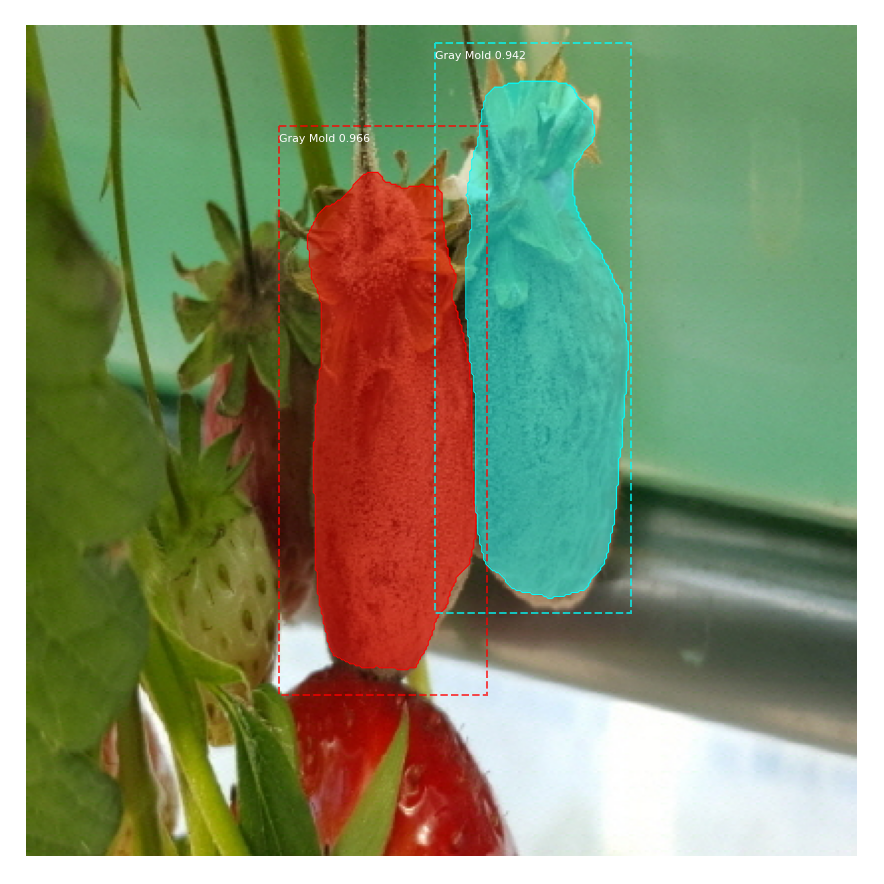

In [ ]:
# Visualize the detected objects.
mrcnn.visualize.display_instances(image=image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'], 
                                  class_names=CLASS_NAMES, 
                                  scores=r['scores'])

#### Inspeccionando el Dataset

In [ ]:
# Cargamos la configuracion para el dataset de Fresas
config = plants.PlantsConfig()
PLANT_DIR = os.path.join(ROOT_DIR, "datasets/plants")
print(PLANT_DIR)

/content/CasoPracticoIA/datasets/plants


In [ ]:
# Load dataset
dataset = plants.PlantsDataset()

dataset.load_plants(PLANT_DIR, "train")

# Se debe preparar las imagenes antes de usar el dataset
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

In [ ]:
image_ids = dataset.image_ids
print(image_ids)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55]


#### Ver muestras del dataset
Cargar y mostrar imagenes y sus mascaras

In [ ]:
dataset.class_names
dataset.class_ids

array([0, 1, 2, 3, 4, 5, 6, 7])

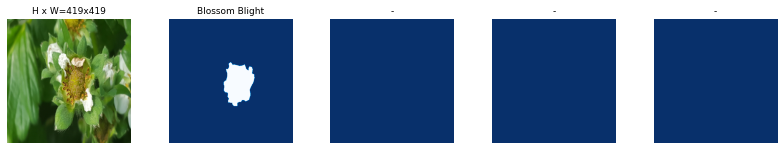

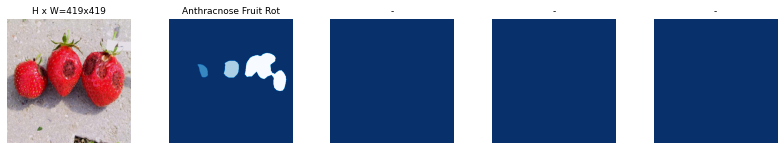

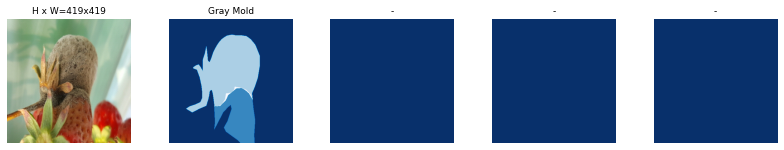

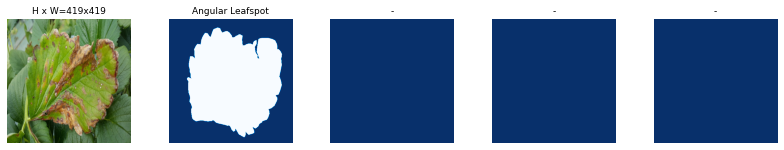

In [ ]:
# Load and display random samples
image_ids = np.random.choice(dataset.image_ids, 4)
for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

#### Cuadros Delimitadores (Bounding Boxes)
Se calculan los **Bounding Boxes** empleando las mascaras en vez de emplear las coordenadas que vienen en las anotaciones del dataset.
Ayudando a manipular los BB de manera consistente sin importar la fuente del dataset.

Tambien se consigue una mayor eficiencia a la hora de redimensionar, rotar o cortar imagenes ya que solo generamos los Bounding boxes a partir de las actualizaciones de las mascaras en vez de calcular las tranformadas del cuadro delimitador(Bounding Box) por cada transformacion que se aplique a la imagen.

image_id  31 /content/CasoPracticoIA/datasets/plants/train/powdery_mildew_leaf3.jpg
image                    shape: (419, 419, 3)         min:    0.00000  max:  255.00000  uint8
mask                     shape: (419, 419, 1)         min:    0.00000  max:    1.00000  uint8
class_ids                shape: (1,)                  min:    7.00000  max:    7.00000  int64
bbox                     shape: (1, 4)                min:  143.00000  max:  314.00000  int32


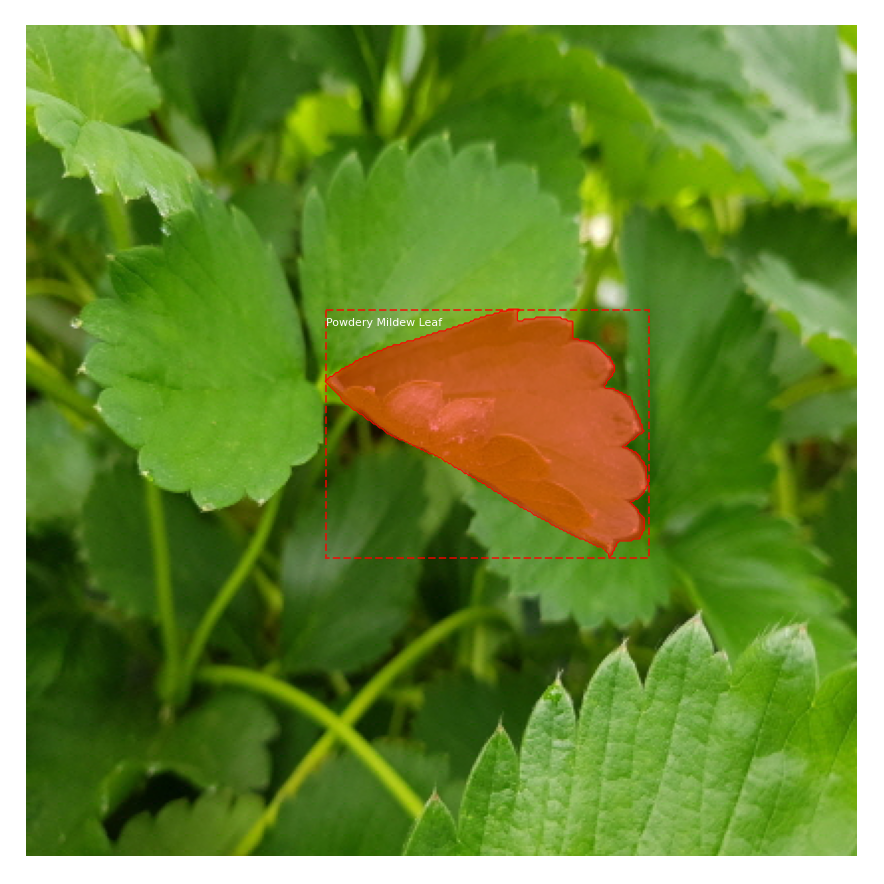

In [ ]:
# Load random image and mask.
image_id = random.choice(dataset.image_ids)
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, dataset.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

#### Redimensionar Imagenes
Para poder emplear multiples imagenes por **Batch** (lote), las imagenes se redimensionan a un tamanio fijo en este caso (1024x1024).
para que proporcion de imagen se preserve (aspect ratio), empleamos relleno (padding) hasta conseguir una imagen cuadrada.

image_id:  8 /content/CasoPracticoIA/datasets/plants/train/anthracnose_fruit_rot13.jpg
Original shape:  (419, 419, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  uint8
class_ids                shape: (1,)                  min:    2.00000  max:    2.00000  int64
bbox                     shape: (1, 4)                min:   26.00000  max:  919.00000  int32


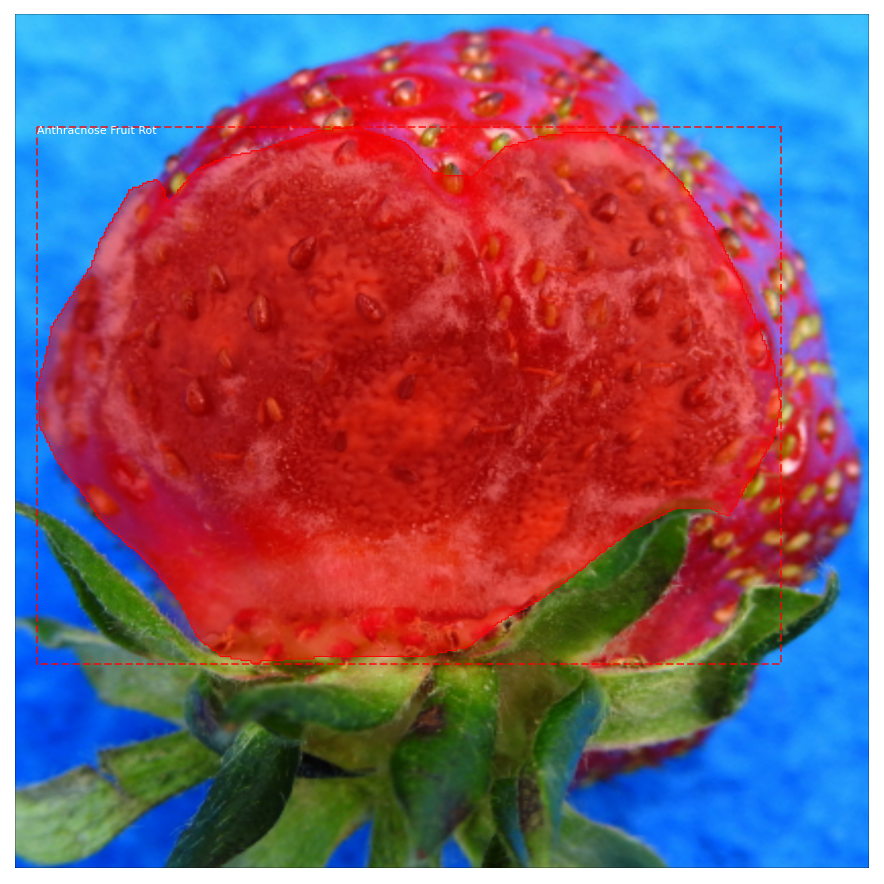

In [ ]:
# Load random image and mask.
image_id = np.random.choice(dataset.image_ids, 1)[0]
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
original_shape = image.shape
# Resize
image, window, scale, padding, _ = utils.resize_image(
    image, 
    min_dim=config.IMAGE_MIN_DIM, 
    max_dim=config.IMAGE_MAX_DIM,
    mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id: ", image_id, dataset.image_reference(image_id))
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

#### Mini Masks
las Mascaras binarias que se crean por instancia pueden llegar a ocupar mucho espacio en memoria.
Por ejemplo, si se entrena con imagenes 1024x1024 la mascara de una sola instancia requiere 1MB de memoria (Numpy emplea bytes para representar valores boleanos).
Si la imagen tuviese 100 instancias esto nos costaria 100MB solo para las mascaras.

Para mejorar la velocidad de entrenamiento optimizamos las mascaras de la siguiente manera:


*   Se guardan unicamente los pixeles de mascara que se encuentren dentro del bounding box, en lugar de guardar la mascara de la imagen entera. La mayoria de los objetos son pequenis comparados con el tamanio de la imagen. De esta manera se ahorra espacio al no tener que guardar un monton de ceros alrededor del objeto.
*   Reducimos el tamanio de la mascara ej.(56x56) Si el objeto es mas grande se pierde un poco de precision.
Pero la mayoria de los datasets no suelen tener anotaciones muy precisas, para la mayoria de las aplicaciones esta perdida es despreciable.El tamanio de *mini_mask* se puede modificar en la clase *config*.

A continuacion se muestran unos ejemplos para visualizar el efecto del redimensionamiento de las mascaras



image                    shape: (1024, 1024, 3)       min:    7.00000  max:  255.00000  uint8
image_meta               shape: (20,)                 min:    0.00000  max: 1024.00000  float64
class_ids                shape: (2,)                  min:    3.00000  max:    3.00000  int64
bbox                     shape: (2, 4)                min:  266.00000  max:  819.00000  int32
mask                     shape: (1024, 1024, 2)       min:    0.00000  max:    1.00000  uint8


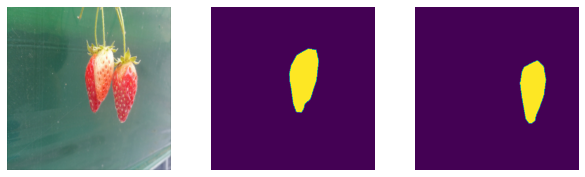

In [ ]:
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

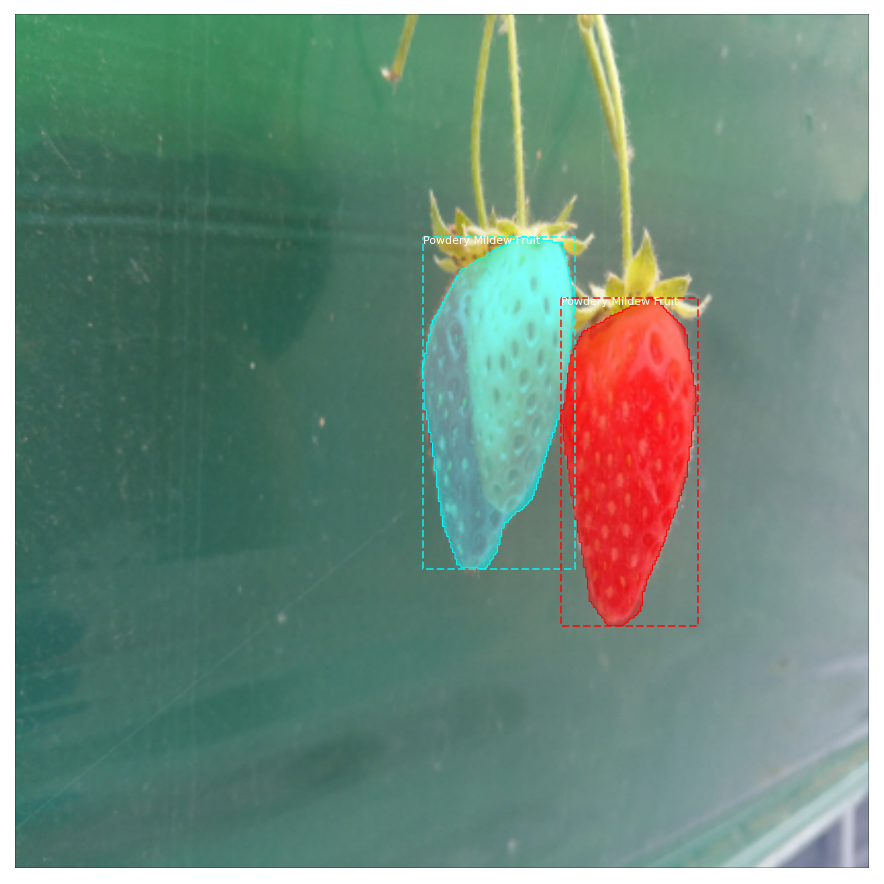

In [ ]:
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

mask                     shape: (1024, 1024, 2)       min:    0.00000  max:    1.00000  uint8


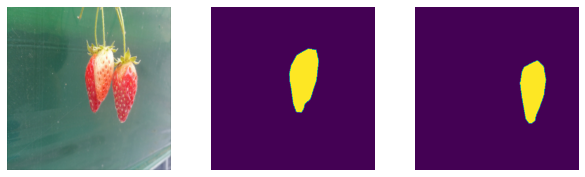

In [ ]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

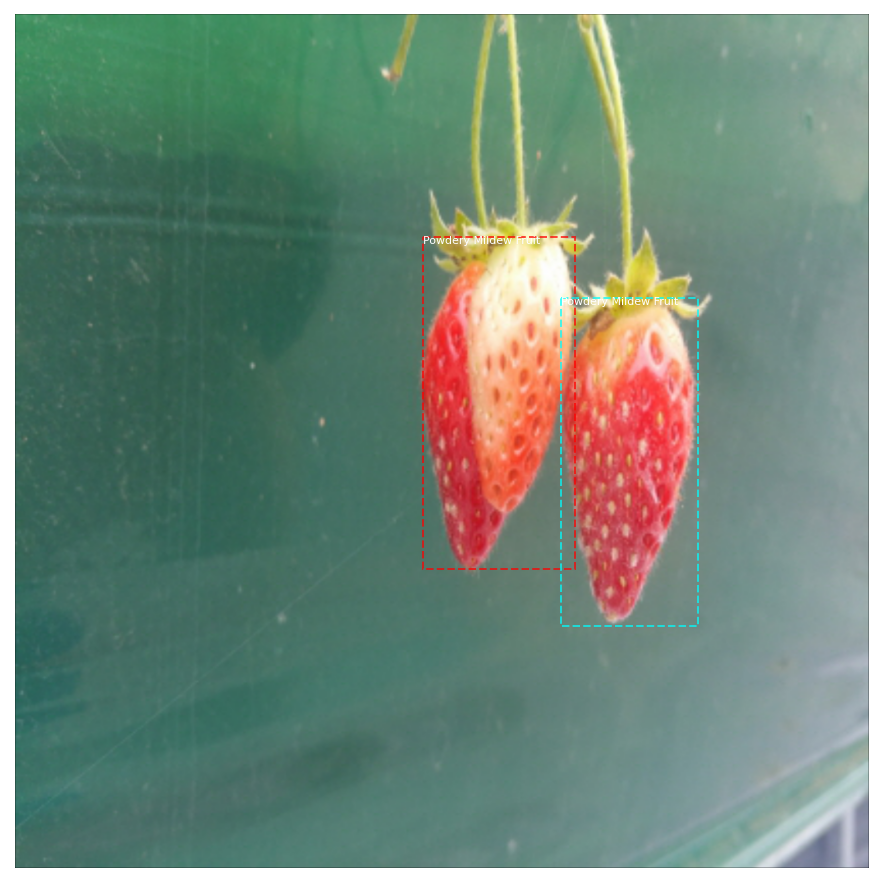

In [ ]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

#### Anchors (Anclajes)

El orden de los anclajes es importante, se deben usar en el mismo orden durante las fases de entrenamiento como en la de prediccion,y debe corresponder con el orden de la ejecucion convolucional.

Para una **FPN** (Feature Pyramid Net), los anchors se deben ordenar de manera que faciliten la correspondencia con la salida de las capas convolucionales que predicen los **anchors scores**(puntuacion de anclajes) y **shifts** (translaciones)



*   Primero se ordena por nivel de la **piramide**.Todos los anclajes del primer nivel, luego todos los del segundo nivel y asi sucesivamente.Esto facilita separar los anchors por nivel.
*   Dentro de cada nivel, ordena los anchors siguiendo la sequencia del mapeo de caracteristicas (feature map processing), normalmente una capa convolucional procesa un mapa de caracteristicas de la misma manera que leemos un libro, partiendo de esquina superior izquierda moviendose hacia la derecha fila por fila.

*   Por cada feature map cell,elije cualquier orden para los anchors de distintos ratios. Aqui emparejamos el orden de los ratios que pasamos a la funcion.

**Anchor Stride** (zancada del anclaje): En una arquitectura FPN, los **feature maps** de las primeras capas son de alta resolucion. ej. Con una imagen de entrada de 1024x1024 el feature map del primer nivel seria de 256x256, que genera unos 200K de anclajes (2562563). Estos anchors son de 32x32 pixeles y su zancada relativa a la imagen es de 4 pixeles, hay mucha superposicion.Podemos reducir la carga significativamente generando anclajes intercalando las celdas en el feature map, (una celda si otra no).por ejemplo, una zancada (stride) de 2 acortara el numero de anclajes por 4.

En esta implementacion empleamos una zancada de anclaje de 2.





In [ ]:
# Generate Anchors
backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

Count:  261888
Scales:  (32, 64, 128, 256, 512)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 196608
Anchors in Level 1: 49152
Anchors in Level 2: 12288
Anchors in Level 3: 3072
Anchors in Level 4: 768


Level 0. Anchors: 196608  Feature map Shape: [256 256]
Level 1. Anchors:  49152  Feature map Shape: [128 128]
Level 2. Anchors:  12288  Feature map Shape: [64 64]
Level 3. Anchors:   3072  Feature map Shape: [32 32]
Level 4. Anchors:    768  Feature map Shape: [16 16]


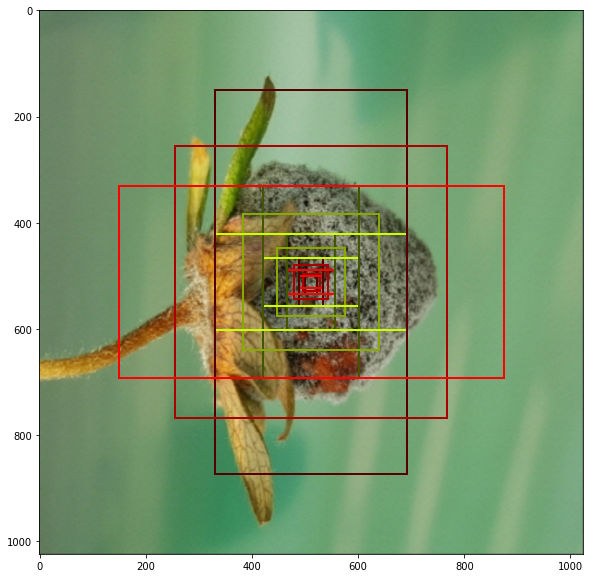

In [ ]:
## Visualize anchors of one cell at the center of the feature map of a specific level

# Load and draw random image
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, _, _, _ = modellib.load_image_gt(dataset, config, image_id)
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
levels = len(backbone_shapes)

for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level]) # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, level_anchors.shape[0], 
                                                                  backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])
    level_center = center_cell_index * anchors_per_cell 
    center_anchor = anchors_per_cell * (
        (center_cell[0] * backbone_shapes[level][1] / config.RPN_ANCHOR_STRIDE**2) \
        + center_cell[1] / config.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)

#### Inspeccionando el Modelo entrenado 

#### configuraciones

In [ ]:
config = plants.PlantsConfig()
BALLOON_DIR = os.path.join(ROOT_DIR, "datasets/plants")

In [ ]:
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        35
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                20
IMAGE_MIN_DIM                  1024
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

#### Cargar Dataset de Validacion

In [ ]:
# Load validation dataset
dataset = plants.PlantsDataset()
dataset.load_plants(PLANT_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

#### Cargar Modelo

In [ ]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

In [ ]:
# load the last model you trained
weights_path = model.find_last()

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  /content/CasoPracticoIA/logs/plants20220527T0713/mask_rcnn_plants_0010.h5
Re-starting from epoch 10


#### Ejecutar Deteccion

image ID: sickness.gray_mold390.jpg (30) /content/CasoPracticoIA/datasets/plants/val/gray_mold390.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  130.30000  float64
image_metas              shape: (1, 20)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


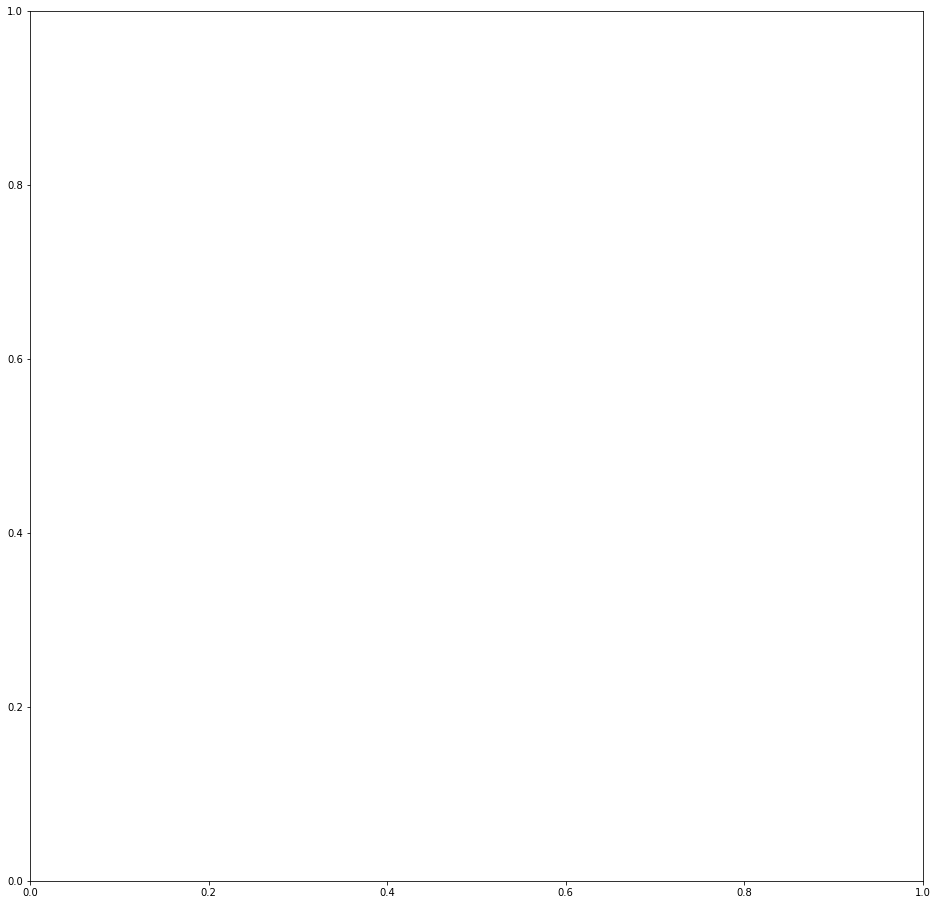

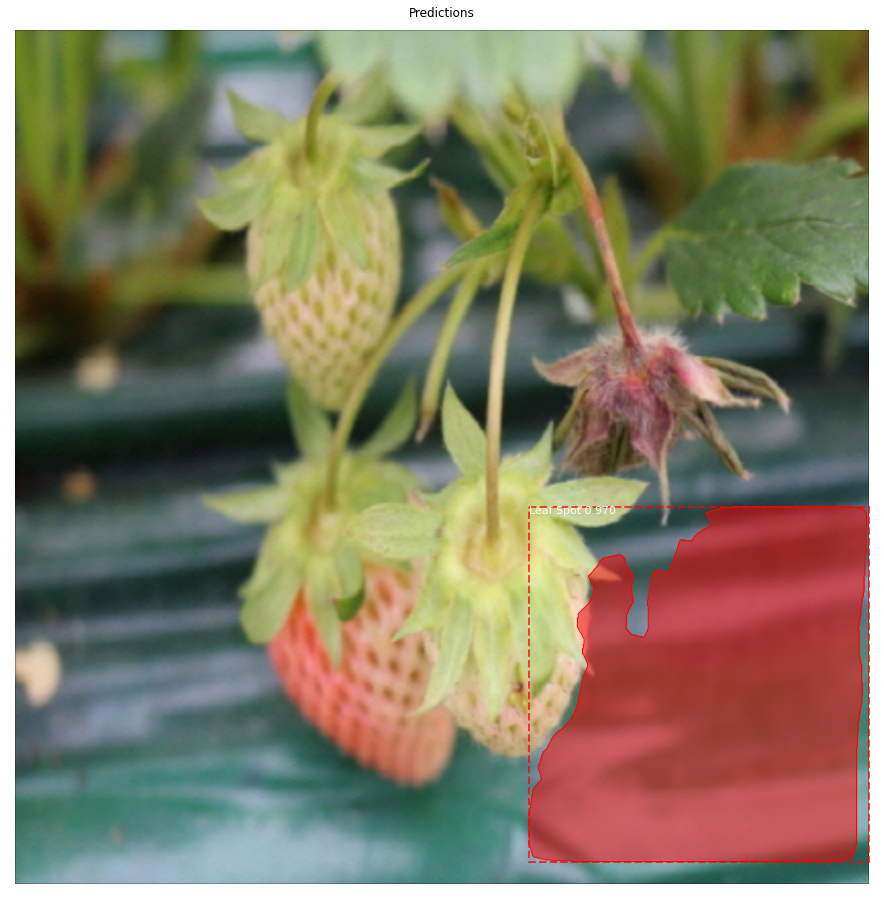

gt_class_id              shape: (1,)                  min:    5.00000  max:    5.00000  int64
gt_bbox                  shape: (1, 4)                min:  315.00000  max:  934.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  uint8


In [ ]:
image_id = random.choice(dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))

# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], figAx=None,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

#### Color Splash 
Ejemplo en el que solo se conservan los colores en el area delimitada por la mascara, a los demas pixeles se les asinga una escala de grises.

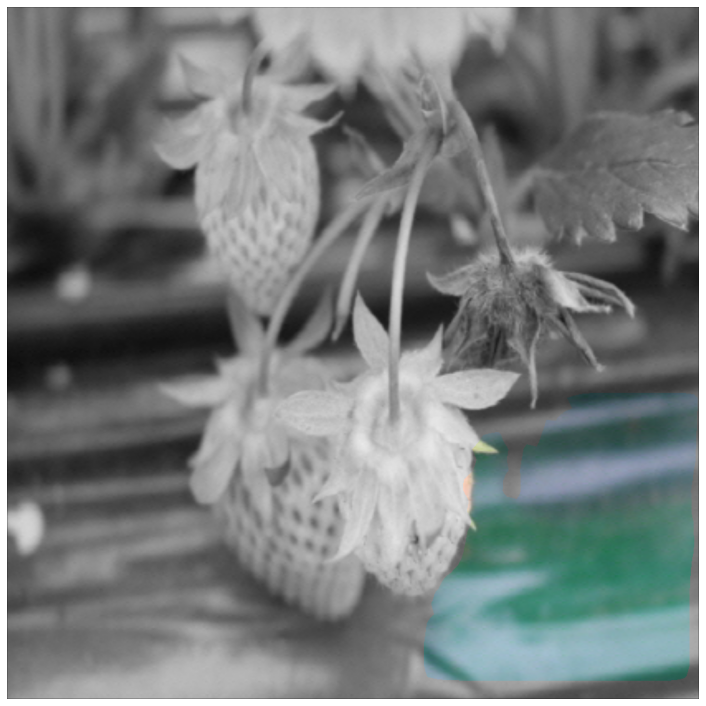

In [ ]:
splash = plants.color_splash(image, r['masks'])
display_images([splash], cols=1)

### Prediccion Paso a Paso

## Fase 1: Region Proposal Network (Red de Propuesta de Regiones)

La RPN(Region Proposal Network) ejecuta un clasificador binario ligero(computacionalmente) sobre muchas cajas (anchors) de la imagen y devuelve punticiones de tipo [objeto/no-objeto]. Anchors con una alta puntuacion en *objetividad* (Anchors positivos) pasan a la fase 2 para ser clasificados.

A menudo los anchors positivos no cubren por completo al objeto. es por esto que RPN regresiona un afinado (un valor delta en posicion y tamanio) para redimensionar y translar un poco para corregir los limites del objeto.

### 1.a Dianas(Targets) del RPN 

Los Targets del RPN son los valores para la RPN. Para generar dianas, empezamos con una cuadricula de anchors con distintas escalas que cubran por completo la imagen, despues calculamos el **IoU**(Intersection over Union) = area de superposicion/area de union, entre los anchors y el objeto **ground truth** (information that is known to be real or true, provided by direct observation and mesurment, empirical evidence as opposed to information provided by inference)
De este calculo se establecen

1.   Anchors positivos: IoU >= 0.7
2.   Anchors negativos: IoU <= 0.3
3.   Anchors neutros: IoU >= 0.3 AND IoU < 0.7 (Se excluyen del entrenamiento)

Para entrenar el RPN regresor, es necesario calcular la translacion(shift) y el redimensionamiento necesario para cubrir por completo el objeto 'veraz' con el anclaje.



In [ ]:
# Generaramos las "dianas" de entrenamiento para la Red de Proposicion de Regiones 
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Aplicamos el afinado con deltas a los anchors positivos
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )


target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -0.83984  max:    0.97308  float64
positive_anchors         shape: (2, 4)                min:  320.00000  max:  928.00000  float64
negative_anchors         shape: (254, 4)              min:  -90.50967  max: 1173.01934  float64
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (2, 4)                min:  315.00000  max:  934.00000  float32


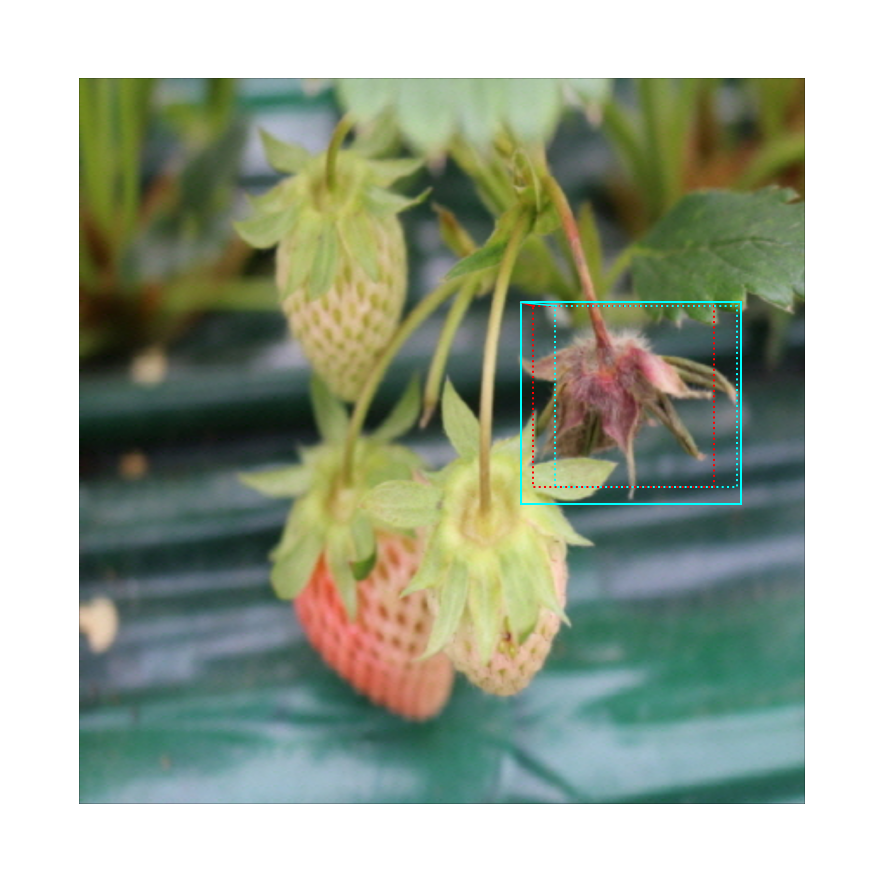

In [ ]:
# Mostrar anchors positivos antes del afinado (punteada)
# y despues del afinado (solida).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

### Predicciones de la Red de Proposicion de Regiones (RPN)
Aqui ejecutamos el grafo de la RPN y mostramos sus predicciones.

In [ ]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.35390  max:    1.29134  float32
refined_anchors          shape: (1, 6000, 4)          min:  -98.66246  max:  100.46725  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (298,)                min:    0.00000  max: 5936.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


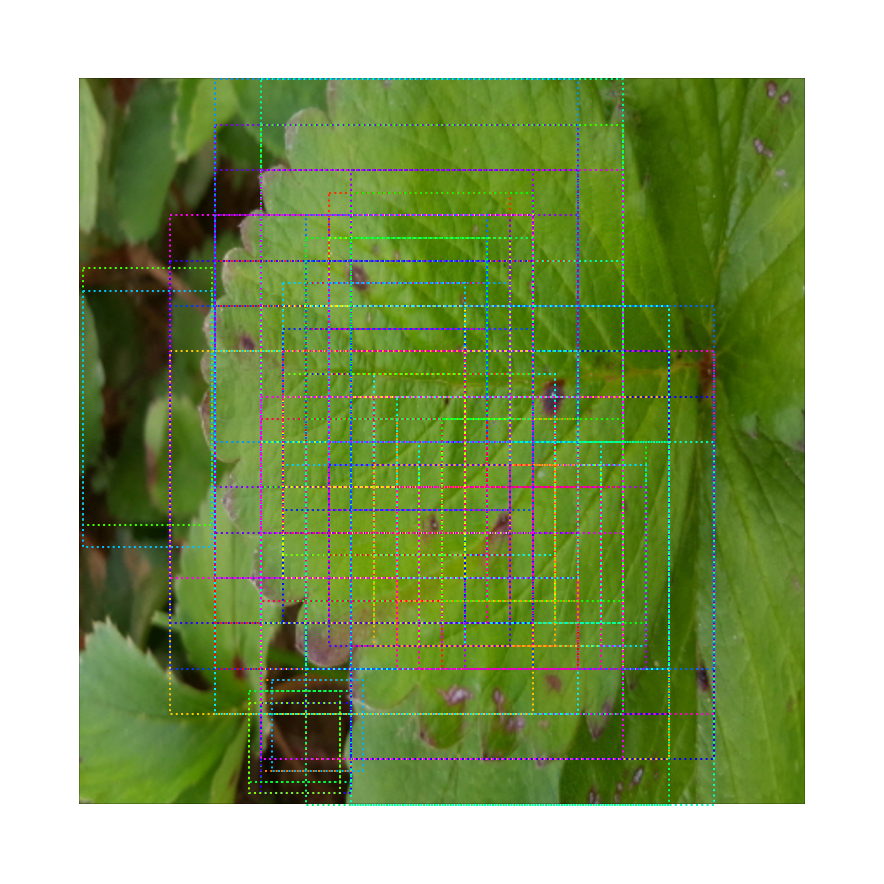

In [ ]:
# Muestra los achors con mejor puntuacion (antes de afinar)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

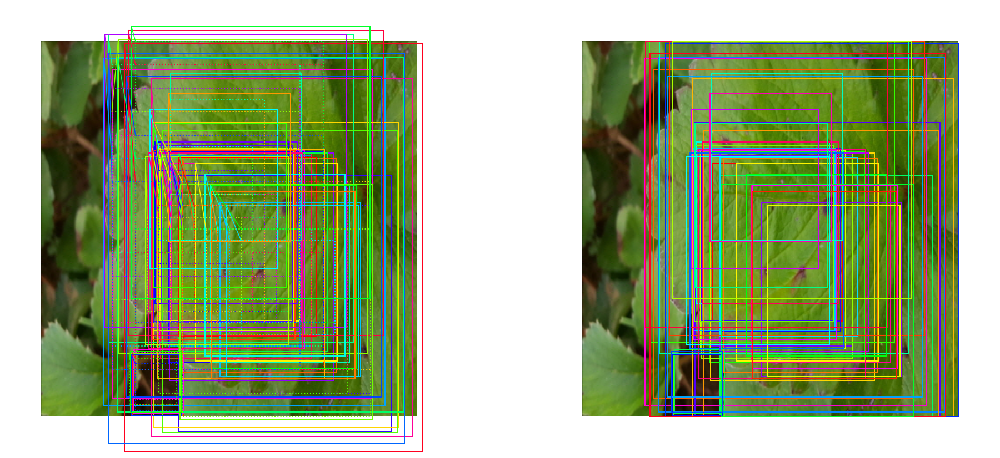

In [ ]:
# Muestra top anchors con afinado. despues ajustandose a los bordes
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

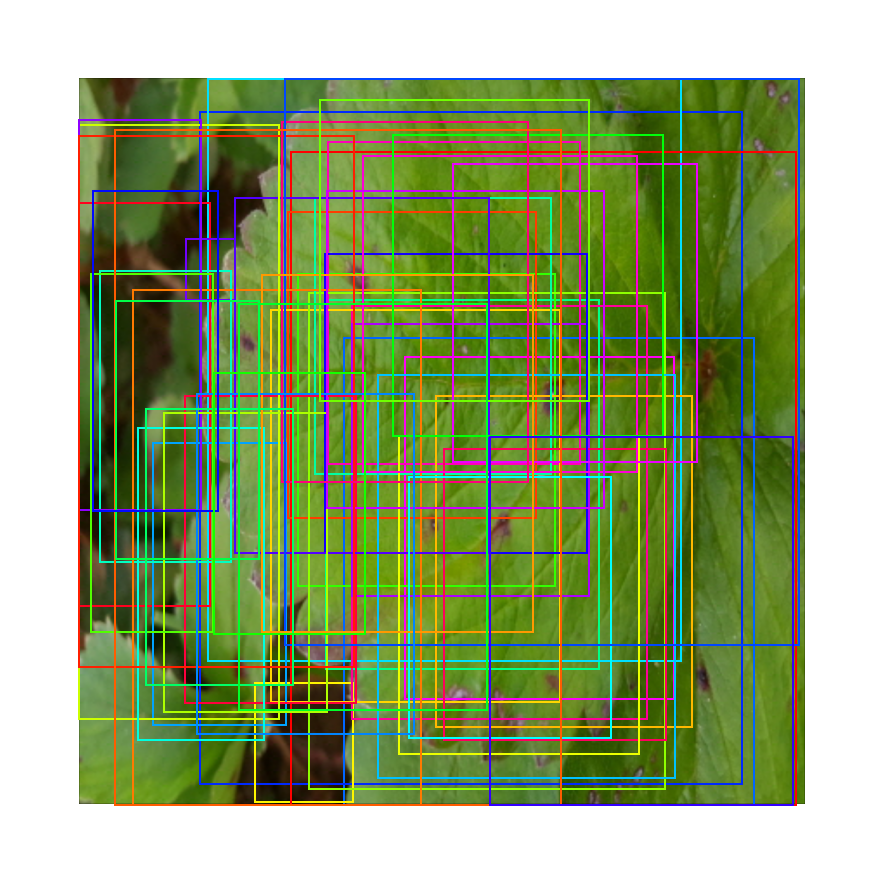

In [ ]:
# Muestra anchors afinados despues de emplear non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

## Fase 2: Clasificacion de Propuestas
Esta fase recibe las propuestas de regiones de la RPN y las clasifica.

### 2.a Clasificacion de Propuestas

Ejecutamos las cabezas de de clasificacion sobre las proposiciones para generar probablidades de clase y regresiones de cuadros delimitadores (bounding boxes)

In [ ]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 8)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 8, 4)       min:   -4.88457  max:    3.80654  float32
masks                    shape: (1, 35, 28, 28, 8)    min:    0.00001  max:    1.00000  float32
detections               shape: (1, 35, 6)            min:    0.00000  max:    1.00000  float32


1 detections: ['Angular Leafspot']


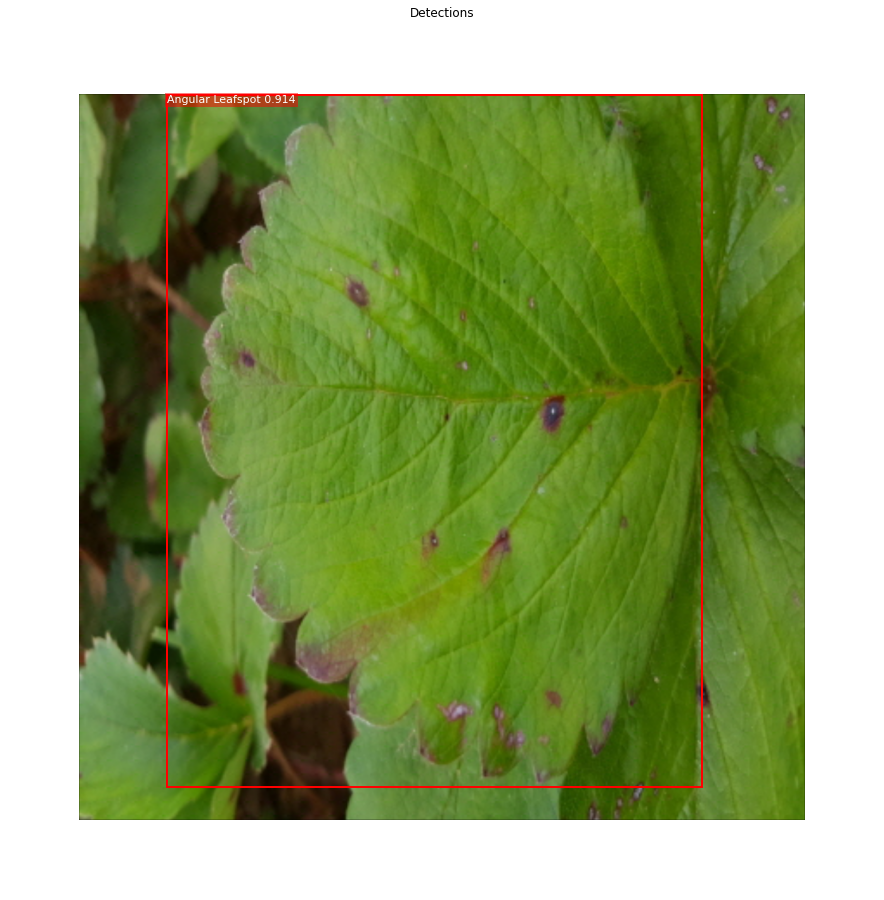

In [ ]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Deteccion paso a paso 
Aqui profundizamos en el proceso de procesamiento de las detecciones

In [ ]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

311 Valid proposals out of 1000
21 Positive ROIs
[('Angular Leafspot', 17), ('BG', 979), ('Leaf Spot', 4)]


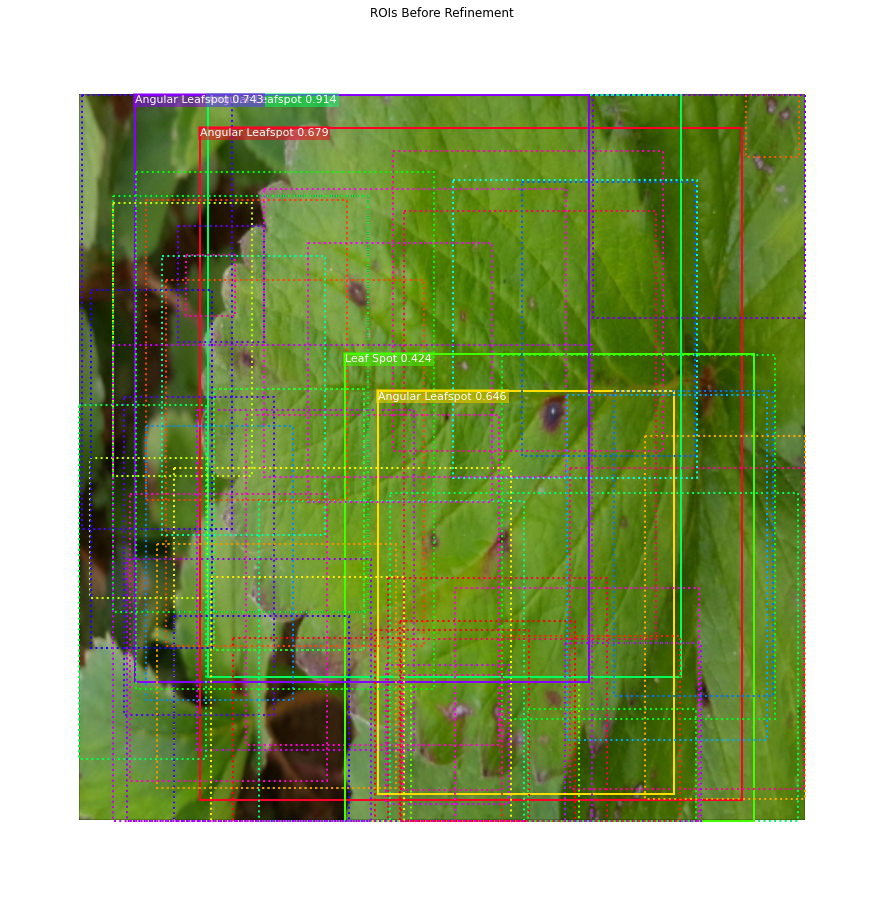

In [ ]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

### Aplicamos Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -2.39500  max:    3.17704  float32
refined_proposals        shape: (1000, 4)             min: -124.00000  max: 1148.00000  int32


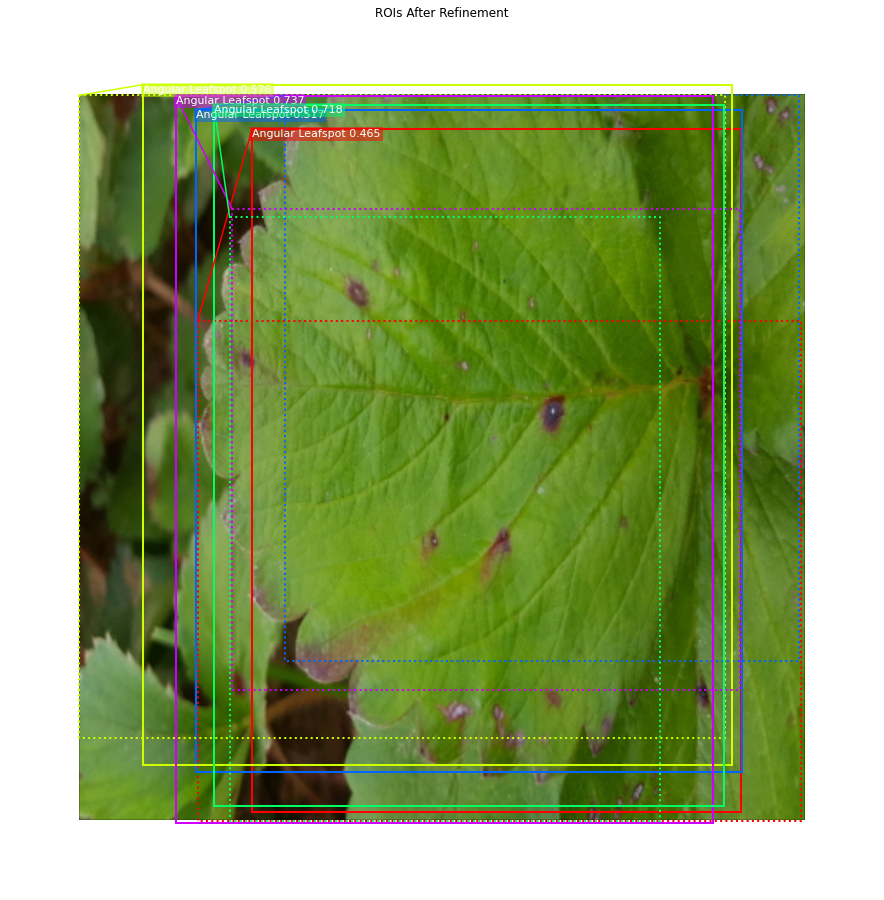

In [ ]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

### Filtramos Detecciones de baja confianza

In [ ]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 21 detections:
[  0   2   5   7  14  16  39  40  56  57  64  73 125 144 146 153 157 204
 208 215 296]


In [ ]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.9 confidence. Keep 1:
[5]


### Non-Max Suppression por Clase


In [ ]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

Angular Leafspot      : [5] -> [5]

Kept after per-class NMS: 1
[5]


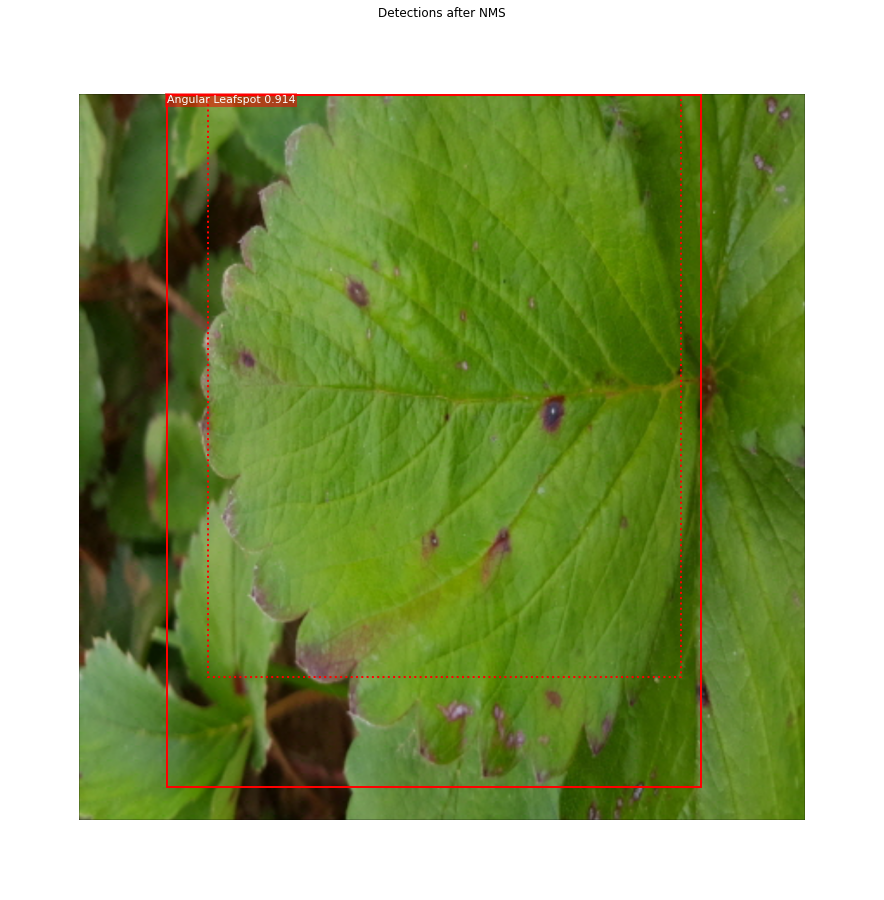

In [ ]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Fase 3: Generacion de Mascaras
Esta fase recopila las detecciones (bounding boxes refinadas y las IDs de clase) de la capa anterior y ejecuta la "cabeza" generadora de mascaras  para generar mascaras de segmentacion para cada instancia.

### 3.a Dianas de las Mascaras
Estas son las dianas(Targets) para la rama de las mascaras

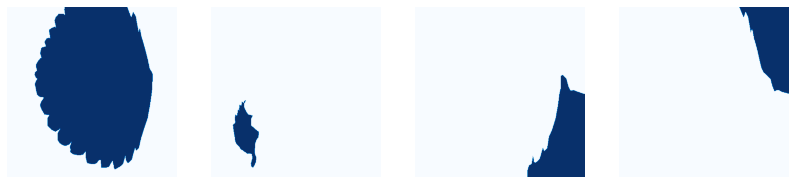

In [ ]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

### 3.b Mascaras Predecidas

In [ ]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 35, 6)            min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 35, 28, 28, 8)    min:    0.00001  max:    1.00000  float32
1 detections: ['Angular Leafspot']


In [ ]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (1, 28, 28)           min:    0.00013  max:    1.00000  float32
det_masks                shape: (1, 1024, 1024)       min:    0.00000  max:    1.00000  bool


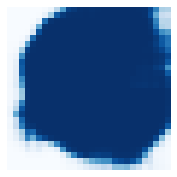

In [ ]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

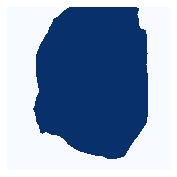

In [ ]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

## Visualizar Activaciones 
En algunos casos es conveniente observar las salidas de las distintas capas y visualizarlas para descubrir problemas o patrones extranios.

In [ ]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 1024, 1024, 3)    min: -121.70000  max:   98.10000  float32
res2c_out                shape: (1, 256, 256, 256)    min:    0.00000  max:   19.94784  float32
res3c_out                shape: (1, 128, 128, 512)    min:    0.00000  max:   29.57760  float32
res4w_out                shape: (1, 64, 64, 1024)     min:    0.00000  max:   60.11406  float32
rpn_bbox                 shape: (1, 261888, 4)        min:   -5.99190  max:  139.96877  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


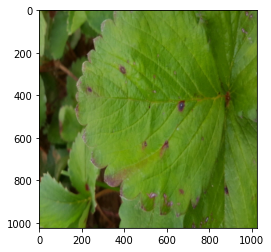

In [ ]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

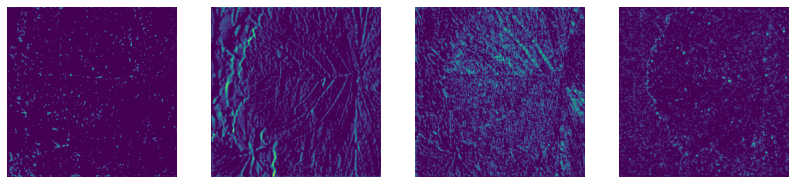

In [ ]:
# Backbone feature map
display_images(np.transpose(activations["res2c_out"][0,:,:,:4], [2, 0, 1]), cols=4)